# Ames House Price Prediction — Exploratory Data Analysis

This notebook performs a clean and structured EDA for the Ames House Price dataset.

The analysis is organized by feature type:

1. Setup and data loading  
2. Dataset overview  
3. Global missing value analysis  
4. Target variable analysis  
5. Feature group overview  
6. Numerical feature univariate analysis  
7. Categorical feature univariate analysis  
8. Final EDA decision summary  
9. Next step plan

## 0. Notebook Objective

The goal of this notebook is to understand the dataset before preprocessing and modeling.

Main focus:

- Identify missing values and their possible meaning
- Understand feature distributions
- Detect skewness, sparse patterns, rare categories, and dominance
- Decide which features need transformation, encoding, or careful handling later
- Keep this notebook clean, reproducible, and easy to follow

## 1. Setup and Data Loading

This section imports required libraries, sets plotting options, and loads the train/test datasets.

In [6]:
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 120)
pd.set_option("display.float_format", lambda x: f"{x:.4f}")

sns.set_theme(style="whitegrid")

RANDOM_STATE = 42

### 1.1 Load Dataset

Update `DATA_DIR` if your files are in a different folder.

Expected files:

- `train.csv`
- `test.csv`

In [7]:



train_path = r"C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Ames-Price-Regression\Data\train.csv"
test_path = r"C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Ames-Price-Regression\Data\test.csv"

train = pd.read_csv(train_path)
test = pd.read_csv(test_path)

print(f"Train path: {train_path}")
print(f"Test path: {test_path}")
print(f"Train shape: {train.shape}")
print(f"Test shape: {test.shape}")

Train path: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Ames-Price-Regression\Data\train.csv
Test path: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Ames-Price-Regression\Data\test.csv
Train shape: (1460, 81)
Test shape: (1459, 80)


### 1.2 Feature Groups

The feature groups are imported from `feature_groups.py` if available.

If the file is not available, the notebook uses an internal fallback definition.

In [8]:
try:
    from feature_groups import (
        target_feature,
        id_feature,
        nominal_categorical,
        ordinal_categorical,
        binary_categorical,
        categorical_features,
        continuous_numeric,
        count_numeric,
        ordinal_numeric,
        temporal_features,
        numeric_features,
        input_features,
        drop_features,
        all_feature_groups,
    )
    print("Feature groups loaded from feature_groups.py")

except Exception as e:
    print("Could not import feature_groups.py. Using internal fallback feature groups.")
    print(f"Import issue: {e}")

    target_feature = "SalePrice"
    id_feature = "Id"

    nominal_categorical = [
        "MSSubClass", "MSZoning", "Alley", "LandContour", "LotConfig",
        "Neighborhood", "Condition1", "Condition2", "BldgType", "HouseStyle",
        "RoofStyle", "RoofMatl", "Exterior1st", "Exterior2nd", "MasVnrType",
        "Foundation", "Heating", "Electrical", "GarageType", "MiscFeature",
        "SaleType", "SaleCondition"
    ]

    ordinal_categorical = [
        "LotShape", "Utilities", "LandSlope", "ExterQual", "ExterCond",
        "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2",
        "HeatingQC", "KitchenQual", "Functional", "FireplaceQu", "GarageFinish",
        "GarageQual", "GarageCond", "PavedDrive", "PoolQC", "Fence"
    ]

    binary_categorical = ["Street", "CentralAir"]

    categorical_features = nominal_categorical + ordinal_categorical + binary_categorical

    continuous_numeric = [
        "LotFrontage", "LotArea", "MasVnrArea", "BsmtFinSF1", "BsmtFinSF2",
        "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "2ndFlrSF", "LowQualFinSF",
        "GrLivArea", "GarageArea", "WoodDeckSF", "OpenPorchSF",
        "EnclosedPorch", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal"
    ]

    count_numeric = [
        "BsmtFullBath", "BsmtHalfBath", "FullBath", "HalfBath",
        "BedroomAbvGr", "KitchenAbvGr", "TotRmsAbvGrd", "Fireplaces", "GarageCars"
    ]

    ordinal_numeric = ["OverallQual", "OverallCond"]

    temporal_features = ["YearBuilt", "YearRemodAdd", "GarageYrBlt", "MoSold", "YrSold"]

    numeric_features = continuous_numeric + count_numeric + ordinal_numeric + temporal_features
    input_features = categorical_features + numeric_features
    drop_features = [id_feature]

    all_feature_groups = {
        "nominal_categorical": nominal_categorical,
        "ordinal_categorical": ordinal_categorical,
        "binary_categorical": binary_categorical,
        "categorical_features": categorical_features,
        "continuous_numeric": continuous_numeric,
        "count_numeric": count_numeric,
        "ordinal_numeric": ordinal_numeric,
        "temporal_features": temporal_features,
        "numeric_features": numeric_features,
        "input_features": input_features,
        "drop_features": drop_features,
    }

feature_group_summary = pd.DataFrame({
    "feature_group": list(all_feature_groups.keys()),
    "feature_count": [len(v) for v in all_feature_groups.values()]
})

display(feature_group_summary)

Feature groups loaded from feature_groups.py


,feature_group,feature_count
0,nominal_categorical,22
1,ordinal_categorical,20
2,binary_categorical,2
3,categorical_features,44
4,continuous_numeric,19
5,count_numeric,9
6,ordinal_numeric,2
7,temporal_features,5
8,numeric_features,35
9,input_features,79


### 1.3 Helper Functions

Reusable functions for reports, plots, missing values, rare categories, and dominance checks.

In [9]:
def repeated_count(series):
    return series.duplicated(keep="first").sum()

def repeated_percentage(series):
    return repeated_count(series) / len(series) * 100

def safe_mode(series):
    mode_values = series.mode(dropna=False)
    return mode_values.iloc[0] if len(mode_values) > 0 else np.nan

def dominance_level(pct):
    if pct >= 90:
        return "Very High"
    elif pct >= 70:
        return "High"
    elif pct >= 50:
        return "Moderate"
    else:
        return "Low"

def cardinality_level(unique_count):
    if unique_count <= 3:
        return "Low"
    elif unique_count <= 10:
        return "Medium"
    else:
        return "High"

def numeric_basic_report(df, features):
    rows = []
    total_rows = len(df)

    for feature in features:
        data = df[feature]
        rows.append({
            "feature": feature,
            "data_type": data.dtype,
            "missing_value": data.isna().sum(),
            "missing_percentage": data.isna().mean() * 100,
            "unique_value": data.nunique(dropna=False),
            "repeated_value": repeated_count(data),
            "repeated_percentage": repeated_percentage(data),
            "min": data.min(),
            "max": data.max(),
            "mean": data.mean(),
            "median": data.median(),
            "std": data.std(),
            "skewness": data.skew(),
            "kurtosis": data.kurt(),
            "most_frequent_value": safe_mode(data),
            "most_frequent_percentage": data.value_counts(dropna=False).iloc[0] / total_rows * 100,
        })

    return pd.DataFrame(rows)

def categorical_basic_report(df, features):
    rows = []
    total_rows = len(df)

    for feature in features:
        series = df[feature].astype("object")
        clean_series = series.where(series.notna(), "Missing")
        value_counts = clean_series.value_counts(dropna=False)

        top_category = value_counts.index[0]
        top_count = value_counts.iloc[0]
        top_percentage = top_count / total_rows * 100
        unique_count = clean_series.nunique(dropna=False)

        rows.append({
            "feature": feature,
            "missing_value": series.isna().sum(),
            "missing_percentage": series.isna().mean() * 100,
            "unique_category": unique_count,
            "repeated_value": repeated_count(clean_series),
            "repeated_percentage": repeated_percentage(clean_series),
            "top_category": top_category,
            "top_count": top_count,
            "top_percentage": top_percentage,
            "cardinality_level": cardinality_level(unique_count),
            "dominance_level": dominance_level(top_percentage),
        })

    return pd.DataFrame(rows)

def frequency_table(df, features, include_missing=True):
    all_tables = []

    for feature in features:
        series = df[feature].astype("object")

        if include_missing:
            series = series.where(series.notna(), "Missing")

        freq = (
            series
            .value_counts(dropna=not include_missing)
            .reset_index()
        )
        freq.columns = ["category", "count"]
        freq["feature"] = feature
        freq["percentage"] = freq["count"] / len(df) * 100
        freq["cumulative_count"] = freq["count"].cumsum()
        freq["cumulative_percentage"] = freq["percentage"].cumsum()
        freq["rank"] = range(1, len(freq) + 1)

        freq = freq[
            ["feature", "rank", "category", "count", "percentage",
             "cumulative_count", "cumulative_percentage"]
        ]

        all_tables.append(freq)

    return pd.concat(all_tables, ignore_index=True)

def rare_category_report(df, features, threshold=1.0):
    freq = frequency_table(df, features, include_missing=True)
    rare = freq[freq["percentage"] < threshold].copy()
    return rare[["feature", "category", "count", "percentage"]].sort_values(
        by=["feature", "percentage"],
        ascending=[True, True]
    )

def top_category_summary(freq_table):
    return (
        freq_table
        .query("rank == 1")
        [["feature", "category", "count", "percentage"]]
        .rename(columns={
            "category": "top_category",
            "count": "top_count",
            "percentage": "top_percentage"
        })
        .sort_values(by="top_percentage", ascending=False)
    )

def missing_summary(df, features):
    result = pd.DataFrame({
        "feature": features,
        "missing_value": df[features].isna().sum().values,
        "missing_percentage": df[features].isna().sum().values / len(df) * 100
    })

    return result.sort_values(by="missing_percentage", ascending=False)

def plot_missing_bar(df, features, title):
    summary = missing_summary(df, features)
    plot_df = summary[summary["missing_value"] > 0]

    if plot_df.empty:
        print("No missing values found.")
        return

    plt.figure(figsize=(10, max(4, 0.35 * len(plot_df))))
    ax = sns.barplot(data=plot_df, x="missing_percentage", y="feature")
    plt.title(title)
    plt.xlabel("Missing Percentage (%)")
    plt.ylabel("Feature")

    for container in ax.containers:
        ax.bar_label(container, fmt="%.1f%%", fontsize=9)

    plt.tight_layout()
    plt.show()

def plot_missing_matrix(df, features, title):
    missing_cols = [col for col in features if df[col].isna().sum() > 0]

    if len(missing_cols) == 0:
        print("No missing columns found.")
        return

    plt.figure(figsize=(10, max(4, 0.25 * len(missing_cols))))
    sns.heatmap(df[missing_cols].isna(), cbar=False, yticklabels=False)
    plt.title(title)
    plt.xlabel("Features")
    plt.ylabel("Rows")
    plt.tight_layout()
    plt.show()

def plot_missing_corr(df, features, title):
    missing_cols = [col for col in features if df[col].isna().sum() > 0]

    if len(missing_cols) < 2:
        print("At least two missing columns are needed for missingness correlation.")
        return

    miss = df[missing_cols].isna().astype(int)
    valid_cols = [col for col in miss.columns if miss[col].nunique() > 1]

    if len(valid_cols) < 2:
        print("Not enough variation in missingness for correlation.")
        return

    plt.figure(figsize=(10, 7))
    sns.heatmap(miss[valid_cols].corr(), annot=True, cmap="coolwarm", center=0, fmt=".2f")
    plt.title(title)
    plt.tight_layout()
    plt.show()

def plot_category_percentages(df, features, title_prefix):
    for feature in features:
        series = df[feature].astype("object").where(df[feature].notna(), "Missing")
        plot_df = series.value_counts(dropna=False).reset_index()
        plot_df.columns = ["category", "count"]
        plot_df["percentage"] = plot_df["count"] / len(df) * 100

        plt.figure(figsize=(10, max(4, 0.35 * len(plot_df))))
        ax = sns.barplot(data=plot_df, x="percentage", y="category")
        plt.title(f"{title_prefix} - {feature}")
        plt.xlabel("Percentage (%)")
        plt.ylabel(feature)

        for container in ax.containers:
            ax.bar_label(container, fmt="%.1f%%", fontsize=8)

        plt.tight_layout()
        plt.show()

## 2. Dataset Overview

This section gives a quick overview of dataset shape, columns, duplicate rows, and sample records.

In [10]:
overview = pd.DataFrame({
    "dataset": ["train", "test"],
    "rows": [train.shape[0], test.shape[0]],
    "columns": [train.shape[1], test.shape[1]],
    "duplicate_rows": [train.duplicated().sum(), test.duplicated().sum()],
})

display(overview)
display(train.head())

,dataset,rows,columns,duplicate_rows
0,train,1460,81,0
1,test,1459,80,0


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### 2.1 Data Type Summary

In [11]:
dtype_summary = (
    train.dtypes
    .astype(str)
    .value_counts()
    .reset_index()
)

dtype_summary.columns = ["data_type", "feature_count"]
display(dtype_summary)

,data_type,feature_count
0,object,43
1,int64,35
2,float64,3


## 3. Global Missing Value Analysis

This section checks missing values across the full training dataset.

In [12]:
global_missing = (
    train.isna().sum()
    .to_frame("missing_value")
)

global_missing["missing_percentage"] = global_missing["missing_value"] / len(train) * 100
global_missing = global_missing[global_missing["missing_value"] > 0].sort_values(
    by="missing_percentage",
    ascending=False
)

display(global_missing.round(2))

,missing_value,missing_percentage
PoolQC,1453,99.5200
MiscFeature,1406,96.3000
Alley,1369,93.7700
Fence,1179,80.7500
MasVnrType,872,59.7300
FireplaceQu,690,47.2600
LotFrontage,259,17.7400
GarageType,81,5.5500
GarageYrBlt,81,5.5500
GarageFinish,81,5.5500


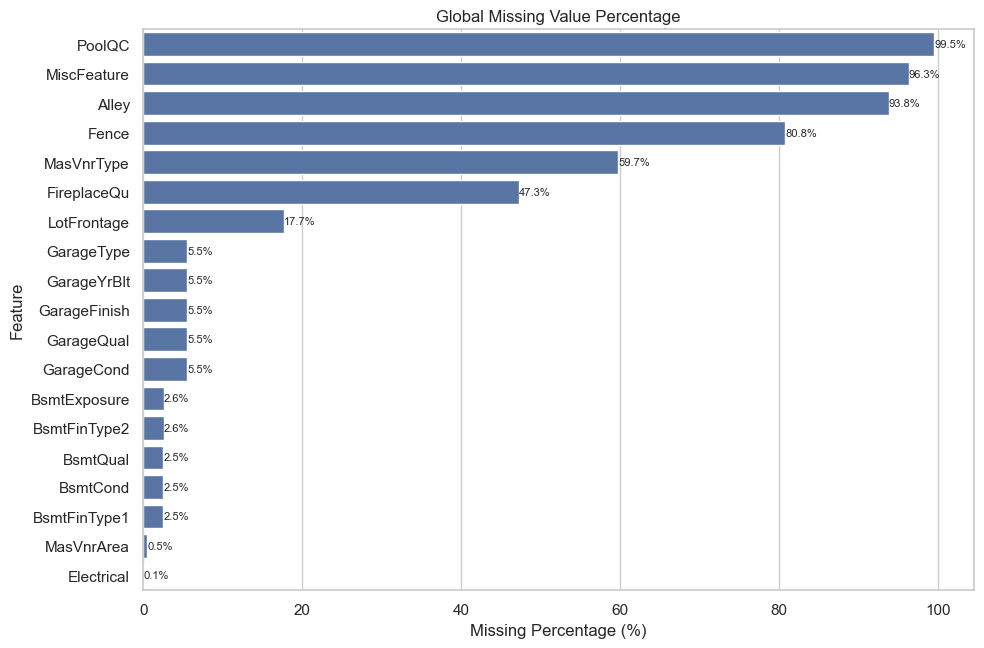

In [13]:
if global_missing.empty:
    print("No missing values in train data.")
else:
    plt.figure(figsize=(10, max(5, 0.35 * len(global_missing))))
    ax = sns.barplot(
        data=global_missing.reset_index().rename(columns={"index": "feature"}),
        x="missing_percentage",
        y="feature"
    )
    plt.title("Global Missing Value Percentage")
    plt.xlabel("Missing Percentage (%)")
    plt.ylabel("Feature")

    for container in ax.containers:
        ax.bar_label(container, fmt="%.1f%%", fontsize=8)

    plt.tight_layout()
    plt.show()

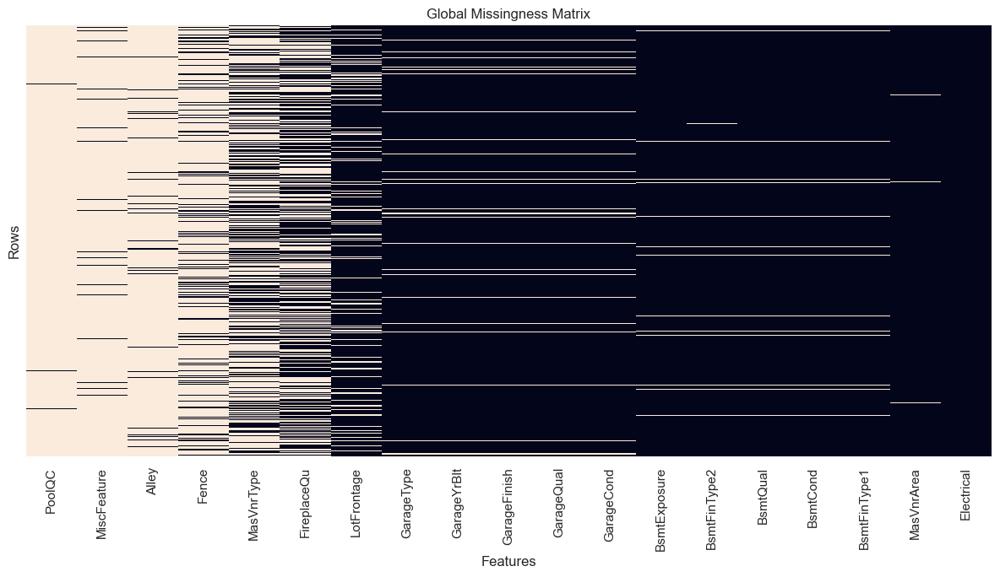

In [14]:
missing_cols = global_missing.index.tolist()

if len(missing_cols) == 0:
    print("No missing columns found.")
else:
    plt.figure(figsize=(12, 7))
    sns.heatmap(train[missing_cols].isna(), cbar=False, yticklabels=False)
    plt.title("Global Missingness Matrix")
    plt.xlabel("Features")
    plt.ylabel("Rows")
    plt.tight_layout()
    plt.show()

### 3.1 Global Missing Value Note

Many missing values in this dataset are meaningful.

Examples:

- `GarageType`, `GarageFinish`, `GarageQual`, `GarageCond`, `GarageYrBlt` can be missing because the house has no garage.
- `BsmtQual`, `BsmtCond`, `BsmtExposure`, `BsmtFinType1`, `BsmtFinType2` can be missing because the house has no basement.
- `PoolQC` can be missing because the house has no pool.
- `Alley`, `Fence`, and `MiscFeature` missing values can also indicate absence of that facility.

Therefore, missing values should not be blindly filled with mean, median, or mode.

## 4. Target Variable Analysis

The target variable is `SalePrice`.

This section analyzes the target distribution, skewness, outliers, and log transformation.

In [15]:
target = target_feature

target_basic_report = pd.DataFrame({
    "feature": [target],
    "data_type": [train[target].dtype],
    "missing_value": [train[target].isna().sum()],
    "missing_percentage": [train[target].isna().mean() * 100],
    "unique_value": [train[target].nunique(dropna=False)],
    "repeated_value": [repeated_count(train[target])],
    "repeated_percentage": [repeated_percentage(train[target])],
    "min": [train[target].min()],
    "max": [train[target].max()],
    "mean": [train[target].mean()],
    "median": [train[target].median()],
    "std": [train[target].std()],
    "skewness": [train[target].skew()],
    "kurtosis": [train[target].kurt()],
})

display(target_basic_report.round(4))

,feature,data_type,missing_value,missing_percentage,unique_value,repeated_value,repeated_percentage,min,max,mean,median,std,skewness,kurtosis
0,SalePrice,int64,0,0.0000,663,797,54.5890,34900,755000,180921.1959,163000.0000,79442.5029,1.8829,6.5363


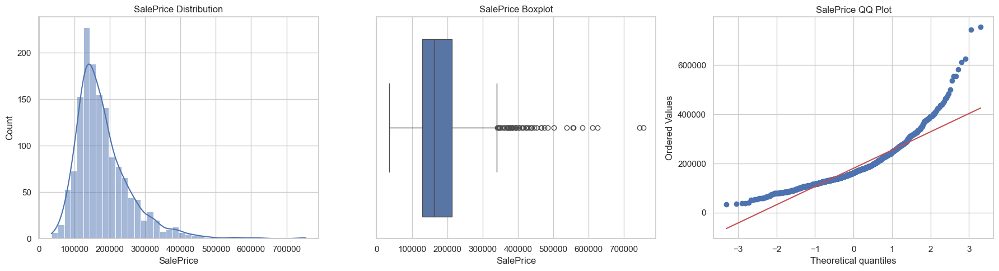

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.histplot(train[target], kde=True, bins=40, ax=axes[0])
axes[0].set_title("SalePrice Distribution")

sns.boxplot(x=train[target], ax=axes[1])
axes[1].set_title("SalePrice Boxplot")

stats.probplot(train[target], dist="norm", plot=axes[2])
axes[2].set_title("SalePrice QQ Plot")

plt.tight_layout()
plt.show()

### 4.1 Target Outlier Check

IQR is used only to summarize possible extreme target values.

This does not mean these rows should be removed automatically.

In [17]:
q1 = train[target].quantile(0.25)
q3 = train[target].quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

target_outlier_count = ((train[target] < lower_bound) | (train[target] > upper_bound)).sum()

target_outlier_summary = pd.DataFrame({
    "feature": [target],
    "q1": [q1],
    "q3": [q3],
    "iqr": [iqr],
    "lower_bound": [lower_bound],
    "upper_bound": [upper_bound],
    "outlier_count": [target_outlier_count],
    "outlier_percentage": [target_outlier_count / len(train) * 100]
})

display(target_outlier_summary.round(4))

,feature,q1,q3,iqr,lower_bound,upper_bound,outlier_count,outlier_percentage
0,SalePrice,129975.0000,214000.0000,84025.0000,3937.5000,340037.5000,61,4.1781


### 4.2 Target Log Transformation Check

`SalePrice` is usually right-skewed.  
`log1p(SalePrice)` is checked to see whether the distribution becomes more normal-like.

,version,skewness,kurtosis,mean,median
0,Original SalePrice,1.8829,6.5363,180921.1959,163000.0000
1,log1p(SalePrice),0.1213,0.8095,12.0241,12.0015


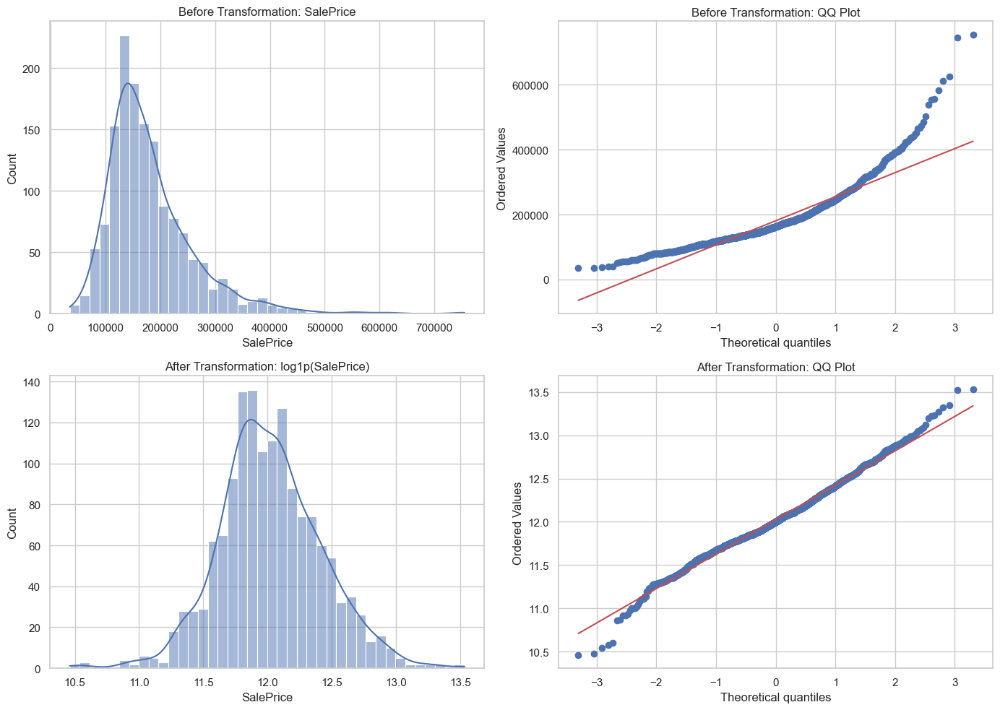

In [18]:
saleprice_log = np.log1p(train[target])

target_transform_summary = pd.DataFrame({
    "version": ["Original SalePrice", "log1p(SalePrice)"],
    "skewness": [train[target].skew(), saleprice_log.skew()],
    "kurtosis": [train[target].kurt(), saleprice_log.kurt()],
    "mean": [train[target].mean(), saleprice_log.mean()],
    "median": [train[target].median(), saleprice_log.median()],
})

display(target_transform_summary.round(4))

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

sns.histplot(train[target], kde=True, bins=40, ax=axes[0, 0])
axes[0, 0].set_title("Before Transformation: SalePrice")

stats.probplot(train[target], dist="norm", plot=axes[0, 1])
axes[0, 1].set_title("Before Transformation: QQ Plot")

sns.histplot(saleprice_log, kde=True, bins=40, ax=axes[1, 0])
axes[1, 0].set_title("After Transformation: log1p(SalePrice)")

stats.probplot(saleprice_log, dist="norm", plot=axes[1, 1])
axes[1, 1].set_title("After Transformation: QQ Plot")

plt.tight_layout()
plt.show()

### 4.3 Target Decision

- `SalePrice` has no missing values.
- The original target is right-skewed.
- `log1p(SalePrice)` improves the distribution shape.
- Target outliers should not be removed blindly because expensive houses may be valid observations.
- Final target transformation should be validated during model training.

## 5. Feature Group Overview

This section summarizes all feature groups used in this notebook.

In [19]:
feature_group_summary = pd.DataFrame({
    "feature_group": list(all_feature_groups.keys()),
    "feature_count": [len(v) for v in all_feature_groups.values()],
    "features": [", ".join(v) for v in all_feature_groups.values()]
})

display(feature_group_summary)

,feature_group,feature_count,features
0,nominal_categorical,22,"MSSubClass, MSZoning, Alley, LandContour, LotC..."
1,ordinal_categorical,20,"LotShape, Utilities, LandSlope, ExterQual, Ext..."
2,binary_categorical,2,"Street, CentralAir"
3,categorical_features,44,"MSSubClass, MSZoning, Alley, LandContour, LotC..."
4,continuous_numeric,19,"LotFrontage, LotArea, MasVnrArea, BsmtFinSF1, ..."
5,count_numeric,9,"BsmtFullBath, BsmtHalfBath, FullBath, HalfBath..."
6,ordinal_numeric,2,"OverallQual, OverallCond"
7,temporal_features,5,"YearBuilt, YearRemodAdd, GarageYrBlt, MoSold, ..."
8,numeric_features,35,"LotFrontage, LotArea, MasVnrArea, BsmtFinSF1, ..."
9,input_features,79,"MSSubClass, MSZoning, Alley, LandContour, LotC..."


## 6. Numerical Feature Univariate Analysis

This section analyzes numeric features only.

Subsections:

- 6.1 Continuous numerical features
- 6.2 Count numerical features
- 6.3 Ordinal numerical features
- 6.4 Temporal/date-like features

## 6.1 Continuous Numerical Features

Continuous numerical features represent area, size, or value measurements.

This section checks:

- missing values
- skewness and kurtosis
- zero-heavy patterns
- percentile movement
- outlier summary
- transformation decision

In [20]:
continuous_report = numeric_basic_report(train, continuous_numeric)
display(continuous_report.round(4))

,feature,data_type,missing_value,missing_percentage,unique_value,repeated_value,repeated_percentage,min,max,mean,median,std,skewness,kurtosis,most_frequent_value,most_frequent_percentage
0,LotFrontage,float64,259,17.7397,111,1349,92.3973,21.0000,313.0000,70.0500,69.0000,24.2848,2.1636,17.4529,NaN,17.7397
1,LotArea,int64,0,0.0000,1073,387,26.5068,1300.0000,215245.0000,10516.8281,9478.5000,9981.2649,12.2077,203.2433,7200.0000,1.7123
2,MasVnrArea,float64,8,0.5479,328,1132,77.5342,0.0000,1600.0000,103.6853,0.0000,181.0662,2.6691,10.0824,0.0000,58.9726
3,BsmtFinSF1,int64,0,0.0000,637,823,56.3699,0.0000,5644.0000,443.6397,383.5000,456.0981,1.6855,11.1182,0.0000,31.9863
4,BsmtFinSF2,int64,0,0.0000,144,1316,90.1370,0.0000,1474.0000,46.5493,0.0000,161.3193,4.2553,20.1133,0.0000,88.5616
5,BsmtUnfSF,int64,0,0.0000,780,680,46.5753,0.0000,2336.0000,567.2404,477.5000,441.8670,0.9203,0.4750,0.0000,8.0822
6,TotalBsmtSF,int64,0,0.0000,721,739,50.6164,0.0000,6110.0000,1057.4295,991.5000,438.7053,1.5243,13.2505,0.0000,2.5342
7,1stFlrSF,int64,0,0.0000,753,707,48.4247,334.0000,4692.0000,1162.6267,1087.0000,386.5877,1.3768,5.7458,864.0000,1.7123
8,2ndFlrSF,int64,0,0.0000,417,1043,71.4384,0.0000,2065.0000,346.9925,0.0000,436.5284,0.8130,-0.5535,0.0000,56.7808
9,LowQualFinSF,int64,0,0.0000,24,1436,98.3562,0.0000,572.0000,5.8445,0.0000,48.6231,9.0113,83.2348,0.0000,98.2192


### 6.1.1 Missing Value Analysis — Continuous Features

,feature,missing_value,missing_percentage
0,LotFrontage,259,17.7400
2,MasVnrArea,8,0.5500
1,LotArea,0,0.0000
3,BsmtFinSF1,0,0.0000
4,BsmtFinSF2,0,0.0000
5,BsmtUnfSF,0,0.0000
6,TotalBsmtSF,0,0.0000
7,1stFlrSF,0,0.0000
8,2ndFlrSF,0,0.0000
9,LowQualFinSF,0,0.0000


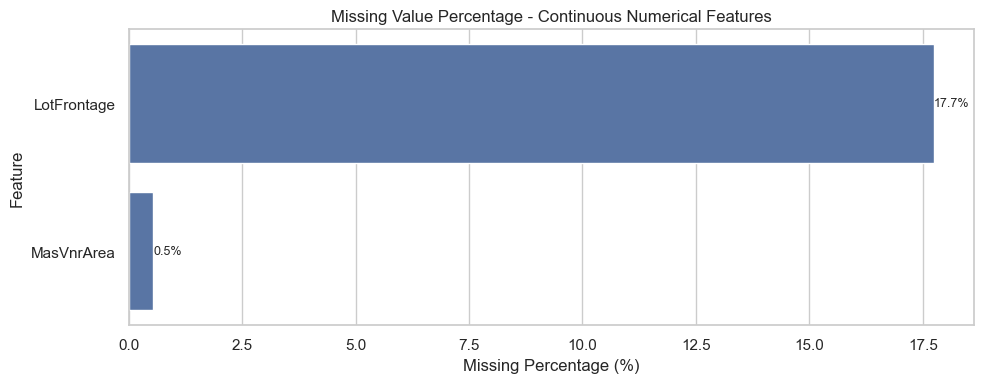

In [21]:
continuous_missing = missing_summary(train, continuous_numeric)
display(continuous_missing.round(2))

plot_missing_bar(
    train,
    continuous_numeric,
    "Missing Value Percentage - Continuous Numerical Features"
)

### 6.1.2 Distribution Plots — Continuous Features

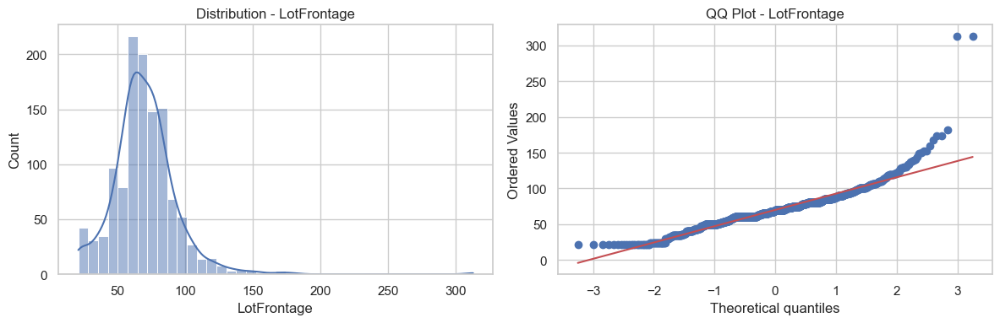

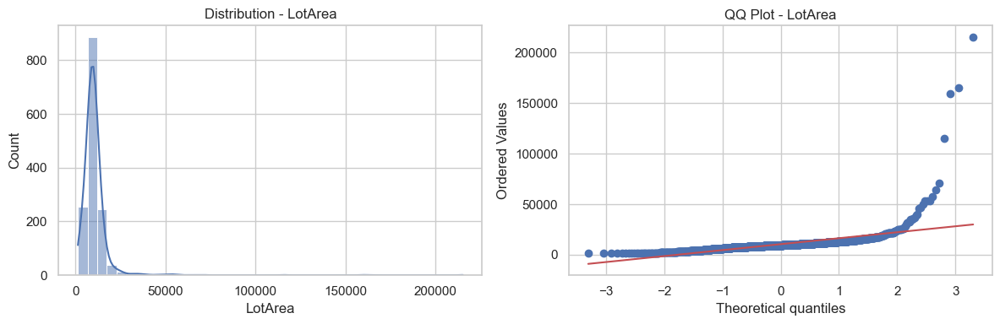

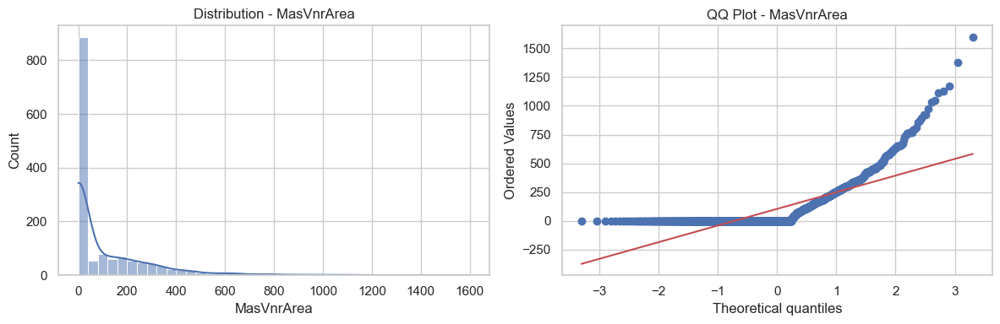

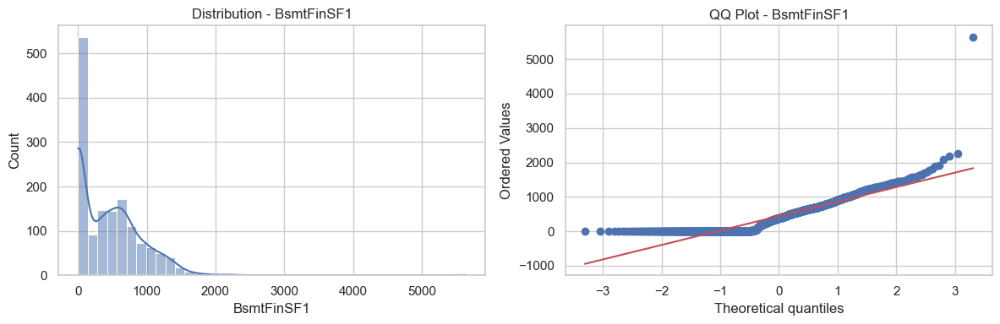

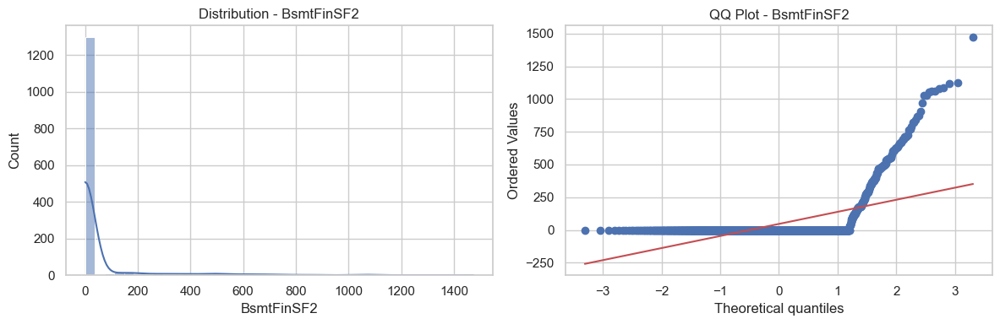

...

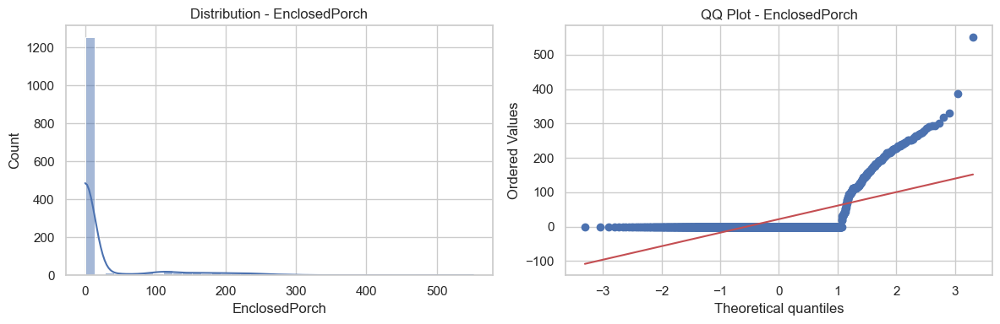

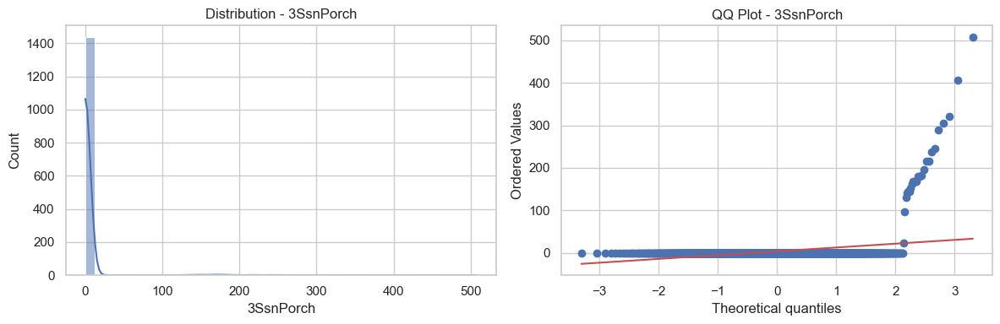

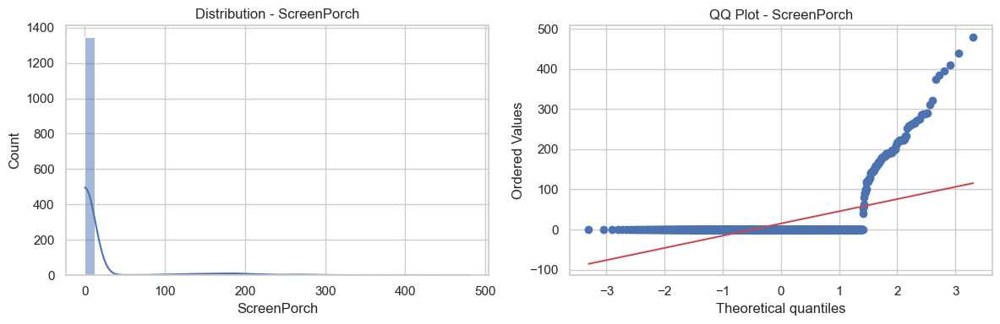

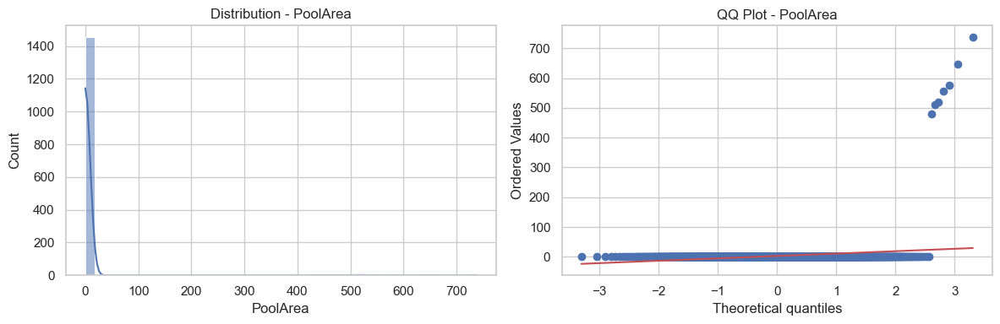

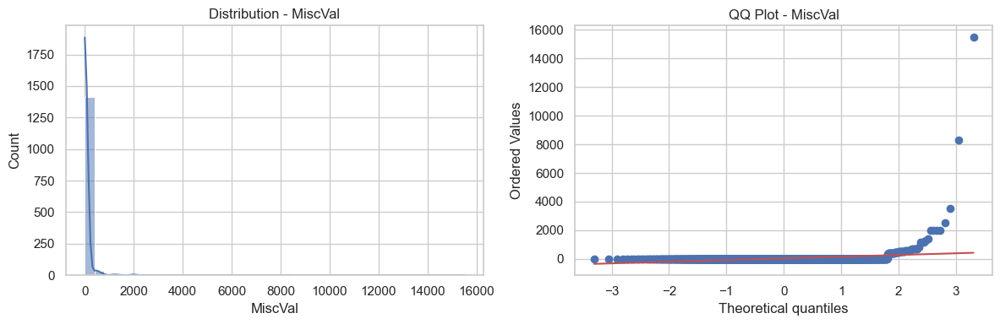

In [22]:
for feature in continuous_numeric:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    sns.histplot(train[feature].dropna(), kde=True, bins=40, ax=axes[0])
    axes[0].set_title(f"Distribution - {feature}")
    axes[0].set_xlabel(feature)

    stats.probplot(train[feature].dropna(), dist="norm", plot=axes[1])
    axes[1].set_title(f"QQ Plot - {feature}")

    plt.tight_layout()
    plt.show()

### 6.1.3 Zero-heavy Feature Check

A feature is considered zero-heavy if a large percentage of values are zero.

In [23]:
zero_summary = []

for feature in continuous_numeric:
    zero_count = (train[feature] == 0).sum()
    zero_summary.append({
        "feature": feature,
        "zero_count": zero_count,
        "zero_percentage": zero_count / len(train) * 100
    })

zero_summary = pd.DataFrame(zero_summary).sort_values(
    by="zero_percentage",
    ascending=False
)

display(zero_summary.round(2))

,feature,zero_count,zero_percentage
17,PoolArea,1453,99.5200
15,3SsnPorch,1436,98.3600
9,LowQualFinSF,1434,98.2200
18,MiscVal,1408,96.4400
16,ScreenPorch,1344,92.0500
4,BsmtFinSF2,1293,88.5600
14,EnclosedPorch,1252,85.7500
2,MasVnrArea,861,58.9700
8,2ndFlrSF,829,56.7800
12,WoodDeckSF,761,52.1200


### 6.1.4 Percentile Summary — Continuous Features

In [24]:
continuous_percentile_report = (
    train[continuous_numeric]
    .describe(percentiles=[0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99])
    .T
    .reset_index()
    .rename(columns={"index": "feature", "50%": "median"})
)

display(continuous_percentile_report.round(2))

,feature,count,mean,std,min,1%,5%,10%,25%,median,75%,90%,95%,99%,max
0,LotFrontage,1201.0000,70.0500,24.2800,21.0000,21.0000,34.0000,44.0000,59.0000,69.0000,80.0000,96.0000,107.0000,141.0000,313.0000
1,LotArea,1460.0000,10516.8300,9981.2600,1300.0000,1680.0000,3311.7000,5000.0000,7553.5000,9478.5000,11601.5000,14381.7000,17401.1500,37567.6400,215245.0000
2,MasVnrArea,1452.0000,103.6900,181.0700,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,166.0000,335.0000,456.0000,791.9200,1600.0000
3,BsmtFinSF1,1460.0000,443.6400,456.1000,0.0000,0.0000,0.0000,0.0000,0.0000,383.5000,712.2500,1065.5000,1274.0000,1572.4100,5644.0000
4,BsmtFinSF2,1460.0000,46.5500,161.3200,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,117.2000,396.2000,830.3800,1474.0000
5,BsmtUnfSF,1460.0000,567.2400,441.8700,0.0000,0.0000,0.0000,74.9000,223.0000,477.5000,808.0000,1232.0000,1468.0000,1797.0500,2336.0000
6,TotalBsmtSF,1460.0000,1057.4300,438.7100,0.0000,0.0000,519.3000,636.9000,795.7500,991.5000,1298.2500,1602.2000,1753.0000,2155.0500,6110.0000
7,1stFlrSF,1460.0000,1162.6300,386.5900,334.0000,520.0000,672.9500,756.9000,882.0000,1087.0000,1391.2500,1680.0000,1831.2500,2219.4600,4692.0000
8,2ndFlrSF,1460.0000,346.9900,436.5300,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,728.0000,954.2000,1141.0500,1418.9200,2065.0000
9,LowQualFinSF,1460.0000,5.8400,48.6200,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,360.0000,572.0000


### 6.1.5 IQR Outlier Summary — Continuous Features

This table summarizes possible upper/lower-tail outliers.

No capping or removal is applied in this EDA step.

In [25]:
outlier_rows = []

for feature in continuous_numeric:
    data = train[feature].dropna()

    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier_count = ((train[feature] < lower) | (train[feature] > upper)).sum()

    outlier_rows.append({
        "feature": feature,
        "q1": q1,
        "q3": q3,
        "iqr": iqr,
        "lower_bound": lower,
        "upper_bound": upper,
        "outlier_count": outlier_count,
        "outlier_percentage": outlier_count / len(train) * 100
    })

continuous_outlier_summary = pd.DataFrame(outlier_rows).sort_values(
    by="outlier_percentage",
    ascending=False
)

display(continuous_outlier_summary.round(4))

,feature,q1,q3,iqr,lower_bound,upper_bound,outlier_count,outlier_percentage
14,EnclosedPorch,0.0000,0.0000,0.0000,0.0000,0.0000,208,14.2466
4,BsmtFinSF2,0.0000,0.0000,0.0000,0.0000,0.0000,167,11.4384
16,ScreenPorch,0.0000,0.0000,0.0000,0.0000,0.0000,116,7.9452
2,MasVnrArea,0.0000,166.0000,166.0000,-249.0000,415.0000,96,6.5753
0,LotFrontage,59.0000,80.0000,21.0000,27.5000,111.5000,88,6.0274
13,OpenPorchSF,0.0000,68.0000,68.0000,-102.0000,170.0000,77,5.2740
1,LotArea,7553.5000,11601.5000,4048.0000,1481.5000,17673.5000,69,4.7260
6,TotalBsmtSF,795.7500,1298.2500,502.5000,42.0000,2052.0000,61,4.1781
18,MiscVal,0.0000,0.0000,0.0000,0.0000,0.0000,52,3.5616
12,WoodDeckSF,0.0000,168.0000,168.0000,-252.0000,420.0000,32,2.1918


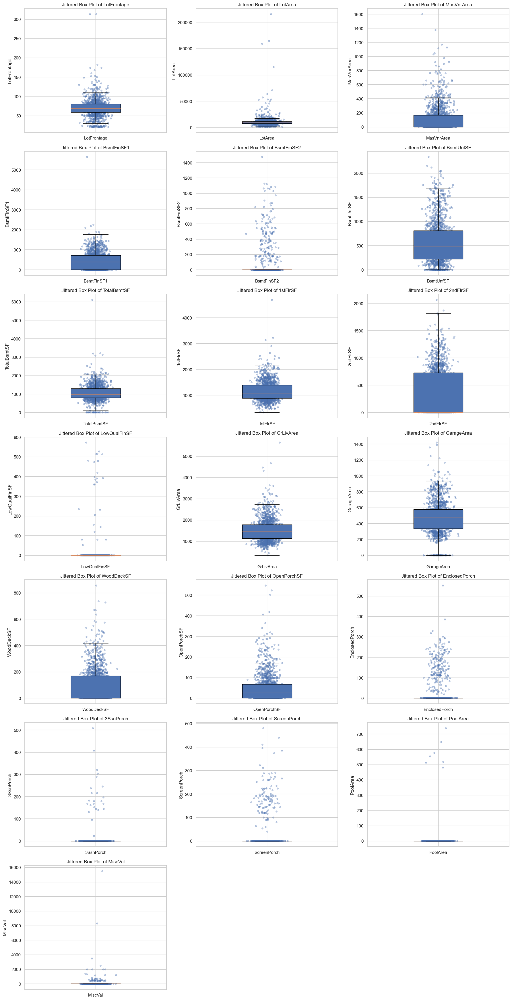

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import math

features = continuous_numeric

n_cols = 3
n_rows = math.ceil(len(features) / n_cols)

plt.figure(figsize=(18, 5 * n_rows))

for i, feature in enumerate(features, 1):
    data = train[feature].dropna()

    x_jitter = np.random.normal(loc=1, scale=0.04, size=len(data))

    plt.subplot(n_rows, n_cols, i)

    plt.boxplot(
        data,
        vert=True,
        patch_artist=True,
        widths=0.35,
        showfliers=False
    )

    plt.scatter(
        x_jitter,
        data,
        alpha=0.35,
        s=15
    )

    plt.title(f"Jittered Box Plot of {feature}")
    plt.xticks([1], [feature])
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

### 6.1.6 log1p Transformation Check — Selected Continuous Features

Only selected skewed features are checked.  
This does not apply transformation permanently.

,feature,raw_skewness,log1p_skewness,raw_kurtosis,log1p_kurtosis
0,LotArea,12.2077,-0.1374,203.2433,4.7138
1,1stFlrSF,1.3768,0.0801,5.7458,0.1505
2,GrLivArea,1.3666,-0.0061,4.8951,0.2820
3,LotFrontage,2.1636,-0.7287,17.4529,2.3095
4,TotalBsmtSF,1.5243,-5.1547,13.2505,27.7397
5,BsmtUnfSF,0.9203,-2.1865,0.4750,4.1370
6,GarageArea,0.1800,-3.4826,0.9171,11.1764


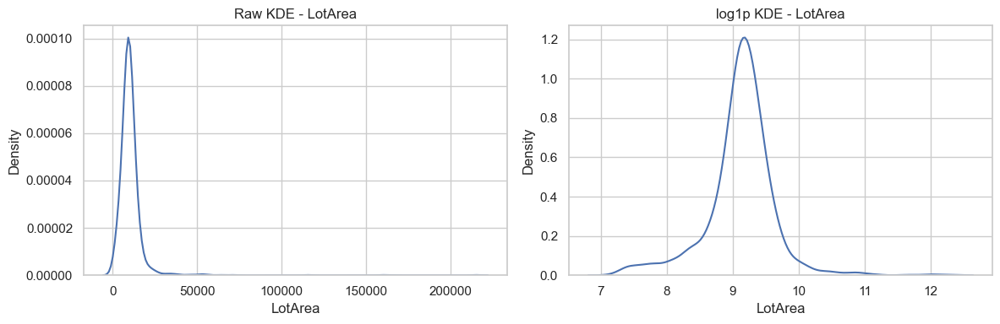

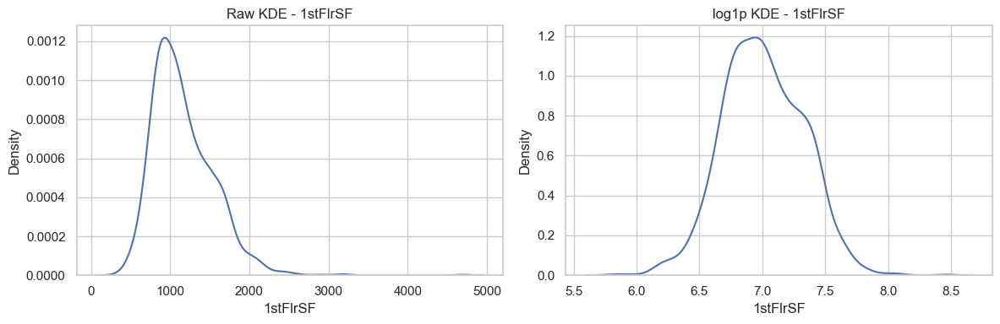

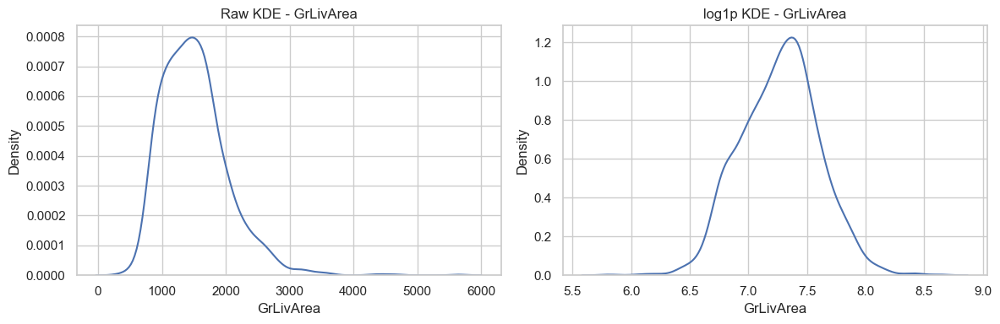

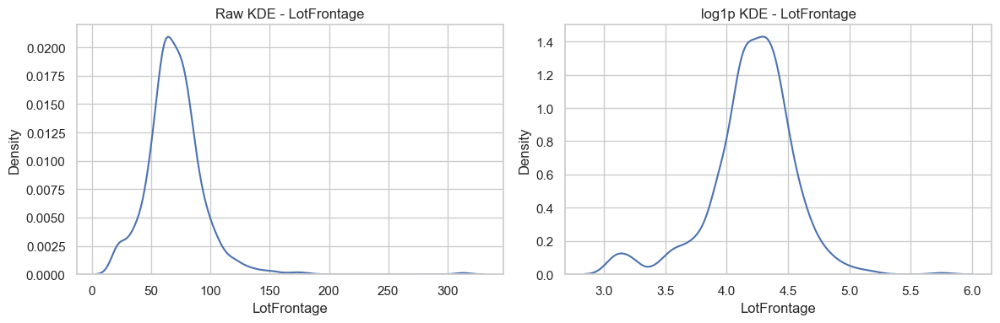

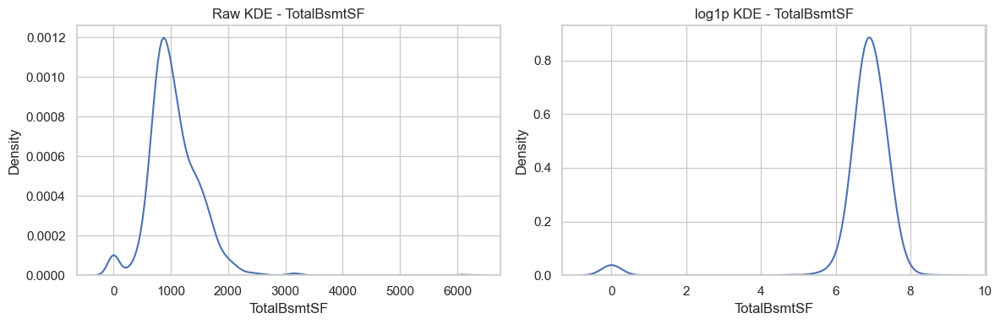

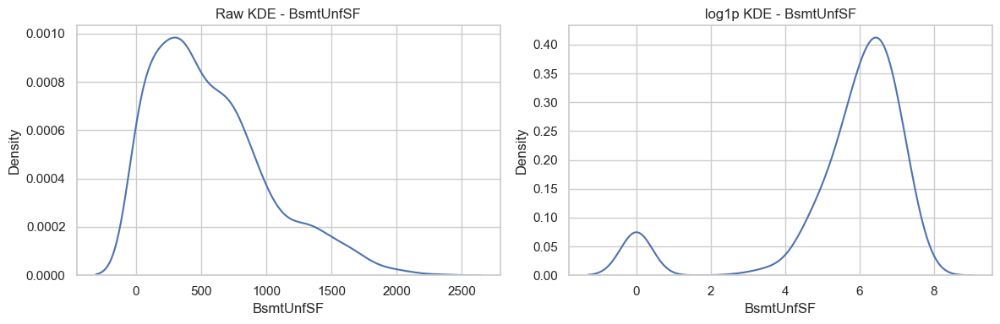

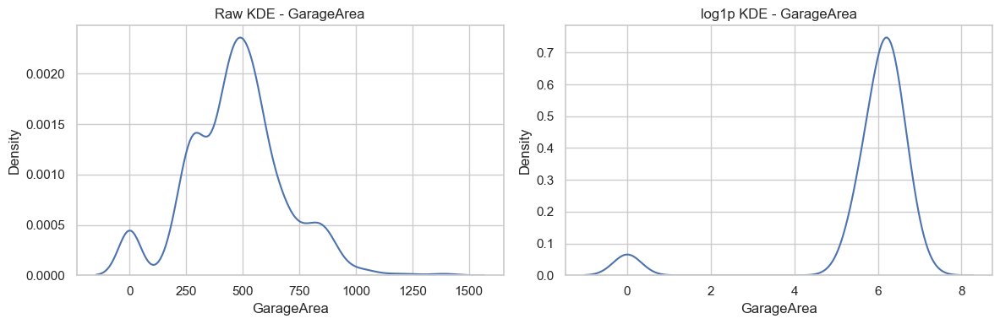

In [27]:
log_check_features = [
    "LotArea",
    "1stFlrSF",
    "GrLivArea",
    "LotFrontage",
    "TotalBsmtSF",
    "BsmtUnfSF",
    "GarageArea"
]

log_check_features = [feature for feature in log_check_features if feature in train.columns]

log_comparison = []

for feature in log_check_features:
    raw_data = train[feature].dropna()
    log_data = np.log1p(raw_data)

    log_comparison.append({
        "feature": feature,
        "raw_skewness": raw_data.skew(),
        "log1p_skewness": log_data.skew(),
        "raw_kurtosis": raw_data.kurt(),
        "log1p_kurtosis": log_data.kurt()
    })

log_comparison = pd.DataFrame(log_comparison)
display(log_comparison.round(4))

for feature in log_check_features:
    raw_data = train[feature].dropna()
    log_data = np.log1p(raw_data)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    sns.kdeplot(raw_data, ax=axes[0])
    axes[0].set_title(f"Raw KDE - {feature}")

    sns.kdeplot(log_data, ax=axes[1])
    axes[1].set_title(f"log1p KDE - {feature}")

    plt.tight_layout()
    plt.show()

### 6.1.7 Continuous Feature Decision

- Missing value handling is mainly needed for `LotFrontage` and `MasVnrArea`.
- Many continuous features are right-skewed.
- Several features are zero-heavy or sparse.
- Apply `log1p` selectively, not blindly.
- Create binary indicators later for zero-heavy features.
- Outlier capping should be considered only after model validation.

## 6.2 Count Numerical Features

Count numerical features represent actual quantities.

This section checks:

- missing values
- repeated values
- value frequency
- count distribution

No target variable is used here.

In [28]:
count_report = numeric_basic_report(train, count_numeric)
display(count_report.round(4))

,feature,data_type,missing_value,missing_percentage,unique_value,repeated_value,repeated_percentage,min,max,mean,median,std,skewness,kurtosis,most_frequent_value,most_frequent_percentage
0,BsmtFullBath,int64,0,0.0000,4,1456,99.7260,0,3,0.4253,0.0000,0.5189,0.5961,-0.8391,0,58.6301
1,BsmtHalfBath,int64,0,0.0000,3,1457,99.7945,0,2,0.0575,0.0000,0.2388,4.1034,16.3966,0,94.3836
2,FullBath,int64,0,0.0000,4,1456,99.7260,0,3,1.5651,2.0000,0.5509,0.0366,-0.8570,2,52.6027
3,HalfBath,int64,0,0.0000,3,1457,99.7945,0,2,0.3829,0.0000,0.5029,0.6759,-1.0769,0,62.5342
4,BedroomAbvGr,int64,0,0.0000,8,1452,99.4521,0,8,2.8664,3.0000,0.8158,0.2118,2.2309,3,55.0685
5,KitchenAbvGr,int64,0,0.0000,4,1456,99.7260,0,3,1.0466,1.0000,0.2203,4.4884,21.5324,1,95.3425
6,TotRmsAbvGrd,int64,0,0.0000,12,1448,99.1781,2,14,6.5178,6.0000,1.6254,0.6763,0.8808,6,27.5342
7,Fireplaces,int64,0,0.0000,4,1456,99.7260,0,3,0.6130,1.0000,0.6447,0.6496,-0.2172,0,47.2603
8,GarageCars,int64,0,0.0000,5,1455,99.6575,0,4,1.7671,2.0000,0.7473,-0.3425,0.2210,2,56.4384


### 6.2.1 Count Plots — Count Numerical Features

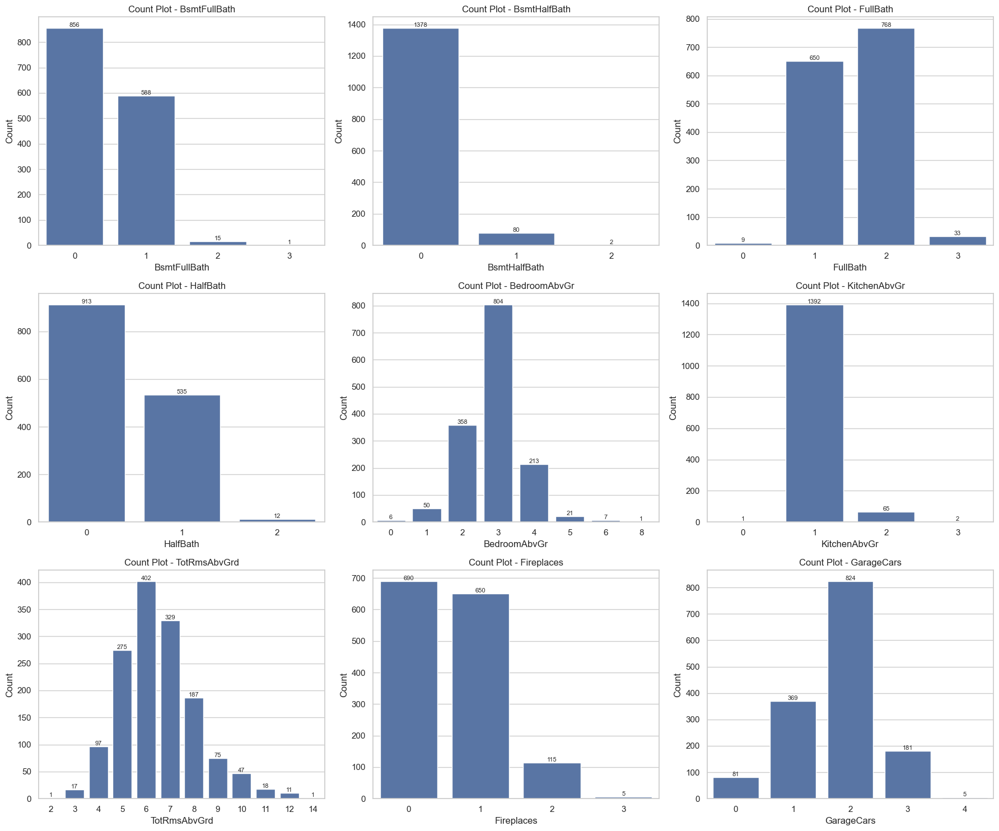

In [29]:
n_features = len(count_numeric)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

plt.figure(figsize=(18, 5 * n_rows))

for i, feature in enumerate(count_numeric, 1):
    plt.subplot(n_rows, n_cols, i)
    order = sorted(train[feature].dropna().unique())
    ax = sns.countplot(data=train, x=feature, order=order)

    plt.title(f"Count Plot - {feature}")
    plt.xlabel(feature)
    plt.ylabel("Count")

    for container in ax.containers:
        ax.bar_label(container, fontsize=8)

plt.tight_layout()
plt.show()

### 6.2.2 Dot Plots — Count Numerical Features

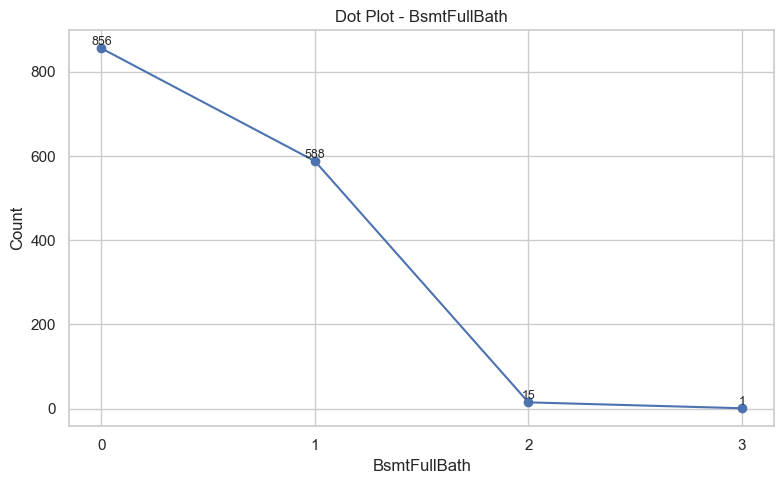

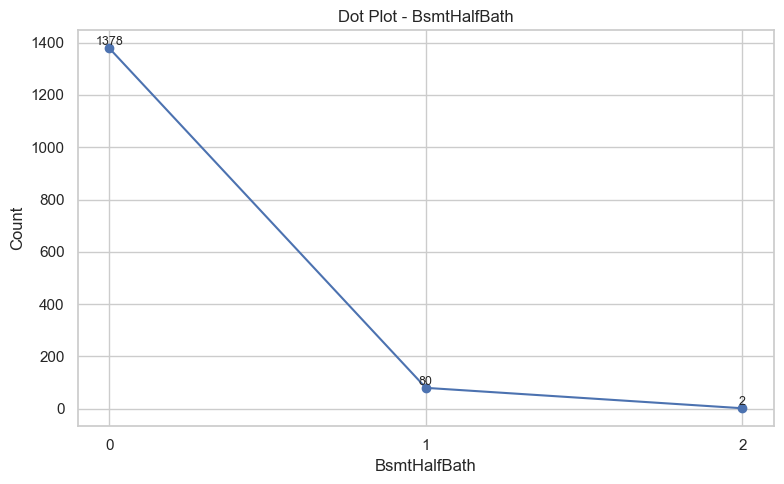

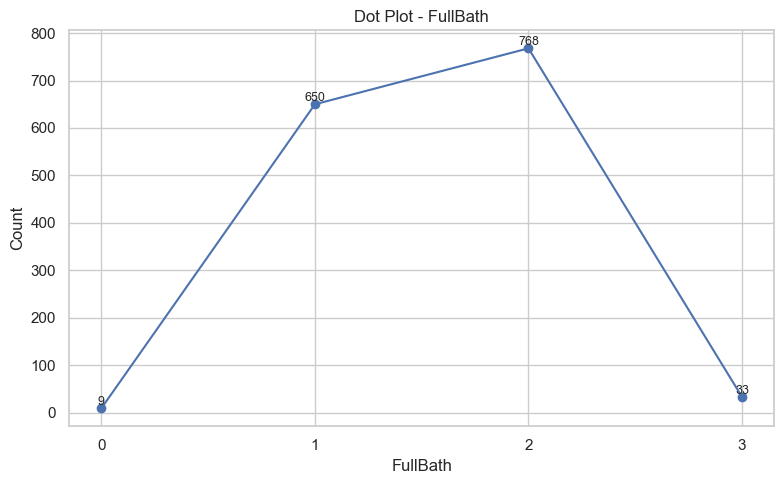

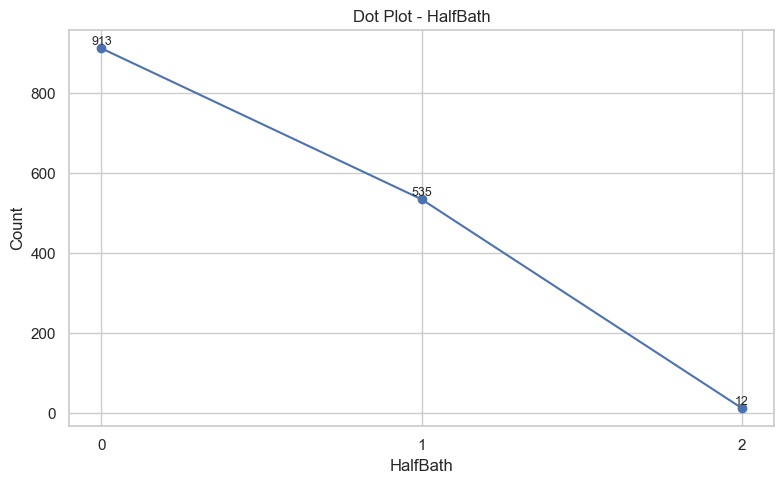

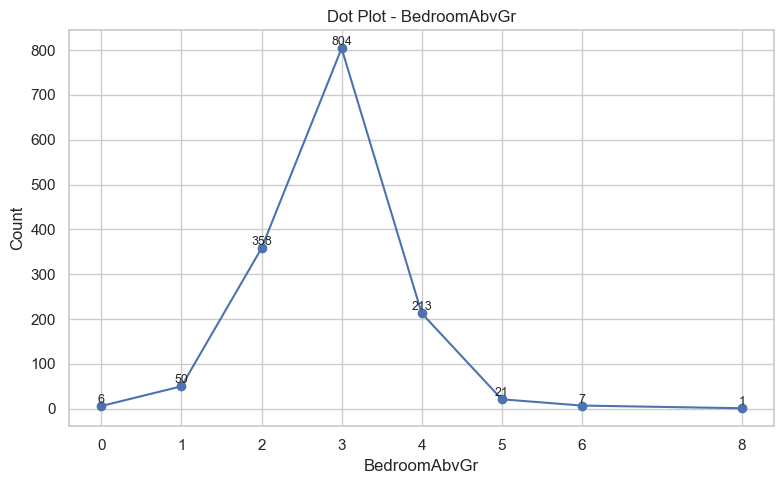

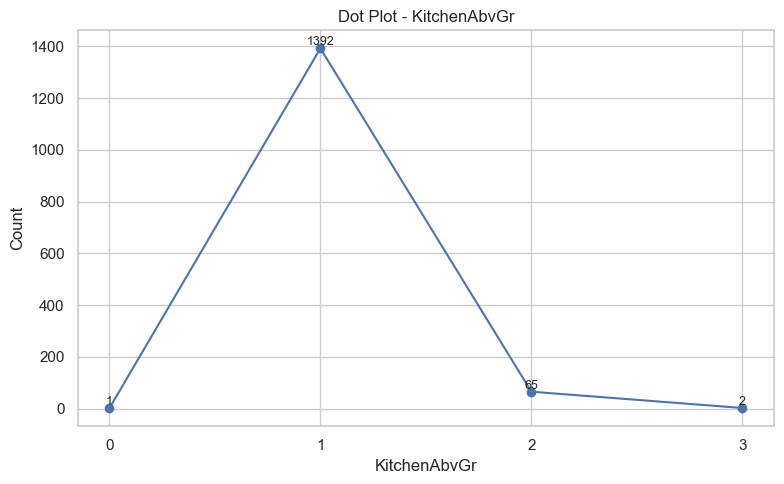

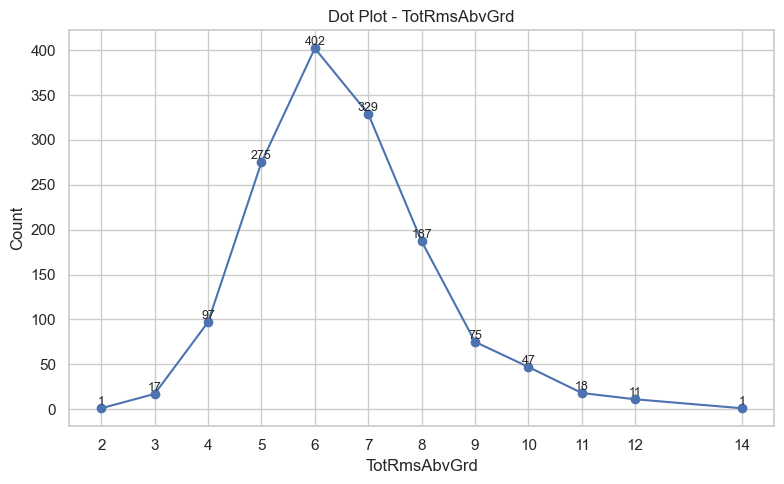

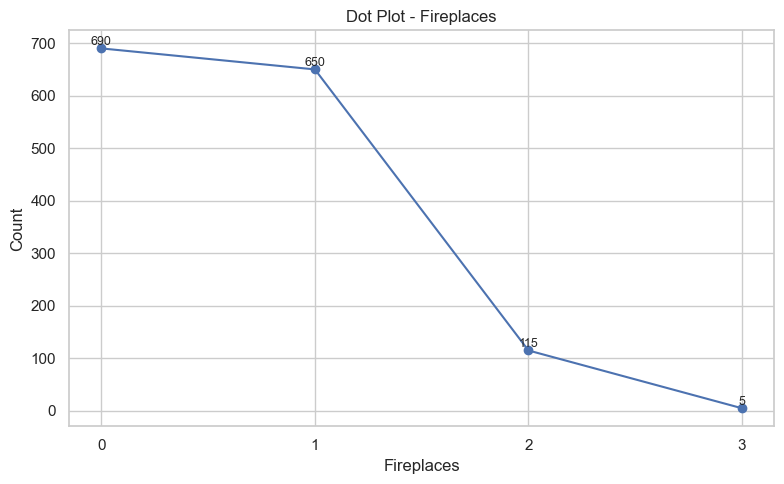

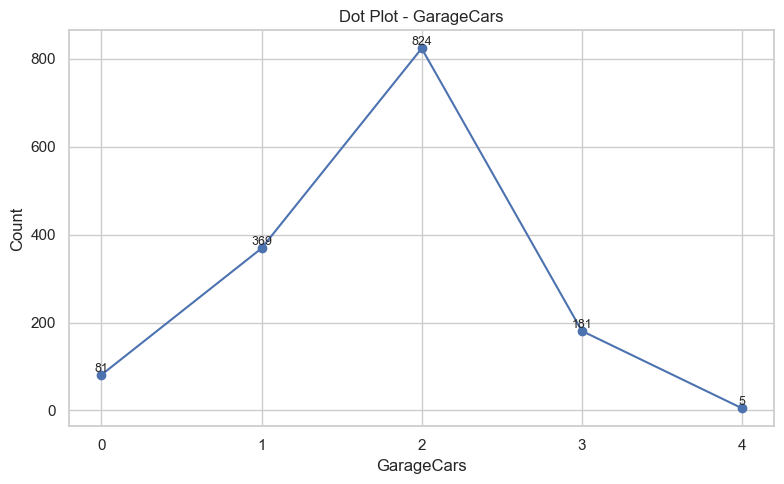

In [30]:
for feature in count_numeric:
    counts = train[feature].value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    plt.plot(counts.index, counts.values, marker="o", linestyle="-")

    for x, y in zip(counts.index, counts.values):
        plt.text(x, y, str(y), ha="center", va="bottom", fontsize=9)

    plt.title(f"Dot Plot - {feature}")
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.xticks(counts.index)
    plt.tight_layout()
    plt.show()

### 6.2.3 Count Feature Decision

- Count numerical features are mostly clean.
- Repeated values are normal because these features have limited discrete counts.
- No log transformation is needed.
- No IQR-based outlier handling is needed.
- Rare high counts should not be removed blindly because they may represent valid large or luxury houses.
- Keep raw count values and create selected binary/combined features later.

## 6.3 Ordinal Numerical Features

Ordinal numerical features are numeric scores with meaningful rank.

Features:

- `OverallQual`
- `OverallCond`

In [31]:
ordinal_numeric_report = numeric_basic_report(train, ordinal_numeric)

invalid_score_rows = []

for feature in ordinal_numeric:
    invalid_score_rows.append({
        "feature": feature,
        "invalid_score_count": ((train[feature] < 1) | (train[feature] > 10)).sum()
    })

invalid_score_report = pd.DataFrame(invalid_score_rows)

display(ordinal_numeric_report.round(4))
display(invalid_score_report)

,feature,data_type,missing_value,missing_percentage,unique_value,repeated_value,repeated_percentage,min,max,mean,median,std,skewness,kurtosis,most_frequent_value,most_frequent_percentage
0,OverallQual,int64,0,0.0000,10,1450,99.3151,1,10,6.0993,6.0000,1.3830,0.2169,0.0963,5,27.1918
1,OverallCond,int64,0,0.0000,9,1451,99.3836,1,9,5.5753,5.0000,1.1128,0.6931,1.1064,5,56.2329


,feature,invalid_score_count
0,OverallQual,0
1,OverallCond,0


### 6.3.1 Frequency and Cumulative Percentage

In [32]:
ordinal_numeric_freq_tables = []

for feature in ordinal_numeric:
    freq_df = (
        train[feature]
        .value_counts(dropna=False)
        .sort_index()
        .reset_index()
    )

    freq_df.columns = ["score", "count"]
    freq_df["feature"] = feature
    freq_df["percentage"] = freq_df["count"] / len(train) * 100
    freq_df["cumulative_count"] = freq_df["count"].cumsum()
    freq_df["cumulative_percentage"] = freq_df["percentage"].cumsum()

    ordinal_numeric_freq_tables.append(freq_df)

ordinal_numeric_freq = pd.concat(ordinal_numeric_freq_tables, ignore_index=True)
display(ordinal_numeric_freq.round(2))

,score,count,feature,percentage,cumulative_count,cumulative_percentage
0,1,2,OverallQual,0.1400,2,0.1400
1,2,3,OverallQual,0.2100,5,0.3400
2,3,20,OverallQual,1.3700,25,1.7100
3,4,116,OverallQual,7.9500,141,9.6600
4,5,397,OverallQual,27.1900,538,36.8500
5,6,374,OverallQual,25.6200,912,62.4700
6,7,319,OverallQual,21.8500,1231,84.3200
7,8,168,OverallQual,11.5100,1399,95.8200
8,9,43,OverallQual,2.9500,1442,98.7700
9,10,18,OverallQual,1.2300,1460,100.0000


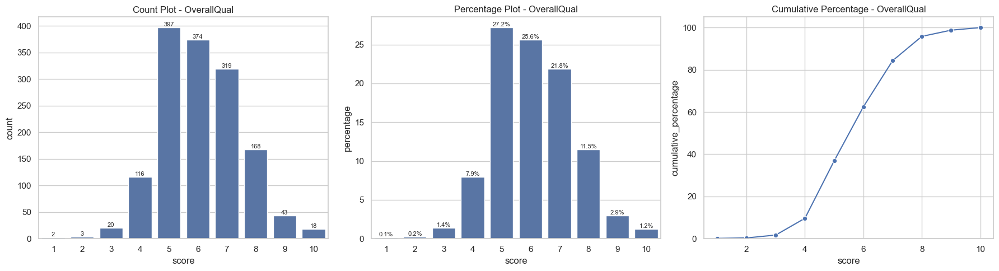

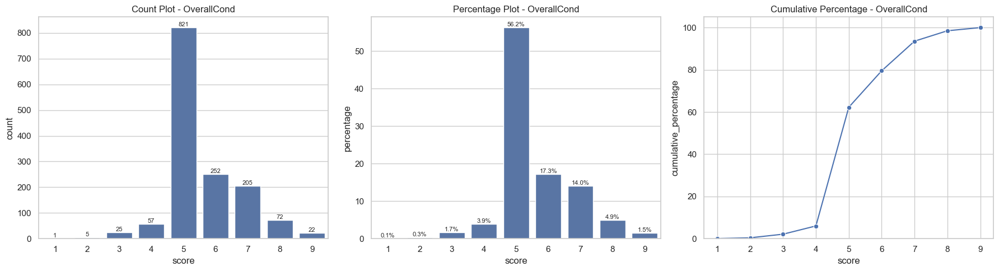

In [33]:
for feature in ordinal_numeric:
    freq_df = (
        train[feature]
        .value_counts(dropna=False)
        .sort_index()
        .reset_index()
    )

    freq_df.columns = ["score", "count"]
    freq_df["percentage"] = freq_df["count"] / len(train) * 100
    freq_df["cumulative_percentage"] = freq_df["percentage"].cumsum()

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    ax1 = sns.barplot(data=freq_df, x="score", y="count", ax=axes[0])
    axes[0].set_title(f"Count Plot - {feature}")
    for container in ax1.containers:
        ax1.bar_label(container, fontsize=8)

    ax2 = sns.barplot(data=freq_df, x="score", y="percentage", ax=axes[1])
    axes[1].set_title(f"Percentage Plot - {feature}")
    for container in ax2.containers:
        ax2.bar_label(container, fmt="%.1f%%", fontsize=8)

    sns.lineplot(data=freq_df, x="score", y="cumulative_percentage", marker="o", ax=axes[2])
    axes[2].set_title(f"Cumulative Percentage - {feature}")
    axes[2].set_ylim(0, 105)

    plt.tight_layout()
    plt.show()

### 6.3.2 Ordinal Numeric Decision

- Both features are valid score-based variables.
- No missing value treatment is required.
- No log transformation is required.
- No outlier handling is required.
- Keep both features in their original numeric ordinal form.

## 6.4 Temporal Features

Temporal features represent construction year, remodel year, garage year, sale month, and sale year.

This section checks:

- missing values
- valid year/month range
- year distributions
- month/year sold frequency
- decade-wise patterns

In [34]:
temporal_report = numeric_basic_report(train, temporal_features)
display(temporal_report.round(4))

,feature,data_type,missing_value,missing_percentage,unique_value,repeated_value,repeated_percentage,min,max,mean,median,std,skewness,kurtosis,most_frequent_value,most_frequent_percentage
0,YearBuilt,int64,0,0.0000,112,1348,92.3288,1872.0000,2010.0000,1971.2678,1973.0000,30.2029,-0.6135,-0.4396,2006.0000,4.5890
1,YearRemodAdd,int64,0,0.0000,61,1399,95.8219,1950.0000,2010.0000,1984.8658,1994.0000,20.6454,-0.5036,-1.2722,1950.0000,12.1918
2,GarageYrBlt,float64,81,5.5479,98,1362,93.2877,1900.0000,2010.0000,1978.5062,1980.0000,24.6897,-0.6494,-0.4183,NaN,5.5479
3,MoSold,int64,0,0.0000,12,1448,99.1781,1.0000,12.0000,6.3219,6.0000,2.7036,0.2121,-0.4041,6.0000,17.3288
4,YrSold,int64,0,0.0000,5,1455,99.6575,2006.0000,2010.0000,2007.8158,2008.0000,1.3281,0.0963,-1.1906,2009.0000,23.1507


### 6.4.1 Temporal Validity Check

In [35]:
temporal_validity_check = pd.DataFrame({
    "feature": temporal_features,
    "invalid_value_count": [
        ((train["YearBuilt"] < 1800) | (train["YearBuilt"] > train["YrSold"])).sum(),
        ((train["YearRemodAdd"] < train["YearBuilt"]) | (train["YearRemodAdd"] > train["YrSold"])).sum(),
        ((train["GarageYrBlt"].notna()) & ((train["GarageYrBlt"] < 1800) | (train["GarageYrBlt"] > train["YrSold"]))).sum(),
        ((train["MoSold"] < 1) | (train["MoSold"] > 12)).sum(),
        ((train["YrSold"] < train["YearBuilt"])).sum()
    ]
})

display(temporal_validity_check)

,feature,invalid_value_count
0,YearBuilt,0
1,YearRemodAdd,1
2,GarageYrBlt,0
3,MoSold,0
4,YrSold,0


### 6.4.2 Temporal Missing Value Note

- Most temporal features have no missing values.
- `GarageYrBlt` can be missing because the house has no garage.
- `GarageYrBlt` should not be blindly filled with mean/median during EDA.
- Missing value handling is left for preprocessing.

### 6.4.3 Distribution Plots — Year Features

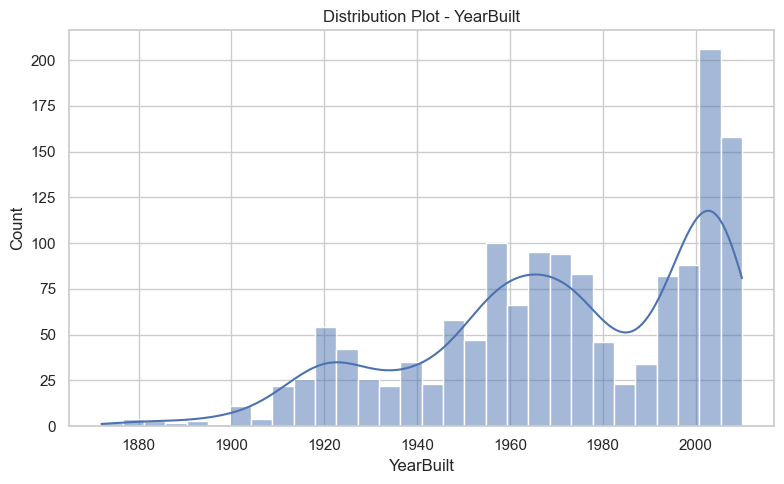

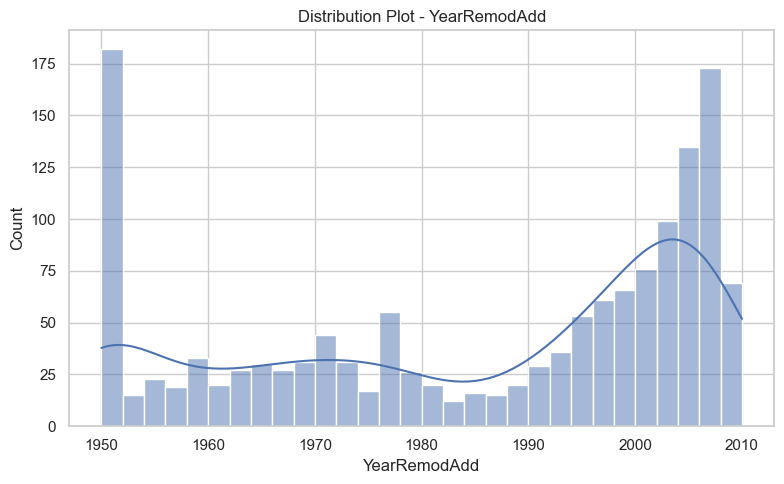

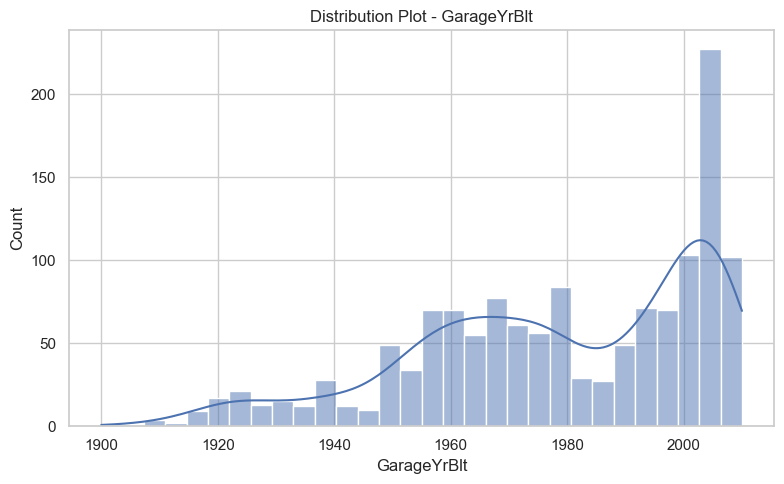

In [36]:
year_features = ["YearBuilt", "YearRemodAdd", "GarageYrBlt"]
discrete_time_features = ["MoSold", "YrSold"]

for feature in year_features:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=train, x=feature, bins=30, kde=True)
    plt.title(f"Distribution Plot - {feature}")
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

### 6.4.4 Count Plots — Sale Month and Sale Year

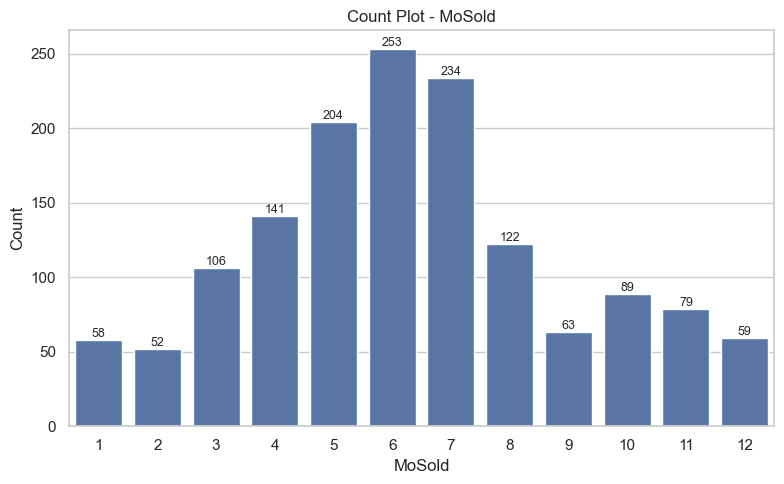

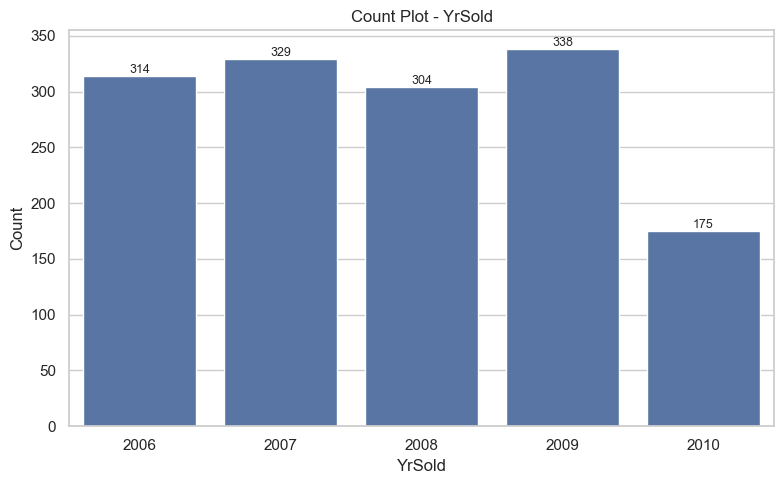

In [37]:
for feature in discrete_time_features:
    plt.figure(figsize=(8, 5))
    order = sorted(train[feature].dropna().unique())
    ax = sns.countplot(data=train, x=feature, order=order)

    plt.title(f"Count Plot - {feature}")
    plt.xlabel(feature)
    plt.ylabel("Count")

    for container in ax.containers:
        ax.bar_label(container, fontsize=9)

    plt.tight_layout()
    plt.show()

### 6.4.5 Frequency and Percentile Tables — Temporal Features

In [38]:
temporal_frequency = frequency_table(train, discrete_time_features, include_missing=True)
display(temporal_frequency.round(2))

temporal_percentile_report = (
    train[year_features]
    .describe(percentiles=[0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99])
    .T
    .reset_index()
    .rename(columns={"index": "feature", "50%": "median"})
)

display(temporal_percentile_report.round(2))

,feature,rank,category,count,percentage,cumulative_count,cumulative_percentage
0,MoSold,1,6,253,17.3300,253,17.3300
1,MoSold,2,7,234,16.0300,487,33.3600
2,MoSold,3,5,204,13.9700,691,47.3300
3,MoSold,4,4,141,9.6600,832,56.9900
4,MoSold,5,8,122,8.3600,954,65.3400
5,MoSold,6,3,106,7.2600,1060,72.6000
6,MoSold,7,10,89,6.1000,1149,78.7000
7,MoSold,8,11,79,5.4100,1228,84.1100
8,MoSold,9,9,63,4.3200,1291,88.4200
9,MoSold,10,12,59,4.0400,1350,92.4700


,feature,count,mean,std,min,1%,5%,10%,25%,median,75%,90%,95%,99%,max
0,YearBuilt,1460.0000,1971.2700,30.2000,1872.0000,1899.1800,1916.0000,1924.9000,1954.0000,1973.0000,2000.0000,2006.0000,2007.0000,2009.0000,2010.0000
1,YearRemodAdd,1460.0000,1984.8700,20.6500,1950.0000,1950.0000,1950.0000,1950.0000,1967.0000,1994.0000,2004.0000,2006.0000,2007.0000,2009.0000,2010.0000
2,GarageYrBlt,1379.0000,1978.5100,24.6900,1900.0000,1916.0000,1930.0000,1945.0000,1961.0000,1980.0000,2002.0000,2006.0000,2007.0000,2009.0000,2010.0000


### 6.4.6 Decade-wise Summary

In [39]:
def decade_wise_summary(df, features):
    all_tables = []

    for feature in features:
        data = df[feature].dropna()
        decade = (data // 10 * 10).astype(int)

        decade_df = (
            decade
            .value_counts()
            .sort_index()
            .reset_index()
        )

        decade_df.columns = ["decade", "count"]
        decade_df["feature"] = feature
        decade_df["percentage"] = decade_df["count"] / len(df) * 100
        decade_df["cumulative_count"] = decade_df["count"].cumsum()
        decade_df["cumulative_percentage"] = decade_df["percentage"].cumsum()
        decade_df["decade_range"] = decade_df["decade"].astype(str) + "s"

        decade_df = decade_df[
            ["feature", "decade_range", "count", "percentage",
             "cumulative_count", "cumulative_percentage"]
        ]

        all_tables.append(decade_df)

    return pd.concat(all_tables, ignore_index=True)

temporal_decade_summary = decade_wise_summary(train, year_features)
display(temporal_decade_summary.round(2))

,feature,decade_range,count,percentage,cumulative_count,cumulative_percentage
0,YearBuilt,1870s,2,0.1400,2,0.1400
1,YearBuilt,1880s,7,0.4800,9,0.6200
2,YearBuilt,1890s,6,0.4100,15,1.0300
3,YearBuilt,1900s,15,1.0300,30,2.0500
4,YearBuilt,1910s,58,3.9700,88,6.0300
5,YearBuilt,1920s,97,6.6400,185,12.6700
6,YearBuilt,1930s,54,3.7000,239,16.3700
7,YearBuilt,1940s,79,5.4100,318,21.7800
8,YearBuilt,1950s,167,11.4400,485,33.2200
9,YearBuilt,1960s,175,11.9900,660,45.2100


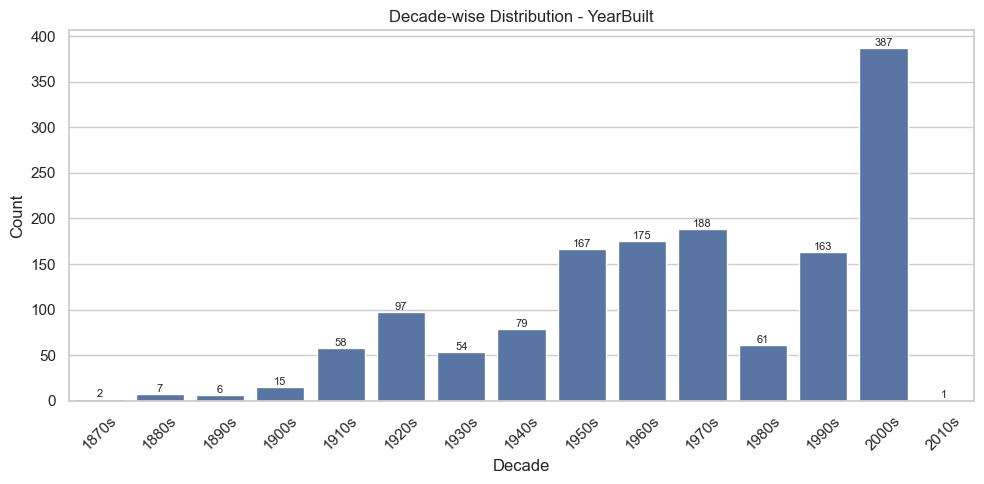

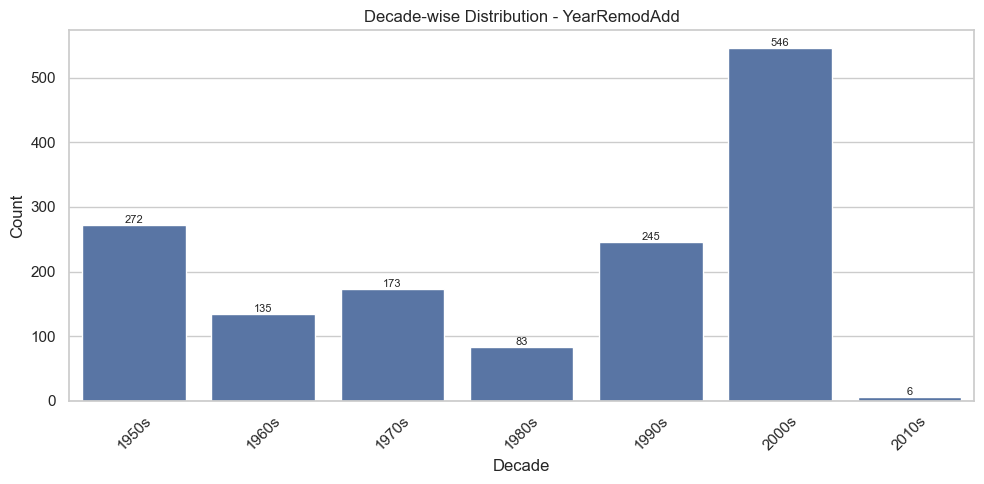

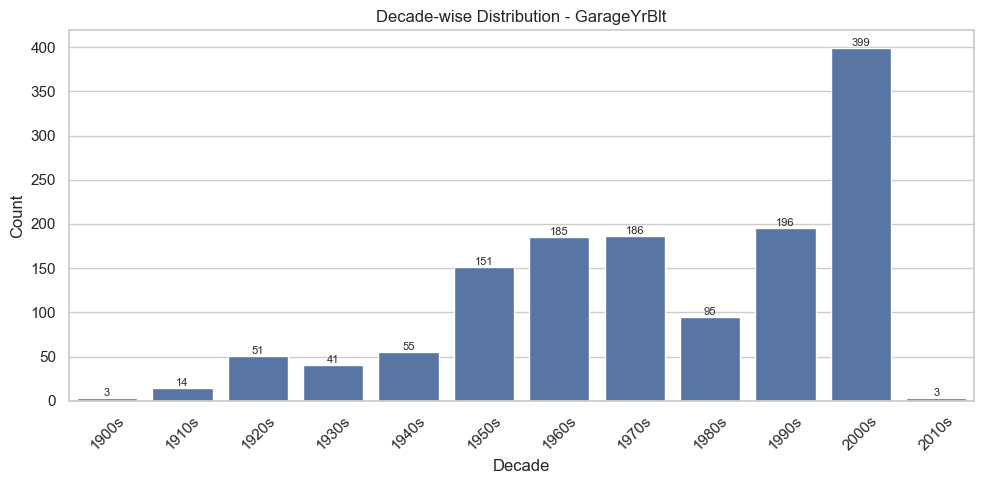

In [40]:
for feature in year_features:
    temp = train[[feature]].dropna().copy()
    temp["decade"] = (temp[feature] // 10 * 10).astype(int).astype(str) + "s"
    decade_order = sorted(temp["decade"].unique())

    plt.figure(figsize=(10, 5))
    ax = sns.countplot(data=temp, x="decade", order=decade_order)

    plt.title(f"Decade-wise Distribution - {feature}")
    plt.xlabel("Decade")
    plt.ylabel("Count")
    plt.xticks(rotation=45)

    for container in ax.containers:
        ax.bar_label(container, fontsize=8)

    plt.tight_layout()
    plt.show()

### 6.4.7 Temporal Feature Decision

- Temporal features are date-like numeric variables.
- No log transformation is required.
- No outlier handling is required.
- `GarageYrBlt` missing values should be handled carefully later.
- Any logical inconsistency is only noted in EDA, not corrected here.
- Age-based features can be created later during feature engineering.

## 7. Categorical Feature Univariate Analysis

This section analyzes categorical features only.

Subsections:

- 7.1 Nominal categorical features
- 7.2 Ordinal categorical features
- 7.3 Binary categorical features

## 7.1 Nominal Categorical Features

Nominal categorical features contain categories without natural order.

This section checks:

- missing values
- frequency and percentage
- rare categories
- cardinality
- dominance

In [41]:
nominal_basic_report = categorical_basic_report(train, nominal_categorical)
display(nominal_basic_report.round(2))

,feature,missing_value,missing_percentage,unique_category,repeated_value,repeated_percentage,top_category,top_count,top_percentage,cardinality_level,dominance_level
0,MSSubClass,0,0.0000,15,1445,98.9700,20,536,36.7100,High,Low
1,MSZoning,0,0.0000,5,1455,99.6600,RL,1151,78.8400,Medium,High
2,Alley,1369,93.7700,3,1457,99.7900,Missing,1369,93.7700,Low,Very High
3,LandContour,0,0.0000,4,1456,99.7300,Lvl,1311,89.7900,Medium,High
4,LotConfig,0,0.0000,5,1455,99.6600,Inside,1052,72.0500,Medium,High
5,Neighborhood,0,0.0000,25,1435,98.2900,NAmes,225,15.4100,High,Low
6,Condition1,0,0.0000,9,1451,99.3800,Norm,1260,86.3000,Medium,High
7,Condition2,0,0.0000,8,1452,99.4500,Norm,1445,98.9700,Medium,Very High
8,BldgType,0,0.0000,5,1455,99.6600,1Fam,1220,83.5600,Medium,High
9,HouseStyle,0,0.0000,8,1452,99.4500,1Story,726,49.7300,Medium,Low


### 7.1.1 Missing Value Analysis — Nominal Features

,feature,missing_value,missing_percentage
19,MiscFeature,1406,96.3000
2,Alley,1369,93.7700
14,MasVnrType,872,59.7300
18,GarageType,81,5.5500
17,Electrical,1,0.0700
0,MSSubClass,0,0.0000
5,Neighborhood,0,0.0000
4,LotConfig,0,0.0000
3,LandContour,0,0.0000
1,MSZoning,0,0.0000


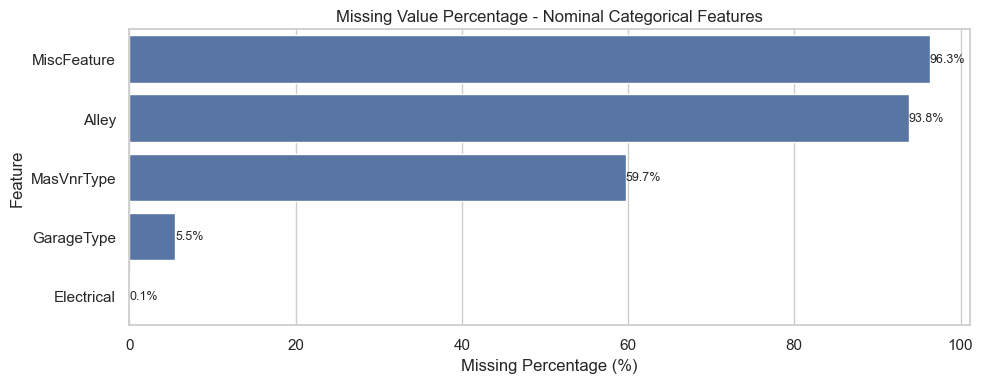

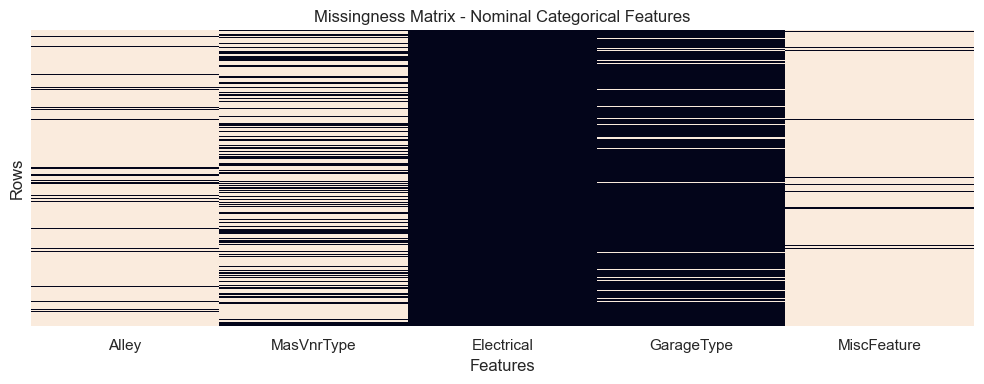

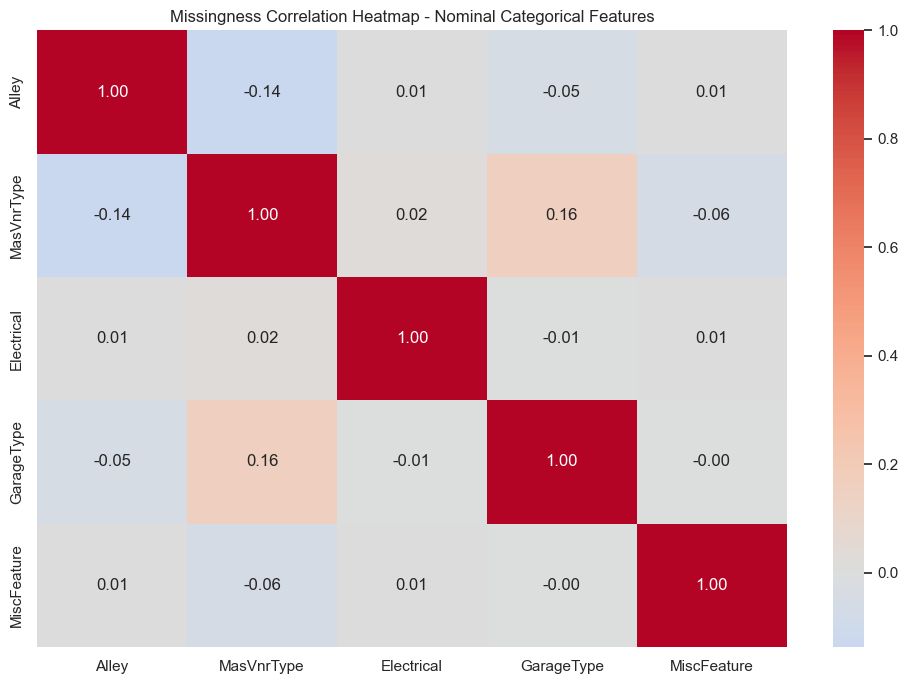

In [42]:
nominal_missing_summary = missing_summary(train, nominal_categorical)
display(nominal_missing_summary.round(2))

plot_missing_bar(
    train,
    nominal_categorical,
    "Missing Value Percentage - Nominal Categorical Features"
)

plot_missing_matrix(
    train,
    nominal_categorical,
    "Missingness Matrix - Nominal Categorical Features"
)

plot_missing_corr(
    train,
    nominal_categorical,
    "Missingness Correlation Heatmap - Nominal Categorical Features"
)

### 7.1.2 Frequency and Percentage Table — Nominal Features

In [43]:
nominal_freq_table = frequency_table(train, nominal_categorical, include_missing=True)
display(nominal_freq_table.round(2))

,feature,rank,category,count,percentage,cumulative_count,cumulative_percentage
0,MSSubClass,1,20,536,36.7100,536,36.7100
1,MSSubClass,2,60,299,20.4800,835,57.1900
2,MSSubClass,3,50,144,9.8600,979,67.0500
3,MSSubClass,4,120,87,5.9600,1066,73.0100
4,MSSubClass,5,30,69,4.7300,1135,77.7400
...,...,...,...,...,...,...,...
176,SaleCondition,2,Partial,125,8.5600,1323,90.6200
177,SaleCondition,3,Abnorml,101,6.9200,1424,97.5300
178,SaleCondition,4,Family,20,1.3700,1444,98.9000
179,SaleCondition,5,Alloca,12,0.8200,1456,99.7300


### 7.1.3 Category Percentage Plots — Nominal Features

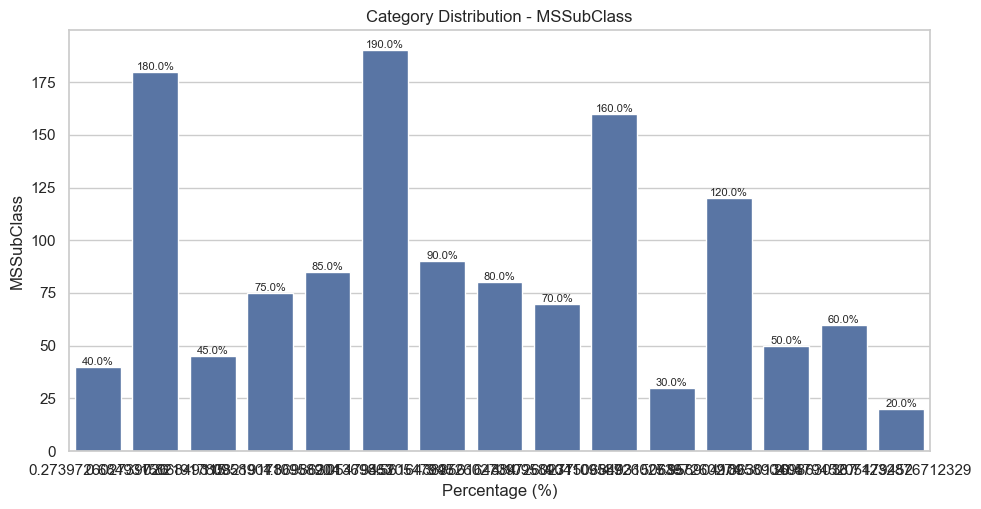

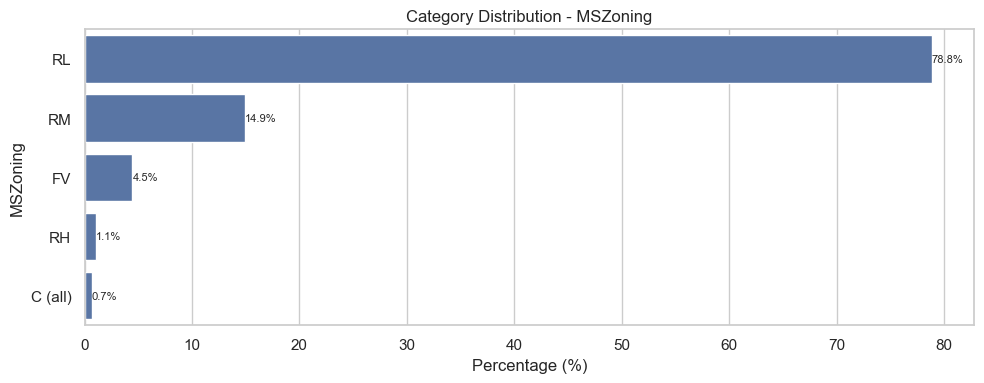

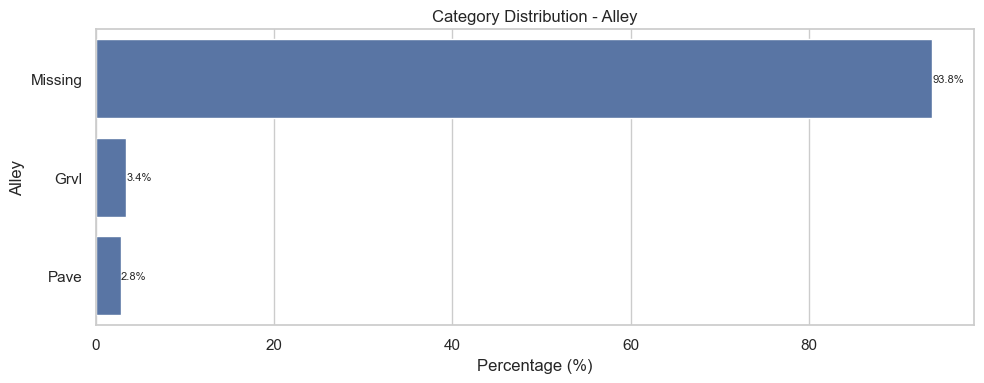

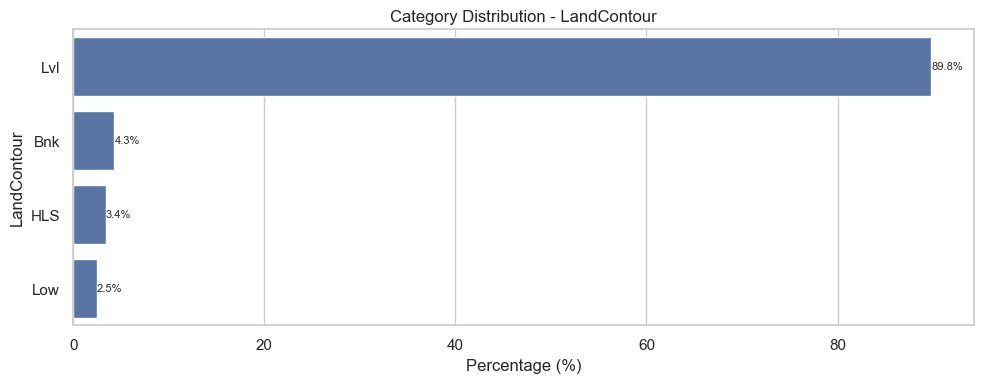

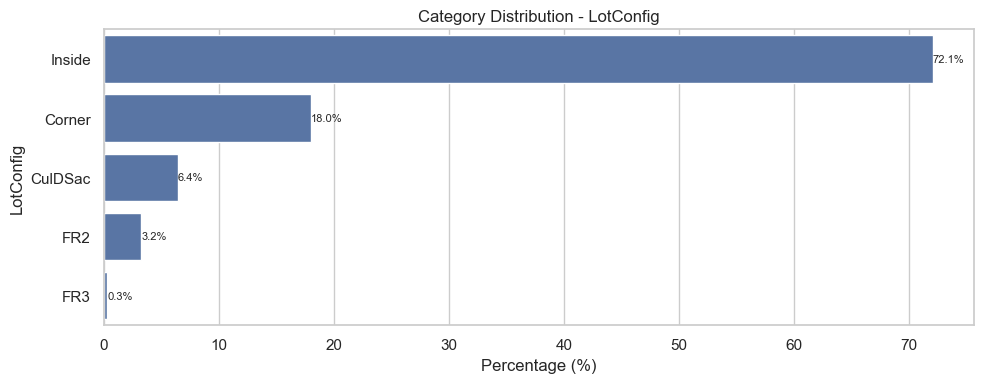

...

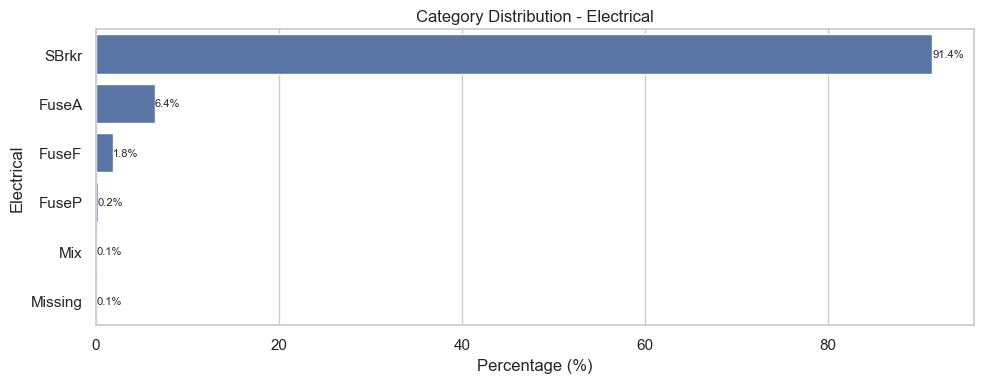

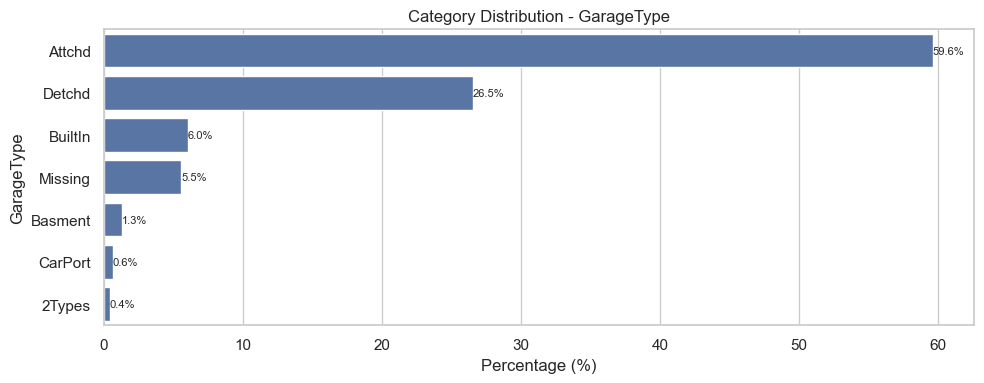

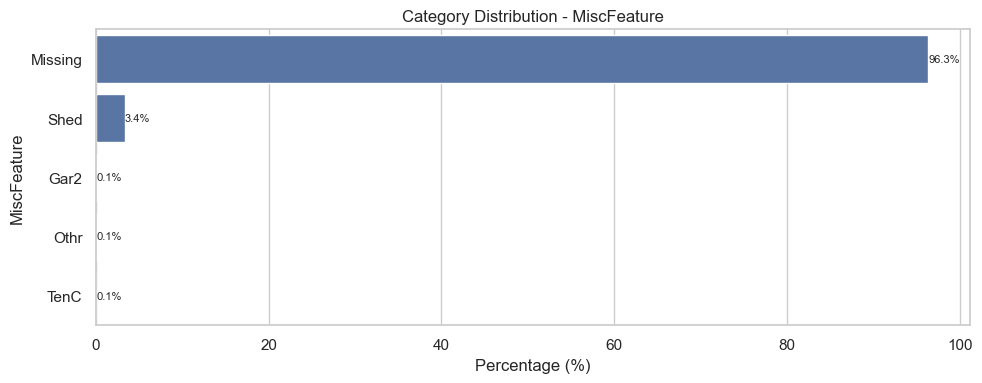

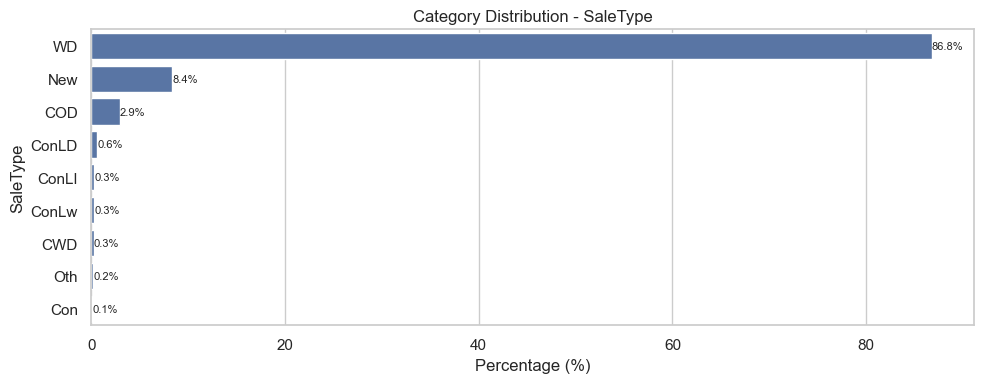

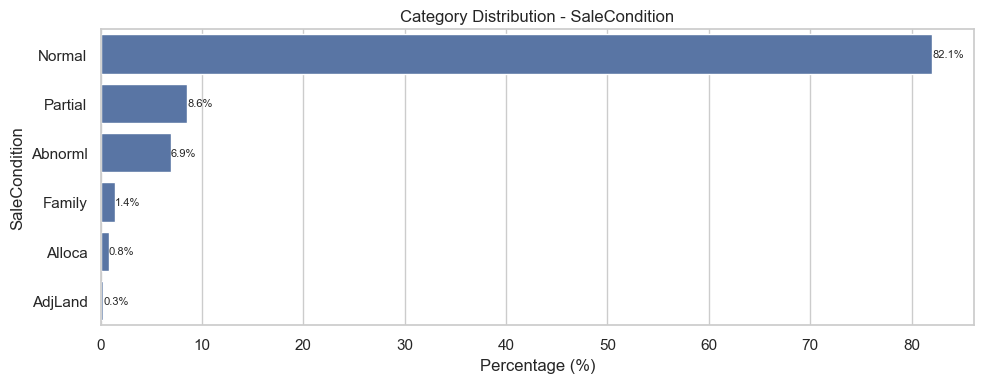

In [44]:
plot_category_percentages(
    train,
    nominal_categorical,
    "Category Distribution"
)

### 7.1.4 Rare Category Analysis — Nominal Features

In [45]:
rare_threshold = 1.0

nominal_rare_report = rare_category_report(
    train,
    nominal_categorical,
    threshold=rare_threshold
)

display(nominal_rare_report.round(2))

nominal_rare_count_summary = (
    nominal_rare_report
    .groupby("feature")
    .agg(
        rare_category_count=("category", "count"),
        total_rare_rows=("count", "sum"),
        total_rare_percentage=("percentage", "sum")
    )
    .reset_index()
    .sort_values(by="rare_category_count", ascending=False)
)

display(nominal_rare_count_summary.round(2))

,feature,category,count,percentage
65,Condition1,RRNe,2,0.1400
64,Condition1,RRNn,5,0.3400
63,Condition1,PosA,8,0.5500
62,Condition1,RRAe,11,0.7500
71,Condition2,PosA,1,0.0700
72,Condition2,RRAn,1,0.0700
73,Condition2,RRAe,1,0.0700
68,Condition2,Artery,2,0.1400
69,Condition2,RRNn,2,0.1400
70,Condition2,PosN,2,0.1400


,feature,rare_category_count,total_rare_rows,total_rare_percentage
1,Condition2,7,15,1.0300
14,RoofMatl,7,26,1.7800
17,SaleType,6,28,1.9200
4,Exterior2nd,6,27,1.8500
3,Exterior1st,5,7,0.4800
0,Condition1,4,26,1.7800
7,Heating,4,14,0.9600
15,RoofStyle,4,33,2.2600
8,HouseStyle,3,33,2.2600
2,Electrical,3,5,0.3400


### 7.1.5 Cardinality and Dominance — Nominal Features

In [46]:
nominal_top_summary = top_category_summary(nominal_freq_table)

nominal_cardinality_dominance = (
    nominal_basic_report
    [["feature", "unique_category", "cardinality_level", "top_category",
      "top_count", "top_percentage", "dominance_level"]]
    .sort_values(by="top_percentage", ascending=False)
)

display(nominal_cardinality_dominance.round(2))

,feature,unique_category,cardinality_level,top_category,top_count,top_percentage,dominance_level
7,Condition2,8,Medium,Norm,1445,98.9700,Very High
11,RoofMatl,8,Medium,CompShg,1434,98.2200,Very High
16,Heating,6,Medium,GasA,1428,97.8100,Very High
19,MiscFeature,5,Medium,Missing,1406,96.3000,Very High
2,Alley,3,Low,Missing,1369,93.7700,Very High
17,Electrical,6,Medium,SBrkr,1334,91.3700,Very High
3,LandContour,4,Medium,Lvl,1311,89.7900,High
20,SaleType,9,Medium,WD,1267,86.7800,High
6,Condition1,9,Medium,Norm,1260,86.3000,High
8,BldgType,5,Medium,1Fam,1220,83.5600,High


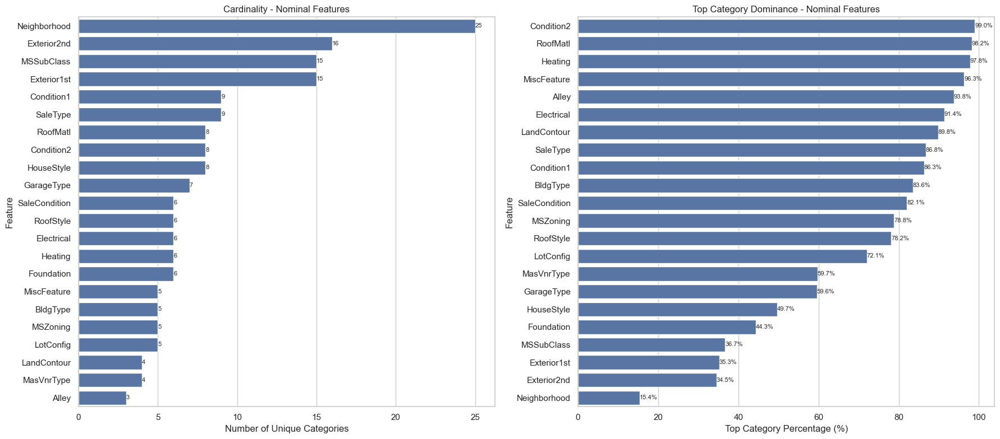

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

cardinality_plot_df = nominal_cardinality_dominance.sort_values(
    by="unique_category",
    ascending=False
)

ax1 = sns.barplot(
    data=cardinality_plot_df,
    x="unique_category",
    y="feature",
    ax=axes[0]
)

axes[0].set_title("Cardinality - Nominal Features")
axes[0].set_xlabel("Number of Unique Categories")
axes[0].set_ylabel("Feature")

for container in ax1.containers:
    ax1.bar_label(container, fontsize=8)

dominance_plot_df = nominal_cardinality_dominance.sort_values(
    by="top_percentage",
    ascending=False
)

ax2 = sns.barplot(
    data=dominance_plot_df,
    x="top_percentage",
    y="feature",
    ax=axes[1]
)

axes[1].set_title("Top Category Dominance - Nominal Features")
axes[1].set_xlabel("Top Category Percentage (%)")
axes[1].set_ylabel("Feature")

for container in ax2.containers:
    ax2.bar_label(container, fmt="%.1f%%", fontsize=8)

plt.tight_layout()
plt.show()

### 7.1.6 Nominal Categorical Decision

- Missing values in some nominal features may indicate absence of a facility.
- High-cardinality features need careful encoding later.
- Highly dominated features are kept for now.
- Rare categories are not removed in EDA.
- Rare categories may be grouped as `Other` later during preprocessing.
- `MSSubClass` should be treated as categorical, not continuous numeric.

## 7.2 Ordinal Categorical Features

Ordinal categorical features contain categories with meaningful order/rank.

This section checks:

- missing values
- frequency and percentage
- ordinal mapping
- rare categories
- dominance

In [48]:
ordinal_categorical_basic = categorical_basic_report(train, ordinal_categorical)
display(ordinal_categorical_basic.round(2))

,feature,missing_value,missing_percentage,unique_category,repeated_value,repeated_percentage,top_category,top_count,top_percentage,cardinality_level,dominance_level
0,LotShape,0,0.0000,4,1456,99.7300,Reg,925,63.3600,Medium,Moderate
1,Utilities,0,0.0000,2,1458,99.8600,AllPub,1459,99.9300,Low,Very High
2,LandSlope,0,0.0000,3,1457,99.7900,Gtl,1382,94.6600,Low,Very High
3,ExterQual,0,0.0000,4,1456,99.7300,TA,906,62.0500,Medium,Moderate
4,ExterCond,0,0.0000,5,1455,99.6600,TA,1282,87.8100,Medium,High
5,BsmtQual,37,2.5300,5,1455,99.6600,TA,649,44.4500,Medium,Low
6,BsmtCond,37,2.5300,5,1455,99.6600,TA,1311,89.7900,Medium,High
7,BsmtExposure,38,2.6000,5,1455,99.6600,No,953,65.2700,Medium,Moderate
8,BsmtFinType1,37,2.5300,7,1453,99.5200,Unf,430,29.4500,Medium,Low
9,BsmtFinType2,38,2.6000,7,1453,99.5200,Unf,1256,86.0300,Medium,High


### 7.2.1 Missing Value Analysis — Ordinal Features

,feature,missing_value,missing_percentage
18,PoolQC,1453,99.5200
19,Fence,1179,80.7500
13,FireplaceQu,690,47.2600
14,GarageFinish,81,5.5500
15,GarageQual,81,5.5500
16,GarageCond,81,5.5500
7,BsmtExposure,38,2.6000
9,BsmtFinType2,38,2.6000
5,BsmtQual,37,2.5300
6,BsmtCond,37,2.5300


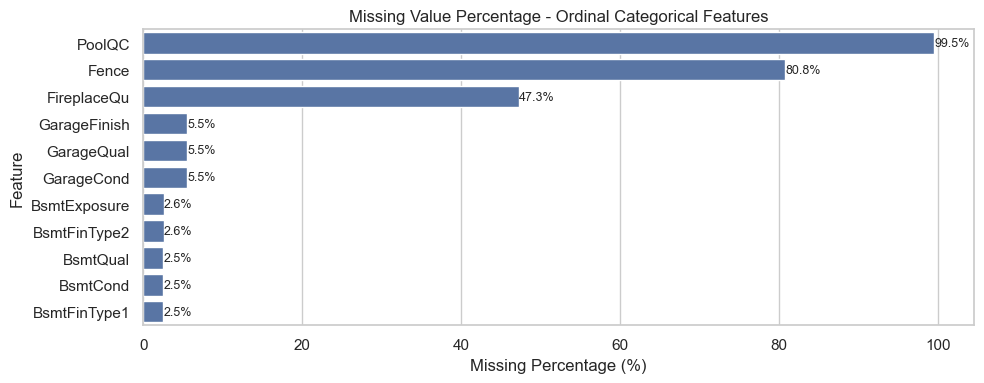

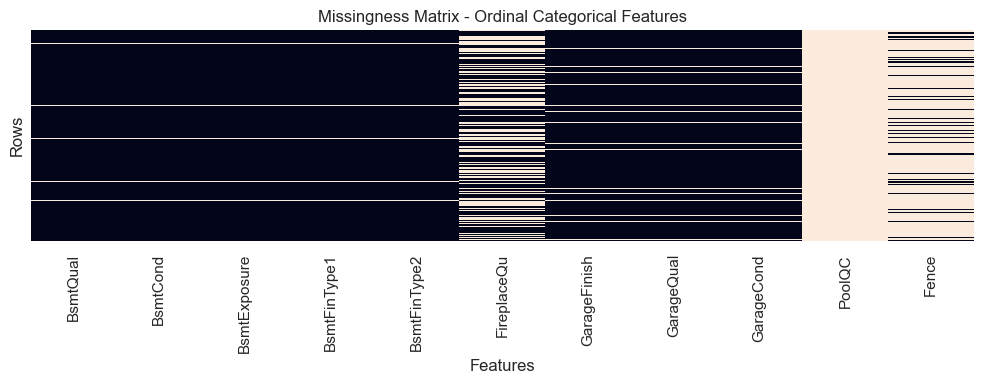

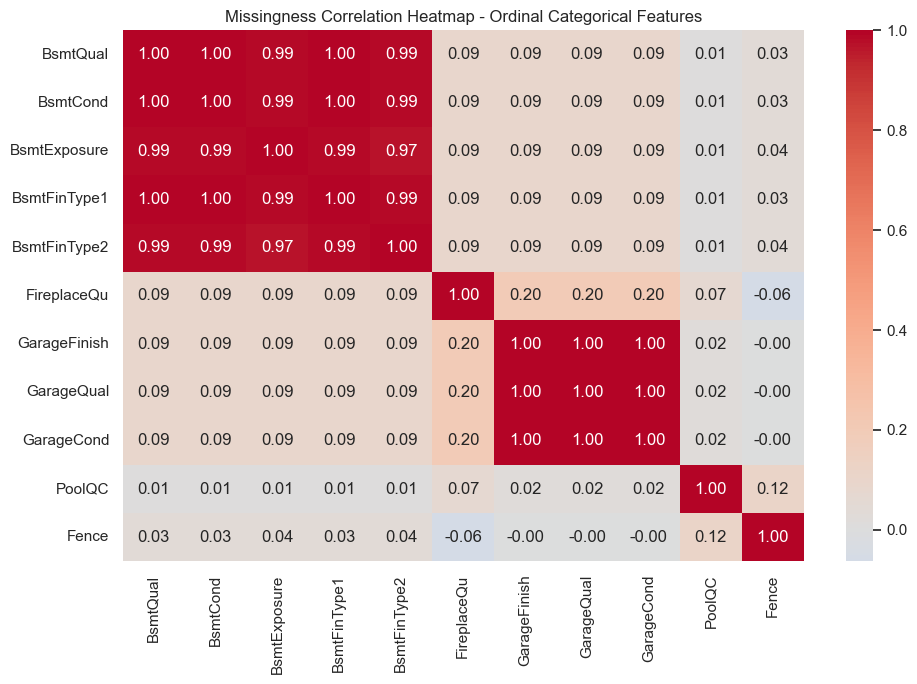

In [49]:
ordinal_missing_summary = missing_summary(train, ordinal_categorical)
display(ordinal_missing_summary.round(2))

plot_missing_bar(
    train,
    ordinal_categorical,
    "Missing Value Percentage - Ordinal Categorical Features"
)

plot_missing_matrix(
    train,
    ordinal_categorical,
    "Missingness Matrix - Ordinal Categorical Features"
)

plot_missing_corr(
    train,
    ordinal_categorical,
    "Missingness Correlation Heatmap - Ordinal Categorical Features"
)

### 7.2.2 Frequency and Percentage Table — Ordinal Features

In [50]:
ordinal_freq_table = frequency_table(train, ordinal_categorical, include_missing=True)
display(ordinal_freq_table.round(2))

,feature,rank,category,count,percentage,cumulative_count,cumulative_percentage
0,LotShape,1,Reg,925,63.3600,925,63.3600
1,LotShape,2,IR1,484,33.1500,1409,96.5100
2,LotShape,3,IR2,41,2.8100,1450,99.3200
3,LotShape,4,IR3,10,0.6800,1460,100.0000
4,Utilities,1,AllPub,1459,99.9300,1459,99.9300
5,Utilities,2,NoSeWa,1,0.0700,1460,100.0000
6,LandSlope,1,Gtl,1382,94.6600,1382,94.6600
7,LandSlope,2,Mod,65,4.4500,1447,99.1100
8,LandSlope,3,Sev,13,0.8900,1460,100.0000
9,ExterQual,1,TA,906,62.0500,906,62.0500


### 7.2.3 Category Percentage Plots — Ordinal Features

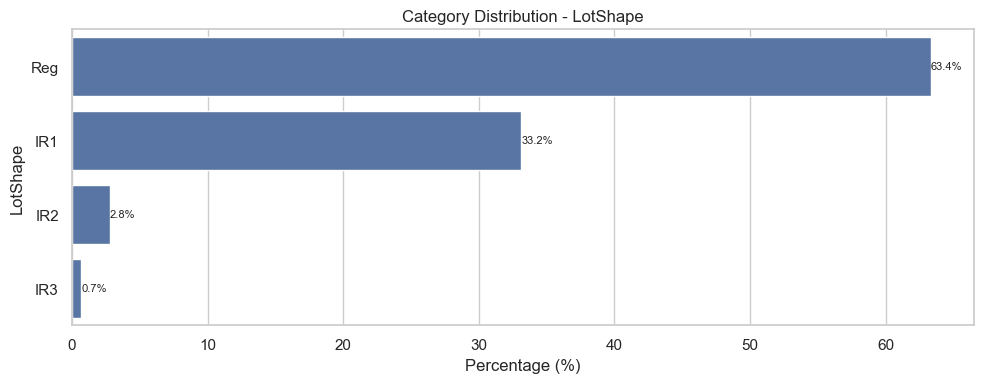

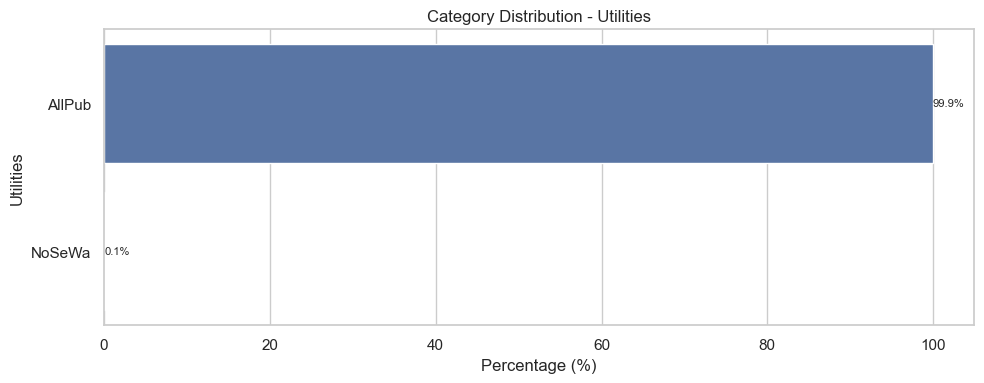

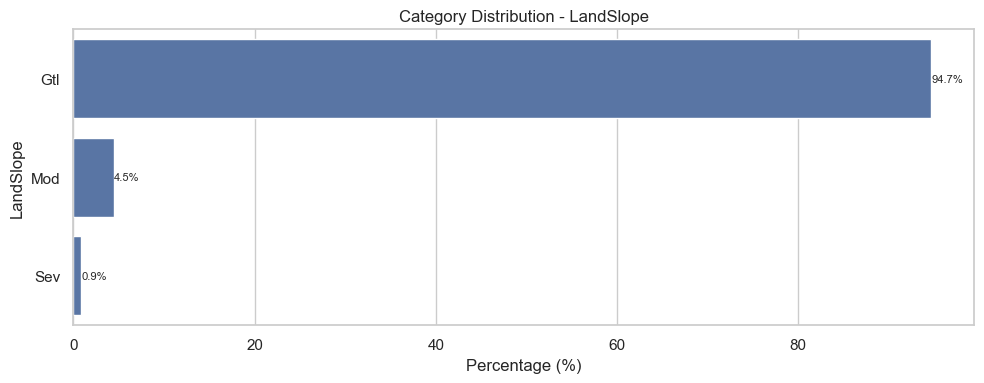

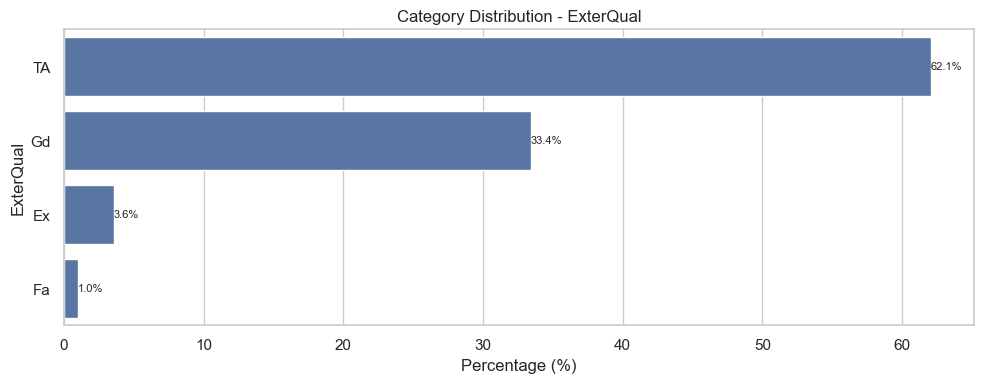

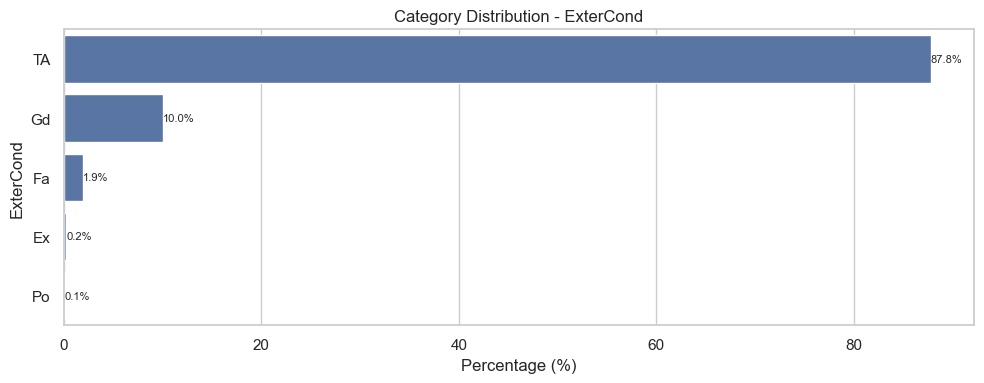

...

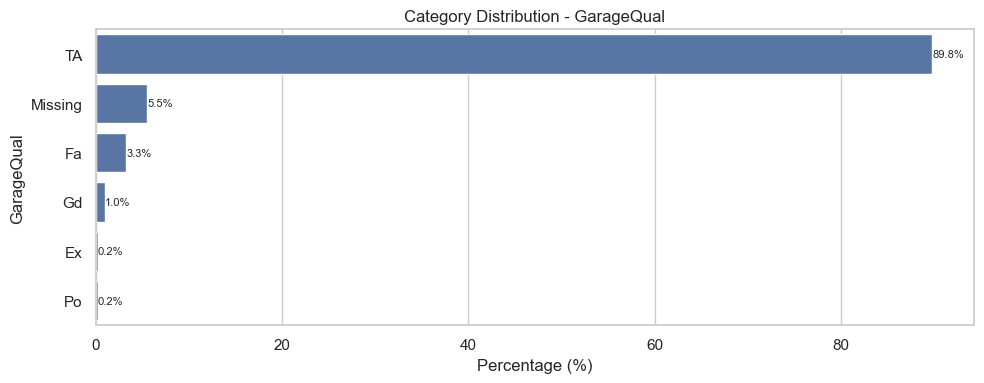

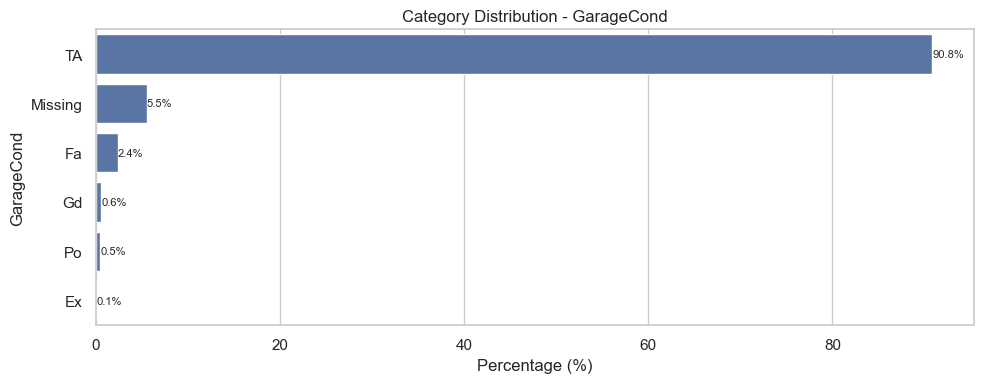

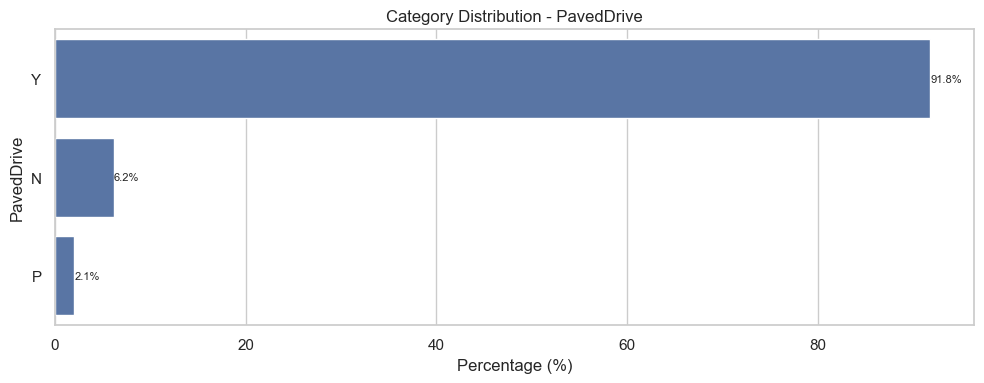

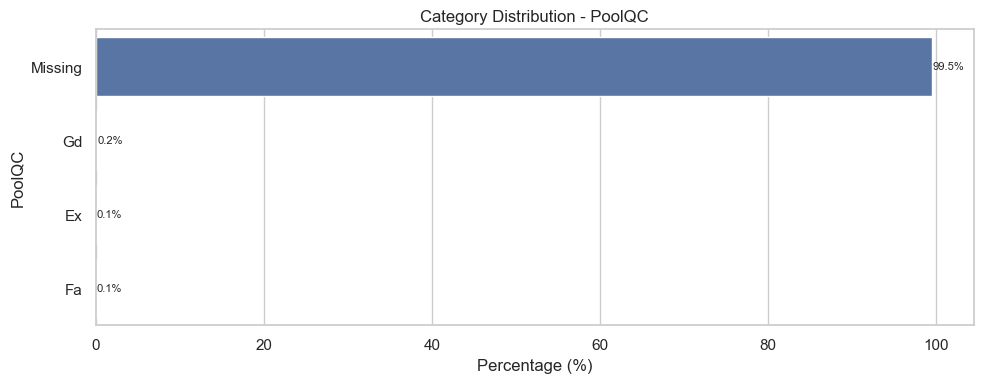

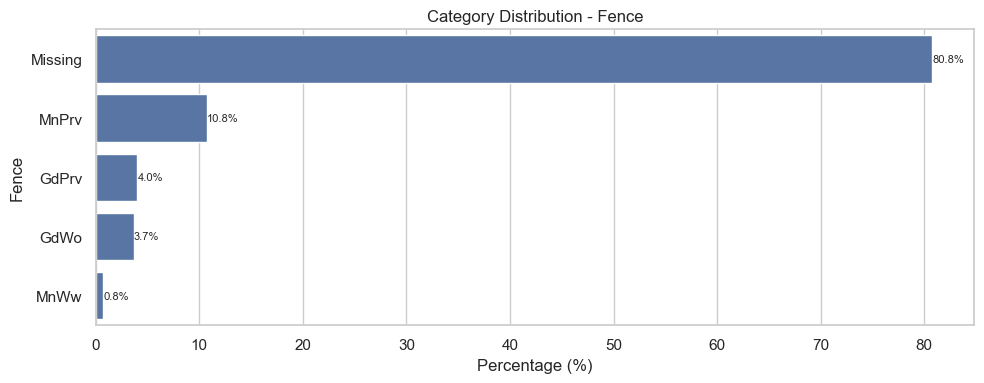

In [51]:
plot_category_percentages(
    train,
    ordinal_categorical,
    "Category Distribution"
)

### 7.2.4 Ordinal Mapping Check

Mappings are documented here only.  
No encoding is applied in this EDA step.

In [52]:
quality_order = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Missing": 0}
bsmt_exposure_order = {"Gd": 4, "Av": 3, "Mn": 2, "No": 1, "Missing": 0}
bsmt_fin_type_order = {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "Missing": 0}
lot_shape_order = {"Reg": 4, "IR1": 3, "IR2": 2, "IR3": 1}
utilities_order = {"AllPub": 4, "NoSewr": 3, "NoSeWa": 2, "ELO": 1}
land_slope_order = {"Gtl": 3, "Mod": 2, "Sev": 1}
functional_order = {"Typ": 8, "Min1": 7, "Min2": 6, "Mod": 5, "Maj1": 4, "Maj2": 3, "Sev": 2, "Sal": 1}
garage_finish_order = {"Fin": 3, "RFn": 2, "Unf": 1, "Missing": 0}
paved_drive_order = {"Y": 2, "P": 1, "N": 0}
fence_order = {"GdPrv": 4, "MnPrv": 3, "GdWo": 2, "MnWw": 1, "Missing": 0}

ordinal_mapping_plan = {
    "LotShape": lot_shape_order,
    "Utilities": utilities_order,
    "LandSlope": land_slope_order,

    "ExterQual": quality_order,
    "ExterCond": quality_order,
    "BsmtQual": quality_order,
    "BsmtCond": quality_order,
    "HeatingQC": quality_order,
    "KitchenQual": quality_order,
    "FireplaceQu": quality_order,
    "GarageQual": quality_order,
    "GarageCond": quality_order,
    "PoolQC": quality_order,

    "BsmtExposure": bsmt_exposure_order,
    "BsmtFinType1": bsmt_fin_type_order,
    "BsmtFinType2": bsmt_fin_type_order,
    "Functional": functional_order,
    "GarageFinish": garage_finish_order,
    "PavedDrive": paved_drive_order,
    "Fence": fence_order,
}

mapping_summary = []

for feature, mapping in ordinal_mapping_plan.items():
    ordered_categories = [
        str(k) for k, v in sorted(mapping.items(), key=lambda item: item[1], reverse=True)
    ]

    mapping_summary.append({
        "feature": feature,
        "mapping_order": " > ".join(ordered_categories),
        "min_score": min(mapping.values()),
        "max_score": max(mapping.values())
    })

ordinal_mapping_summary = pd.DataFrame(mapping_summary)
display(ordinal_mapping_summary)

,feature,mapping_order,min_score,max_score
0,LotShape,Reg > IR1 > IR2 > IR3,1,4
1,Utilities,AllPub > NoSewr > NoSeWa > ELO,1,4
2,LandSlope,Gtl > Mod > Sev,1,3
3,ExterQual,Ex > Gd > TA > Fa > Po > Missing,0,5
4,ExterCond,Ex > Gd > TA > Fa > Po > Missing,0,5
5,BsmtQual,Ex > Gd > TA > Fa > Po > Missing,0,5
6,BsmtCond,Ex > Gd > TA > Fa > Po > Missing,0,5
7,HeatingQC,Ex > Gd > TA > Fa > Po > Missing,0,5
8,KitchenQual,Ex > Gd > TA > Fa > Po > Missing,0,5
9,FireplaceQu,Ex > Gd > TA > Fa > Po > Missing,0,5


### 7.2.5 Rare Category and Dominance — Ordinal Features

In [53]:
ordinal_rare_report = rare_category_report(
    train,
    ordinal_categorical,
    threshold=rare_threshold
)

display(ordinal_rare_report.round(2))

ordinal_rare_count_summary = (
    ordinal_rare_report
    .groupby("feature")
    .agg(
        rare_category_count=("category", "count"),
        total_rare_rows=("count", "sum"),
        total_rare_percentage=("percentage", "sum")
    )
    .reset_index()
    .sort_values(by="rare_category_count", ascending=False)
)

display(ordinal_rare_count_summary.round(2))

ordinal_dominance_summary = top_category_summary(ordinal_freq_table)
ordinal_dominance_summary["dominance_level"] = ordinal_dominance_summary["top_percentage"].apply(dominance_level)

display(ordinal_dominance_summary.round(2))

,feature,category,count,percentage
27,BsmtCond,Po,2,0.1400
46,BsmtFinType2,GLQ,14,0.9600
17,ExterCond,Po,1,0.0700
16,ExterCond,Ex,3,0.2100
12,ExterQual,Fa,14,0.9600
96,Fence,MnWw,11,0.7500
62,Functional,Sev,1,0.0700
61,Functional,Maj2,5,0.3400
60,Functional,Maj1,14,0.9600
84,GarageCond,Ex,2,0.1400


,feature,rare_category_count,total_rare_rows,total_rare_percentage
5,Functional,3,20,1.3700
11,PoolQC,3,7,0.4800
7,GarageQual,3,20,1.3700
6,GarageCond,3,18,1.2300
2,ExterCond,2,4,0.2700
4,Fence,1,11,0.7500
3,ExterQual,1,14,0.9600
1,BsmtFinType2,1,14,0.9600
0,BsmtCond,1,2,0.1400
8,HeatingQC,1,1,0.0700


,feature,top_category,top_count,top_percentage,dominance_level
4,Utilities,AllPub,1459,99.9300,Very High
88,PoolQC,Missing,1453,99.5200,Very High
6,LandSlope,Gtl,1382,94.6600,Very High
56,Functional,Typ,1360,93.1500,Very High
85,PavedDrive,Y,1340,91.7800,Very High
79,GarageCond,TA,1326,90.8200,Very High
23,BsmtCond,TA,1311,89.7900,High
73,GarageQual,TA,1311,89.7900,High
13,ExterCond,TA,1282,87.8100,High
40,BsmtFinType2,Unf,1256,86.0300,High


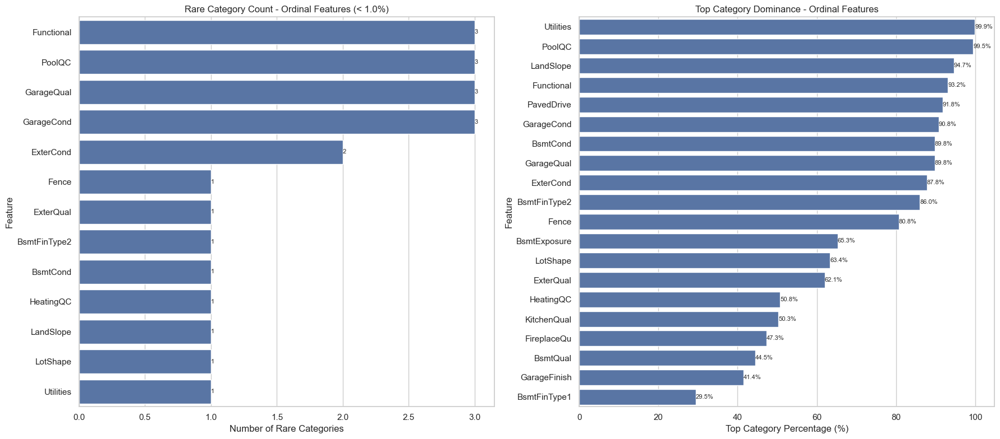

In [54]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

rare_plot_df = ordinal_rare_count_summary.sort_values(
    by="rare_category_count",
    ascending=False
)

if not rare_plot_df.empty:
    ax1 = sns.barplot(
        data=rare_plot_df,
        x="rare_category_count",
        y="feature",
        ax=axes[0]
    )
    axes[0].set_title(f"Rare Category Count - Ordinal Features (< {rare_threshold}%)")
    axes[0].set_xlabel("Number of Rare Categories")
    axes[0].set_ylabel("Feature")

    for container in ax1.containers:
        ax1.bar_label(container, fontsize=8)
else:
    axes[0].text(0.5, 0.5, "No rare categories found", ha="center", va="center")
    axes[0].axis("off")

dominance_plot_df = ordinal_dominance_summary.sort_values(
    by="top_percentage",
    ascending=False
)

ax2 = sns.barplot(
    data=dominance_plot_df,
    x="top_percentage",
    y="feature",
    ax=axes[1]
)

axes[1].set_title("Top Category Dominance - Ordinal Features")
axes[1].set_xlabel("Top Category Percentage (%)")
axes[1].set_ylabel("Feature")

for container in ax2.containers:
    ax2.bar_label(container, fmt="%.1f%%", fontsize=8)

plt.tight_layout()
plt.show()

### 7.2.6 Ordinal Categorical Decision

- Ordinal category order must be preserved later.
- Missing values in facility-related ordinal features should be treated as meaningful absence.
- Do not blindly fill missing values with mode.
- Rare categories are kept in EDA.
- Highly dominated features are kept for now.
- Later preprocessing should use ordinal encoding based on proper category order.

## 7.3 Binary Categorical Features

Binary categorical features contain two main categories.

This section checks:

- missing values
- category frequency
- percentage distribution
- imbalance

In [55]:
binary_basic_report = categorical_basic_report(train, binary_categorical)
display(binary_basic_report.round(2))

,feature,missing_value,missing_percentage,unique_category,repeated_value,repeated_percentage,top_category,top_count,top_percentage,cardinality_level,dominance_level
0,Street,0,0.0000,2,1458,99.8600,Pave,1454,99.5900,Low,Very High
1,CentralAir,0,0.0000,2,1458,99.8600,Y,1365,93.4900,Low,Very High


### 7.3.1 Frequency and Percentage Table — Binary Features

In [56]:
binary_freq_table = frequency_table(train, binary_categorical, include_missing=True)
display(binary_freq_table.round(2))

,feature,rank,category,count,percentage,cumulative_count,cumulative_percentage
0,Street,1,Pave,1454,99.5900,1454,99.5900
1,Street,2,Grvl,6,0.4100,1460,100.0000
2,CentralAir,1,Y,1365,93.4900,1365,93.4900
3,CentralAir,2,N,95,6.5100,1460,100.0000


### 7.3.2 Count and Percentage Plots — Binary Features

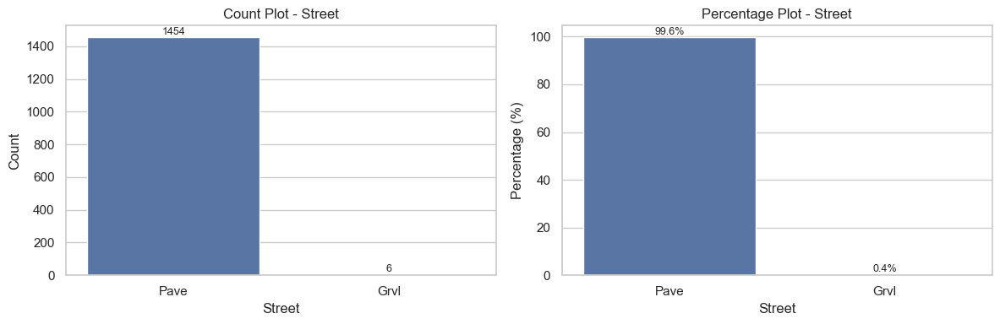

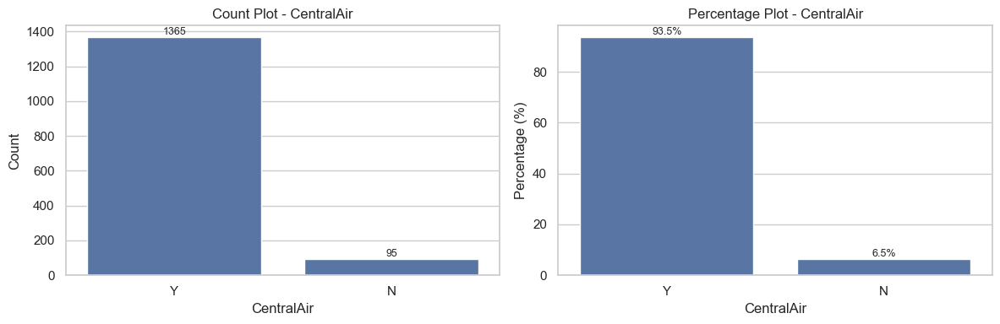

In [57]:
for feature in binary_categorical:
    series = train[feature].astype("object").where(train[feature].notna(), "Missing")
    plot_df = series.value_counts(dropna=False).reset_index()
    plot_df.columns = ["category", "count"]
    plot_df["percentage"] = plot_df["count"] / len(train) * 100

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    ax1 = sns.barplot(data=plot_df, x="category", y="count", ax=axes[0])
    axes[0].set_title(f"Count Plot - {feature}")
    axes[0].set_xlabel(feature)
    axes[0].set_ylabel("Count")

    for container in ax1.containers:
        ax1.bar_label(container, fontsize=9)

    ax2 = sns.barplot(data=plot_df, x="category", y="percentage", ax=axes[1])
    axes[1].set_title(f"Percentage Plot - {feature}")
    axes[1].set_xlabel(feature)
    axes[1].set_ylabel("Percentage (%)")

    for container in ax2.containers:
        ax2.bar_label(container, fmt="%.1f%%", fontsize=9)

    plt.tight_layout()
    plt.show()

### 7.3.3 Binary Categorical Decision

- Binary categorical features are clean.
- Repeated values are expected.
- Highly imbalanced binary features are not removed during EDA.
- No missing value treatment is needed if no missing values are found.
- Later preprocessing can encode these features as binary numeric values.

# 8. Bivariate Analysis

In this section, I analyze the relationship between each feature and the target variable `SalePrice`.

The goal is to identify:

- strong predictors
- weak predictors
- linear or monotonic relationships
- grouped/category-based target behavior
- sparse or rare feature signals
- possible feature engineering opportunities

This section uses both:

- original `SalePrice`
- log-transformed `SalePrice`

## 8.0 Target Setup for Bivariate Analysis

Because `SalePrice` is right-skewed, I create a log-transformed target version.

The original target will be used for interpretation.  
The log-transformed target will be useful for correlation and modeling-friendly analysis.

In [58]:
# Target setup for bivariate analysis

target = "SalePrice"

train["SalePrice_log"] = np.log1p(train[target])

target_versions = {
    "raw_target": "SalePrice",
    "log_target": "SalePrice_log"
}

display(train[[target, "SalePrice_log"]].head())

,SalePrice,SalePrice_log
0,208500,12.2477
1,181500,12.1090
2,223500,12.3172
3,140000,11.8494
4,250000,12.4292


## 8.1 Bivariate Basic Report

This report gives a quick feature-target relationship summary.

For each feature, I check:

- feature type
- valid feature-target pair count
- missing value count
- missing percentage
- unique value count
- relationship type
- relationship strength
- action hint

For numeric features, Pearson and Spearman correlations are calculated.  
For categorical features, eta-squared is calculated to estimate how much target variance is explained by category groups.

In [59]:
import numpy as np
import pandas as pd
from scipy import stats

In [60]:
def relationship_strength_label(value):
    """
    Strength label based on absolute relationship score.
    Works for correlation or eta-squared-like values.
    """
    value = abs(value)

    if value >= 0.70:
        return "Very Strong"
    elif value >= 0.50:
        return "Strong"
    elif value >= 0.30:
        return "Medium"
    elif value >= 0.10:
        return "Weak"
    else:
        return "Very Weak"


def direction_label(value):
    if pd.isna(value):
        return "Not Applicable"

    if value > 0:
        return "Positive"
    elif value < 0:
        return "Negative"
    else:
        return "No Direction"


def eta_squared_categorical_target(df, feature, target):
    """
    Eta-squared for categorical feature vs numeric target.
    Measures how much target variance is explained by groups.
    """
    temp = df[[feature, target]].dropna().copy()

    if temp[feature].nunique() <= 1:
        return np.nan

    overall_mean = temp[target].mean()

    groups = temp.groupby(feature)[target]

    ss_between = sum(
        len(group) * (group.mean() - overall_mean) ** 2
        for _, group in groups
    )

    ss_total = sum((temp[target] - overall_mean) ** 2)

    if ss_total == 0:
        return np.nan

    return ss_between / ss_total


def action_hint(feature_type, strength, missing_percentage, unique_count):
    """
    Simple initial action hint.
    Final decision will be updated after detailed plots.
    """
    if missing_percentage > 80:
        return "Review missingness / possible flag"

    if strength in ["Very Strong", "Strong"]:
        return "Keep / prioritize"

    if strength == "Medium":
        return "Keep / inspect plots"

    if feature_type in ["Nominal Categorical", "Ordinal Categorical"] and unique_count > 15:
        return "Review encoding"

    if strength in ["Weak", "Very Weak"]:
        return "Review later"

    return "Keep for now"

In [61]:
def get_feature_type(feature):
    if feature in continuous_numeric:
        return "Continuous Numeric"
    elif feature in count_numeric:
        return "Count Numeric"
    elif feature in ordinal_numeric:
        return "Ordinal Numeric"
    elif feature in temporal_features:
        return "Temporal"
    elif feature in nominal_categorical:
        return "Nominal Categorical"
    elif feature in ordinal_categorical:
        return "Ordinal Categorical"
    elif feature in binary_categorical:
        return "Binary Categorical"
    else:
        return "Unknown"

In [62]:
def create_bivariate_basic_report(df, features, target):
    report = []

    total_rows = len(df)

    for feature in features:
        feature_type = get_feature_type(feature)

        valid_pair_count = df[[feature, target]].dropna().shape[0]

        missing_count = df[feature].isnull().sum()
        missing_percentage = (missing_count / total_rows) * 100

        unique_count = df[feature].nunique(dropna=False)

        pearson_corr = np.nan
        spearman_corr = np.nan
        eta_squared = np.nan
        main_score = np.nan
        relationship_type = None
        direction = None

        if feature_type in [
            "Continuous Numeric",
            "Count Numeric",
            "Ordinal Numeric",
            "Temporal"
        ]:
            temp = df[[feature, target]].dropna()

            if temp[feature].nunique() > 1:
                pearson_corr = temp[feature].corr(temp[target], method="pearson")
                spearman_corr = temp[feature].corr(temp[target], method="spearman")

                # Spearman is useful for monotonic relation
                main_score = spearman_corr

                relationship_type = "Numeric-Target"
                direction = direction_label(spearman_corr)

        elif feature_type in [
            "Nominal Categorical",
            "Ordinal Categorical",
            "Binary Categorical"
        ]:
            eta_squared = eta_squared_categorical_target(df, feature, target)
            main_score = eta_squared

            relationship_type = "Categorical-Target"
            direction = "Grouped"

        else:
            relationship_type = "Unknown"
            direction = "Unknown"

        strength = relationship_strength_label(main_score)

        report.append({
            "feature": feature,
            "feature_type": feature_type,
            "relationship_type": relationship_type,
            "valid_pair_count": valid_pair_count,
            "missing_value": missing_count,
            "missing_percentage": missing_percentage,
            "unique_value": unique_count,
            "pearson_corr": pearson_corr,
            "spearman_corr": spearman_corr,
            "eta_squared": eta_squared,
            "main_score": main_score,
            "relationship_strength": strength,
            "direction": direction,
            "action_hint": action_hint(
                feature_type=feature_type,
                strength=strength,
                missing_percentage=missing_percentage,
                unique_count=unique_count
            )
        })

    report_df = pd.DataFrame(report)

    return report_df

In [63]:
bivariate_basic_report_raw = create_bivariate_basic_report(
    df=train,
    features=input_features,
    target="SalePrice"
)

display(
    bivariate_basic_report_raw
    .sort_values(by="main_score", key=lambda x: x.abs(), ascending=False)
    .round(4)
)

,feature,feature_type,relationship_type,valid_pair_count,missing_value,missing_percentage,unique_value,pearson_corr,spearman_corr,eta_squared,main_score,relationship_strength,direction,action_hint
72,OverallQual,Ordinal Numeric,Numeric-Target,1460,0,0.0000,10,0.7910,0.8098,NaN,0.8098,Very Strong,Positive,Keep / prioritize
54,GrLivArea,Continuous Numeric,Numeric-Target,1460,0,0.0000,861,0.7086,0.7313,NaN,0.7313,Very Strong,Positive,Keep / prioritize
71,GarageCars,Count Numeric,Numeric-Target,1460,0,0.0000,5,0.6404,0.6907,NaN,0.6907,Strong,Positive,Keep / prioritize
74,YearBuilt,Temporal,Numeric-Target,1460,0,0.0000,112,0.5229,0.6527,NaN,0.6527,Strong,Positive,Keep / prioritize
55,GarageArea,Continuous Numeric,Numeric-Target,1460,0,0.0000,441,0.6234,0.6494,NaN,0.6494,Strong,Positive,Keep / prioritize
65,FullBath,Count Numeric,Numeric-Target,1460,0,0.0000,4,0.5607,0.6360,NaN,0.6360,Strong,Positive,Keep / prioritize
50,TotalBsmtSF,Continuous Numeric,Numeric-Target,1460,0,0.0000,721,0.6136,0.6027,NaN,0.6027,Strong,Positive,Keep / prioritize
76,GarageYrBlt,Temporal,Numeric-Target,1379,81,5.5479,98,0.4864,0.5938,NaN,0.5938,Strong,Positive,Keep / prioritize
51,1stFlrSF,Continuous Numeric,Numeric-Target,1460,0,0.0000,753,0.6059,0.5754,NaN,0.5754,Strong,Positive,Keep / prioritize
75,YearRemodAdd,Temporal,Numeric-Target,1460,0,0.0000,61,0.5071,0.5712,NaN,0.5712,Strong,Positive,Keep / prioritize


In [64]:
bivariate_basic_report_log = create_bivariate_basic_report(
    df=train,
    features=input_features,
    target="SalePrice_log"
)

display(
    bivariate_basic_report_log
    .sort_values(by="main_score", key=lambda x: x.abs(), ascending=False)
    .round(4)
)

,feature,feature_type,relationship_type,valid_pair_count,missing_value,missing_percentage,unique_value,pearson_corr,spearman_corr,eta_squared,main_score,relationship_strength,direction,action_hint
72,OverallQual,Ordinal Numeric,Numeric-Target,1460,0,0.0000,10,0.8172,0.8098,NaN,0.8098,Very Strong,Positive,Keep / prioritize
54,GrLivArea,Continuous Numeric,Numeric-Target,1460,0,0.0000,861,0.7009,0.7313,NaN,0.7313,Very Strong,Positive,Keep / prioritize
71,GarageCars,Count Numeric,Numeric-Target,1460,0,0.0000,5,0.6806,0.6907,NaN,0.6907,Strong,Positive,Keep / prioritize
74,YearBuilt,Temporal,Numeric-Target,1460,0,0.0000,112,0.5866,0.6527,NaN,0.6527,Strong,Positive,Keep / prioritize
55,GarageArea,Continuous Numeric,Numeric-Target,1460,0,0.0000,441,0.6509,0.6494,NaN,0.6494,Strong,Positive,Keep / prioritize
65,FullBath,Count Numeric,Numeric-Target,1460,0,0.0000,4,0.5948,0.6360,NaN,0.6360,Strong,Positive,Keep / prioritize
50,TotalBsmtSF,Continuous Numeric,Numeric-Target,1460,0,0.0000,721,0.6121,0.6027,NaN,0.6027,Strong,Positive,Keep / prioritize
76,GarageYrBlt,Temporal,Numeric-Target,1379,81,5.5479,98,0.5411,0.5938,NaN,0.5938,Strong,Positive,Keep / prioritize
51,1stFlrSF,Continuous Numeric,Numeric-Target,1460,0,0.0000,753,0.5970,0.5754,NaN,0.5754,Strong,Positive,Keep / prioritize
75,YearRemodAdd,Temporal,Numeric-Target,1460,0,0.0000,61,0.5656,0.5712,NaN,0.5712,Strong,Positive,Keep / prioritize


### Top Bivariate Signals

This table shows the strongest initial feature-target relationships using `SalePrice_log`.

For numeric features, the main score is Spearman correlation.  
For categorical features, the main score is eta-squared.

In [65]:
top_bivariate_signals = (
    bivariate_basic_report_log
    .sort_values(by="main_score", key=lambda x: x.abs(), ascending=False)
    .head(25)
)

display(top_bivariate_signals.round(4))

,feature,feature_type,relationship_type,valid_pair_count,missing_value,missing_percentage,unique_value,pearson_corr,spearman_corr,eta_squared,main_score,relationship_strength,direction,action_hint
72,OverallQual,Ordinal Numeric,Numeric-Target,1460,0,0.0000,10,0.8172,0.8098,NaN,0.8098,Very Strong,Positive,Keep / prioritize
54,GrLivArea,Continuous Numeric,Numeric-Target,1460,0,0.0000,861,0.7009,0.7313,NaN,0.7313,Very Strong,Positive,Keep / prioritize
71,GarageCars,Count Numeric,Numeric-Target,1460,0,0.0000,5,0.6806,0.6907,NaN,0.6907,Strong,Positive,Keep / prioritize
74,YearBuilt,Temporal,Numeric-Target,1460,0,0.0000,112,0.5866,0.6527,NaN,0.6527,Strong,Positive,Keep / prioritize
55,GarageArea,Continuous Numeric,Numeric-Target,1460,0,0.0000,441,0.6509,0.6494,NaN,0.6494,Strong,Positive,Keep / prioritize
65,FullBath,Count Numeric,Numeric-Target,1460,0,0.0000,4,0.5948,0.6360,NaN,0.6360,Strong,Positive,Keep / prioritize
50,TotalBsmtSF,Continuous Numeric,Numeric-Target,1460,0,0.0000,721,0.6121,0.6027,NaN,0.6027,Strong,Positive,Keep / prioritize
76,GarageYrBlt,Temporal,Numeric-Target,1379,81,5.5479,98,0.5411,0.5938,NaN,0.5938,Strong,Positive,Keep / prioritize
51,1stFlrSF,Continuous Numeric,Numeric-Target,1460,0,0.0000,753,0.5970,0.5754,NaN,0.5754,Strong,Positive,Keep / prioritize
75,YearRemodAdd,Temporal,Numeric-Target,1460,0,0.0000,61,0.5656,0.5712,NaN,0.5712,Strong,Positive,Keep / prioritize


### Bivariate Basic Report Decision

This report is only an initial screening.

Strong features will be analyzed deeply with plots.  
Weak features will not be removed immediately.

Next, I will analyze feature groups one by one:

1. Continuous numeric vs target
2. Count numeric vs target
3. Ordinal numeric vs target
4. Temporal features vs target
5. Nominal categorical vs target
6. Ordinal categorical vs target
7. Binary categorical vs target

In [66]:
bivariate_group_summary = (
    bivariate_basic_report_log
    .groupby("feature_type")
    .agg(
        feature_count=("feature", "count"),
        avg_abs_main_score=("main_score", lambda x: x.abs().mean()),
        max_abs_main_score=("main_score", lambda x: x.abs().max()),
        missing_features=("missing_value", lambda x: (x > 0).sum())
    )
    .reset_index()
    .sort_values(by="max_abs_main_score", ascending=False)
)

display(bivariate_group_summary.round(4))

,feature_type,feature_count,avg_abs_main_score,max_abs_main_score,missing_features
5,Ordinal Numeric,2,0.4696,0.8098,0
1,Continuous Numeric,19,0.3194,0.7313,2
2,Count Numeric,9,0.3732,0.6907,0
6,Temporal,5,0.3834,0.6527,1
3,Nominal Categorical,22,0.1433,0.5708,5
4,Ordinal Categorical,20,0.1635,0.4611,11
0,Binary Categorical,2,0.0635,0.1236,0


## 8.2 Continuous Numeric vs Target

In this section, I analyze the relationship between continuous numerical features and the target variable.

The main goals are:

- identify strong continuous predictors,
- compare Pearson and Spearman correlation,
- detect linear or monotonic trends,
- inspect nonlinear patterns,
- check zero vs non-zero target behavior for sparse features,
- identify possible feature engineering opportunities.

For interpretation, I use `SalePrice`.  
For correlation and trend stability, I also use `SalePrice_log`.

In [67]:
continuous_target_corr = []

for feature in continuous_numeric:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].dropna()

    pearson_raw = temp[feature].corr(temp["SalePrice"], method="pearson")
    spearman_raw = temp[feature].corr(temp["SalePrice"], method="spearman")

    pearson_log = temp[feature].corr(temp["SalePrice_log"], method="pearson")
    spearman_log = temp[feature].corr(temp["SalePrice_log"], method="spearman")

    continuous_target_corr.append({
        "feature": feature,
        "valid_pair_count": len(temp),
        "pearson_saleprice": pearson_raw,
        "spearman_saleprice": spearman_raw,
        "pearson_log_saleprice": pearson_log,
        "spearman_log_saleprice": spearman_log,
        "abs_spearman_log": abs(spearman_log)
    })

continuous_target_corr = pd.DataFrame(continuous_target_corr)

display(
    continuous_target_corr
    .sort_values(by="abs_spearman_log", ascending=False)
    .round(4)
)

,feature,valid_pair_count,pearson_saleprice,spearman_saleprice,pearson_log_saleprice,spearman_log_saleprice,abs_spearman_log
10,GrLivArea,1460,0.7086,0.7313,0.7009,0.7313,0.7313
11,GarageArea,1460,0.6234,0.6494,0.6509,0.6494,0.6494
6,TotalBsmtSF,1460,0.6136,0.6027,0.6121,0.6027,0.6027
7,1stFlrSF,1460,0.6059,0.5754,0.5970,0.5754,0.5754
13,OpenPorchSF,1460,0.3159,0.4776,0.3211,0.4776,0.4776
1,LotArea,1460,0.2638,0.4565,0.2573,0.4565,0.4565
2,MasVnrArea,1452,0.4775,0.4213,0.4308,0.4213,0.4213
0,LotFrontage,1201,0.3518,0.4091,0.3559,0.4091,0.4091
12,WoodDeckSF,1460,0.3244,0.3538,0.3341,0.3538,0.3538
3,BsmtFinSF1,1460,0.3864,0.3019,0.3720,0.3019,0.3019


### Correlation Bar Plot

This plot ranks continuous numerical features by their Spearman correlation with `SalePrice_log`.

Spearman correlation is used because it captures monotonic relationships better than Pearson correlation.

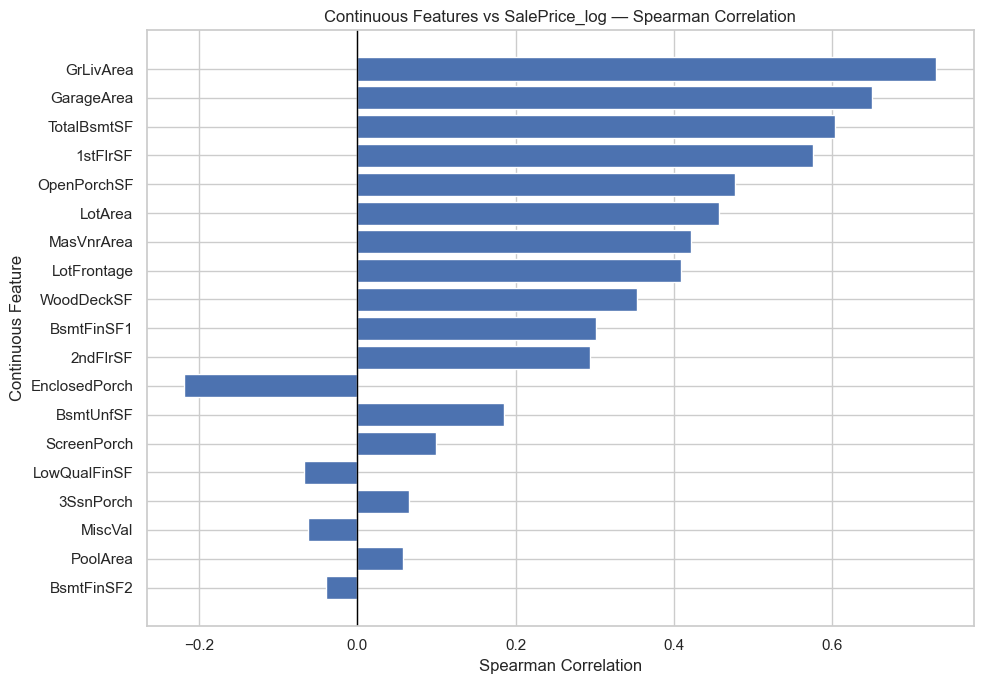

In [68]:
plot_df = continuous_target_corr.sort_values(
    by="abs_spearman_log",
    ascending=True
)

plt.figure(figsize=(10, 7))

plt.barh(
    plot_df["feature"],
    plot_df["spearman_log_saleprice"]
)

plt.title("Continuous Features vs SalePrice_log — Spearman Correlation")
plt.xlabel("Spearman Correlation")
plt.ylabel("Continuous Feature")

plt.axvline(0, color="black", linewidth=1)
plt.tight_layout()
plt.show()

### Scatter and LOWESS Trend

These plots show the relationship shape between important continuous features and `SalePrice_log`.

LOWESS helps detect nonlinear trends.

In [69]:
important_continuous_features = (
    continuous_target_corr
    .sort_values(by="abs_spearman_log", ascending=False)
    .head(8)["feature"]
    .tolist()
)

important_continuous_features

['GrLivArea',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'OpenPorchSF',
 'LotArea',
 'MasVnrArea',
 'LotFrontage']

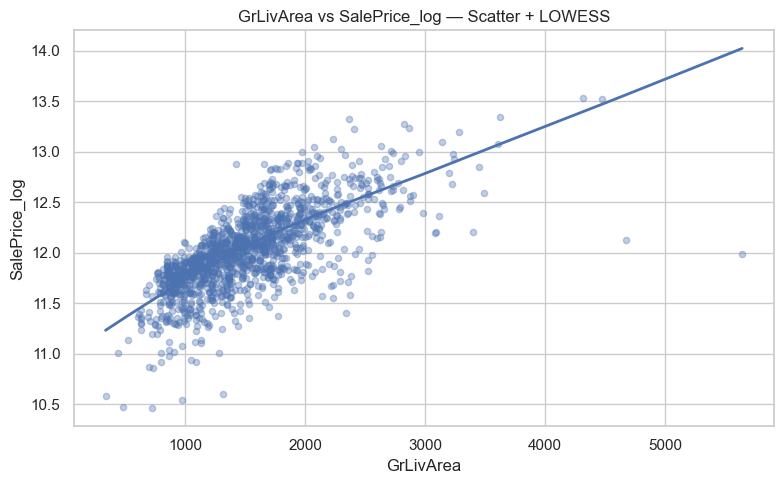

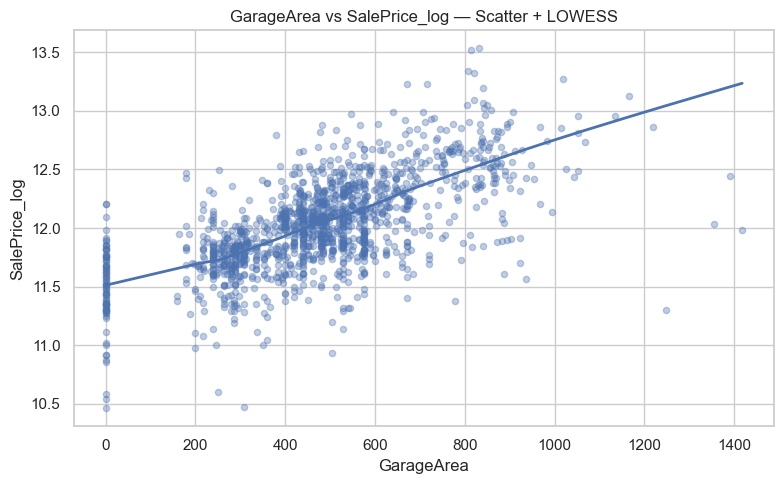

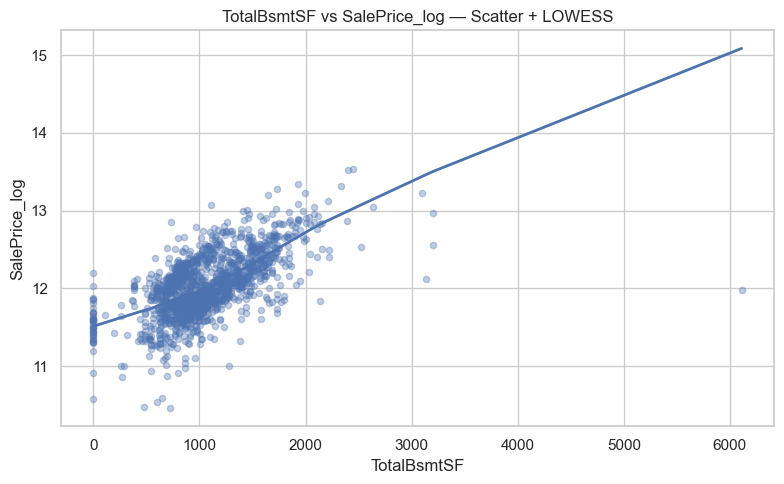

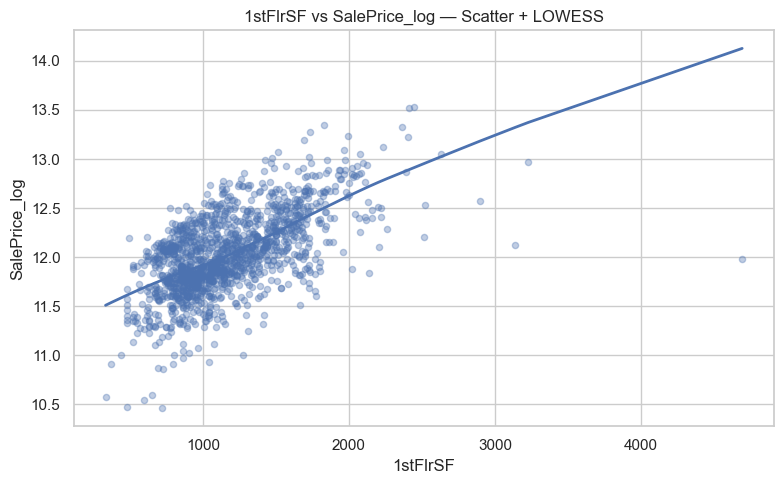

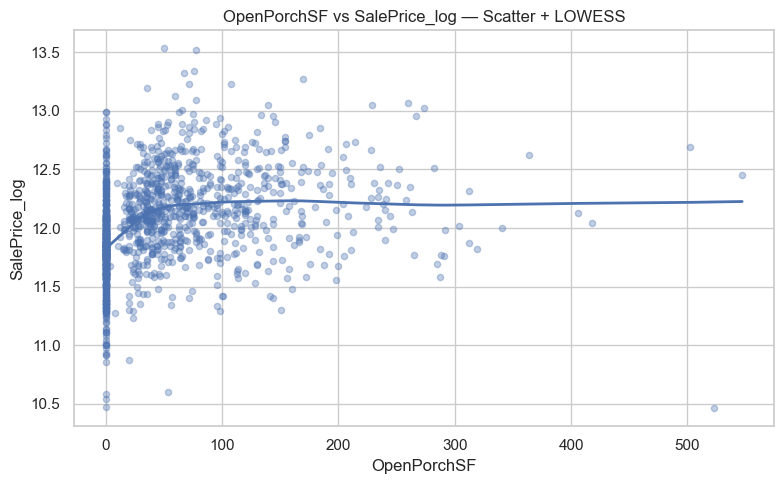

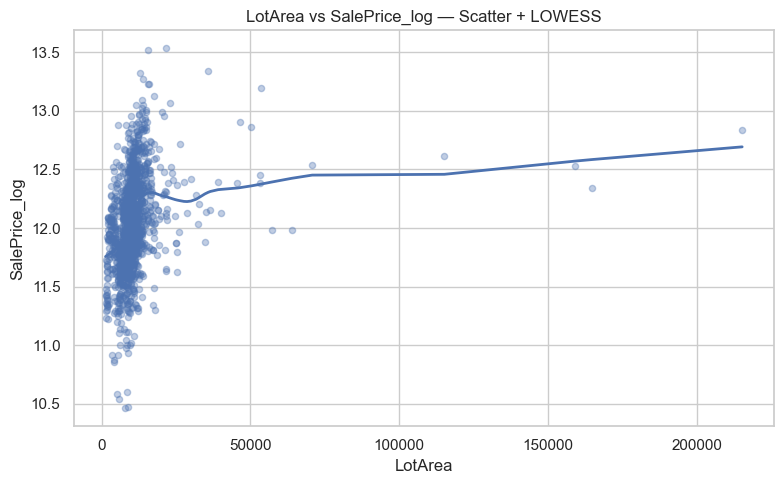

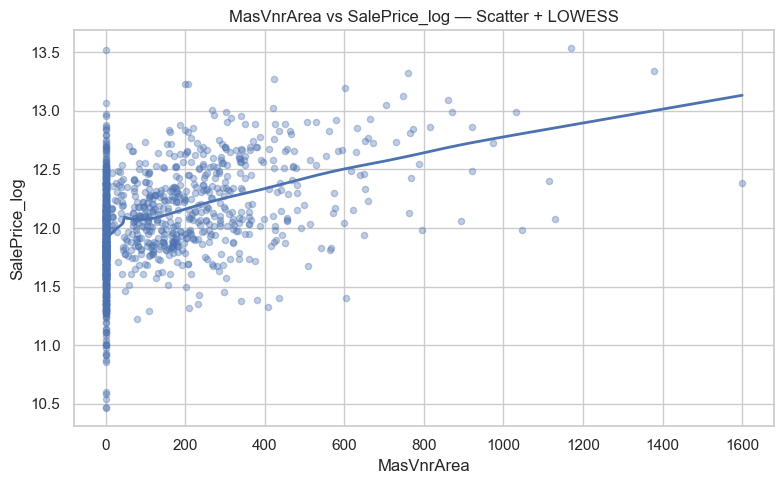

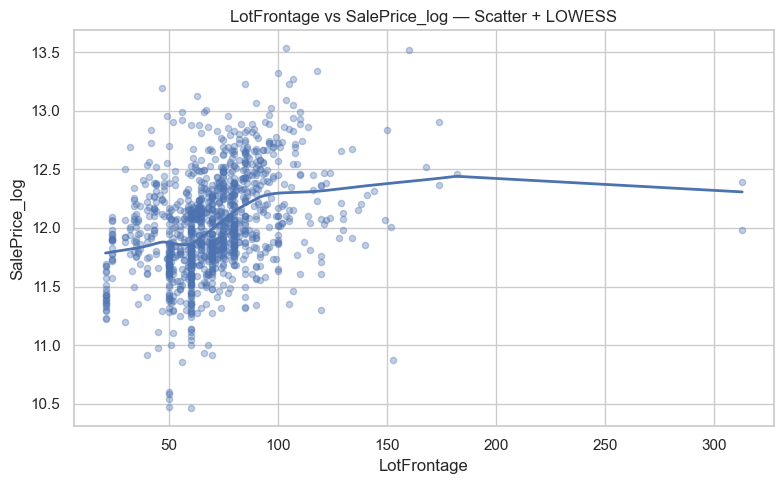

In [70]:
for feature in important_continuous_features:
    temp = train[[feature, "SalePrice_log"]].dropna()

    plt.figure(figsize=(8, 5))

    sns.regplot(
        data=temp,
        x=feature,
        y="SalePrice_log",
        lowess=True,
        scatter_kws={"alpha": 0.35, "s": 20},
        line_kws={"linewidth": 2}
    )

    plt.title(f"{feature} vs SalePrice_log — Scatter + LOWESS")
    plt.xlabel(feature)
    plt.ylabel("SalePrice_log")

    plt.tight_layout()
    plt.show()

### Decile Target Trend

Each continuous feature is divided into quantile-based bins.  
Then the median target value is calculated for each bin.

This helps identify monotonic or nonlinear target movement.

In [71]:
def numeric_decile_target_trend(df, feature, target="SalePrice", q=10):
    temp = df[[feature, target]].dropna().copy()

    # qcut can fail if too many duplicate values exist
    try:
        temp["bin"] = pd.qcut(
            temp[feature],
            q=q,
            duplicates="drop"
        )
    except ValueError:
        return pd.DataFrame()

    trend = (
        temp
        .groupby("bin", observed=False)
        .agg(
            sample_count=(target, "count"),
            feature_min=(feature, "min"),
            feature_max=(feature, "max"),
            target_mean=(target, "mean"),
            target_median=(target, "median")
        )
        .reset_index()
    )

    trend["bin_number"] = range(1, len(trend) + 1)

    return trend

In [72]:
all_decile_trends = []

for feature in important_continuous_features:
    trend = numeric_decile_target_trend(
        train,
        feature,
        target="SalePrice",
        q=10
    )

    if not trend.empty:
        trend["feature"] = feature
        all_decile_trends.append(trend)

continuous_decile_trend = pd.concat(all_decile_trends, ignore_index=True)

display(
    continuous_decile_trend[
        [
            "feature",
            "bin_number",
            "sample_count",
            "feature_min",
            "feature_max",
            "target_median",
            "target_mean"
        ]
    ].round(2)
)

,feature,bin_number,sample_count,feature_min,feature_max,target_median,target_mean
0,GrLivArea,1,153,334.0000,912.0000,114500.0000,109242.8200
1,GrLivArea,2,139,913.0000,1065.0000,128000.0000,122911.5300
2,GrLivArea,3,149,1067.0000,1208.0000,140000.0000,134940.1300
3,GrLivArea,4,144,1211.0000,1339.0000,155000.0000,153247.4800
4,GrLivArea,5,146,1340.0000,1464.0000,163495.0000,161170.0900
5,GrLivArea,6,146,1466.0000,1578.0000,179050.0000,184577.3400
6,GrLivArea,7,145,1580.0000,1709.0000,188700.0000,200277.6300
7,GrLivArea,8,147,1710.0000,1869.0000,196500.0000,208757.8100
8,GrLivArea,9,145,1872.0000,2158.0000,228500.0000,239593.8100
9,GrLivArea,10,146,2161.0000,5642.0000,280606.5000,296058.1700


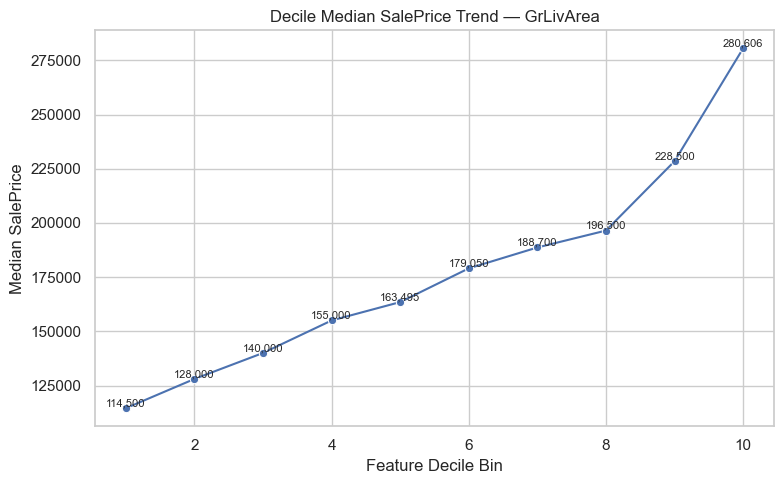

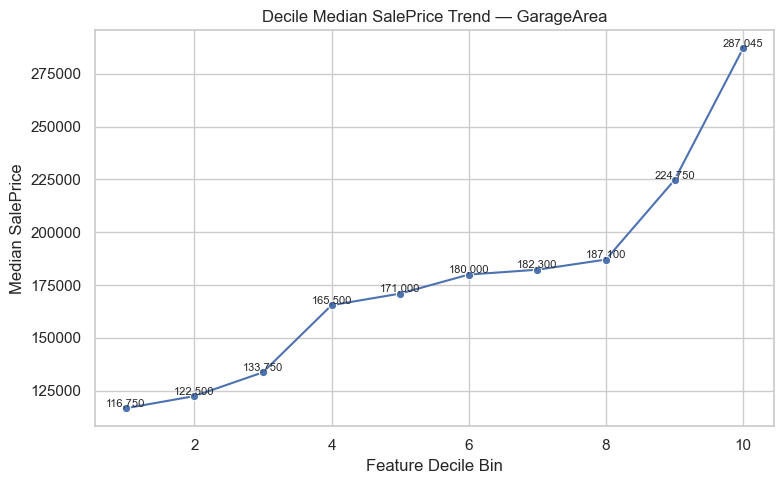

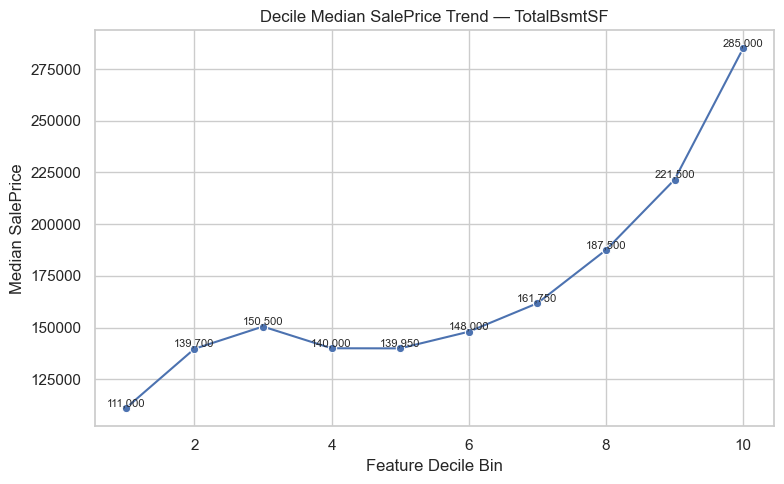

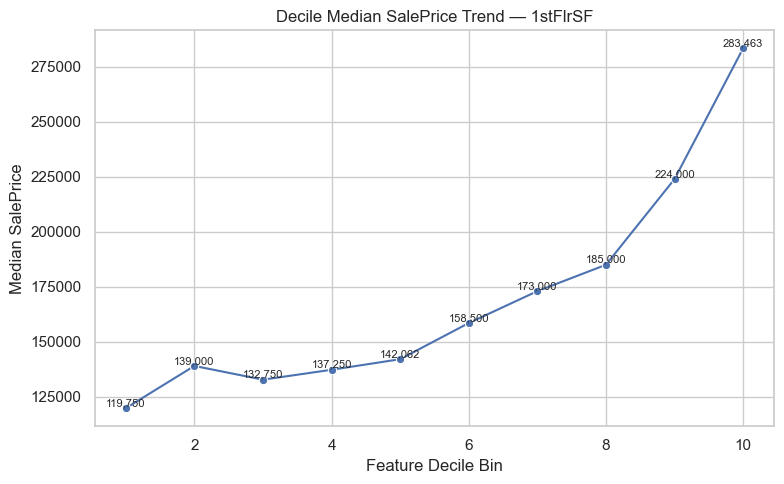

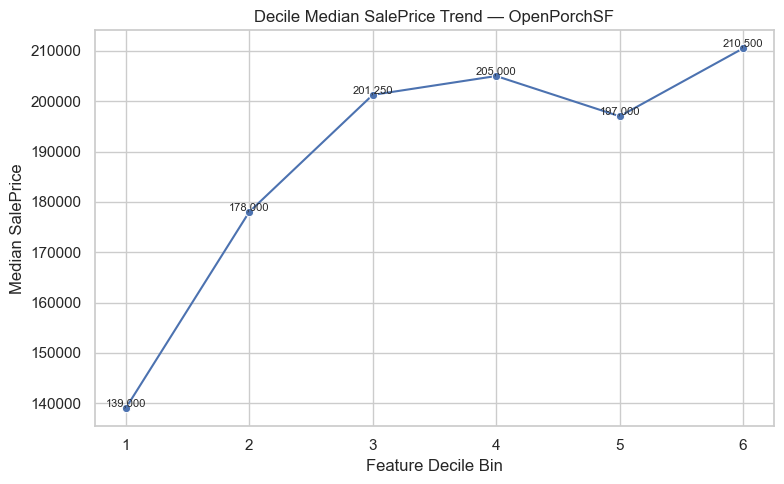

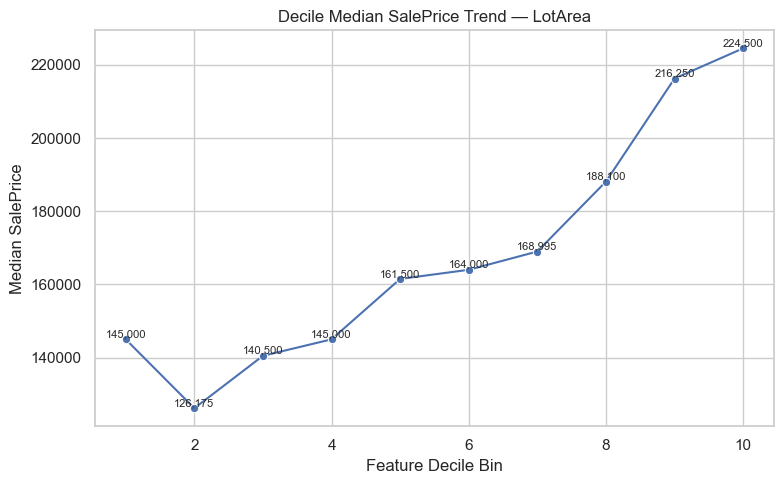

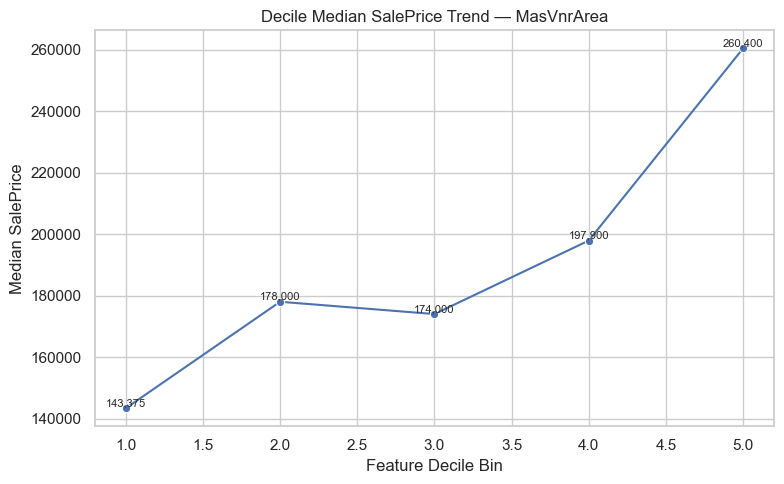

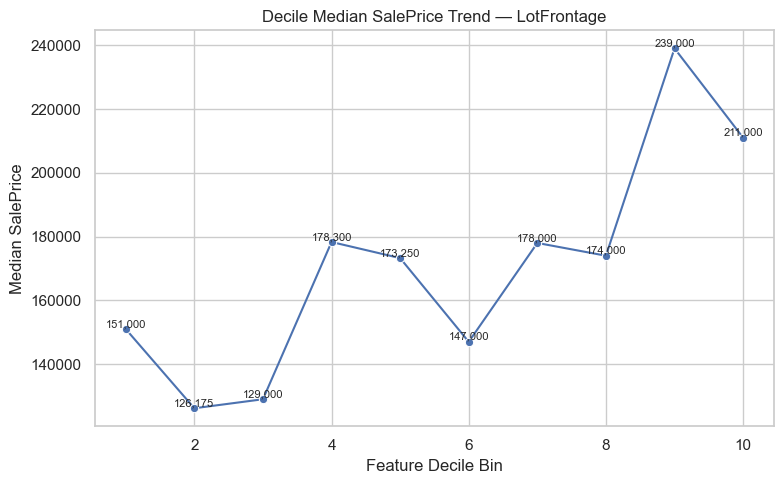

In [73]:
for feature in important_continuous_features:
    trend = continuous_decile_trend[
        continuous_decile_trend["feature"] == feature
    ]

    if trend.empty:
        continue

    plt.figure(figsize=(8, 5))

    sns.lineplot(
        data=trend,
        x="bin_number",
        y="target_median",
        marker="o"
    )

    plt.title(f"Decile Median SalePrice Trend — {feature}")
    plt.xlabel("Feature Decile Bin")
    plt.ylabel("Median SalePrice")

    for x, y in zip(trend["bin_number"], trend["target_median"]):
        plt.text(x, y, f"{y:,.0f}", ha="center", va="bottom", fontsize=8)

    plt.tight_layout()
    plt.show()

### Zero vs Non-zero Target Behavior

Some continuous features are zero-heavy.  
For these features, I compare target distribution between:

- zero value group
- non-zero value group

This helps decide whether a binary indicator feature may be useful.

In [74]:
zero_heavy_continuous = []

for feature in continuous_numeric:
    zero_percentage = (train[feature] == 0).mean() * 100

    if zero_percentage >= 40:
        zero_heavy_continuous.append(feature)

zero_heavy_continuous

['MasVnrArea',
 'BsmtFinSF2',
 '2ndFlrSF',
 'LowQualFinSF',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal']

In [75]:
zero_group_summary = []

for feature in zero_heavy_continuous:
    temp = train[[feature, "SalePrice"]].dropna().copy()
    temp["group"] = np.where(temp[feature] == 0, "Zero", "Non-zero")

    summary = (
        temp
        .groupby("group")
        .agg(
            sample_count=("SalePrice", "count"),
            median_saleprice=("SalePrice", "median"),
            mean_saleprice=("SalePrice", "mean")
        )
        .reset_index()
    )

    summary["feature"] = feature
    zero_group_summary.append(summary)

zero_group_summary = pd.concat(zero_group_summary, ignore_index=True)

display(
    zero_group_summary[
        ["feature", "group", "sample_count", "median_saleprice", "mean_saleprice"]
    ].round(2)
)

,feature,group,sample_count,median_saleprice,mean_saleprice
0,MasVnrArea,Non-zero,591,192000.0000,215662.7400
1,MasVnrArea,Zero,861,143000.0000,156557.9500
2,BsmtFinSF2,Non-zero,167,154000.0000,169217.1100
3,BsmtFinSF2,Zero,1293,165000.0000,182432.8600
4,2ndFlrSF,Non-zero,631,177000.0000,193451.4800
5,2ndFlrSF,Zero,829,150000.0000,171383.6700
6,LowQualFinSF,Non-zero,26,131500.0000,152652.0000
7,LowQualFinSF,Zero,1434,163945.0000,181433.7500
8,WoodDeckSF,Non-zero,699,187000.0000,205586.2000
9,WoodDeckSF,Zero,761,144152.0000,158265.7000


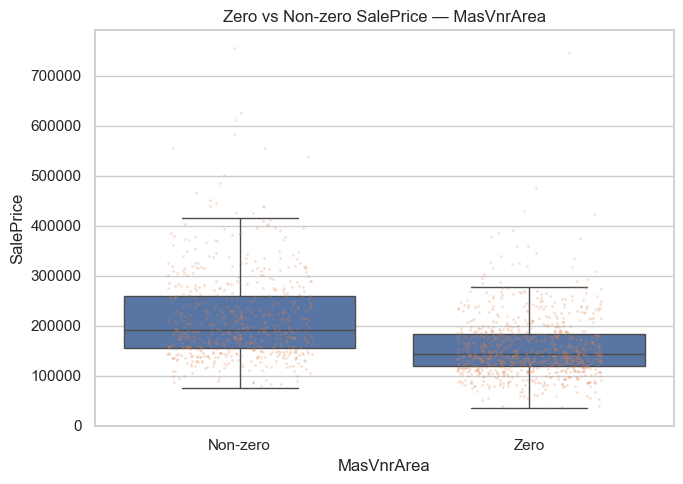

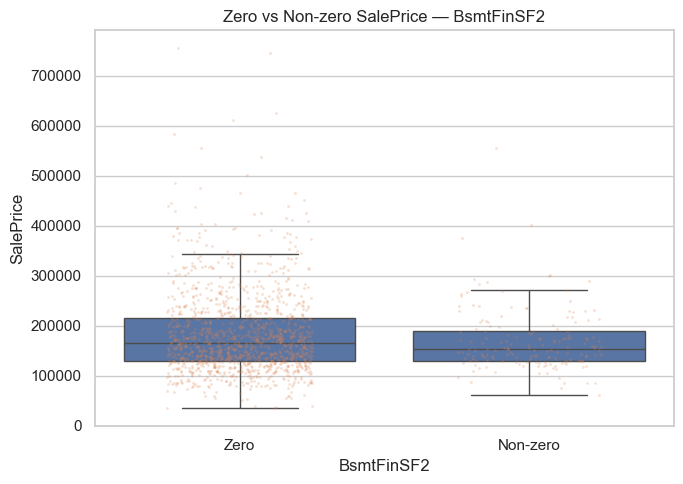

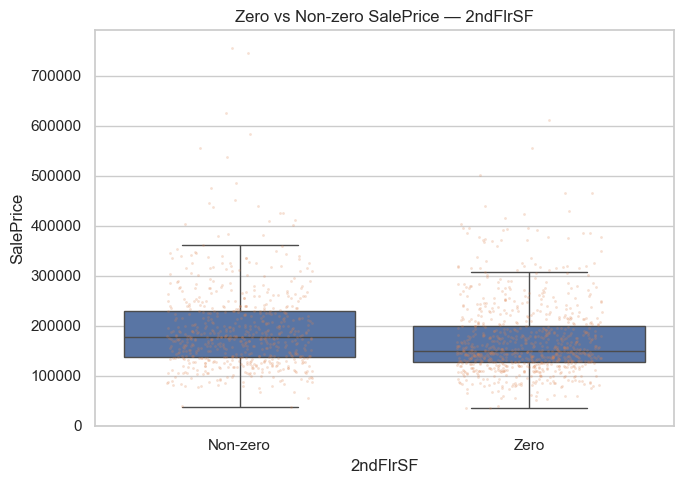

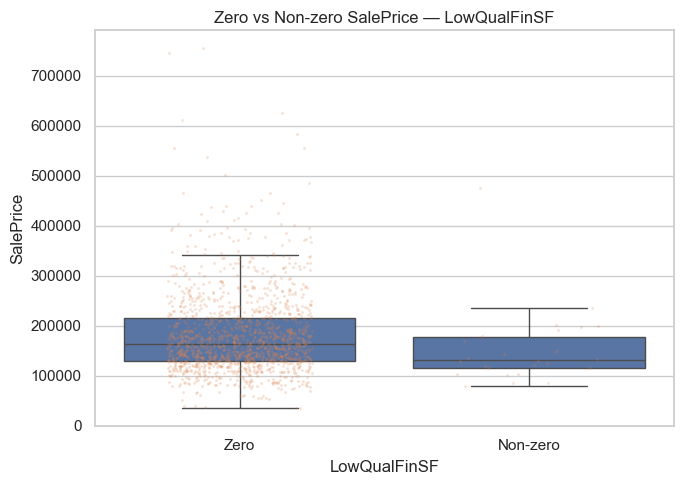

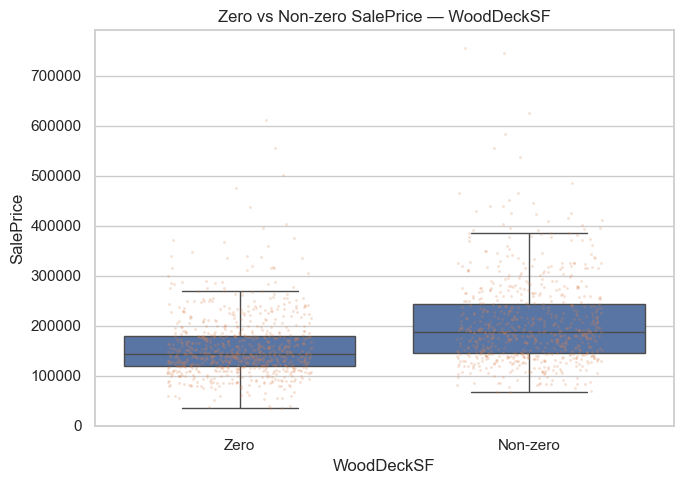

...

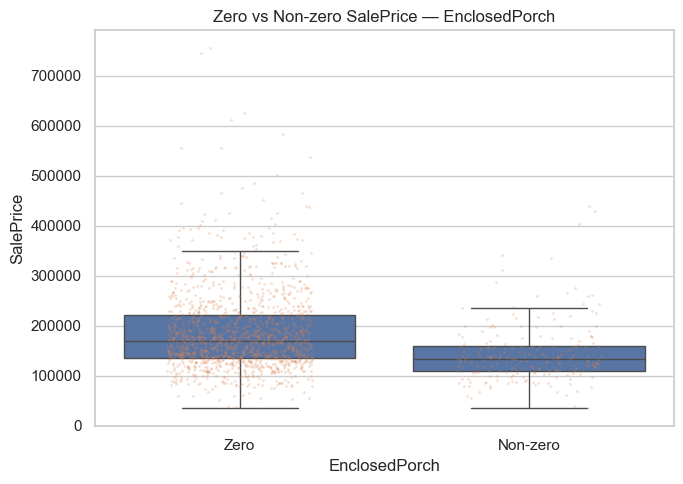

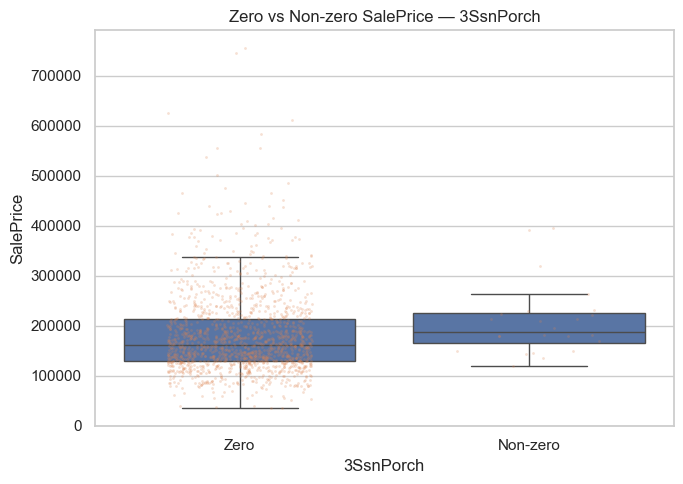

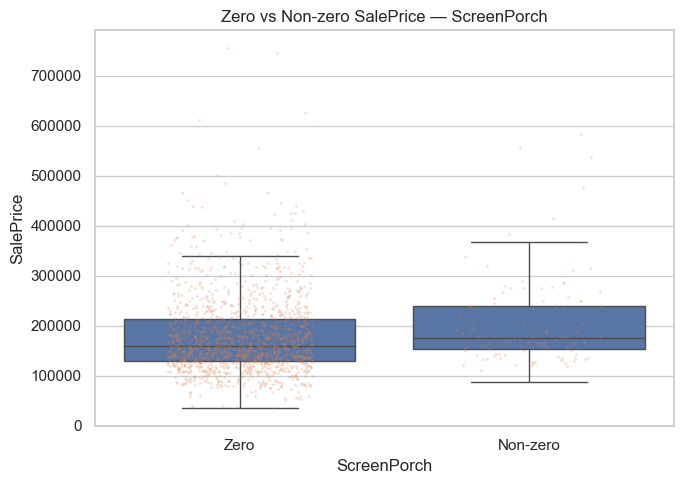

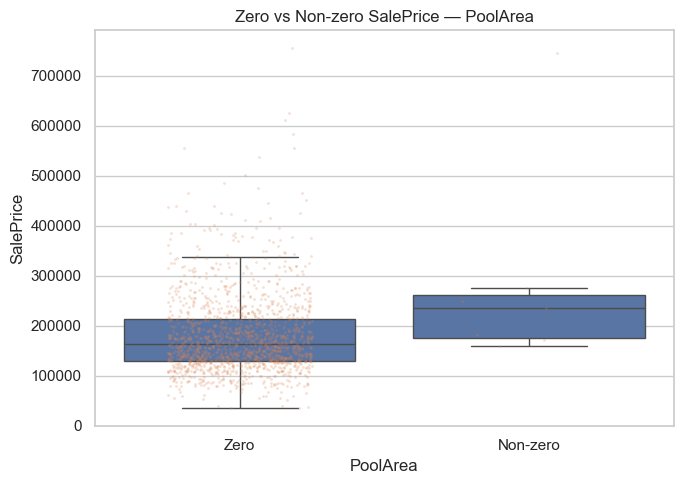

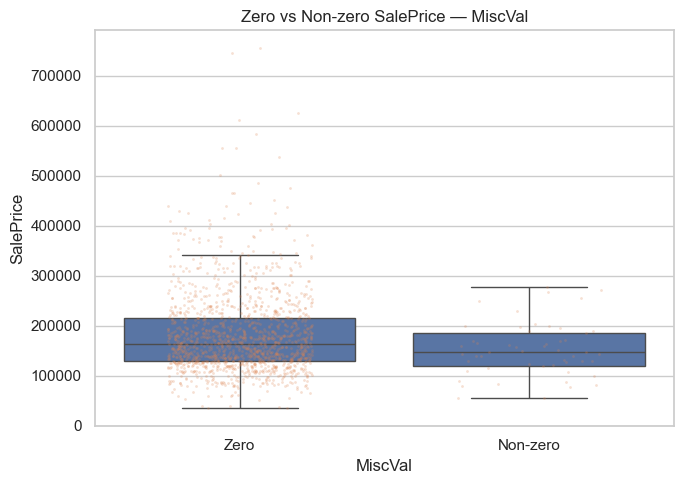

In [76]:
for feature in zero_heavy_continuous:
    temp = train[[feature, "SalePrice"]].dropna().copy()
    temp["group"] = np.where(temp[feature] == 0, "Zero", "Non-zero")

    plt.figure(figsize=(7, 5))

    sns.boxplot(
        data=temp,
        x="group",
        y="SalePrice",
        showfliers=False
    )

    sns.stripplot(
        data=temp,
        x="group",
        y="SalePrice",
        jitter=0.25,
        alpha=0.25,
        size=2
    )

    plt.title(f"Zero vs Non-zero SalePrice — {feature}")
    plt.xlabel(feature)
    plt.ylabel("SalePrice")

    plt.tight_layout()
    plt.show()

### Continuous Numeric vs Target — Action Summary

This table gives an initial action decision for each continuous feature based on:

- correlation strength,
- zero-heavy behavior,
- possible target signal,
- and feature engineering potential.

In [77]:
continuous_action_summary = []

for feature in continuous_numeric:
    corr_row = continuous_target_corr[
        continuous_target_corr["feature"] == feature
    ].iloc[0]

    zero_percentage = (train[feature] == 0).mean() * 100
    abs_corr = abs(corr_row["spearman_log_saleprice"])

    if abs_corr >= 0.50:
        signal_strength = "Strong"
    elif abs_corr >= 0.30:
        signal_strength = "Medium"
    elif abs_corr >= 0.10:
        signal_strength = "Weak"
    else:
        signal_strength = "Very Weak"

    if zero_percentage >= 80:
        behavior = "Very sparse"
        action = "Create binary flag; keep raw only if useful"
    elif zero_percentage >= 40:
        behavior = "Zero-heavy"
        action = "Create binary flag + test raw/log feature"
    elif abs_corr >= 0.30:
        behavior = "Useful continuous signal"
        action = "Keep; test transformation if skewed"
    else:
        behavior = "Low direct signal"
        action = "Keep for now; validate later"

    continuous_action_summary.append({
        "feature": feature,
        "spearman_log_corr": corr_row["spearman_log_saleprice"],
        "signal_strength": signal_strength,
        "zero_percentage": zero_percentage,
        "behavior": behavior,
        "action": action
    })

continuous_action_summary = pd.DataFrame(continuous_action_summary)

display(
    continuous_action_summary
    .sort_values(by="spearman_log_corr", key=lambda x: x.abs(), ascending=False)
    .round(4)
)

,feature,spearman_log_corr,signal_strength,zero_percentage,behavior,action
10,GrLivArea,0.7313,Strong,0.0000,Useful continuous signal,Keep; test transformation if skewed
11,GarageArea,0.6494,Strong,5.5479,Useful continuous signal,Keep; test transformation if skewed
6,TotalBsmtSF,0.6027,Strong,2.5342,Useful continuous signal,Keep; test transformation if skewed
7,1stFlrSF,0.5754,Strong,0.0000,Useful continuous signal,Keep; test transformation if skewed
13,OpenPorchSF,0.4776,Medium,44.9315,Zero-heavy,Create binary flag + test raw/log feature
1,LotArea,0.4565,Medium,0.0000,Useful continuous signal,Keep; test transformation if skewed
2,MasVnrArea,0.4213,Medium,58.9726,Zero-heavy,Create binary flag + test raw/log feature
0,LotFrontage,0.4091,Medium,0.0000,Useful continuous signal,Keep; test transformation if skewed
12,WoodDeckSF,0.3538,Medium,52.1233,Zero-heavy,Create binary flag + test raw/log feature
3,BsmtFinSF1,0.3019,Medium,31.9863,Useful continuous signal,Keep; test transformation if skewed


### Continuous Numeric vs Target — Final Notes

- Strong continuous predictors should be prioritized in modeling.
- Zero-heavy continuous features may be better represented with binary indicators.
- Nonlinear patterns should be handled through transformation, binning, or model choice.
- Outliers should not be removed only because they are extreme.
- Final transformation and feature engineering decisions should be validated using cross-validation.

## 8.3 Count Numeric vs Target

In this section, I analyze the relationship between count numeric features and the target variable `SalePrice`.

Count numeric features are discrete quantity-based variables.  
The goal is to check:

- target behavior across count levels,
- median target trend,
- zero vs non-zero target difference,
- rare count value stability,
- and possible binary/combined feature engineering opportunities.

No log transformation or outlier handling is applied to count features.

In [78]:
count_target_summary = []

for feature in count_numeric:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].dropna().copy()

    summary = (
        temp
        .groupby(feature)
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median"),
            mean_log_saleprice=("SalePrice_log", "mean"),
            median_log_saleprice=("SalePrice_log", "median")
        )
        .reset_index()
    )

    summary["feature"] = feature

    count_target_summary.append(summary)

count_target_summary = pd.concat(count_target_summary, ignore_index=True)

display(
    count_target_summary[
        [
            "feature",
            feature if False else "sample_count",
        ]
    ].head()
)

,feature,sample_count
0,BsmtFullBath,856
1,BsmtFullBath,588
2,BsmtFullBath,15
3,BsmtFullBath,1
4,BsmtHalfBath,1378


In [79]:
display(
    count_target_summary[
        [
            "feature",
            "sample_count",
            "mean_saleprice",
            "median_saleprice",
            "mean_log_saleprice",
            "median_log_saleprice"
        ]
    ].round(4)
)

,feature,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,BsmtFullBath,856,165521.6402,154150.0000,11.9438,11.9457
1,BsmtFullBath,588,202522.9184,178800.0000,12.1363,12.0940
2,BsmtFullBath,15,213063.0667,188000.0000,12.1981,12.1442
3,BsmtFullBath,1,179000.0000,179000.0000,12.0951,12.0951
4,BsmtHalfBath,1378,181230.3302,163250.0000,12.0245,12.0030
5,BsmtHalfBath,80,176098.1250,159000.0000,12.0180,11.9767
6,BsmtHalfBath,2,160850.5000,160850.5000,11.9663,11.9663
7,FullBath,9,165200.8889,145000.0000,11.8109,11.8845
8,FullBath,650,134751.4400,132375.0000,11.7684,11.7934
9,FullBath,768,213009.8255,196750.0000,12.2156,12.1897


In [80]:
count_target_summary_clean = []

for feature in count_numeric:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].dropna().copy()

    summary = (
        temp
        .groupby(feature)
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median"),
            mean_log_saleprice=("SalePrice_log", "mean"),
            median_log_saleprice=("SalePrice_log", "median")
        )
        .reset_index()
        .rename(columns={feature: "count_value"})
    )

    summary["feature"] = feature

    summary = summary[
        [
            "feature",
            "count_value",
            "sample_count",
            "mean_saleprice",
            "median_saleprice",
            "mean_log_saleprice",
            "median_log_saleprice"
        ]
    ]

    count_target_summary_clean.append(summary)

count_target_summary_clean = pd.concat(
    count_target_summary_clean,
    ignore_index=True
)

display(count_target_summary_clean.round(4))

,feature,count_value,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,BsmtFullBath,0,856,165521.6402,154150.0000,11.9438,11.9457
1,BsmtFullBath,1,588,202522.9184,178800.0000,12.1363,12.0940
2,BsmtFullBath,2,15,213063.0667,188000.0000,12.1981,12.1442
3,BsmtFullBath,3,1,179000.0000,179000.0000,12.0951,12.0951
4,BsmtHalfBath,0,1378,181230.3302,163250.0000,12.0245,12.0030
5,BsmtHalfBath,1,80,176098.1250,159000.0000,12.0180,11.9767
6,BsmtHalfBath,2,2,160850.5000,160850.5000,11.9663,11.9663
7,FullBath,0,9,165200.8889,145000.0000,11.8109,11.8845
8,FullBath,1,650,134751.4400,132375.0000,11.7684,11.7934
9,FullBath,2,768,213009.8255,196750.0000,12.2156,12.1897


### Jittered Boxplot

These plots show the distribution of `SalePrice` for each count value.

The boxplot shows median and spread.  
The jittered points show actual observations.

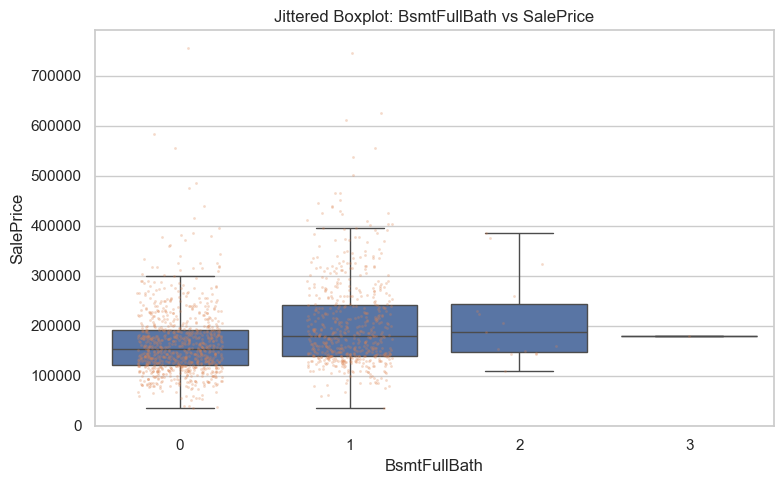

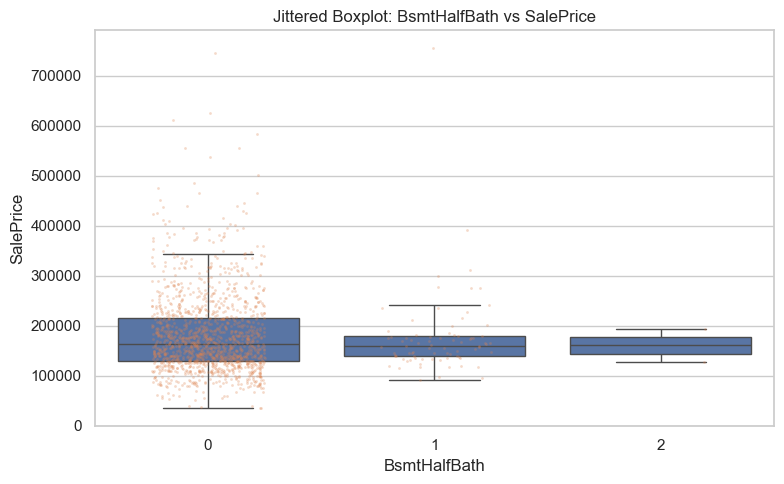

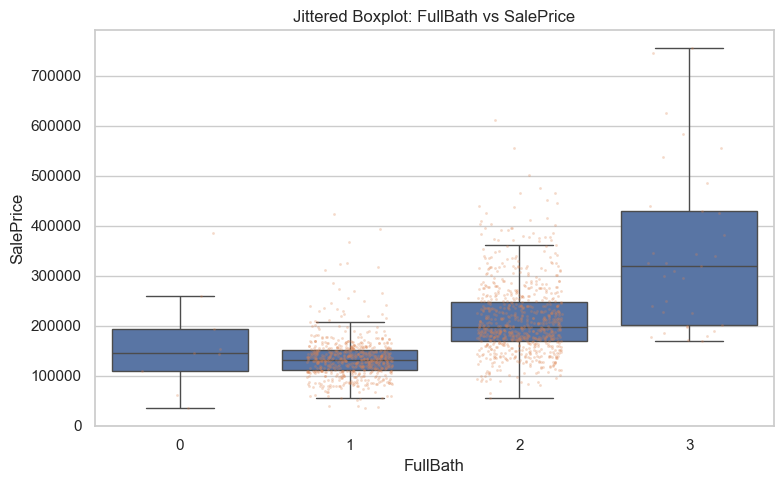

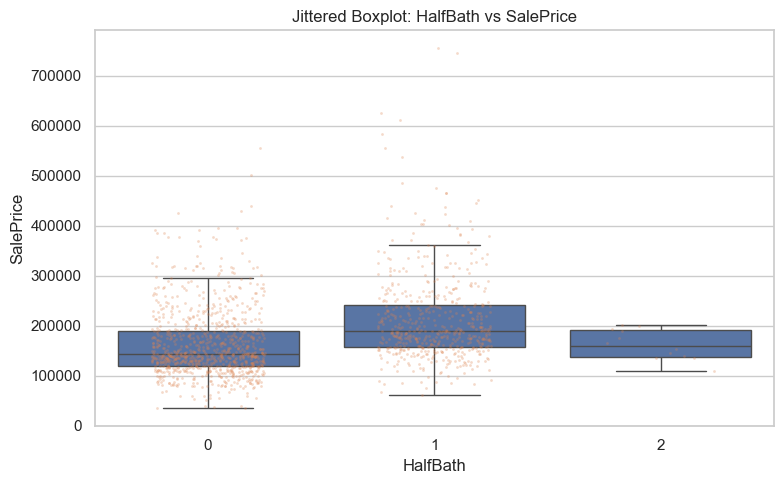

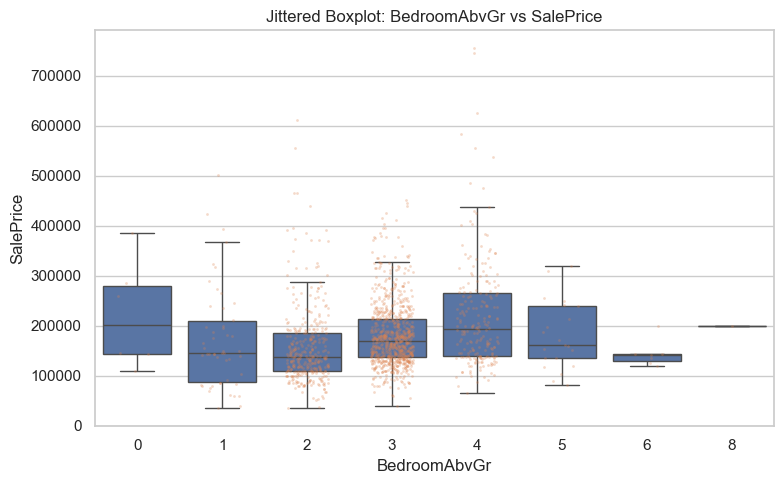

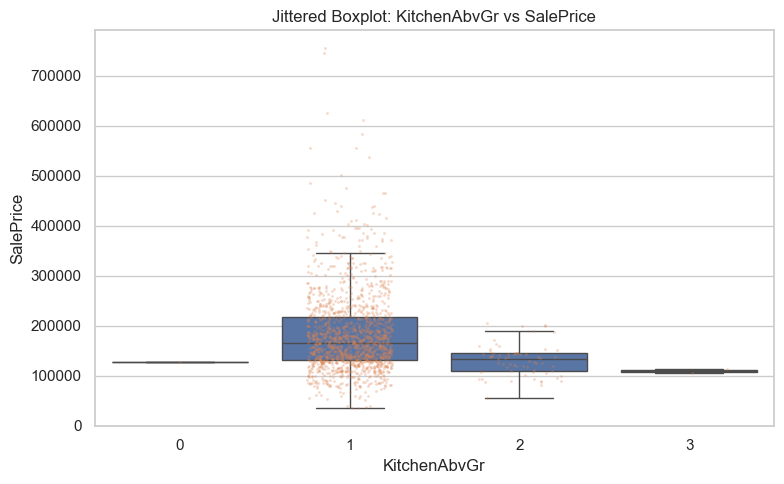

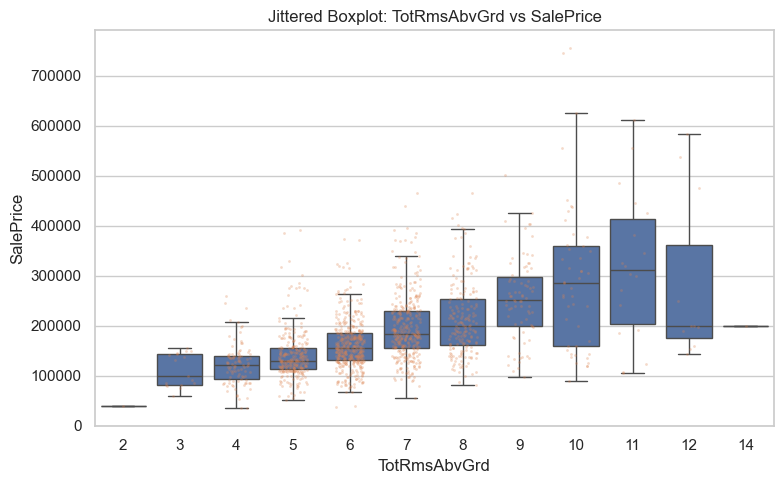

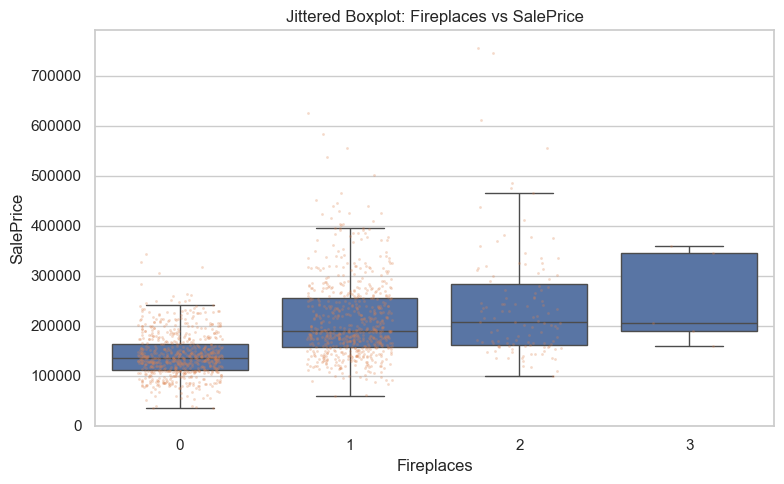

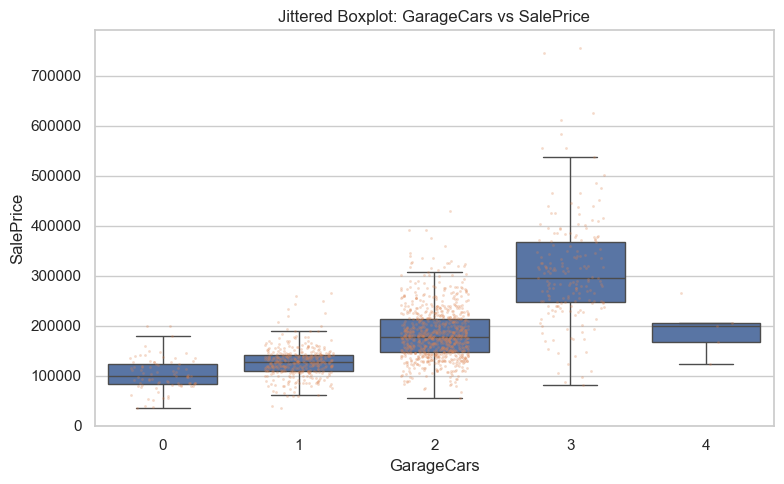

In [81]:
for feature in count_numeric:
    plt.figure(figsize=(8, 5))

    order = sorted(train[feature].dropna().unique())

    sns.boxplot(
        data=train,
        x=feature,
        y="SalePrice",
        order=order,
        showfliers=False
    )

    sns.stripplot(
        data=train,
        x=feature,
        y="SalePrice",
        order=order,
        jitter=0.25,
        alpha=0.30,
        size=2
    )

    plt.title(f"Jittered Boxplot: {feature} vs SalePrice")
    plt.xlabel(feature)
    plt.ylabel("SalePrice")

    plt.tight_layout()
    plt.show()

### Median Target Trend by Count Level

This plot shows how the median `SalePrice` changes across count values.

It helps detect increasing, decreasing, flat, or unstable trends.

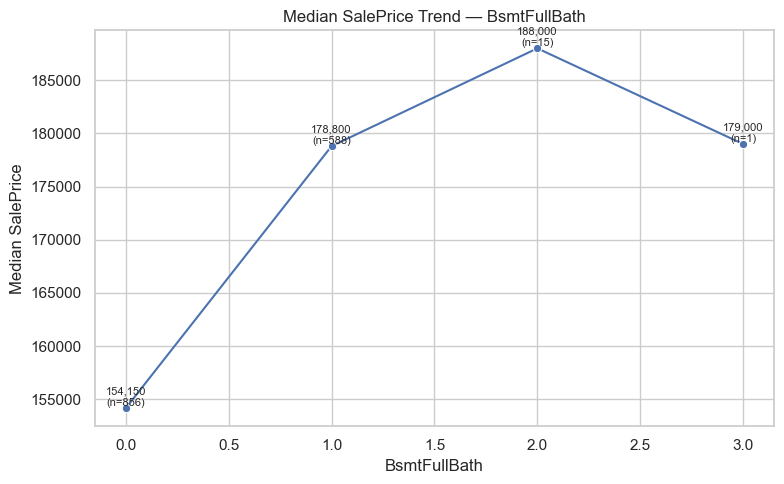

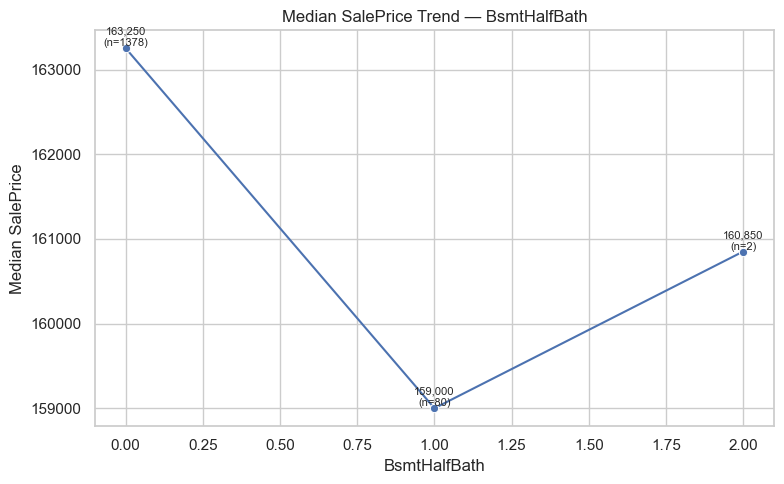

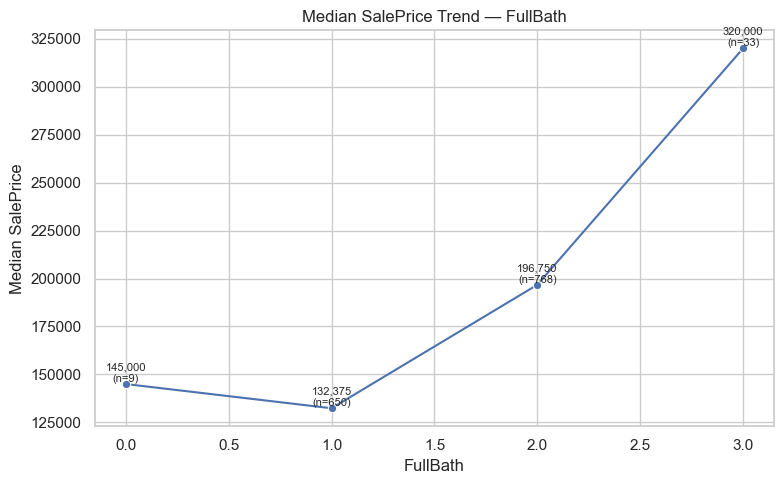

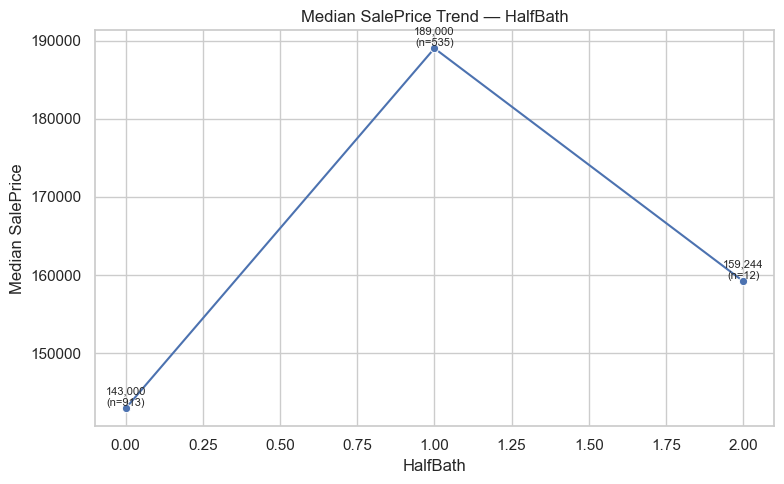

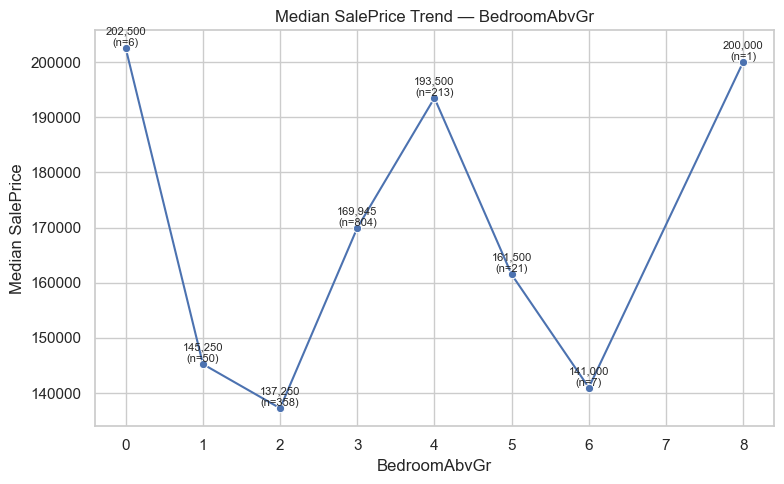

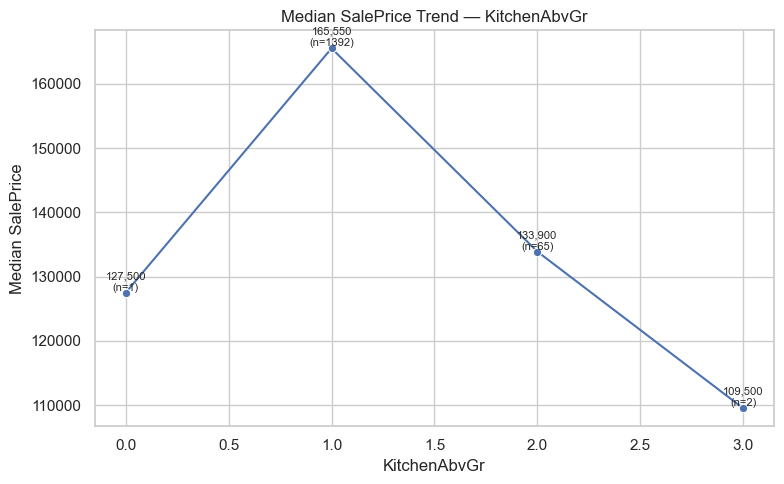

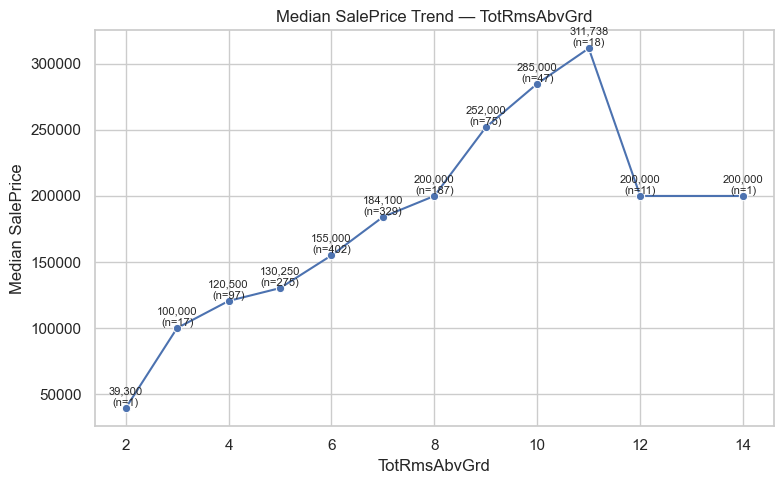

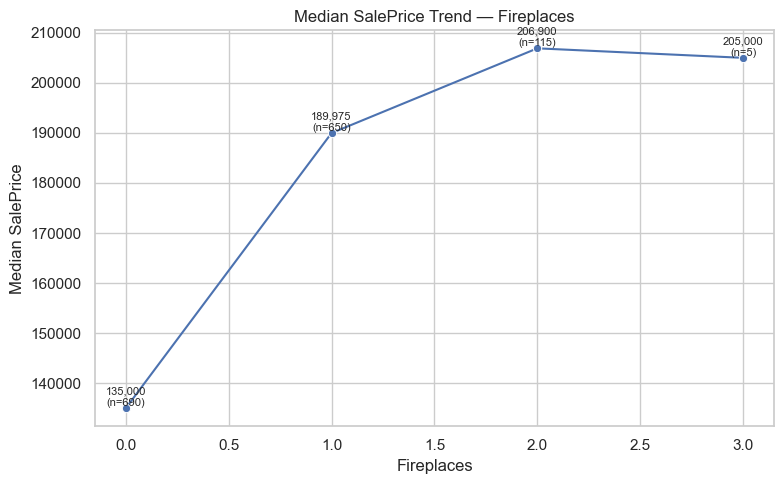

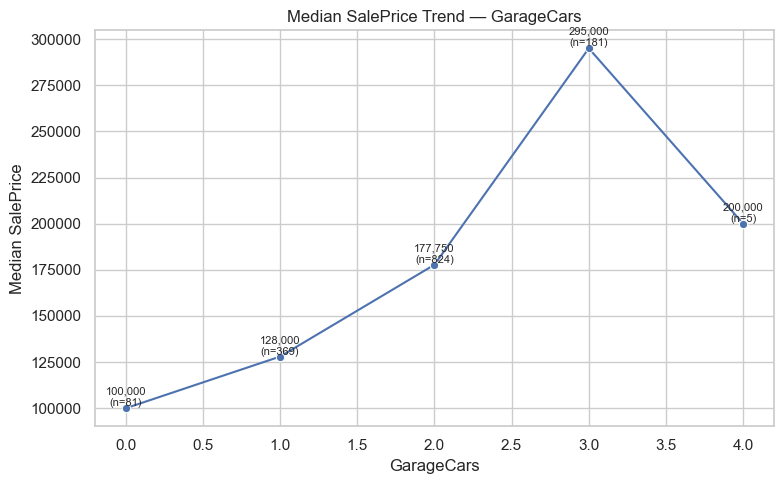

In [82]:
for feature in count_numeric:
    trend = count_target_summary_clean[
        count_target_summary_clean["feature"] == feature
    ].copy()

    plt.figure(figsize=(8, 5))

    sns.lineplot(
        data=trend,
        x="count_value",
        y="median_saleprice",
        marker="o"
    )

    for x, y, n in zip(
        trend["count_value"],
        trend["median_saleprice"],
        trend["sample_count"]
    ):
        plt.text(
            x,
            y,
            f"{y:,.0f}\n(n={n})",
            ha="center",
            va="bottom",
            fontsize=8
        )

    plt.title(f"Median SalePrice Trend — {feature}")
    plt.xlabel(feature)
    plt.ylabel("Median SalePrice")

    plt.tight_layout()
    plt.show()

### Zero vs Non-zero Target Behavior

For count features where `0` has special meaning, I compare target behavior between:

- zero group
- non-zero group

This helps identify useful presence/absence flags.

In [83]:
zero_meaning_count_features = [
    "BsmtFullBath",
    "BsmtHalfBath",
    "HalfBath",
    "Fireplaces",
    "GarageCars"
]

zero_meaning_count_features = [
    feature for feature in zero_meaning_count_features
    if feature in count_numeric
]

In [84]:
count_zero_group_summary = []

for feature in zero_meaning_count_features:
    temp = train[[feature, "SalePrice"]].dropna().copy()
    temp["group"] = np.where(temp[feature] == 0, "Zero", "Non-zero")

    summary = (
        temp
        .groupby("group")
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median")
        )
        .reset_index()
    )

    summary["feature"] = feature
    count_zero_group_summary.append(summary)

count_zero_group_summary = pd.concat(
    count_zero_group_summary,
    ignore_index=True
)

display(count_zero_group_summary.round(2))

,group,sample_count,mean_saleprice,median_saleprice,feature
0,Non-zero,604,202745.7300,179100.0000,BsmtFullBath
1,Zero,856,165521.6400,154150.0000,BsmtFullBath
2,Non-zero,82,175726.2300,159000.0000,BsmtHalfBath
3,Zero,1378,181230.3300,163250.0000,BsmtHalfBath
4,Non-zero,547,211609.8600,188500.0000,HalfBath
5,Zero,913,162534.8800,143000.0000,HalfBath
6,Non-zero,770,216397.6900,191000.0000,Fireplaces
7,Zero,690,141331.4800,135000.0000,Fireplaces
8,Non-zero,1379,185479.5100,167500.0000,GarageCars
9,Zero,81,103317.2800,100000.0000,GarageCars


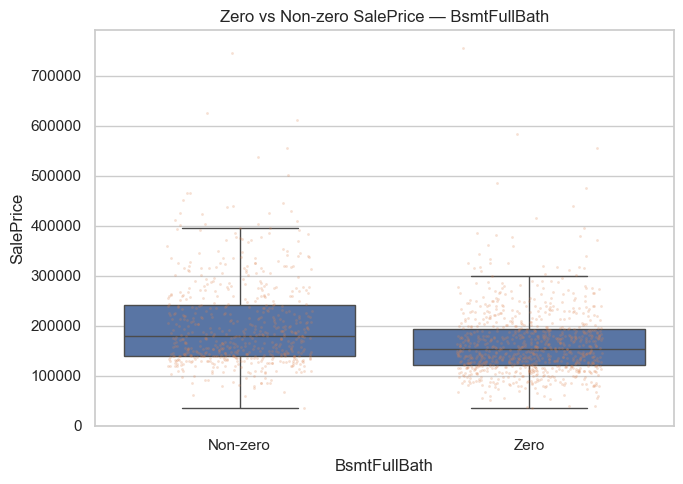

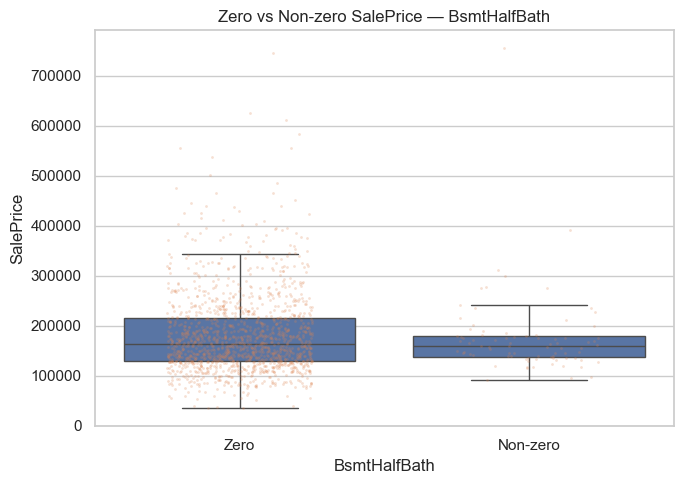

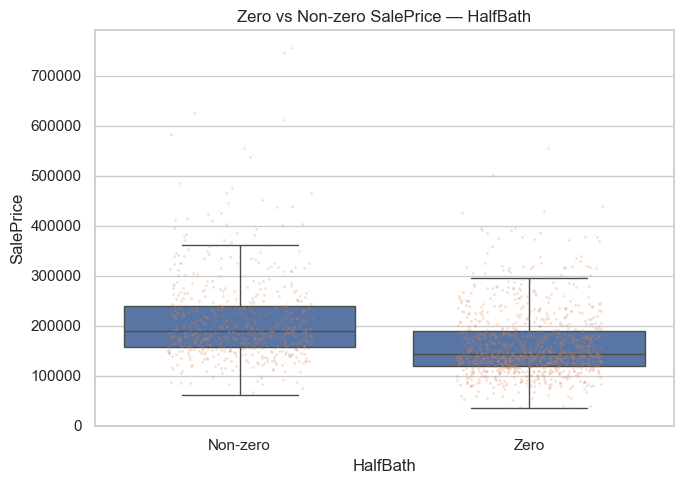

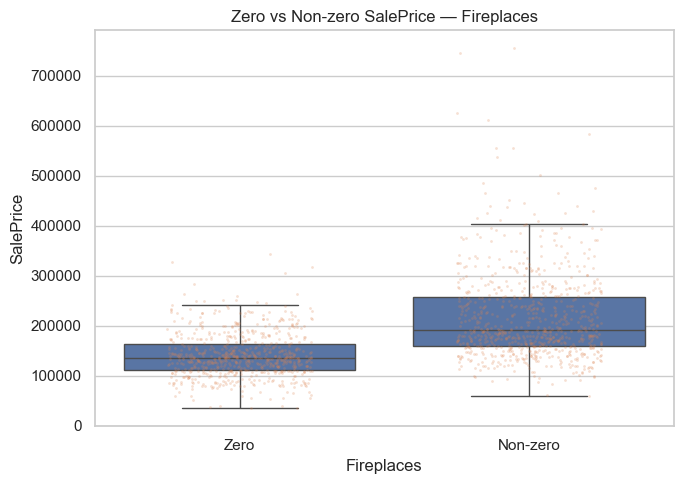

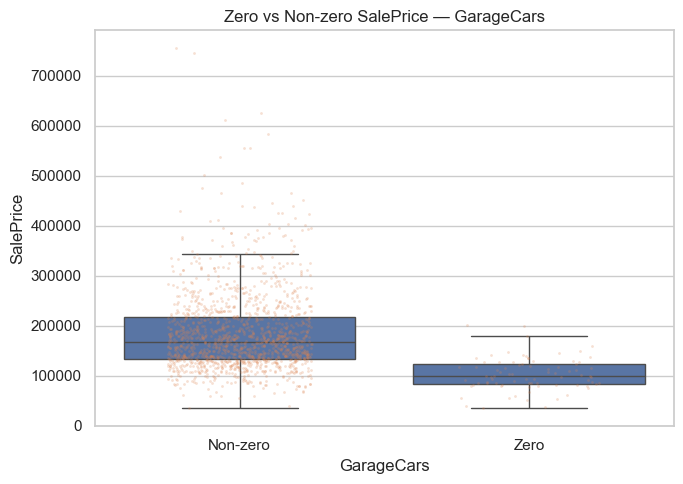

In [85]:
for feature in zero_meaning_count_features:
    temp = train[[feature, "SalePrice"]].dropna().copy()
    temp["group"] = np.where(temp[feature] == 0, "Zero", "Non-zero")

    plt.figure(figsize=(7, 5))

    sns.boxplot(
        data=temp,
        x="group",
        y="SalePrice",
        showfliers=False
    )

    sns.stripplot(
        data=temp,
        x="group",
        y="SalePrice",
        jitter=0.25,
        alpha=0.25,
        size=2
    )

    plt.title(f"Zero vs Non-zero SalePrice — {feature}")
    plt.xlabel(feature)
    plt.ylabel("SalePrice")

    plt.tight_layout()
    plt.show()

### Rare Count Value Check

Rare count values are not removed automatically.  
This table identifies count values with very small sample size.

These values should be reviewed, not deleted blindly.

In [86]:
rare_count_threshold = 10

rare_count_value_report = (
    count_target_summary_clean[
        count_target_summary_clean["sample_count"] < rare_count_threshold
    ]
    .sort_values(by=["feature", "sample_count"])
)

display(rare_count_value_report.round(4))

,feature,count_value,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
21,BedroomAbvGr,8,1,200000.0000,200000.0000,12.2061,12.2061
14,BedroomAbvGr,0,6,221493.1667,202500.0000,12.2090,12.1765
20,BedroomAbvGr,6,7,143779.0000,141000.0000,11.8633,11.8565
3,BsmtFullBath,3,1,179000.0000,179000.0000,12.0951,12.0951
6,BsmtHalfBath,2,2,160850.5000,160850.5000,11.9663,11.9663
41,Fireplaces,3,5,252000.0000,205000.0000,12.3827,12.2308
7,FullBath,0,9,165200.8889,145000.0000,11.8109,11.8845
46,GarageCars,4,5,192655.8000,200000.0000,12.1372,12.2061
22,KitchenAbvGr,0,1,127500.0000,127500.0000,11.7559,11.7559
25,KitchenAbvGr,3,2,109500.0000,109500.0000,11.6032,11.6032


### Count Numeric vs Target — Action Summary

This table summarizes the target behavior and possible action for each count numeric feature.

In [87]:
count_action_summary = []

for feature in count_numeric:
    trend = count_target_summary_clean[
        count_target_summary_clean["feature"] == feature
    ].copy()

    # Spearman correlation works well for ordered count values
    temp = train[[feature, "SalePrice_log"]].dropna()
    spearman_corr = temp[feature].corr(
        temp["SalePrice_log"],
        method="spearman"
    )

    unique_count = train[feature].nunique()
    zero_percentage = (train[feature] == 0).mean() * 100
    rare_value_count = (trend["sample_count"] < rare_count_threshold).sum()

    abs_corr = abs(spearman_corr)

    if abs_corr >= 0.50:
        signal_strength = "Strong"
    elif abs_corr >= 0.30:
        signal_strength = "Medium"
    elif abs_corr >= 0.10:
        signal_strength = "Weak"
    else:
        signal_strength = "Very Weak"

    if feature in ["GarageCars", "Fireplaces"]:
        suggested_action = "Keep raw + create presence flag"
    elif feature in ["FullBath", "TotRmsAbvGrd"]:
        suggested_action = "Keep raw as important count feature"
    elif feature in ["BsmtHalfBath", "KitchenAbvGr"]:
        suggested_action = "Keep raw + review/flag due to imbalance"
    elif feature in ["BsmtFullBath", "HalfBath"]:
        suggested_action = "Keep raw + optional presence flag"
    else:
        suggested_action = "Keep raw; validate later"

    count_action_summary.append({
        "feature": feature,
        "spearman_log_corr": spearman_corr,
        "signal_strength": signal_strength,
        "unique_count": unique_count,
        "zero_percentage": zero_percentage,
        "rare_count_values": rare_value_count,
        "suggested_action": suggested_action
    })

count_action_summary = pd.DataFrame(count_action_summary)

display(
    count_action_summary
    .sort_values(by="spearman_log_corr", key=lambda x: x.abs(), ascending=False)
    .round(4)
)

,feature,spearman_log_corr,signal_strength,unique_count,zero_percentage,rare_count_values,suggested_action
8,GarageCars,0.6907,Strong,5,5.5479,1,Keep raw + create presence flag
2,FullBath,0.6360,Strong,4,0.6164,1,Keep raw as important count feature
6,TotRmsAbvGrd,0.5326,Strong,12,0.0000,2,Keep raw as important count feature
7,Fireplaces,0.5192,Strong,4,47.2603,1,Keep raw + create presence flag
3,HalfBath,0.3430,Medium,3,62.5342,0,Keep raw + optional presence flag
4,BedroomAbvGr,0.2349,Weak,8,0.4110,3,Keep raw; validate later
0,BsmtFullBath,0.2251,Weak,4,58.6301,1,Keep raw + optional presence flag
5,KitchenAbvGr,-0.1648,Weak,4,0.0685,2,Keep raw + review/flag due to imbalance
1,BsmtHalfBath,-0.0122,Very Weak,3,94.3836,1,Keep raw + review/flag due to imbalance


### Count Numeric vs Target — Final Notes

- Count numeric features should remain as raw count values.
- Rare count values are not automatically outliers.
- Some count features show clear target differences across levels.
- Presence/absence flags may be useful for highly imbalanced count features.
- Combined bathroom features can be created later during feature engineering.

## 8.4 Ordinal Numeric vs Target

In this section, I analyze ordinal numeric features against the target variable `SalePrice`.

Ordinal numeric features are numeric score-based variables.  
The goal is to check:

- target behavior across score levels,
- median target trend,
- monotonic relationship,
- rare score stability,
- and possible interaction feature opportunities.

No transformation or outlier handling is applied to these features.

In [88]:
ordinal_numeric_target_summary = []

for feature in ordinal_numeric:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].dropna().copy()

    summary = (
        temp
        .groupby(feature)
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median"),
            mean_log_saleprice=("SalePrice_log", "mean"),
            median_log_saleprice=("SalePrice_log", "median")
        )
        .reset_index()
        .rename(columns={feature: "score"})
    )

    summary["feature"] = feature

    summary = summary[
        [
            "feature",
            "score",
            "sample_count",
            "mean_saleprice",
            "median_saleprice",
            "mean_log_saleprice",
            "median_log_saleprice"
        ]
    ]

    ordinal_numeric_target_summary.append(summary)

ordinal_numeric_target_summary = pd.concat(
    ordinal_numeric_target_summary,
    ignore_index=True
)

display(ordinal_numeric_target_summary.round(4))

,feature,score,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,OverallQual,1,2,50150.0000,50150.0000,10.7988,10.7988
1,OverallQual,2,3,51770.3333,60000.0000,10.8254,11.0021
2,OverallQual,3,20,87473.7500,86250.0000,11.3375,11.3649
3,OverallQual,4,116,108420.6552,108000.0000,11.5572,11.5899
4,OverallQual,5,397,133523.3476,133000.0000,11.7807,11.7981
5,OverallQual,6,374,161603.0348,160000.0000,11.9673,11.9829
6,OverallQual,7,319,207716.4232,200141.0000,12.2218,12.2068
7,OverallQual,8,168,274735.5357,269750.0000,12.4972,12.5053
8,OverallQual,9,43,367513.0233,345000.0000,12.7933,12.7513
9,OverallQual,10,18,438588.3889,432390.0000,12.9213,12.9770


### Spearman Correlation

Spearman correlation is useful for ordinal numeric features because it measures monotonic relationship.

A high positive Spearman correlation means higher score generally relates to higher target value.

In [89]:
ordinal_numeric_corr = []

for feature in ordinal_numeric:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].dropna()

    pearson_raw = temp[feature].corr(temp["SalePrice"], method="pearson")
    spearman_raw = temp[feature].corr(temp["SalePrice"], method="spearman")

    pearson_log = temp[feature].corr(temp["SalePrice_log"], method="pearson")
    spearman_log = temp[feature].corr(temp["SalePrice_log"], method="spearman")

    ordinal_numeric_corr.append({
        "feature": feature,
        "valid_pair_count": len(temp),
        "pearson_saleprice": pearson_raw,
        "spearman_saleprice": spearman_raw,
        "pearson_log_saleprice": pearson_log,
        "spearman_log_saleprice": spearman_log,
        "abs_spearman_log": abs(spearman_log)
    })

ordinal_numeric_corr = pd.DataFrame(ordinal_numeric_corr)

display(
    ordinal_numeric_corr
    .sort_values(by="abs_spearman_log", ascending=False)
    .round(4)
)

,feature,valid_pair_count,pearson_saleprice,spearman_saleprice,pearson_log_saleprice,spearman_log_saleprice,abs_spearman_log
0,OverallQual,1460,0.7910,0.8098,0.8172,0.8098,0.8098
1,OverallCond,1460,-0.0779,-0.1293,-0.0369,-0.1293,0.1293


### Ordered Jittered Boxplot

These plots show `SalePrice` distribution for each ordinal score.

The boxplot shows median and spread.  
The jittered points show actual observations.

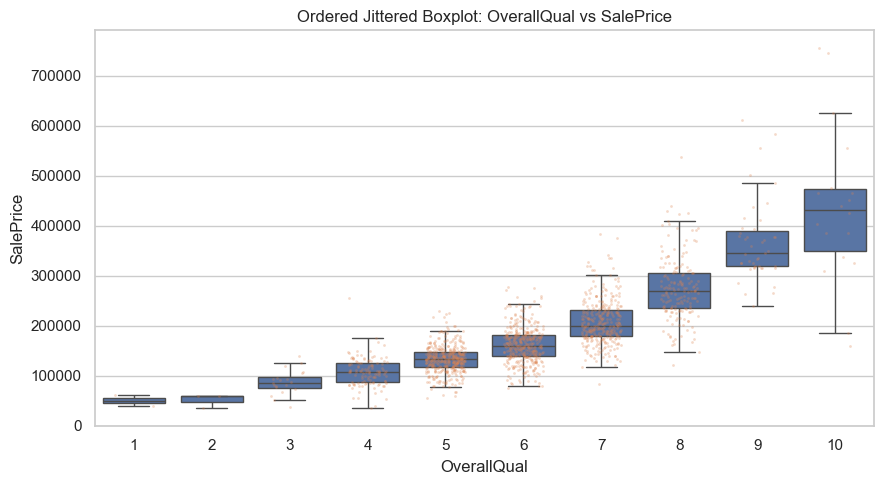

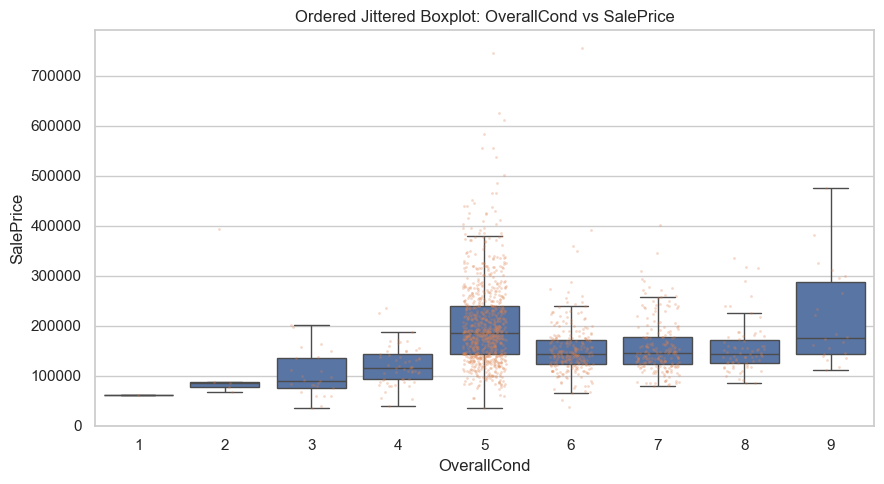

In [90]:
for feature in ordinal_numeric:
    plt.figure(figsize=(9, 5))

    order = sorted(train[feature].dropna().unique())

    sns.boxplot(
        data=train,
        x=feature,
        y="SalePrice",
        order=order,
        showfliers=False
    )

    sns.stripplot(
        data=train,
        x=feature,
        y="SalePrice",
        order=order,
        jitter=0.25,
        alpha=0.30,
        size=2
    )

    plt.title(f"Ordered Jittered Boxplot: {feature} vs SalePrice")
    plt.xlabel(feature)
    plt.ylabel("SalePrice")

    plt.tight_layout()
    plt.show()

### Median Target Trend by Ordinal Score

This plot shows how median `SalePrice` changes across ordered score levels.

It helps detect monotonic, nonlinear, or unstable score-target behavior.

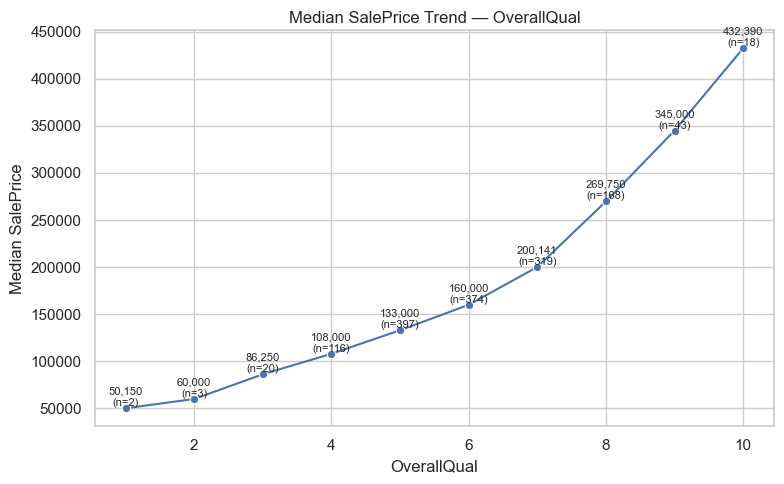

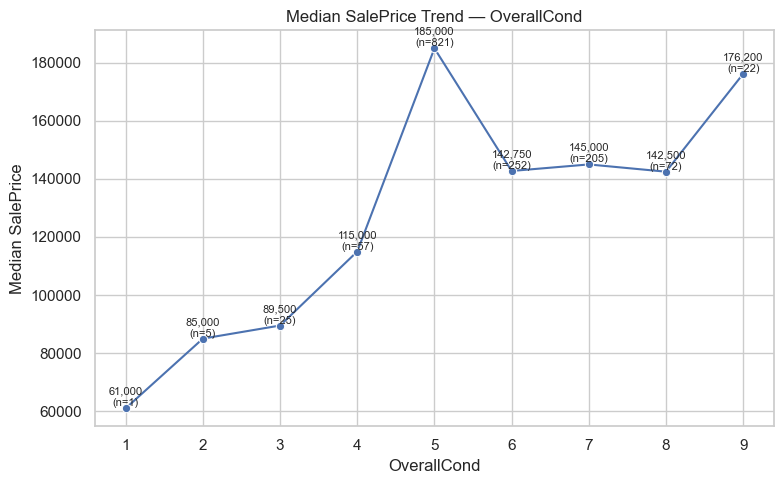

In [91]:
for feature in ordinal_numeric:
    trend = ordinal_numeric_target_summary[
        ordinal_numeric_target_summary["feature"] == feature
    ].copy()

    plt.figure(figsize=(8, 5))

    sns.lineplot(
        data=trend,
        x="score",
        y="median_saleprice",
        marker="o"
    )

    for x, y, n in zip(
        trend["score"],
        trend["median_saleprice"],
        trend["sample_count"]
    ):
        plt.text(
            x,
            y,
            f"{y:,.0f}\n(n={n})",
            ha="center",
            va="bottom",
            fontsize=8
        )

    plt.title(f"Median SalePrice Trend — {feature}")
    plt.xlabel(feature)
    plt.ylabel("Median SalePrice")

    plt.tight_layout()
    plt.show()

### Median Log Target Trend

This plot shows the score-level trend using `SalePrice_log`.

This view is useful because the original target is right-skewed.

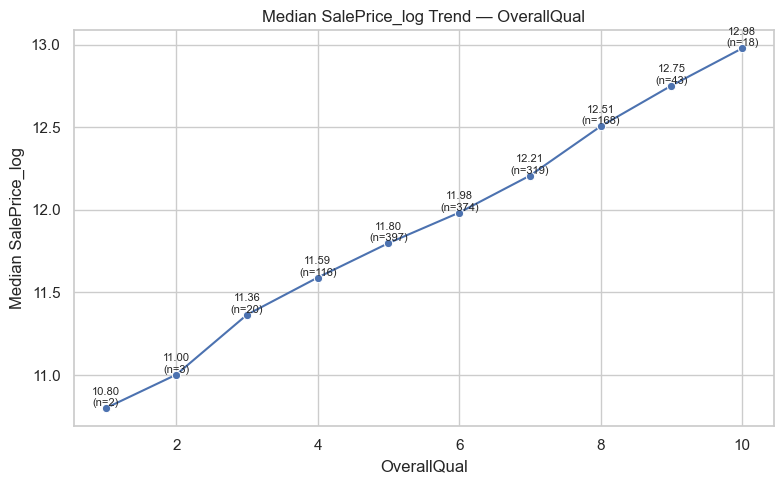

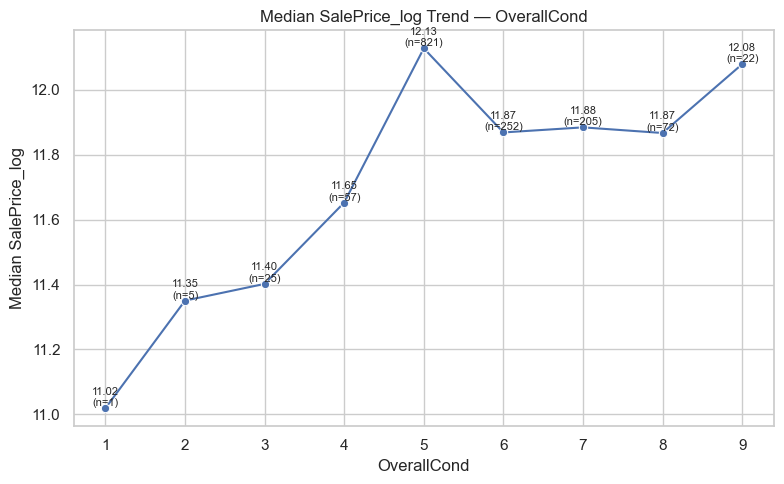

In [92]:
for feature in ordinal_numeric:
    trend = ordinal_numeric_target_summary[
        ordinal_numeric_target_summary["feature"] == feature
    ].copy()

    plt.figure(figsize=(8, 5))

    sns.lineplot(
        data=trend,
        x="score",
        y="median_log_saleprice",
        marker="o"
    )

    for x, y, n in zip(
        trend["score"],
        trend["median_log_saleprice"],
        trend["sample_count"]
    ):
        plt.text(
            x,
            y,
            f"{y:.2f}\n(n={n})",
            ha="center",
            va="bottom",
            fontsize=8
        )

    plt.title(f"Median SalePrice_log Trend — {feature}")
    plt.xlabel(feature)
    plt.ylabel("Median SalePrice_log")

    plt.tight_layout()
    plt.show()

### Rare Score Stability Check

Rare score levels may have unstable target statistics because they contain few samples.

These score levels are not removed automatically.  
They are only reviewed.

In [93]:
rare_score_threshold = 20

rare_ordinal_score_report = (
    ordinal_numeric_target_summary[
        ordinal_numeric_target_summary["sample_count"] < rare_score_threshold
    ]
    .sort_values(by=["feature", "sample_count"])
)

display(rare_ordinal_score_report.round(4))

,feature,score,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
10,OverallCond,1,1,61000.0000,61000.0000,11.0186,11.0186
11,OverallCond,2,5,141986.4000,85000.0000,11.5934,11.3504
0,OverallQual,1,2,50150.0000,50150.0000,10.7988,10.7988
1,OverallQual,2,3,51770.3333,60000.0000,10.8254,11.0021
9,OverallQual,10,18,438588.3889,432390.0000,12.9213,12.9770


### Ordinal Numeric vs Target — Action Summary

This table summarizes target relationship and suggested action for ordinal numeric features.

In [94]:
ordinal_numeric_action_summary = []

for feature in ordinal_numeric:
    corr_row = ordinal_numeric_corr[
        ordinal_numeric_corr["feature"] == feature
    ].iloc[0]

    trend = ordinal_numeric_target_summary[
        ordinal_numeric_target_summary["feature"] == feature
    ].copy()

    abs_corr = abs(corr_row["spearman_log_saleprice"])

    if abs_corr >= 0.70:
        signal_strength = "Very Strong"
    elif abs_corr >= 0.50:
        signal_strength = "Strong"
    elif abs_corr >= 0.30:
        signal_strength = "Medium"
    elif abs_corr >= 0.10:
        signal_strength = "Weak"
    else:
        signal_strength = "Very Weak"

    rare_score_count = (trend["sample_count"] < rare_score_threshold).sum()

    if feature == "OverallQual":
        suggested_action = "Keep as priority predictor; consider quality-size interaction later"
    elif feature == "OverallCond":
        suggested_action = "Keep raw; inspect nonlinear behavior later"
    else:
        suggested_action = "Keep raw; validate later"

    ordinal_numeric_action_summary.append({
        "feature": feature,
        "spearman_log_corr": corr_row["spearman_log_saleprice"],
        "signal_strength": signal_strength,
        "min_score": train[feature].min(),
        "max_score": train[feature].max(),
        "rare_score_count": rare_score_count,
        "suggested_action": suggested_action
    })

ordinal_numeric_action_summary = pd.DataFrame(ordinal_numeric_action_summary)

display(
    ordinal_numeric_action_summary
    .sort_values(by="spearman_log_corr", key=lambda x: x.abs(), ascending=False)
    .round(4)
)

,feature,spearman_log_corr,signal_strength,min_score,max_score,rare_score_count,suggested_action
0,OverallQual,0.8098,Very Strong,1,10,3,Keep as priority predictor; consider quality-s...
1,OverallCond,-0.1293,Weak,1,9,2,Keep raw; inspect nonlinear behavior later


### Ordinal Numeric vs Target — Final Notes

- Ordinal numeric features should remain as raw score values.
- `OverallQual` is expected to be a very strong positive predictor.
- `OverallCond` may show weaker or less linear behavior.
- Rare score levels are not removed.
- Interaction features involving `OverallQual` can be considered later during feature engineering.

## 8.5 Temporal Features vs Target

In this section, I analyze temporal/date-like features against the target variable `SalePrice`.

Temporal features are not regular continuous variables.  
The goal is to check:

- whether newer houses have higher prices,
- whether recent remodeling is related to higher prices,
- whether garage build year has target signal,
- whether sale month shows seasonal price behavior,
- whether sale year shows market/year effect,
- and which age-based feature engineering ideas may be useful later.

No age-based feature is created in this section.

In [95]:
temporal_target_summary = []

for feature in temporal_features:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].dropna().copy()

    temporal_target_summary.append({
        "feature": feature,
        "valid_pair_count": len(temp),
        "missing_value": train[feature].isnull().sum(),
        "missing_percentage": train[feature].isnull().mean() * 100,
        "unique_value": train[feature].nunique(dropna=False),
        "min_value": temp[feature].min(),
        "max_value": temp[feature].max(),
        "pearson_saleprice": temp[feature].corr(temp["SalePrice"], method="pearson"),
        "spearman_saleprice": temp[feature].corr(temp["SalePrice"], method="spearman"),
        "pearson_log_saleprice": temp[feature].corr(temp["SalePrice_log"], method="pearson"),
        "spearman_log_saleprice": temp[feature].corr(temp["SalePrice_log"], method="spearman")
    })

temporal_target_summary = pd.DataFrame(temporal_target_summary)

display(
    temporal_target_summary
    .sort_values(by="spearman_log_saleprice", key=lambda x: x.abs(), ascending=False)
    .round(4)
)

,feature,valid_pair_count,missing_value,missing_percentage,unique_value,min_value,max_value,pearson_saleprice,spearman_saleprice,pearson_log_saleprice,spearman_log_saleprice
0,YearBuilt,1460,0,0.0000,112,1872.0000,2010.0000,0.5229,0.6527,0.5866,0.6527
2,GarageYrBlt,1379,81,5.5479,98,1900.0000,2010.0000,0.4864,0.5938,0.5411,0.5938
1,YearRemodAdd,1460,0,0.0000,61,1950.0000,2010.0000,0.5071,0.5712,0.5656,0.5712
3,MoSold,1460,0,0.0000,12,1.0000,12.0000,0.0464,0.0694,0.0573,0.0694
4,YrSold,1460,0,0.0000,5,2006.0000,2010.0000,-0.0289,-0.0299,-0.0373,-0.0299


### Temporal Feature Correlation with Target

This plot shows Spearman correlation between temporal features and `SalePrice_log`.

Spearman correlation is used because temporal relationships may be monotonic but not perfectly linear.

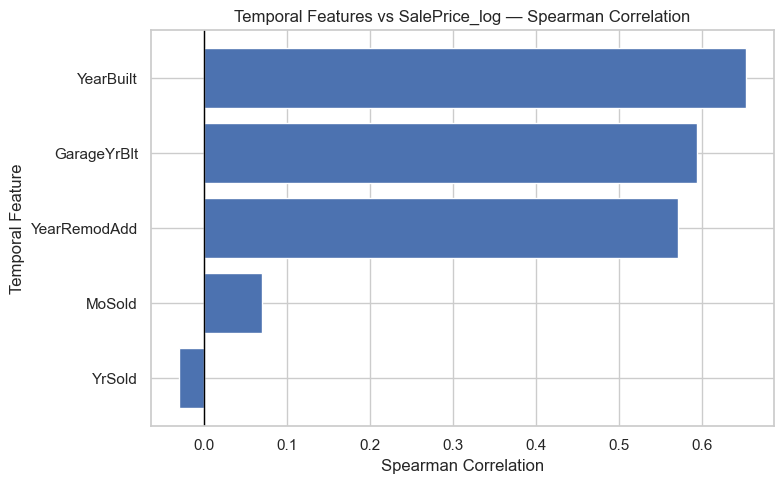

In [96]:
plot_df = temporal_target_summary.sort_values(
    by="spearman_log_saleprice",
    ascending=True
)

plt.figure(figsize=(8, 5))

plt.barh(
    plot_df["feature"],
    plot_df["spearman_log_saleprice"]
)

plt.axvline(0, color="black", linewidth=1)
plt.title("Temporal Features vs SalePrice_log — Spearman Correlation")
plt.xlabel("Spearman Correlation")
plt.ylabel("Temporal Feature")

plt.tight_layout()
plt.show()

### Year Feature Trend with SalePrice_log

These plots show whether newer construction, recent remodeling, or newer garages are associated with higher `SalePrice_log`.

LOWESS helps detect nonlinear temporal trends.


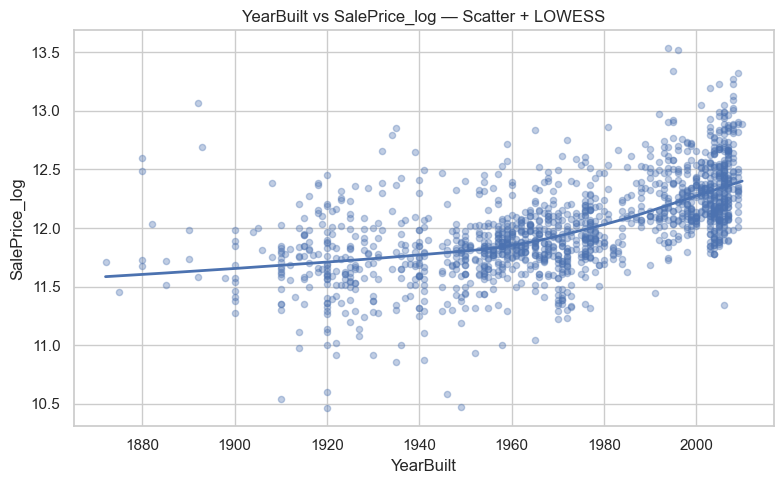

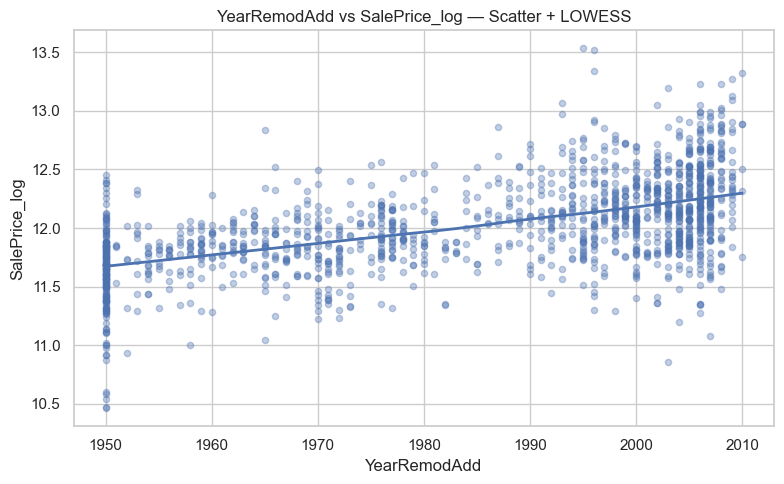

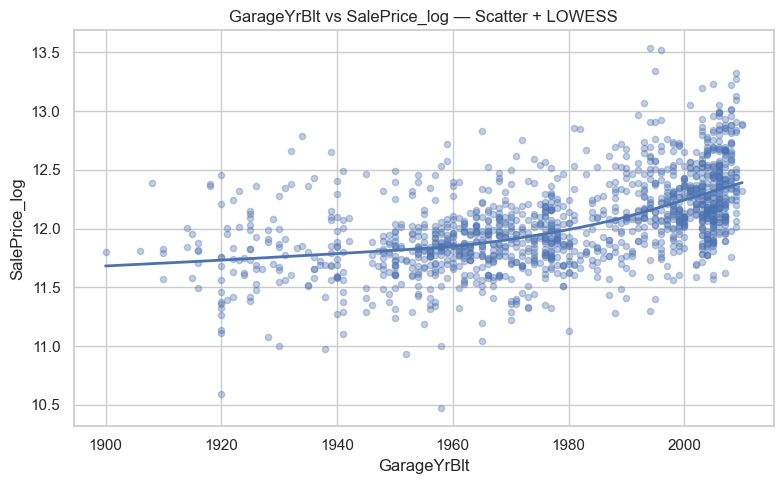

In [97]:
year_target_features = [
    "YearBuilt",
    "YearRemodAdd",
    "GarageYrBlt"
]

for feature in year_target_features:
    temp = train[[feature, "SalePrice_log"]].dropna().copy()

    plt.figure(figsize=(8, 5))

    sns.regplot(
        data=temp,
        x=feature,
        y="SalePrice_log",
        lowess=True,
        scatter_kws={"alpha": 0.35, "s": 20},
        line_kws={"linewidth": 2}
    )

    plt.title(f"{feature} vs SalePrice_log — Scatter + LOWESS")
    plt.xlabel(feature)
    plt.ylabel("SalePrice_log")

    plt.tight_layout()
    plt.show()

### Decade-wise Median SalePrice Trend

Year features are grouped by decade.  
This helps compare older and newer houses in a cleaner way.

In [98]:
def decade_target_summary(df, feature, target="SalePrice"):
    temp = df[[feature, target]].dropna().copy()

    temp["decade"] = (temp[feature] // 10 * 10).astype(int)

    summary = (
        temp
        .groupby("decade")
        .agg(
            sample_count=(target, "count"),
            mean_saleprice=(target, "mean"),
            median_saleprice=(target, "median")
        )
        .reset_index()
    )

    summary["feature"] = feature
    summary["decade_label"] = summary["decade"].astype(str) + "s"

    summary = summary[
        [
            "feature",
            "decade",
            "decade_label",
            "sample_count",
            "mean_saleprice",
            "median_saleprice"
        ]
    ]

    return summary


temporal_decade_target_summary = []

for feature in year_target_features:
    summary = decade_target_summary(
        train,
        feature,
        target="SalePrice"
    )

    temporal_decade_target_summary.append(summary)

temporal_decade_target_summary = pd.concat(
    temporal_decade_target_summary,
    ignore_index=True
)

display(temporal_decade_target_summary.round(2))

,feature,decade,decade_label,sample_count,mean_saleprice,median_saleprice
0,YearBuilt,1870,1870s,2,108000.0000,108000.0000
1,YearBuilt,1880,1880s,7,170425.5700,124000.0000
2,YearBuilt,1890,1890s,6,216316.6700,142200.0000
3,YearBuilt,1900,1900s,15,129828.4000,127000.0000
4,YearBuilt,1910,1910s,58,131511.4800,128750.0000
5,YearBuilt,1920,1920s,97,123268.3500,115000.0000
6,YearBuilt,1930,1930s,54,144415.8300,126500.0000
7,YearBuilt,1940,1940s,79,126887.4800,122900.0000
8,YearBuilt,1950,1950s,167,140935.6700,136000.0000
9,YearBuilt,1960,1960s,175,153852.6400,146000.0000


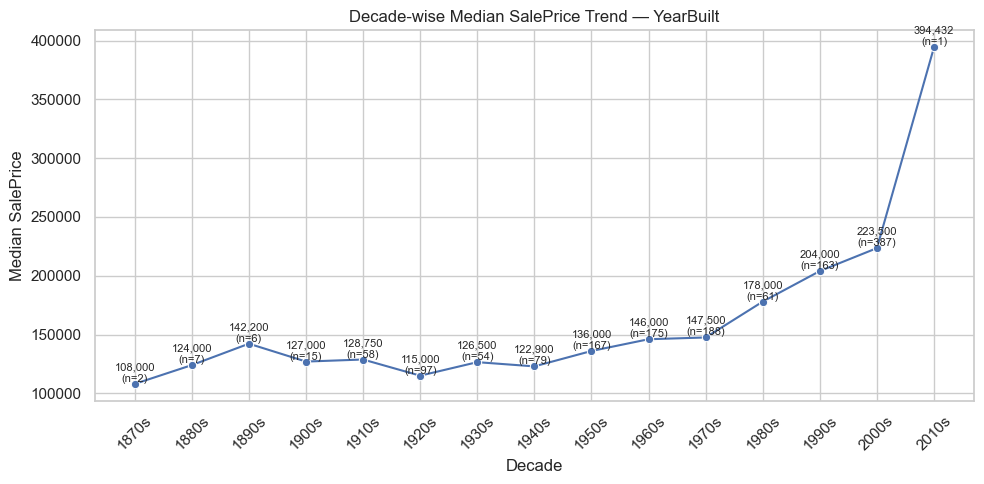

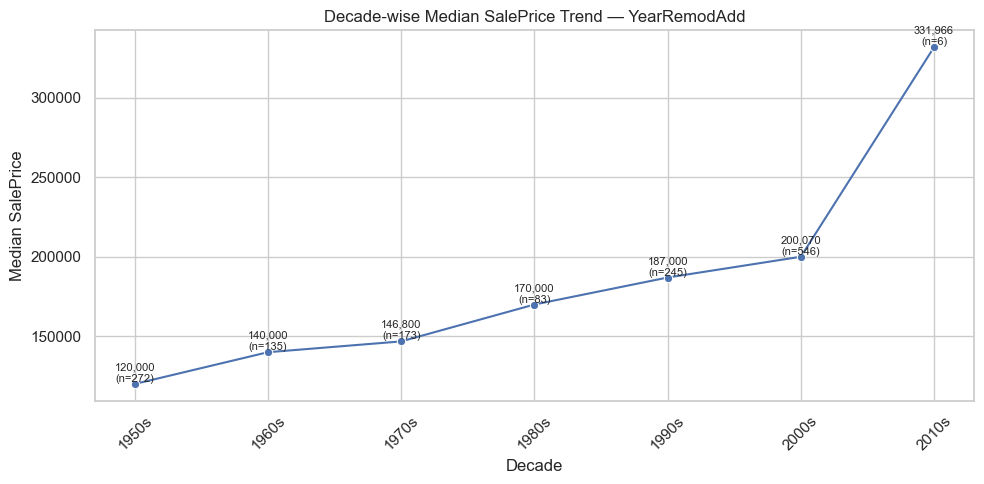

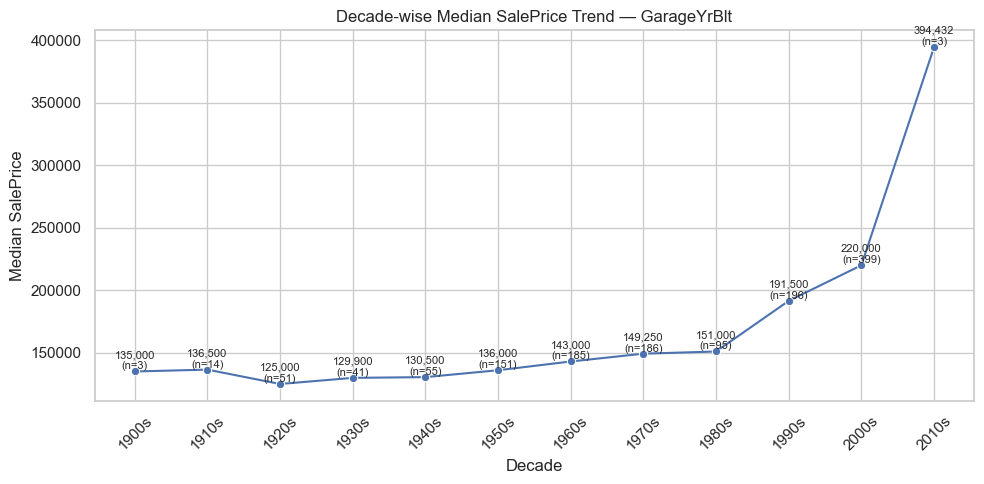

In [99]:
for feature in year_target_features:
    trend = temporal_decade_target_summary[
        temporal_decade_target_summary["feature"] == feature
    ].copy()

    plt.figure(figsize=(10, 5))

    sns.lineplot(
        data=trend,
        x="decade_label",
        y="median_saleprice",
        marker="o"
    )

    for x, y, n in zip(
        trend["decade_label"],
        trend["median_saleprice"],
        trend["sample_count"]
    ):
        plt.text(
            x,
            y,
            f"{y:,.0f}\n(n={n})",
            ha="center",
            va="bottom",
            fontsize=8
        )

    plt.title(f"Decade-wise Median SalePrice Trend — {feature}")
    plt.xlabel("Decade")
    plt.ylabel("Median SalePrice")
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

### Month Sold vs SalePrice

This checks whether sale month has seasonal price behavior.

Month is treated as a discrete temporal feature.

In [100]:
month_target_summary = (
    train
    .groupby("MoSold")
    .agg(
        sample_count=("SalePrice", "count"),
        mean_saleprice=("SalePrice", "mean"),
        median_saleprice=("SalePrice", "median"),
        mean_log_saleprice=("SalePrice_log", "mean"),
        median_log_saleprice=("SalePrice_log", "median")
    )
    .reset_index()
)

display(month_target_summary.round(4))

,MoSold,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,1,58,183256.2586,151650.0000,11.9633,11.9292
1,2,52,177882.0000,173250.0000,12.0471,12.0625
2,3,106,183253.9245,165250.0000,12.0301,12.0152
3,4,141,171503.2624,147000.0000,11.9721,11.8982
4,5,204,172307.2696,154000.0000,11.9849,11.9447
5,6,253,177395.7352,163000.0000,12.0199,12.0015
6,7,234,186331.1923,165195.0000,12.0428,12.0149
7,8,122,184651.8279,174450.0000,12.0491,12.0694
8,9,63,195683.2063,185900.0000,12.0986,12.1330
9,10,89,179563.9775,159000.0000,12.0201,11.9767


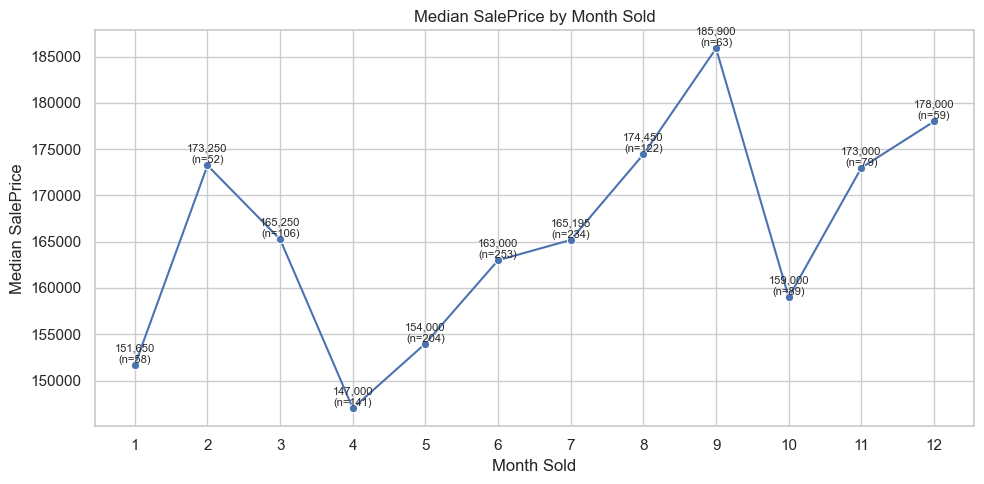

In [101]:
plt.figure(figsize=(10, 5))

sns.lineplot(
    data=month_target_summary,
    x="MoSold",
    y="median_saleprice",
    marker="o"
)

for x, y, n in zip(
    month_target_summary["MoSold"],
    month_target_summary["median_saleprice"],
    month_target_summary["sample_count"]
):
    plt.text(
        x,
        y,
        f"{y:,.0f}\n(n={n})",
        ha="center",
        va="bottom",
        fontsize=8
    )

plt.title("Median SalePrice by Month Sold")
plt.xlabel("Month Sold")
plt.ylabel("Median SalePrice")
plt.xticks(range(1, 13))

plt.tight_layout()
plt.show()

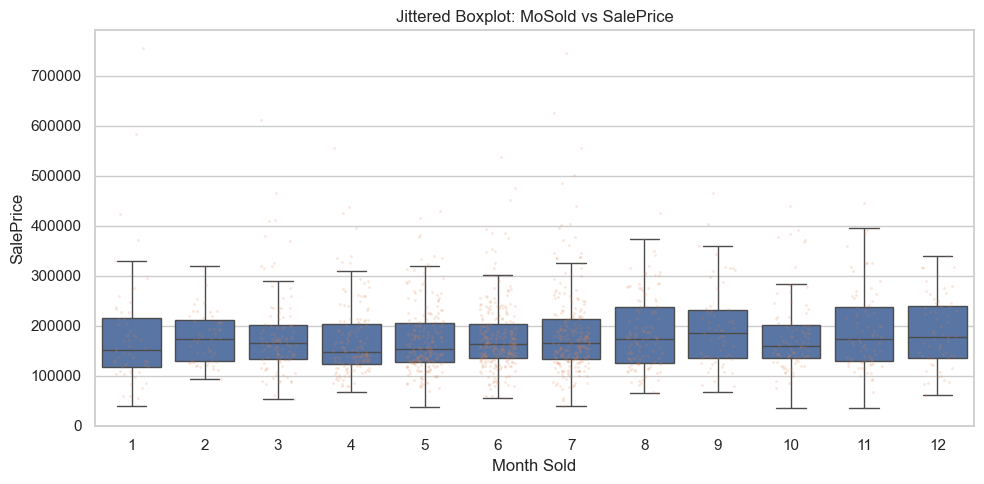

In [102]:
plt.figure(figsize=(10, 5))

sns.boxplot(
    data=train,
    x="MoSold",
    y="SalePrice",
    showfliers=False
)

sns.stripplot(
    data=train,
    x="MoSold",
    y="SalePrice",
    jitter=0.25,
    alpha=0.20,
    size=2
)

plt.title("Jittered Boxplot: MoSold vs SalePrice")
plt.xlabel("Month Sold")
plt.ylabel("SalePrice")

plt.tight_layout()
plt.show()

### Year Sold vs SalePrice

This checks whether sale year has market-period effect.

`YrSold` has a small number of unique years, so median target trend is used.

In [103]:
year_sold_target_summary = (
    train
    .groupby("YrSold")
    .agg(
        sample_count=("SalePrice", "count"),
        mean_saleprice=("SalePrice", "mean"),
        median_saleprice=("SalePrice", "median"),
        mean_log_saleprice=("SalePrice_log", "mean"),
        median_log_saleprice=("SalePrice_log", "median")
    )
    .reset_index()
)

display(year_sold_target_summary.round(4))

,YrSold,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,2006,314,182549.4586,163995.0000,12.0350,12.0076
1,2007,329,186063.1520,167000.0000,12.0507,12.0258
2,2008,304,177360.8388,164000.0000,12.0142,12.0076
3,2009,338,179432.1036,162000.0000,12.0087,11.9954
4,2010,175,177393.6743,155000.0000,12.0011,11.9512


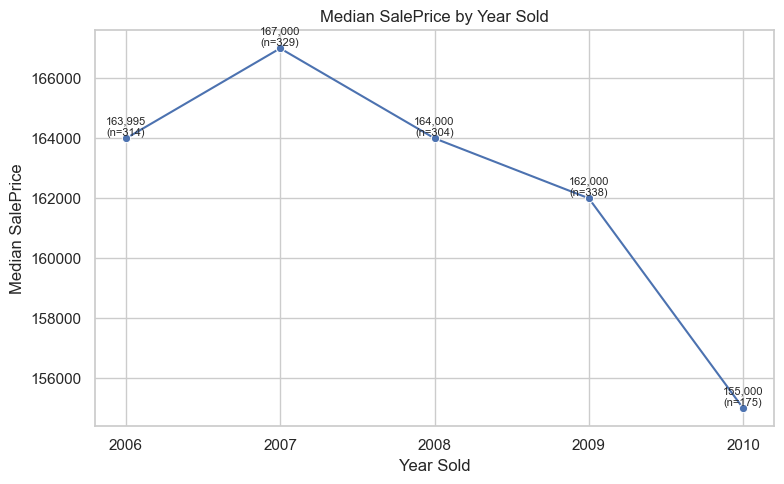

In [104]:
plt.figure(figsize=(8, 5))

sns.lineplot(
    data=year_sold_target_summary,
    x="YrSold",
    y="median_saleprice",
    marker="o"
)

for x, y, n in zip(
    year_sold_target_summary["YrSold"],
    year_sold_target_summary["median_saleprice"],
    year_sold_target_summary["sample_count"]
):
    plt.text(
        x,
        y,
        f"{y:,.0f}\n(n={n})",
        ha="center",
        va="bottom",
        fontsize=8
    )

plt.title("Median SalePrice by Year Sold")
plt.xlabel("Year Sold")
plt.ylabel("Median SalePrice")
plt.xticks(sorted(train["YrSold"].unique()))

plt.tight_layout()
plt.show()

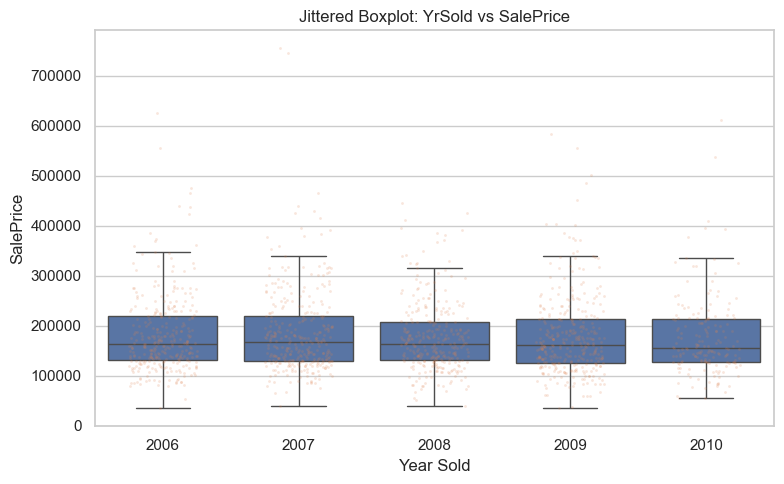

In [105]:
plt.figure(figsize=(8, 5))

sns.boxplot(
    data=train,
    x="YrSold",
    y="SalePrice",
    showfliers=False
)

sns.stripplot(
    data=train,
    x="YrSold",
    y="SalePrice",
    jitter=0.25,
    alpha=0.20,
    size=2
)

plt.title("Jittered Boxplot: YrSold vs SalePrice")
plt.xlabel("Year Sold")
plt.ylabel("SalePrice")

plt.tight_layout()
plt.show()

### Temporal Features vs Target — Action Summary

This table summarizes the target relationship and possible feature engineering direction for temporal features.

In [106]:
temporal_action_summary = []

for feature in temporal_features:
    row = temporal_target_summary[
        temporal_target_summary["feature"] == feature
    ].iloc[0]

    abs_corr = abs(row["spearman_log_saleprice"])

    if abs_corr >= 0.50:
        signal_strength = "Strong"
    elif abs_corr >= 0.30:
        signal_strength = "Medium"
    elif abs_corr >= 0.10:
        signal_strength = "Weak"
    else:
        signal_strength = "Very Weak"

    if feature == "YearBuilt":
        suggested_action = "Create HouseAge later; keep raw year for now"
    elif feature == "YearRemodAdd":
        suggested_action = "Create RemodAge / IsRemodeled later"
    elif feature == "GarageYrBlt":
        suggested_action = "Handle missing carefully; create GarageAge later"
    elif feature == "MoSold":
        suggested_action = "Test season/cyclic month encoding later"
    elif feature == "YrSold":
        suggested_action = "Keep or use as market-period feature if useful"
    else:
        suggested_action = "Keep for now"

    temporal_action_summary.append({
        "feature": feature,
        "spearman_log_corr": row["spearman_log_saleprice"],
        "signal_strength": signal_strength,
        "missing_percentage": row["missing_percentage"],
        "unique_value": row["unique_value"],
        "suggested_action": suggested_action
    })

temporal_action_summary = pd.DataFrame(temporal_action_summary)

display(
    temporal_action_summary
    .sort_values(by="spearman_log_corr", key=lambda x: x.abs(), ascending=False)
    .round(4)
)

,feature,spearman_log_corr,signal_strength,missing_percentage,unique_value,suggested_action
0,YearBuilt,0.6527,Strong,0.0000,112,Create HouseAge later; keep raw year for now
2,GarageYrBlt,0.5938,Strong,5.5479,98,Handle missing carefully; create GarageAge later
1,YearRemodAdd,0.5712,Strong,0.0000,61,Create RemodAge / IsRemodeled later
3,MoSold,0.0694,Very Weak,0.0000,12,Test season/cyclic month encoding later
4,YrSold,-0.0299,Very Weak,0.0000,5,Keep or use as market-period feature if useful


### Temporal Features vs Target — Final Notes

- Newer construction and remodeling may show positive relationship with `SalePrice`.
- `GarageYrBlt` should be interpreted carefully because missing values often indicate no garage.
- Month sold may show seasonal variation, but it should not be overinterpreted without model validation.
- Year sold may capture market-period differences, but the year range is limited.
- Age-based features should be created later during feature engineering, not in this section.

## 8.6 Nominal Categorical vs Target

In this section, I analyze nominal categorical features against the target variable `SalePrice`.

Nominal categorical features do not have natural order.  
The goal is to check:

- category-wise target behavior,
- high-price and low-price categories,
- sample count stability,
- rare category target behavior,
- and possible encoding/grouping opportunities.

For high-cardinality features, sorted median target plots are more useful than regular unordered plots.

In [107]:
nominal_target_summary = []

for feature in nominal_categorical:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].copy()
    temp[feature] = temp[feature].astype("object").where(temp[feature].notna(), "Missing")

    summary = (
        temp
        .groupby(feature)
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median"),
            mean_log_saleprice=("SalePrice_log", "mean"),
            median_log_saleprice=("SalePrice_log", "median")
        )
        .reset_index()
        .rename(columns={feature: "category"})
    )

    summary["feature"] = feature

    summary = summary[
        [
            "feature",
            "category",
            "sample_count",
            "mean_saleprice",
            "median_saleprice",
            "mean_log_saleprice",
            "median_log_saleprice"
        ]
    ]

    nominal_target_summary.append(summary)

nominal_target_summary = pd.concat(
    nominal_target_summary,
    ignore_index=True
)

display(nominal_target_summary.round(4))

,feature,category,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,MSSubClass,20,536,185224.8116,159250.0000,12.0528,11.9782
1,MSSubClass,30,69,95829.7246,99900.0000,11.4338,11.5119
2,MSSubClass,40,4,156125.0000,142500.0000,11.8704,11.8649
3,MSSubClass,45,12,108591.6667,107500.0000,11.5790,11.5851
4,MSSubClass,50,144,143302.9722,132000.0000,11.8145,11.7906
...,...,...,...,...,...,...,...
176,SaleCondition,AdjLand,4,104125.0000,104000.0000,11.5292,11.5293
177,SaleCondition,Alloca,12,167377.4167,148145.0000,11.9145,11.9053
178,SaleCondition,Family,20,149600.0000,140500.0000,11.8697,11.8525
179,SaleCondition,Normal,1198,175202.2195,160000.0000,12.0050,11.9829


### Eta-squared for Nominal Categorical Features

Eta-squared measures how much target variance is explained by category groups.

Higher eta-squared means the feature has stronger category-based target separation.

In [108]:
def eta_squared_categorical_target(df, feature, target):
    temp = df[[feature, target]].copy()
    temp[feature] = temp[feature].astype("object").where(temp[feature].notna(), "Missing")
    temp = temp.dropna(subset=[target])

    if temp[feature].nunique() <= 1:
        return np.nan

    overall_mean = temp[target].mean()

    grouped = temp.groupby(feature)[target]

    ss_between = sum(
        len(group) * (group.mean() - overall_mean) ** 2
        for _, group in grouped
    )

    ss_total = sum((temp[target] - overall_mean) ** 2)

    if ss_total == 0:
        return np.nan

    return ss_between / ss_total

In [109]:
nominal_eta_report = []

for feature in nominal_categorical:
    eta_raw = eta_squared_categorical_target(
        train,
        feature,
        "SalePrice"
    )

    eta_log = eta_squared_categorical_target(
        train,
        feature,
        "SalePrice_log"
    )

    unique_count = train[feature].nunique(dropna=False)
    missing_percentage = train[feature].isnull().mean() * 100

    nominal_eta_report.append({
        "feature": feature,
        "unique_category": unique_count,
        "missing_percentage": missing_percentage,
        "eta_squared_saleprice": eta_raw,
        "eta_squared_log_saleprice": eta_log
    })

nominal_eta_report = pd.DataFrame(nominal_eta_report)

display(
    nominal_eta_report
    .sort_values(by="eta_squared_log_saleprice", ascending=False)
    .round(4)
)

,feature,unique_category,missing_percentage,eta_squared_saleprice,eta_squared_log_saleprice
5,Neighborhood,25,0.0000,0.5456,0.5708
18,GarageType,7,5.5479,0.2492,0.3346
0,MSSubClass,15,0.0000,0.2463,0.3301
15,Foundation,6,0.0000,0.2564,0.3037
14,MasVnrType,4,59.7260,0.1833,0.1881
12,Exterior1st,15,0.0000,0.1528,0.1815
1,MSZoning,5,0.0000,0.1076,0.1758
13,Exterior2nd,16,0.0000,0.1538,0.1715
21,SaleCondition,6,0.0000,0.1355,0.1290
20,SaleType,9,0.0000,0.1373,0.1201


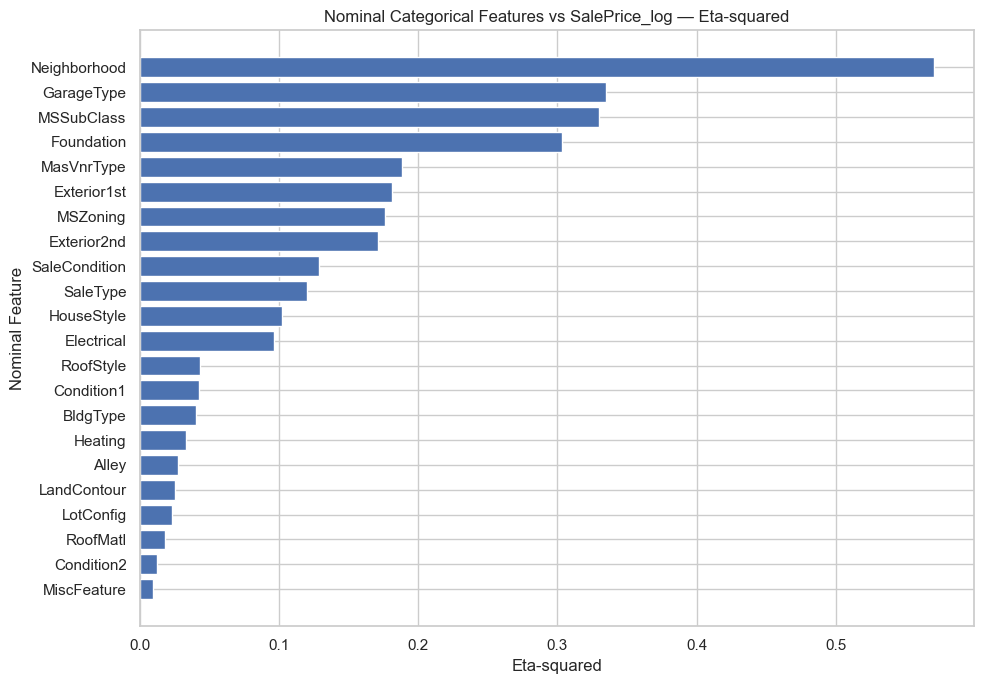

In [110]:
plot_df = nominal_eta_report.sort_values(
    by="eta_squared_log_saleprice",
    ascending=True
)

plt.figure(figsize=(10, 7))

plt.barh(
    plot_df["feature"],
    plot_df["eta_squared_log_saleprice"]
)

plt.title("Nominal Categorical Features vs SalePrice_log — Eta-squared")
plt.xlabel("Eta-squared")
plt.ylabel("Nominal Feature")

plt.tight_layout()
plt.show()

### Sorted Median SalePrice by Category

These plots show category-wise median `SalePrice`.

Categories are sorted by median price, so high-value and low-value groups are easier to identify.

Sample count is shown because rare categories may produce unstable median values.

In [111]:
important_nominal_features = (
    nominal_eta_report
    .sort_values(by="eta_squared_log_saleprice", ascending=False)
    .head(10)["feature"]
    .tolist()
)

important_nominal_features

['Neighborhood',
 'GarageType',
 'MSSubClass',
 'Foundation',
 'MasVnrType',
 'Exterior1st',
 'MSZoning',
 'Exterior2nd',
 'SaleCondition',
 'SaleType']

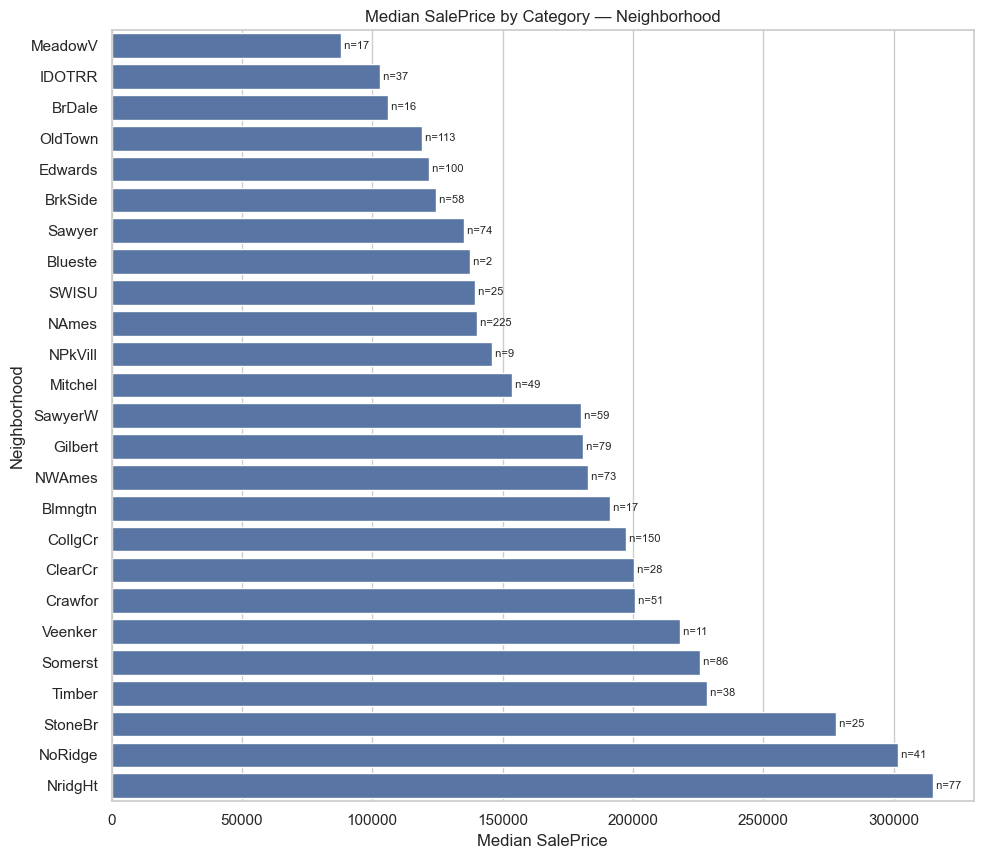

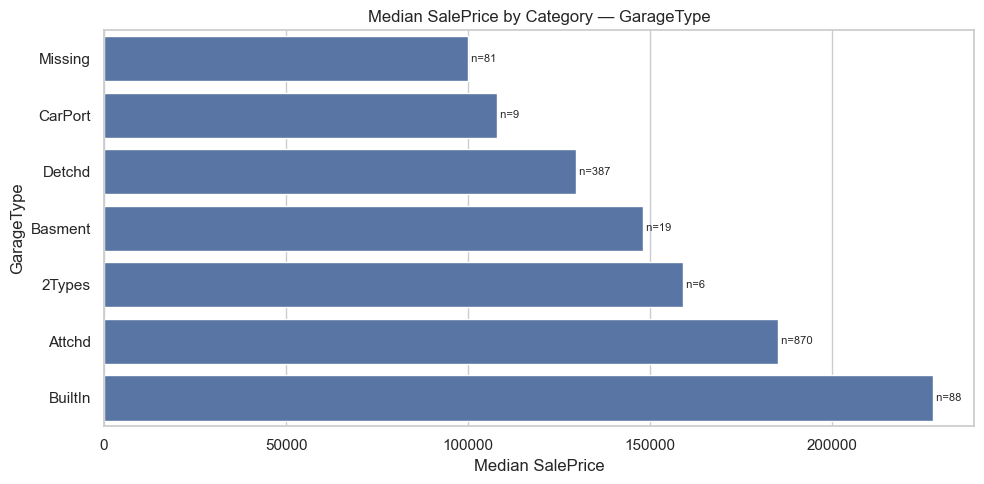

ValueError: Image size of 11118806x492 pixels is too large. It must be less than 2^23 in each direction.

<Figure size 1000x525 with 1 Axes>

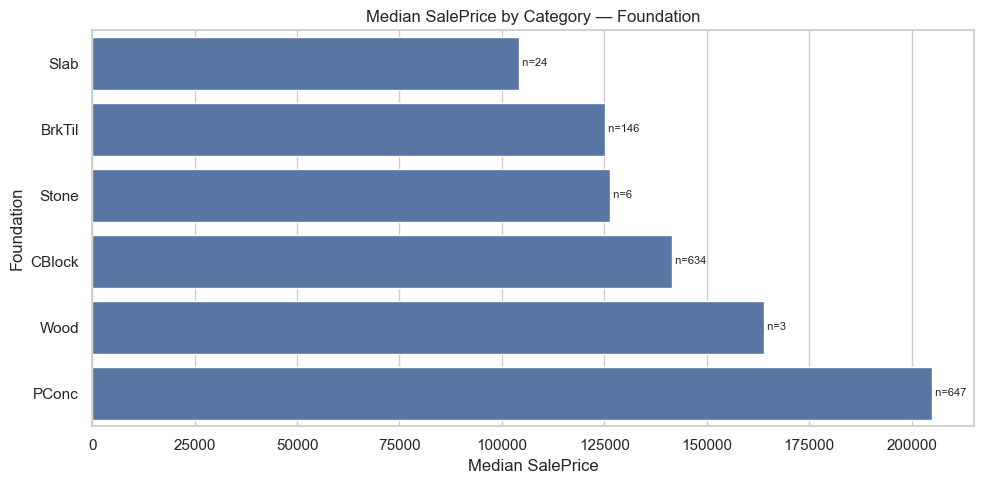

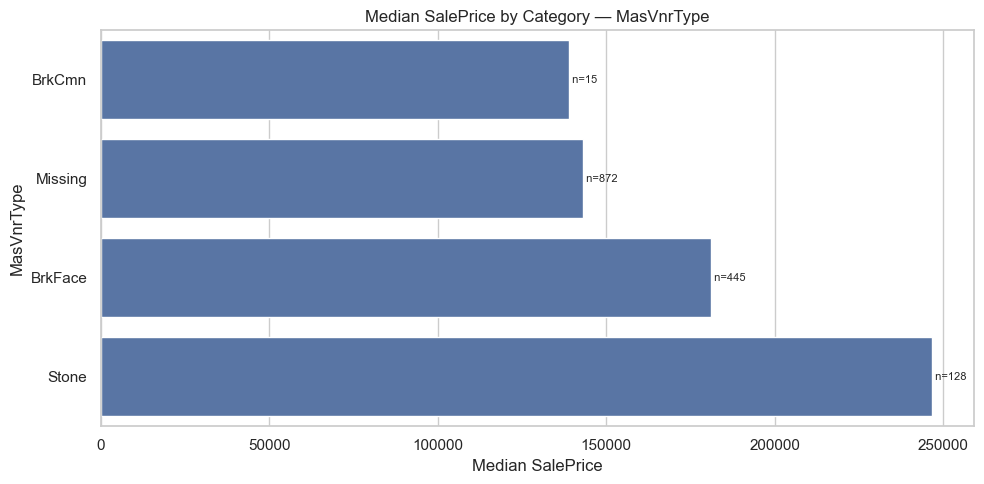

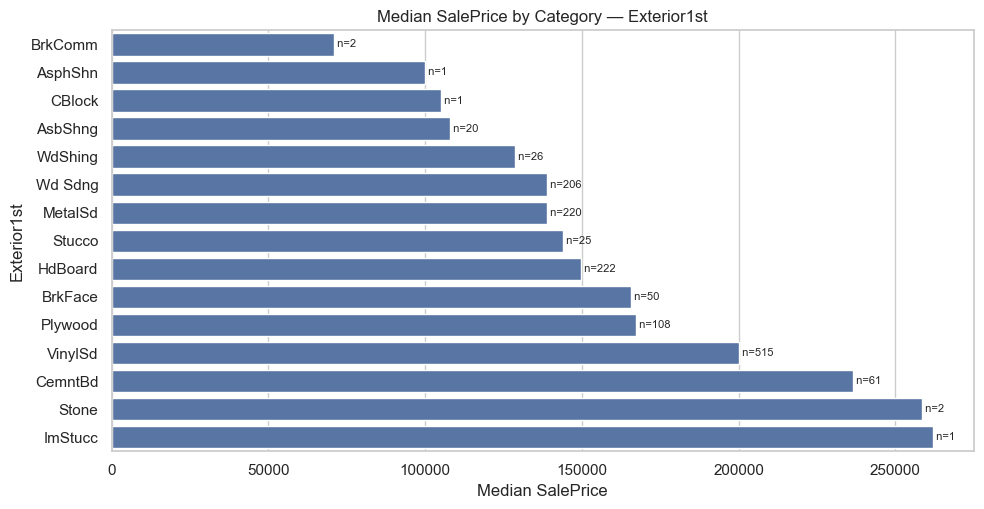

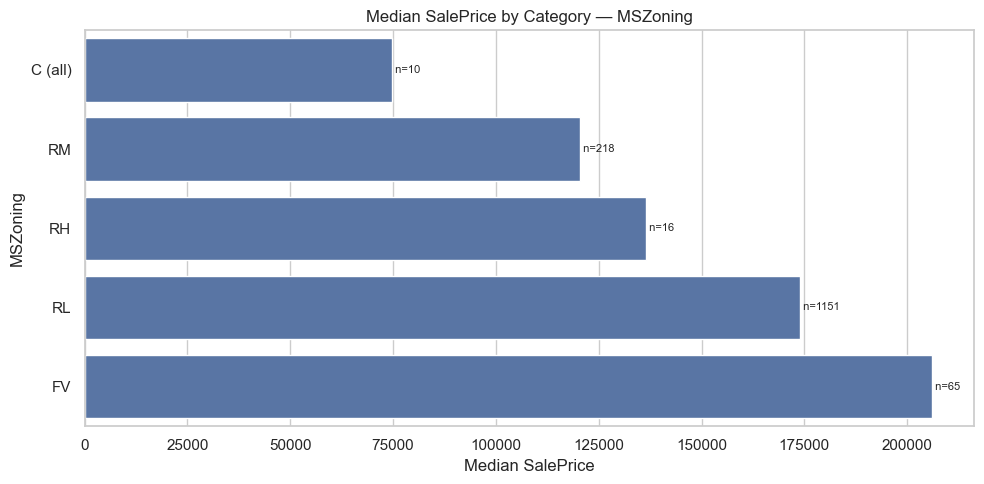

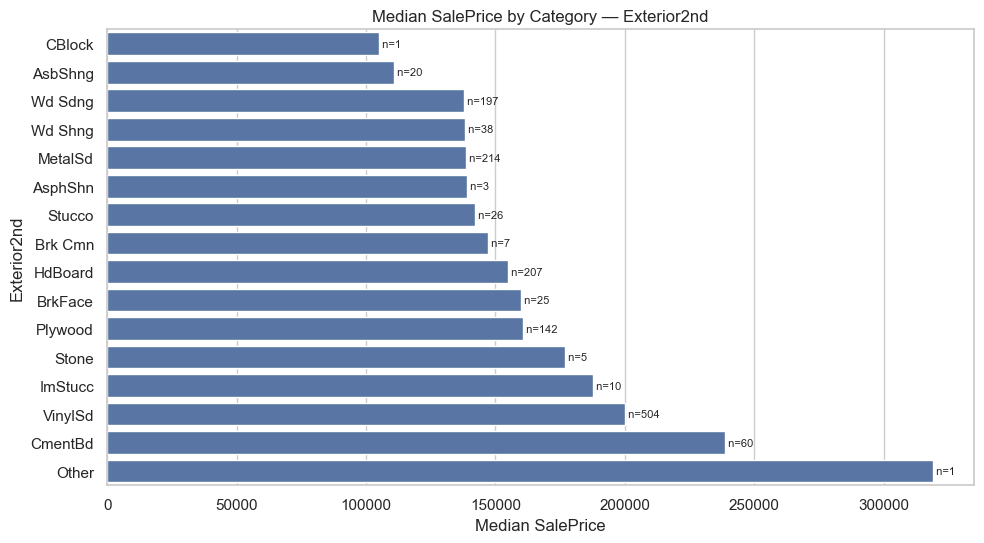

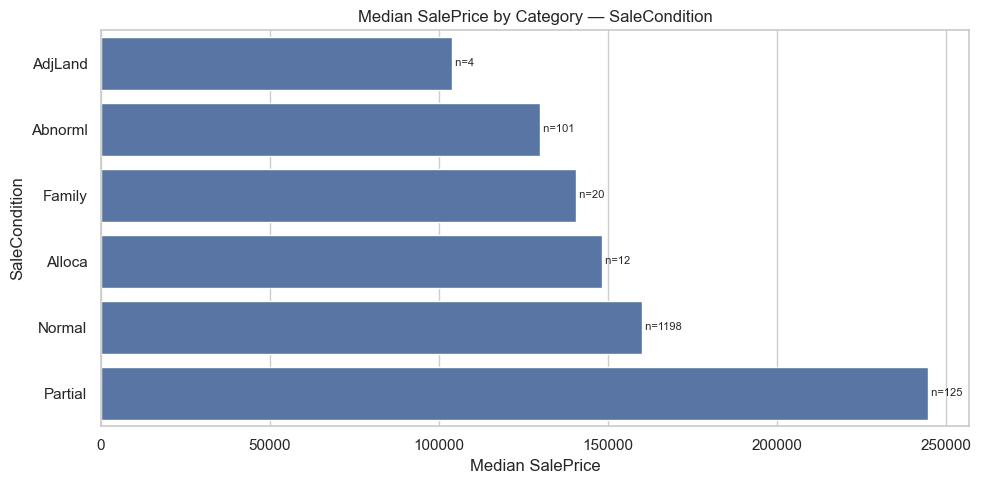

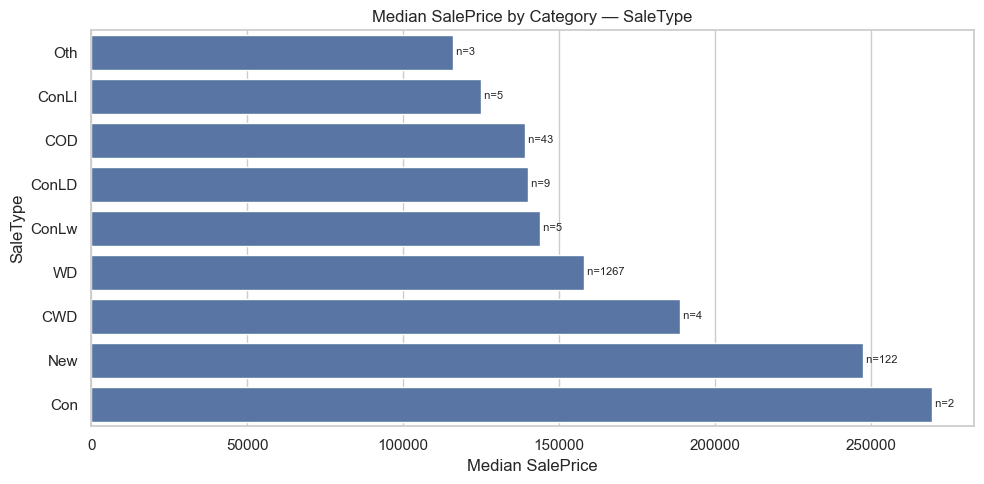

In [112]:
for feature in important_nominal_features:
    plot_df = nominal_target_summary[
        nominal_target_summary["feature"] == feature
    ].copy()

    plot_df = plot_df.sort_values(
        by="median_saleprice",
        ascending=True
    )

    plt.figure(figsize=(10, max(5, 0.35 * len(plot_df))))

    ax = sns.barplot(
        data=plot_df,
        x="median_saleprice",
        y="category"
    )

    plt.title(f"Median SalePrice by Category — {feature}")
    plt.xlabel("Median SalePrice")
    plt.ylabel(feature)

    for i, row in plot_df.reset_index(drop=True).iterrows():
        plt.text(
            row["median_saleprice"],
            i,
            f" n={int(row['sample_count'])}",
            va="center",
            fontsize=8
        )

    plt.tight_layout()
    plt.show()

### Boxplot for Important Nominal Features

These plots show target spread across categories.

For high-cardinality features, categories are ordered by median `SalePrice`.

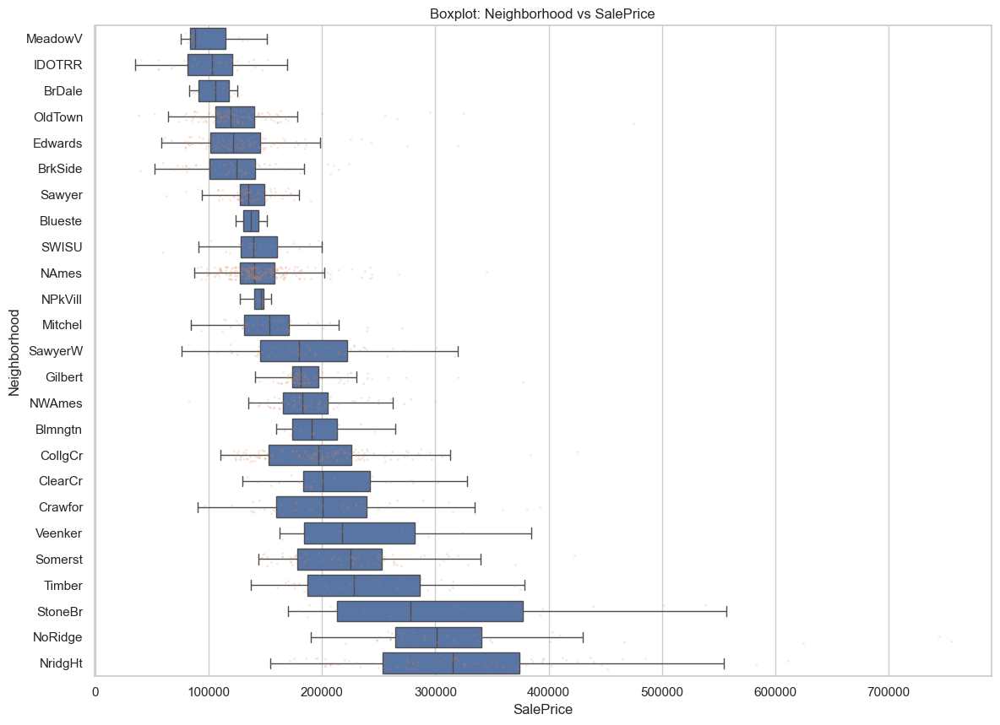

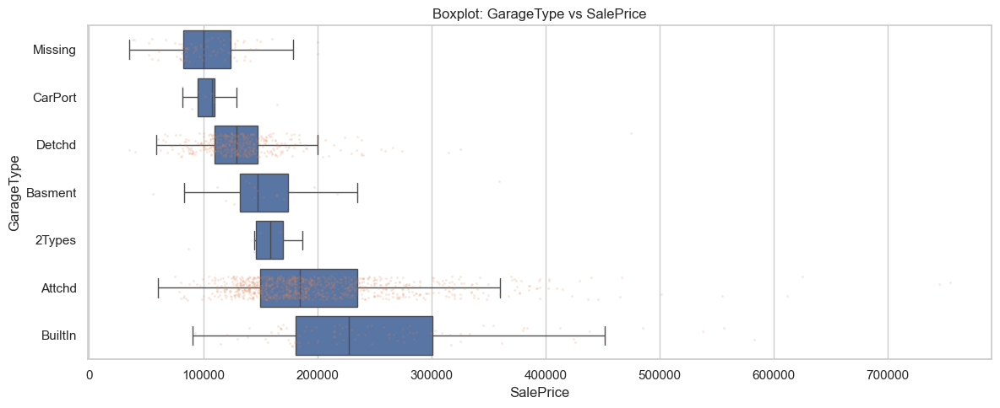

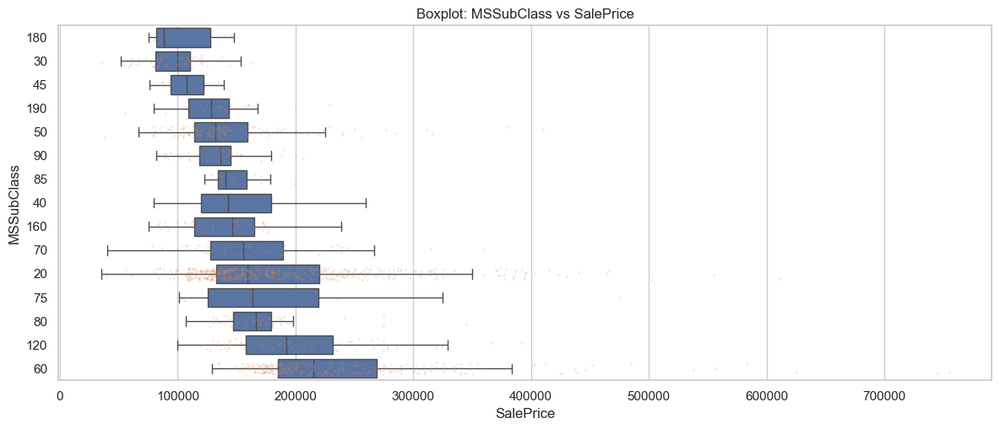

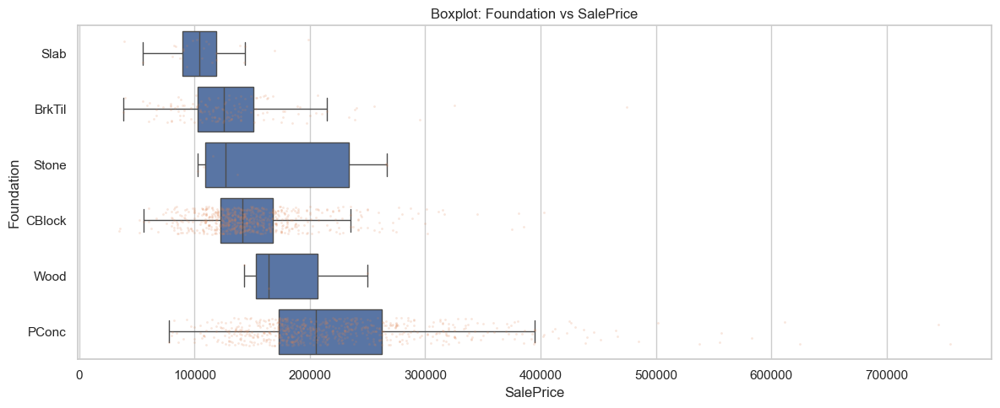

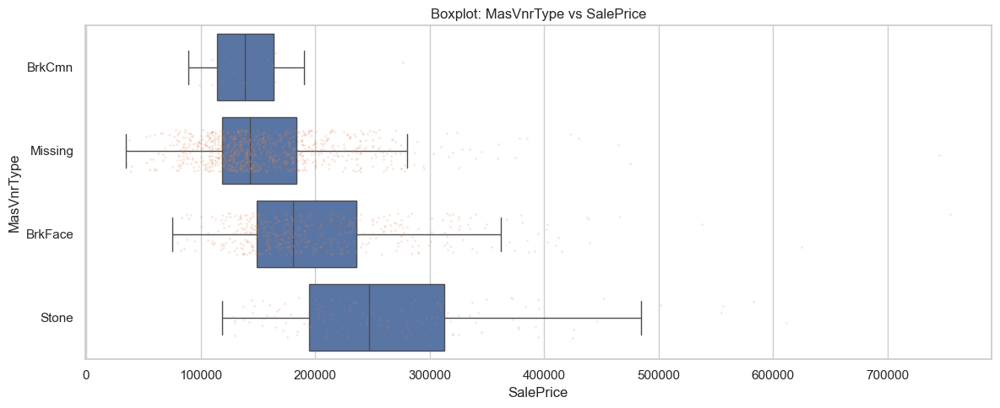

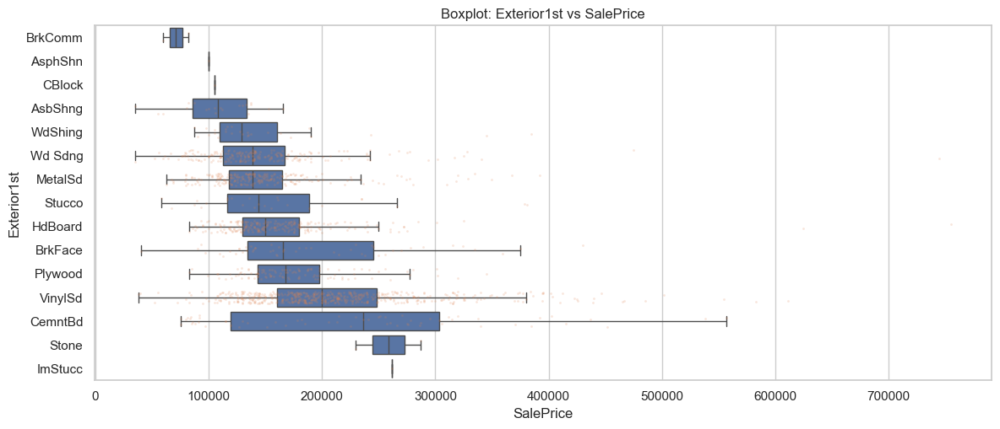

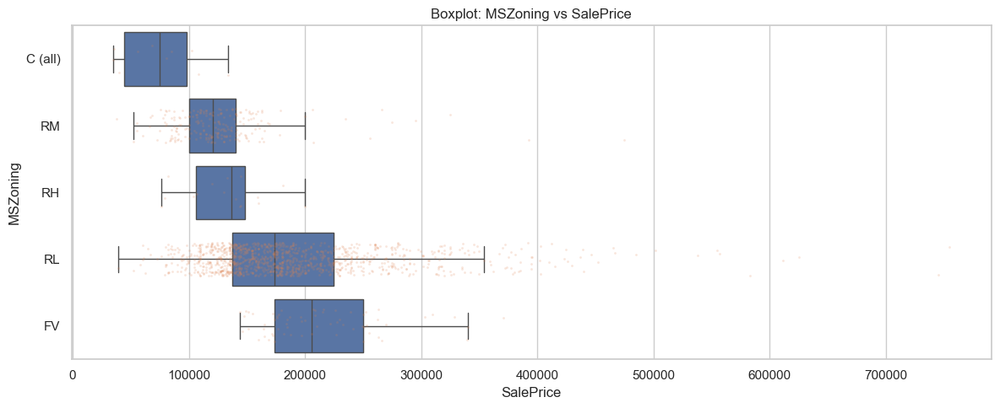

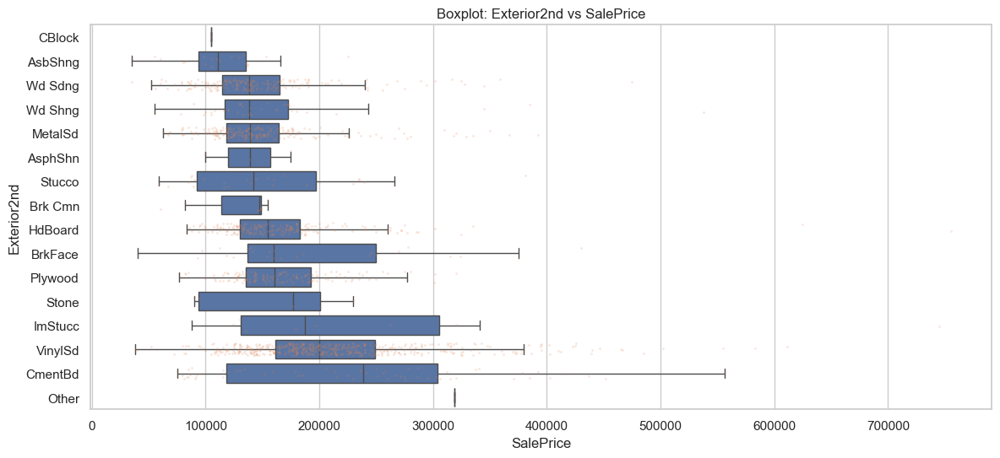

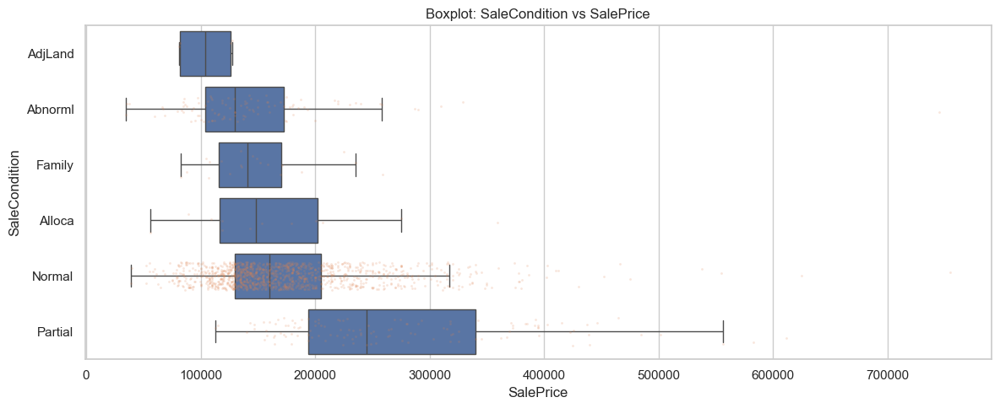

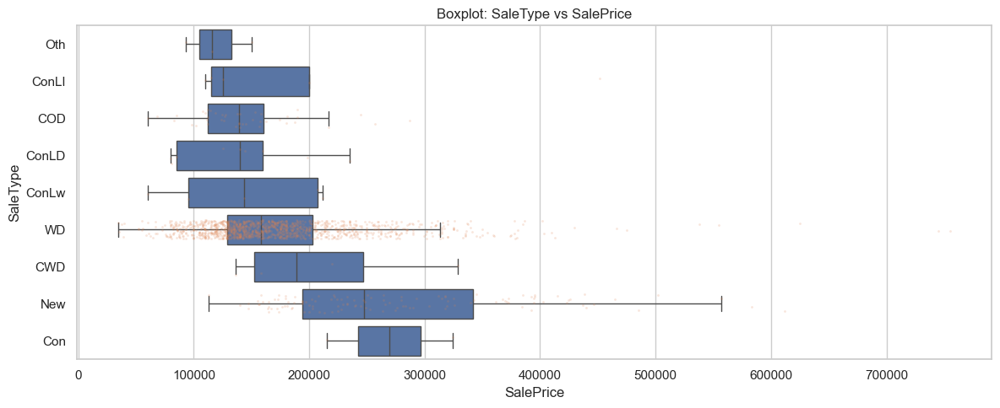

In [113]:
# Boxplot for important nominal features — fixed robust version

for feature in important_nominal_features:
    temp = train[[feature, "SalePrice"]].copy()

    # Convert all categories to string to avoid dtype/order mismatch
    temp[feature] = temp[feature].astype("object")
    temp[feature] = temp[feature].where(temp[feature].notna(), "Missing")
    temp[feature] = temp[feature].astype(str)

    # Category order by median SalePrice
    order = (
        temp
        .groupby(feature)["SalePrice"]
        .median()
        .sort_values()
        .index
        .astype(str)
        .tolist()
    )

    # Safety: keep only categories that actually exist in temp
    existing_categories = temp[feature].unique().tolist()
    order = [cat for cat in order if cat in existing_categories]

    plt.figure(figsize=(12, max(5, 0.35 * len(order))))

    sns.boxplot(
        data=temp,
        y=feature,
        x="SalePrice",
        order=order,
        showfliers=False
    )

    sns.stripplot(
        data=temp,
        y=feature,
        x="SalePrice",
        order=order,
        alpha=0.20,
        size=2,
        jitter=0.25
    )

    plt.title(f"Boxplot: {feature} vs SalePrice")
    plt.xlabel("SalePrice")
    plt.ylabel(feature)

    plt.tight_layout()
    plt.show()

### Top and Bottom Categories by Median SalePrice

This table shows the highest and lowest median price categories for each nominal feature.

Rare categories should be interpreted carefully.

In [114]:
top_bottom_nominal_categories = []

for feature in nominal_categorical:
    temp = nominal_target_summary[
        nominal_target_summary["feature"] == feature
    ].copy()

    temp = temp.sort_values(by="median_saleprice", ascending=False)

    top_categories = temp.head(3).copy()
    top_categories["position"] = "Top"

    bottom_categories = temp.tail(3).copy()
    bottom_categories["position"] = "Bottom"

    combined = pd.concat([top_categories, bottom_categories], ignore_index=True)

    top_bottom_nominal_categories.append(combined)

top_bottom_nominal_categories = pd.concat(
    top_bottom_nominal_categories,
    ignore_index=True
)

display(
    top_bottom_nominal_categories[
        [
            "feature",
            "position",
            "category",
            "sample_count",
            "median_saleprice",
            "mean_saleprice"
        ]
    ].round(2)
)

,feature,position,category,sample_count,median_saleprice,mean_saleprice
0,MSSubClass,Top,60,299,215200.0000,239948.5000
1,MSSubClass,Top,120,87,192000.0000,200779.0800
2,MSSubClass,Top,80,58,166500.0000,169736.5500
3,MSSubClass,Bottom,45,12,107500.0000,108591.6700
4,MSSubClass,Bottom,30,69,99900.0000,95829.7200
...,...,...,...,...,...,...
127,SaleCondition,Top,Normal,1198,160000.0000,175202.2200
128,SaleCondition,Top,Alloca,12,148145.0000,167377.4200
129,SaleCondition,Bottom,Family,20,140500.0000,149600.0000
130,SaleCondition,Bottom,Abnorml,101,130000.0000,146526.6200


### Rare Category Target Stability Check

Rare categories may show very high or very low median prices due to small sample size.

This table identifies rare categories using sample count threshold.

In [115]:
rare_category_sample_threshold = 20

nominal_rare_target_report = (
    nominal_target_summary[
        nominal_target_summary["sample_count"] < rare_category_sample_threshold
    ]
    .sort_values(by=["feature", "sample_count", "median_saleprice"])
)

display(nominal_rare_target_report.round(4))

,feature,category,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
64,Condition1,RRNe,2,190750.0000,190750.0000,12.1585,12.1585
65,Condition1,RRNn,5,212400.0000,214000.0000,12.1791,12.2737
60,Condition1,PosA,8,225875.0000,212500.0000,12.3067,12.2611
62,Condition1,RRAe,11,138400.0000,142500.0000,11.8223,11.8671
61,Condition1,PosN,19,215184.2105,200000.0000,12.2380,12.2061
72,Condition2,RRAn,1,136905.0000,136905.0000,11.8270,11.8270
71,Condition2,RRAe,1,190000.0000,190000.0000,12.1548,12.1548
69,Condition2,PosA,1,325000.0000,325000.0000,12.6916,12.6916
73,Condition2,RRNn,2,96750.0000,96750.0000,11.4353,11.4353
66,Condition2,Artery,2,106500.0000,106500.0000,11.5700,11.5700


### High-cardinality Nominal Feature Review

High-cardinality features can create many encoded columns.

They may still be very useful, but they need careful encoding.

In [116]:
high_cardinality_nominal = []

for feature in nominal_categorical:
    unique_count = train[feature].nunique(dropna=False)

    if unique_count > 10:
        high_cardinality_nominal.append(feature)

high_cardinality_nominal

['MSSubClass', 'Neighborhood', 'Exterior1st', 'Exterior2nd']

In [117]:
high_cardinality_nominal_summary = nominal_eta_report[
    nominal_eta_report["feature"].isin(high_cardinality_nominal)
].sort_values(by="eta_squared_log_saleprice", ascending=False)

display(high_cardinality_nominal_summary.round(4))


,feature,unique_category,missing_percentage,eta_squared_saleprice,eta_squared_log_saleprice
5,Neighborhood,25,0.0000,0.5456,0.5708
0,MSSubClass,15,0.0000,0.2463,0.3301
12,Exterior1st,15,0.0000,0.1528,0.1815
13,Exterior2nd,16,0.0000,0.1538,0.1715


### Nominal Categorical vs Target — Action Summary

This table summarizes relationship strength and suggested action for nominal categorical features.

In [118]:
nominal_action_summary = []

for feature in nominal_categorical:
    eta_row = nominal_eta_report[
        nominal_eta_report["feature"] == feature
    ].iloc[0]

    eta_score = eta_row["eta_squared_log_saleprice"]

    if eta_score >= 0.20:
        signal_strength = "Strong"
    elif eta_score >= 0.10:
        signal_strength = "Medium"
    elif eta_score >= 0.03:
        signal_strength = "Weak"
    else:
        signal_strength = "Very Weak"

    unique_count = train[feature].nunique(dropna=False)
    missing_percentage = train[feature].isnull().mean() * 100

    rare_count = (
        nominal_target_summary[
            nominal_target_summary["feature"] == feature
        ]["sample_count"] < rare_category_sample_threshold
    ).sum()

    if feature in ["Neighborhood", "MSSubClass", "Exterior1st", "Exterior2nd"]:
        suggested_action = "Keep; careful encoding / rare grouping"
    elif feature in ["GarageType", "Foundation", "SaleCondition", "MSZoning"]:
        suggested_action = "Keep; likely useful categorical signal"
    elif feature in ["Condition2", "RoofMatl", "Heating", "MiscFeature", "Alley"]:
        suggested_action = "Review dominance/rare categories"
    elif missing_percentage > 0:
        suggested_action = "Handle missing as category if meaningful"
    else:
        suggested_action = "Keep; validate later"

    nominal_action_summary.append({
        "feature": feature,
        "eta_squared_log": eta_score,
        "signal_strength": signal_strength,
        "unique_category": unique_count,
        "missing_percentage": missing_percentage,
        "rare_category_count_lt_20": rare_count,
        "suggested_action": suggested_action
    })

nominal_action_summary = pd.DataFrame(nominal_action_summary)

display(
    nominal_action_summary
    .sort_values(by="eta_squared_log", ascending=False)
    .round(4)
)

,feature,eta_squared_log,signal_strength,unique_category,missing_percentage,rare_category_count_lt_20,suggested_action
5,Neighborhood,0.5708,Strong,25,0.0000,6,Keep; careful encoding / rare grouping
18,GarageType,0.3346,Strong,7,5.5479,3,Keep; likely useful categorical signal
0,MSSubClass,0.3301,Strong,15,0.0000,4,Keep; careful encoding / rare grouping
15,Foundation,0.3037,Strong,6,0.0000,2,Keep; likely useful categorical signal
14,MasVnrType,0.1881,Medium,4,59.7260,1,Handle missing as category if meaningful
12,Exterior1st,0.1815,Medium,15,0.0000,5,Keep; careful encoding / rare grouping
1,MSZoning,0.1758,Medium,5,0.0000,2,Keep; likely useful categorical signal
13,Exterior2nd,0.1715,Medium,16,0.0000,6,Keep; careful encoding / rare grouping
21,SaleCondition,0.1290,Medium,6,0.0000,2,Keep; likely useful categorical signal
20,SaleType,0.1201,Medium,9,0.0000,6,Keep; validate later


### Nominal Categorical vs Target — Final Notes

- Category-wise median target differences help identify useful nominal features.
- High-cardinality features should not be dropped automatically.
- Rare categories can show unstable target statistics due to small sample size.
- Missing-as-absence categories should be handled carefully during preprocessing.
- Encoding strategy should be decided based on category count, rarity, and model validation.


## 8.7 Ordinal Categorical vs Target

In this section, I analyze ordinal categorical features against the target variable `SalePrice`.

Ordinal categorical features have meaningful category order.  
The goal is to check:

- target behavior across ordered category levels,
- monotonic price trend,
- missing/None category behavior,
- rare ordinal category stability,
- and ordinal encoding opportunities.

Missing values are shown as `Missing` because many of them represent absence of a facility.

In [119]:
# Ordinal category order setup

ordinal_category_orders = {
    "LotShape": ["IR3", "IR2", "IR1", "Reg"],
    "Utilities": ["ELO", "NoSeWa", "NoSewr", "AllPub"],
    "LandSlope": ["Sev", "Mod", "Gtl"],

    "ExterQual": ["Po", "Fa", "TA", "Gd", "Ex"],
    "ExterCond": ["Po", "Fa", "TA", "Gd", "Ex"],
    "BsmtQual": ["Missing", "Po", "Fa", "TA", "Gd", "Ex"],
    "BsmtCond": ["Missing", "Po", "Fa", "TA", "Gd", "Ex"],
    "HeatingQC": ["Po", "Fa", "TA", "Gd", "Ex"],
    "KitchenQual": ["Po", "Fa", "TA", "Gd", "Ex"],
    "FireplaceQu": ["Missing", "Po", "Fa", "TA", "Gd", "Ex"],
    "GarageQual": ["Missing", "Po", "Fa", "TA", "Gd", "Ex"],
    "GarageCond": ["Missing", "Po", "Fa", "TA", "Gd", "Ex"],
    "PoolQC": ["Missing", "Fa", "TA", "Gd", "Ex"],

    "BsmtExposure": ["Missing", "No", "Mn", "Av", "Gd"],
    "BsmtFinType1": ["Missing", "Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"],
    "BsmtFinType2": ["Missing", "Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"],

    "Functional": ["Sal", "Sev", "Maj2", "Maj1", "Mod", "Min2", "Min1", "Typ"],
    "GarageFinish": ["Missing", "Unf", "RFn", "Fin"],
    "PavedDrive": ["N", "P", "Y"],
    "Fence": ["Missing", "MnWw", "GdWo", "MnPrv", "GdPrv"]
}

In [120]:
ordinal_categorical_target_summary = []

for feature in ordinal_categorical:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].copy()
    temp[feature] = temp[feature].astype("object").where(temp[feature].notna(), "Missing")
    temp[feature] = temp[feature].astype(str)

    summary = (
        temp
        .groupby(feature)
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median"),
            mean_log_saleprice=("SalePrice_log", "mean"),
            median_log_saleprice=("SalePrice_log", "median")
        )
        .reset_index()
        .rename(columns={feature: "category"})
    )

    summary["feature"] = feature

    # Keep ordinal order if available
    if feature in ordinal_category_orders:
        order_map = {
            category: i for i, category in enumerate(ordinal_category_orders[feature])
        }
        summary["order_index"] = summary["category"].map(order_map)
        summary = summary.sort_values("order_index")
    else:
        summary["order_index"] = range(len(summary))

    summary = summary[
        [
            "feature",
            "category",
            "order_index",
            "sample_count",
            "mean_saleprice",
            "median_saleprice",
            "mean_log_saleprice",
            "median_log_saleprice"
        ]
    ]

    ordinal_categorical_target_summary.append(summary)

ordinal_categorical_target_summary = pd.concat(
    ordinal_categorical_target_summary,
    ignore_index=True
)

display(ordinal_categorical_target_summary.round(4))

,feature,category,order_index,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,LotShape,IR3,0,10,216036.5000,203570.0000,12.2054,12.2222
1,LotShape,IR2,1,41,239833.3659,221000.0000,12.3185,12.3059
2,LotShape,IR1,2,484,206101.6653,189000.0000,12.1635,12.1495
3,LotShape,Reg,3,925,164754.8184,146000.0000,11.9361,11.8914
4,Utilities,NoSeWa,1,1,137500.0000,137500.0000,11.8314,11.8314
5,Utilities,AllPub,3,1459,180950.9568,163000.0000,12.0242,12.0015
6,LandSlope,Sev,0,13,204379.2308,185000.0000,12.1306,12.1281
7,LandSlope,Mod,1,65,196734.1385,186700.0000,12.0769,12.1373
8,LandSlope,Gtl,2,1382,179956.7996,161875.0000,12.0206,11.9946
9,ExterQual,Fa,1,14,87985.2143,82250.0000,11.3046,11.3175


### Eta-squared for Ordinal Categorical Features

Eta-squared measures how much target variance is explained by category groups.

For ordinal categorical features, this gives an initial idea of target separation across ordered levels.


In [121]:
ordinal_eta_report = []

for feature in ordinal_categorical:
    eta_raw = eta_squared_categorical_target(
        train,
        feature,
        "SalePrice"
    )

    eta_log = eta_squared_categorical_target(
        train,
        feature,
        "SalePrice_log"
    )

    unique_count = train[feature].nunique(dropna=False)
    missing_percentage = train[feature].isnull().mean() * 100

    ordinal_eta_report.append({
        "feature": feature,
        "unique_category": unique_count,
        "missing_percentage": missing_percentage,
        "eta_squared_saleprice": eta_raw,
        "eta_squared_log_saleprice": eta_log
    })

ordinal_eta_report = pd.DataFrame(ordinal_eta_report)

display(
    ordinal_eta_report
    .sort_values(by="eta_squared_log_saleprice", ascending=False)
    .round(4)
)

,feature,unique_category,missing_percentage,eta_squared_saleprice,eta_squared_log_saleprice
3,ExterQual,4,0.0000,0.4774,0.4611
5,BsmtQual,5,2.5342,0.4650,0.4523
11,KitchenQual,4,0.0000,0.4566,0.4476
14,GarageFinish,4,5.5479,0.3059,0.3810
13,FireplaceQu,6,47.2603,0.2940,0.3109
10,HeatingQC,5,0.0000,0.1955,0.2335
8,BsmtFinType1,7,2.5342,0.2108,0.2277
16,GarageCond,6,5.5479,0.0813,0.1452
7,BsmtExposure,5,2.6027,0.1495,0.1426
15,GarageQual,6,5.5479,0.0814,0.1414


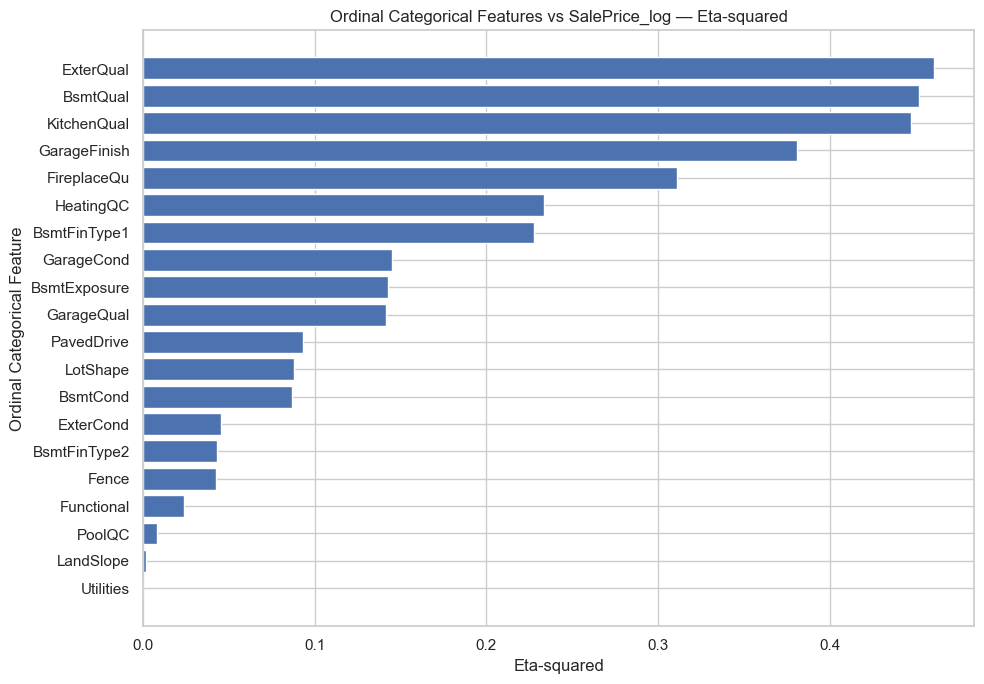

In [122]:
plot_df = ordinal_eta_report.sort_values(
    by="eta_squared_log_saleprice",
    ascending=True
)

plt.figure(figsize=(10, 7))

plt.barh(
    plot_df["feature"],
    plot_df["eta_squared_log_saleprice"]
)

plt.title("Ordinal Categorical Features vs SalePrice_log — Eta-squared")
plt.xlabel("Eta-squared")
plt.ylabel("Ordinal Categorical Feature")

plt.tight_layout()
plt.show()

### Ordered Median SalePrice Trend

These plots show whether target value increases or decreases according to ordinal category order.

This helps identify monotonic ordinal signal.

In [123]:
important_ordinal_categorical_features = (
    ordinal_eta_report
    .sort_values(by="eta_squared_log_saleprice", ascending=False)
    .head(12)["feature"]
    .tolist()
)

important_ordinal_categorical_features

['ExterQual',
 'BsmtQual',
 'KitchenQual',
 'GarageFinish',
 'FireplaceQu',
 'HeatingQC',
 'BsmtFinType1',
 'GarageCond',
 'BsmtExposure',
 'GarageQual',
 'PavedDrive',
 'LotShape']

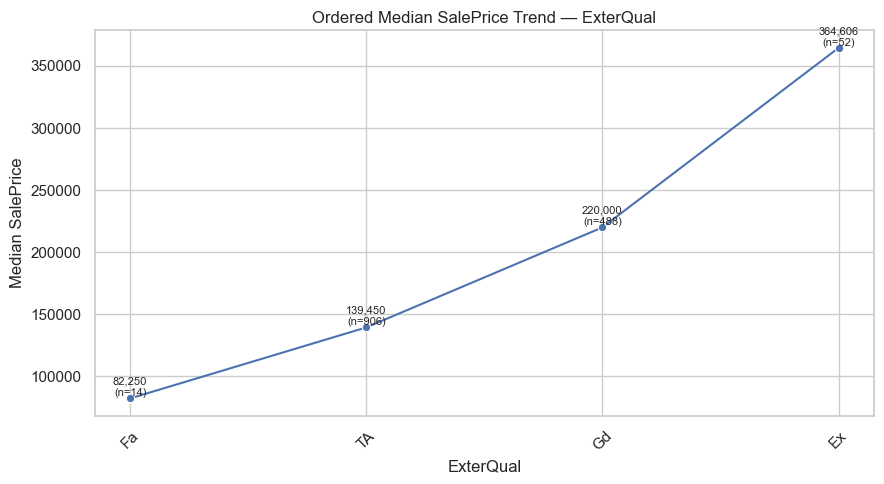

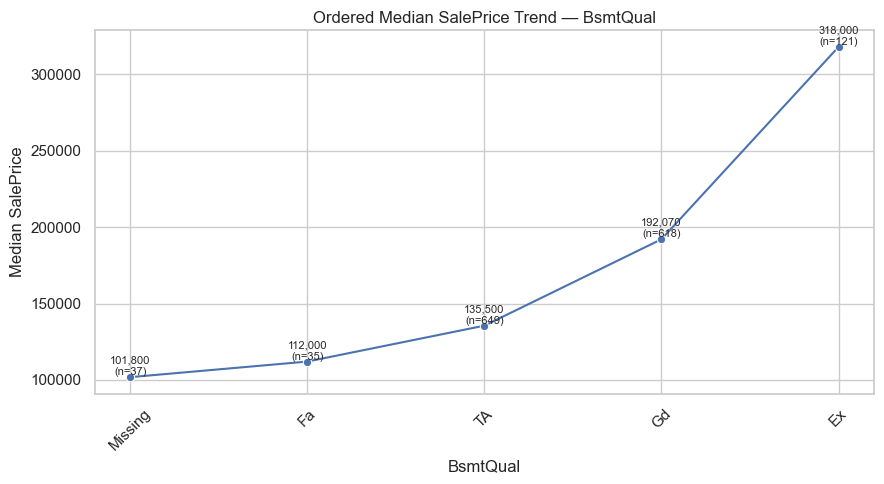

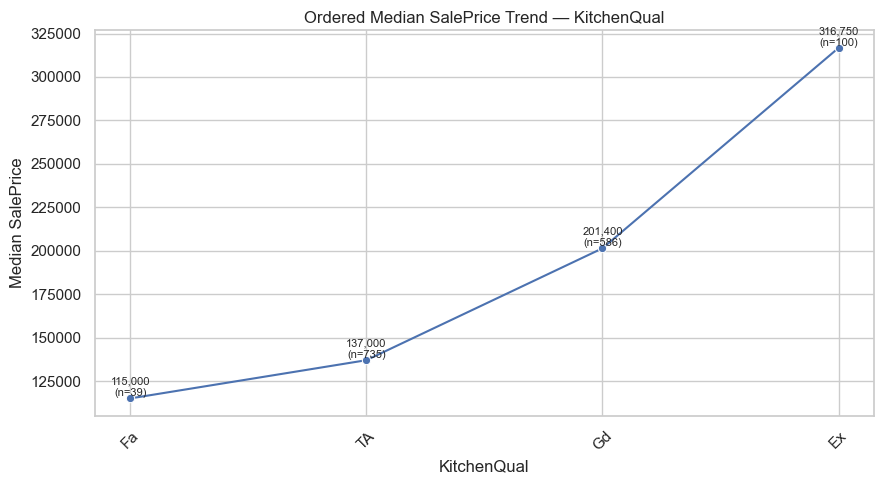

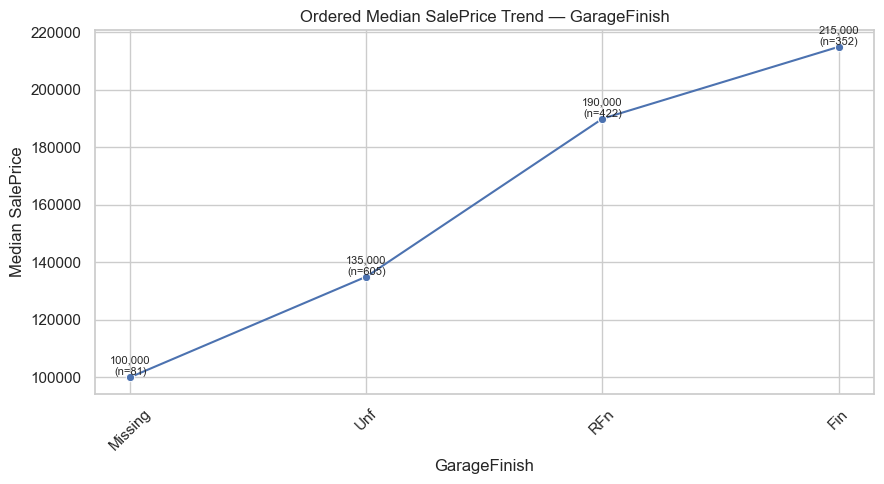

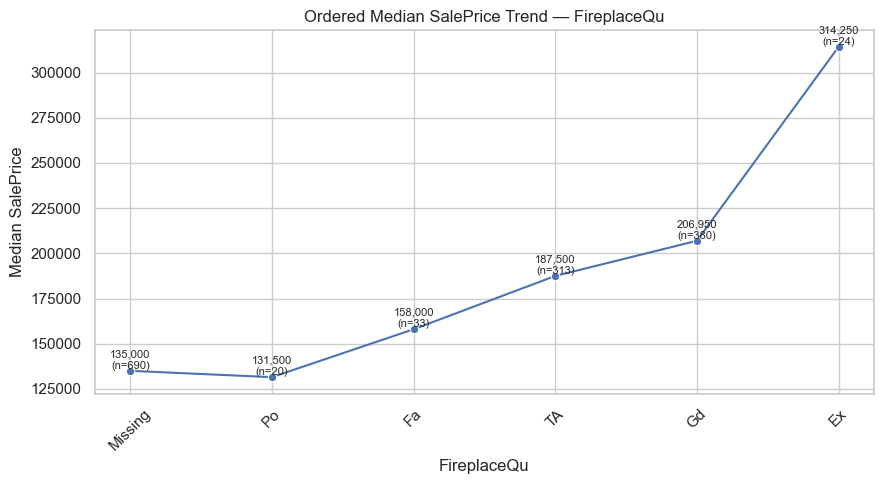

...

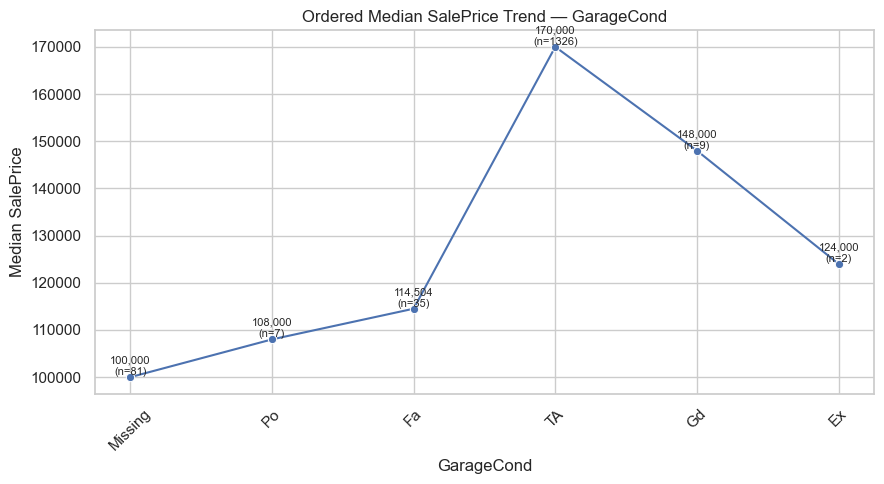

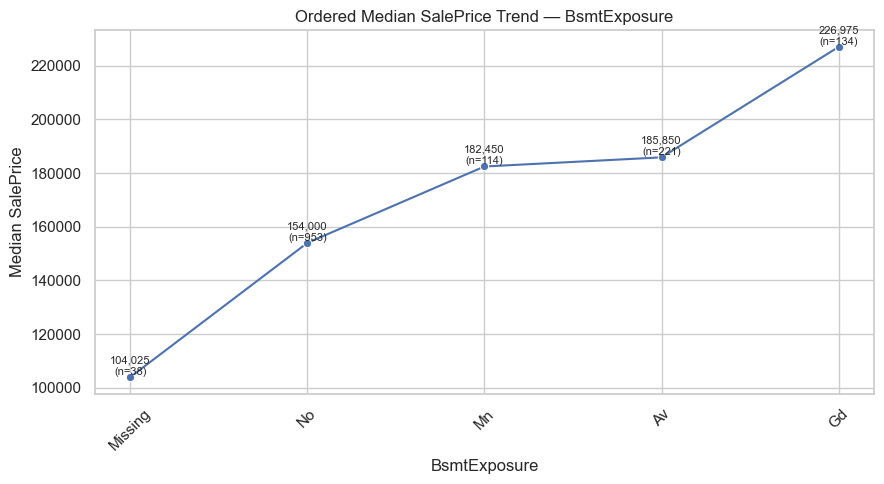

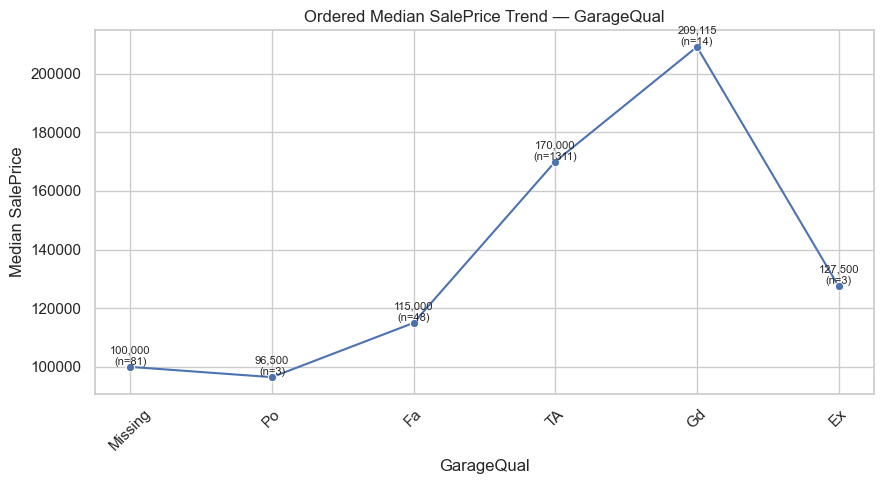

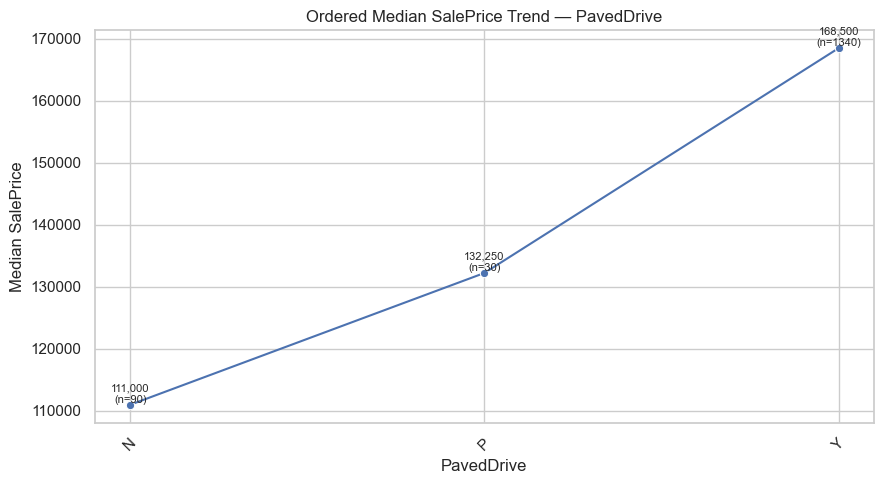

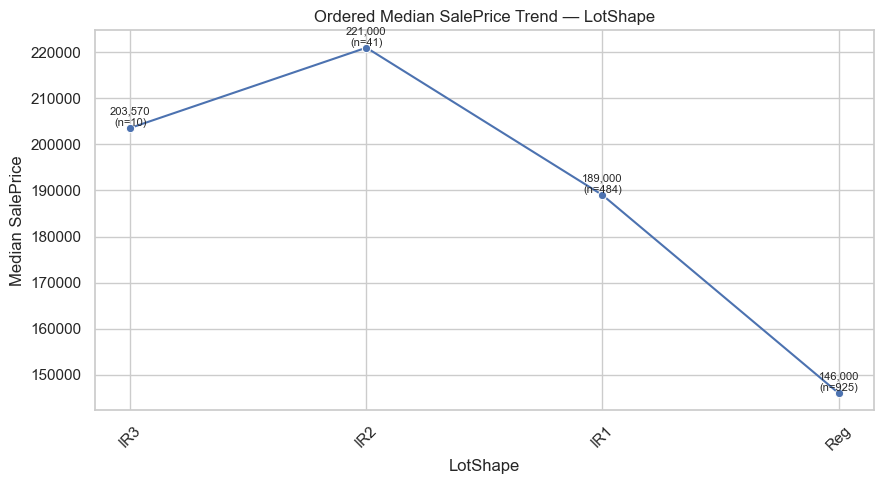

In [124]:
for feature in important_ordinal_categorical_features:
    trend = ordinal_categorical_target_summary[
        ordinal_categorical_target_summary["feature"] == feature
    ].copy()

    plt.figure(figsize=(9, 5))

    sns.lineplot(
        data=trend,
        x="category",
        y="median_saleprice",
        marker="o"
    )

    for x, y, n in zip(
        trend["category"],
        trend["median_saleprice"],
        trend["sample_count"]
    ):
        plt.text(
            x,
            y,
            f"{y:,.0f}\n(n={n})",
            ha="center",
            va="bottom",
            fontsize=8
        )

    plt.title(f"Ordered Median SalePrice Trend — {feature}")
    plt.xlabel(feature)
    plt.ylabel("Median SalePrice")
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

### Ordered Boxplot

These plots show target spread across ordered category levels.

The category order is preserved based on domain meaning.

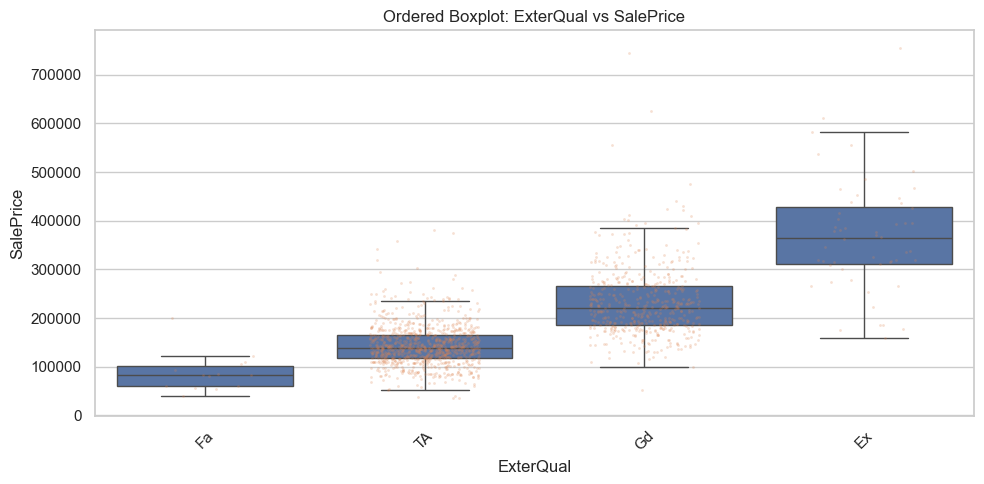

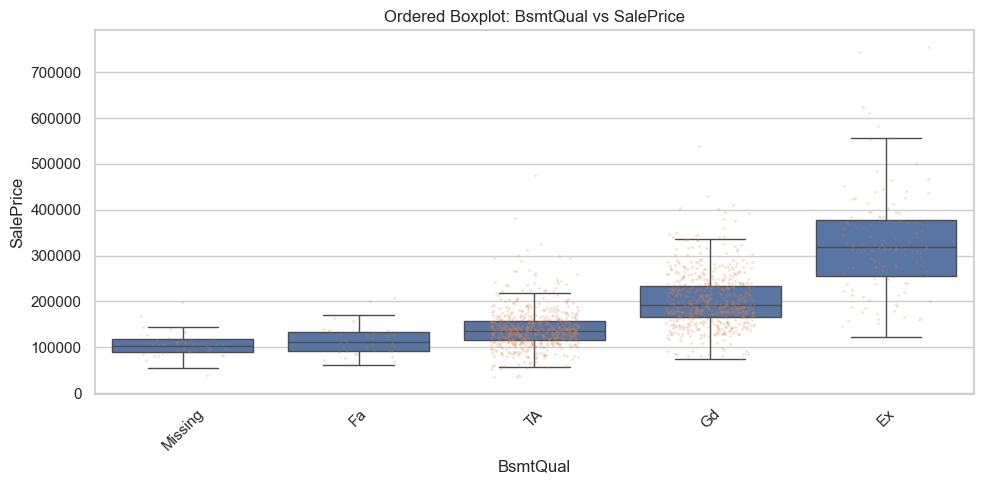

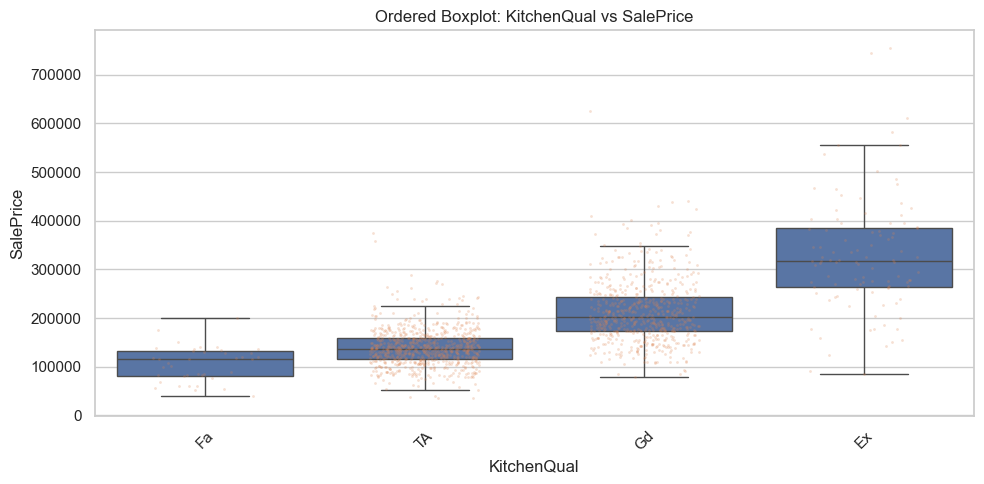

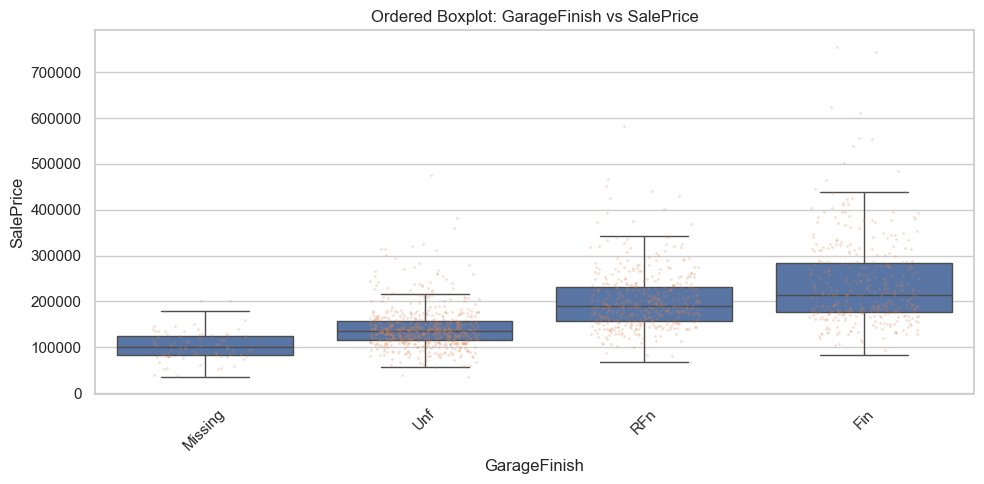

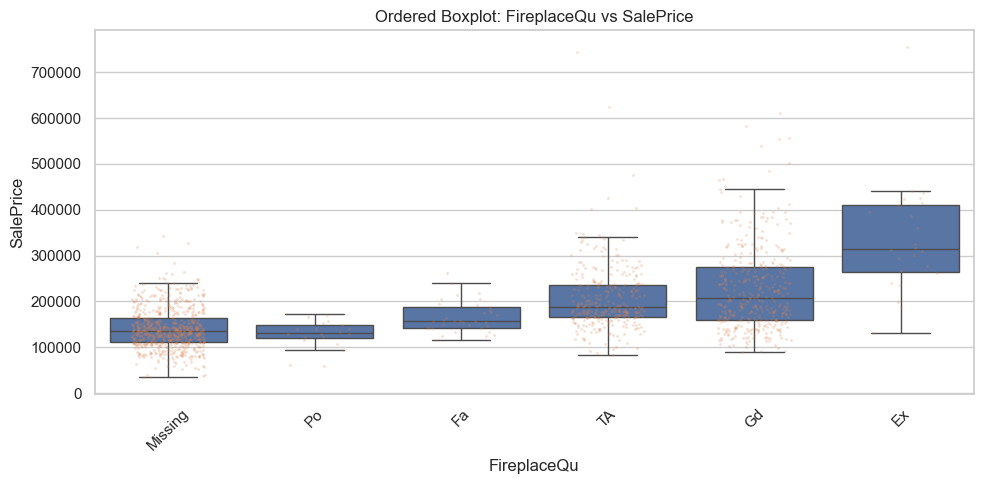

...

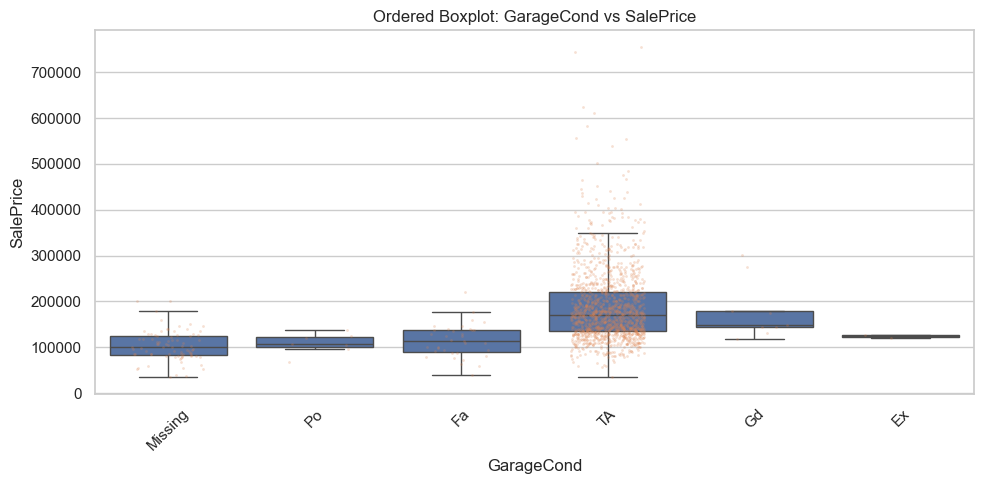

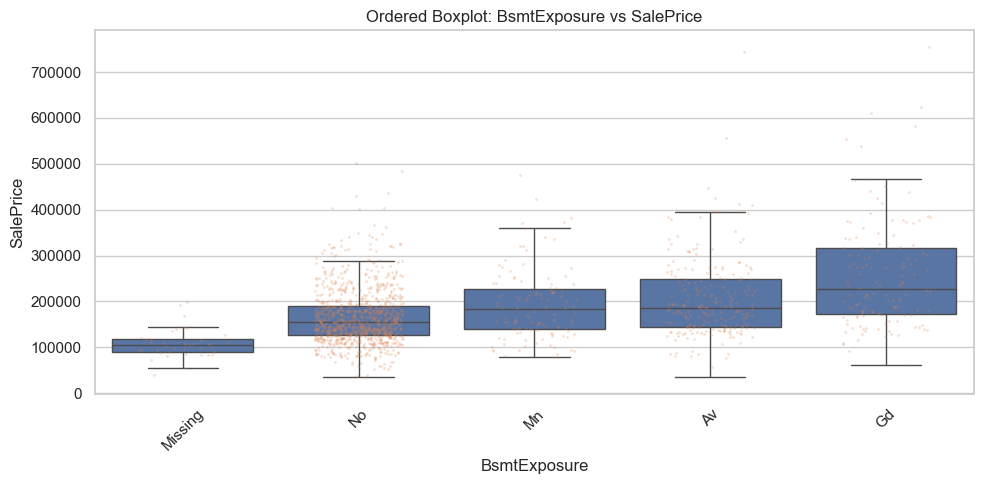

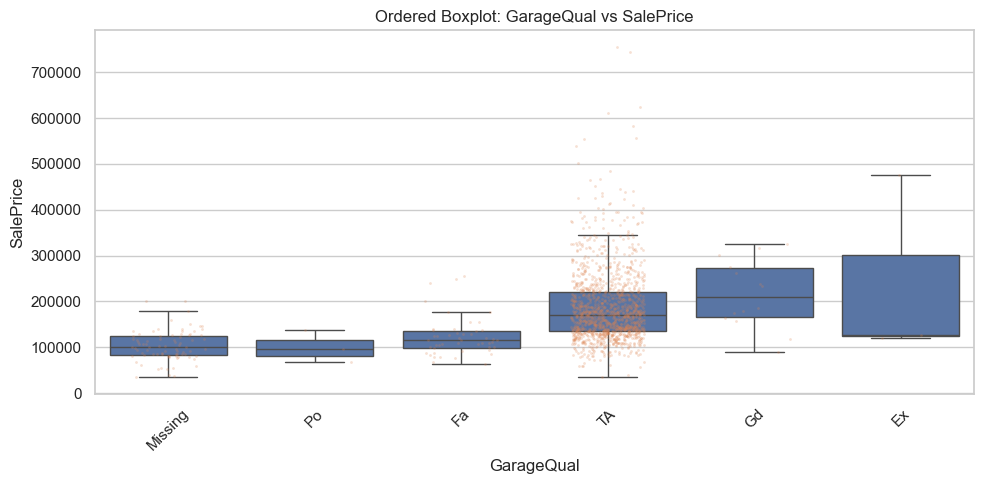

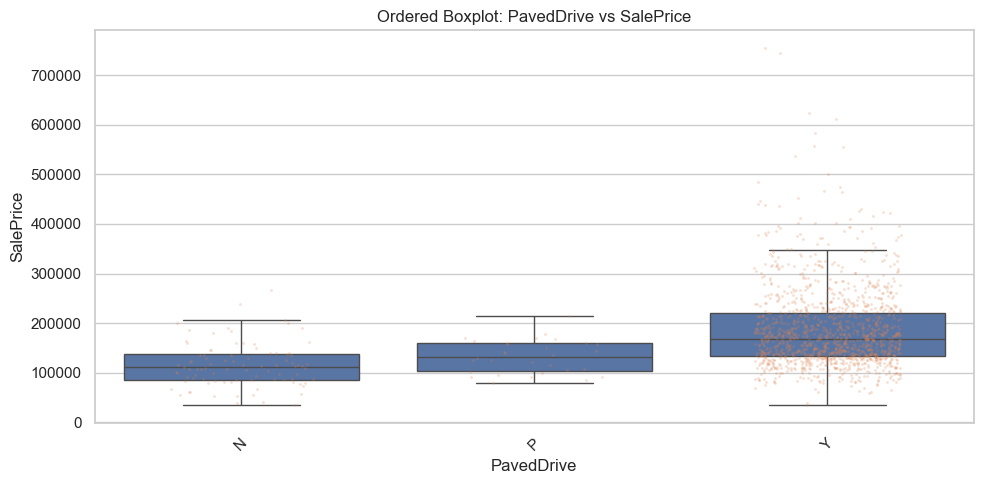

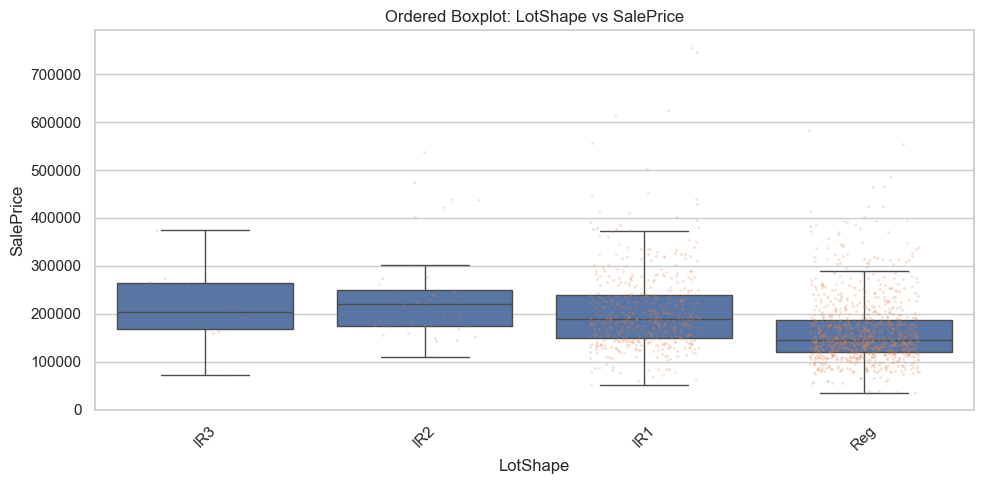

In [125]:
for feature in important_ordinal_categorical_features:
    temp = train[[feature, "SalePrice"]].copy()
    temp[feature] = temp[feature].astype("object").where(temp[feature].notna(), "Missing")
    temp[feature] = temp[feature].astype(str)

    order = ordinal_category_orders.get(feature, sorted(temp[feature].unique()))

    # Keep only categories actually present in the data
    order = [category for category in order if category in temp[feature].unique()]

    plt.figure(figsize=(10, 5))

    sns.boxplot(
        data=temp,
        x=feature,
        y="SalePrice",
        order=order,
        showfliers=False
    )

    sns.stripplot(
        data=temp,
        x=feature,
        y="SalePrice",
        order=order,
        jitter=0.25,
        alpha=0.25,
        size=2
    )

    plt.title(f"Ordered Boxplot: {feature} vs SalePrice")
    plt.xlabel(feature)
    plt.ylabel("SalePrice")
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

### Missing / None Category Target Behavior

Some ordinal categorical features have missing values that represent absence of a facility.

This check compares the target behavior of `Missing` category against other categories.

In [126]:
ordinal_missing_target_features = [
    feature for feature in ordinal_categorical
    if train[feature].isnull().sum() > 0
]

ordinal_missing_target_features

['BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'FireplaceQu',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence']

In [127]:
ordinal_missing_target_summary = []

for feature in ordinal_missing_target_features:
    temp = train[[feature, "SalePrice"]].copy()
    temp[feature] = temp[feature].astype("object").where(temp[feature].notna(), "Missing")
    temp[feature] = temp[feature].astype(str)

    summary = (
        temp
        .groupby(feature)
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median")
        )
        .reset_index()
        .rename(columns={feature: "category"})
    )

    summary["feature"] = feature
    ordinal_missing_target_summary.append(summary)

ordinal_missing_target_summary = pd.concat(
    ordinal_missing_target_summary,
    ignore_index=True
)

display(
    ordinal_missing_target_summary[
        [
            "feature",
            "category",
            "sample_count",
            "median_saleprice",
            "mean_saleprice"
        ]
    ].round(2)
)

,feature,category,sample_count,median_saleprice,mean_saleprice
0,BsmtQual,Ex,121,318000.0000,327041.0400
1,BsmtQual,Fa,35,112000.0000,115692.0300
2,BsmtQual,Gd,618,192070.0000,202688.4800
3,BsmtQual,Missing,37,101800.0000,105652.8900
4,BsmtQual,TA,649,135500.0000,140759.8200
5,BsmtCond,Fa,45,118500.0000,121809.5300
6,BsmtCond,Gd,65,193879.0000,213599.9100
7,BsmtCond,Missing,37,101800.0000,105652.8900
8,BsmtCond,Po,2,64000.0000,64000.0000
9,BsmtCond,TA,1311,165000.0000,183632.6200


### Rare Ordinal Category Stability Check

Rare ordinal categories may have unstable median target values because sample size is small.

These categories are reviewed, not removed automatically.

In [128]:
rare_ordinal_category_threshold = 20

ordinal_rare_target_report = (
    ordinal_categorical_target_summary[
        ordinal_categorical_target_summary["sample_count"] < rare_ordinal_category_threshold
    ]
    .sort_values(by=["feature", "sample_count", "median_saleprice"])
)

display(ordinal_rare_target_report.round(4))

,feature,category,order_index,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
24,BsmtCond,Po,1,2,64000.0000,64000.0000,11.0656,11.0656
46,BsmtFinType2,GLQ,6,14,180982.1429,203125.0000,12.0336,12.2203
45,BsmtFinType2,ALQ,5,19,209942.1053,174900.0000,12.1671,12.0720
13,ExterCond,Po,0,1,76500.0000,76500.0000,11.2451,11.2451
17,ExterCond,Ex,4,3,201333.3333,161000.0000,12.1197,11.9892
9,ExterQual,Fa,1,14,87985.2143,82250.0000,11.3046,11.3175
93,Fence,MnWw,1,11,134286.3636,130000.0000,11.7968,11.7753
56,Functional,Sev,1,1,129000.0000,129000.0000,11.7676,11.7676
57,Functional,Maj2,2,5,85800.0000,85000.0000,11.3166,11.3504
58,Functional,Maj1,3,14,153948.1429,140750.0000,11.8596,11.8545


### Ordinal Categorical vs Target — Action Summary

This table summarizes target relationship and suggested action for ordinal categorical features.

In [129]:
ordinal_categorical_action_summary = []

for feature in ordinal_categorical:
    eta_row = ordinal_eta_report[
        ordinal_eta_report["feature"] == feature
    ].iloc[0]

    eta_score = eta_row["eta_squared_log_saleprice"]

    if eta_score >= 0.20:
        signal_strength = "Strong"
    elif eta_score >= 0.10:
        signal_strength = "Medium"
    elif eta_score >= 0.03:
        signal_strength = "Weak"
    else:
        signal_strength = "Very Weak"

    missing_percentage = train[feature].isnull().mean() * 100

    rare_category_count = (
        ordinal_categorical_target_summary[
            ordinal_categorical_target_summary["feature"] == feature
        ]["sample_count"] < rare_ordinal_category_threshold
    ).sum()

    if feature in ["ExterQual", "KitchenQual", "BsmtQual", "GarageFinish", "FireplaceQu"]:
        suggested_action = "Keep; important ordinal predictor"
    elif missing_percentage > 0:
        suggested_action = "Handle Missing as meaningful absence; ordinal encode later"
    elif feature in ["Utilities", "LandSlope", "Functional", "PavedDrive"]:
        suggested_action = "Keep; review dominance"
    else:
        suggested_action = "Keep; ordinal encode later"

    ordinal_categorical_action_summary.append({
        "feature": feature,
        "eta_squared_log": eta_score,
        "signal_strength": signal_strength,
        "missing_percentage": missing_percentage,
        "rare_category_count_lt_20": rare_category_count,
        "suggested_action": suggested_action
    })

ordinal_categorical_action_summary = pd.DataFrame(
    ordinal_categorical_action_summary
)

display(
    ordinal_categorical_action_summary
    .sort_values(by="eta_squared_log", ascending=False)
    .round(4)
)

,feature,eta_squared_log,signal_strength,missing_percentage,rare_category_count_lt_20,suggested_action
3,ExterQual,0.4611,Strong,0.0000,1,Keep; important ordinal predictor
5,BsmtQual,0.4523,Strong,2.5342,0,Keep; important ordinal predictor
11,KitchenQual,0.4476,Strong,0.0000,0,Keep; important ordinal predictor
14,GarageFinish,0.3810,Strong,5.5479,0,Keep; important ordinal predictor
13,FireplaceQu,0.3109,Strong,47.2603,0,Keep; important ordinal predictor
10,HeatingQC,0.2335,Strong,0.0000,1,Keep; ordinal encode later
8,BsmtFinType1,0.2277,Strong,2.5342,0,Handle Missing as meaningful absence; ordinal ...
16,GarageCond,0.1452,Medium,5.5479,3,Handle Missing as meaningful absence; ordinal ...
7,BsmtExposure,0.1426,Medium,2.6027,0,Handle Missing as meaningful absence; ordinal ...
15,GarageQual,0.1414,Medium,5.5479,3,Handle Missing as meaningful absence; ordinal ...


### Ordinal Categorical vs Target — Final Notes

- Ordinal categorical features should preserve category order during preprocessing.
- Quality-related features are expected to show clear target separation.
- Missing values often represent absence of facilities and should be handled as meaningful categories.
- Rare ordinal levels are not removed automatically.
- Ordinal encoding should be tested during preprocessing and modeling.

## 8.8 Binary Categorical vs Target

In this section, I analyze binary categorical features against the target variable `SalePrice`.

Binary categorical features have two main categories.  
The goal is to check:

- target difference between two categories,
- category sample size,
- imbalance effect,
- and possible binary encoding decision.

Rare binary categories are not removed automatically.

In [130]:
binary_target_summary = []

for feature in binary_categorical:
    temp = train[[feature, "SalePrice", "SalePrice_log"]].copy()
    temp[feature] = temp[feature].astype("object").where(temp[feature].notna(), "Missing")
    temp[feature] = temp[feature].astype(str)

    summary = (
        temp
        .groupby(feature)
        .agg(
            sample_count=("SalePrice", "count"),
            mean_saleprice=("SalePrice", "mean"),
            median_saleprice=("SalePrice", "median"),
            mean_log_saleprice=("SalePrice_log", "mean"),
            median_log_saleprice=("SalePrice_log", "median")
        )
        .reset_index()
        .rename(columns={feature: "category"})
    )

    summary["feature"] = feature

    summary = summary[
        [
            "feature",
            "category",
            "sample_count",
            "mean_saleprice",
            "median_saleprice",
            "mean_log_saleprice",
            "median_log_saleprice"
        ]
    ]

    binary_target_summary.append(summary)

binary_target_summary = pd.concat(
    binary_target_summary,
    ignore_index=True
)

display(binary_target_summary.round(4))


,feature,category,sample_count,mean_saleprice,median_saleprice,mean_log_saleprice,median_log_saleprice
0,Street,Grvl,6,130190.5000,114250.0000,11.6674,11.6455
1,Street,Pave,1454,181130.5385,163000.0000,12.0255,12.0015
2,CentralAir,N,95,105264.0737,98000.0000,11.4919,11.4927
3,CentralAir,Y,1365,186186.7099,168000.0000,12.0611,12.0317


### Eta-squared for Binary Categorical Features

Eta-squared measures target separation between binary categories.

For binary features, it gives a simple idea of how much `SalePrice_log` differs between the two groups.

In [131]:
binary_eta_report = []

for feature in binary_categorical:
    eta_raw = eta_squared_categorical_target(
        train,
        feature,
        "SalePrice"
    )

    eta_log = eta_squared_categorical_target(
        train,
        feature,
        "SalePrice_log"
    )

    unique_count = train[feature].nunique(dropna=False)
    missing_percentage = train[feature].isnull().mean() * 100

    binary_eta_report.append({
        "feature": feature,
        "unique_category": unique_count,
        "missing_percentage": missing_percentage,
        "eta_squared_saleprice": eta_raw,
        "eta_squared_log_saleprice": eta_log
    })

binary_eta_report = pd.DataFrame(binary_eta_report)

display(
    binary_eta_report
    .sort_values(by="eta_squared_log_saleprice", ascending=False)
    .round(4)
)

,feature,unique_category,missing_percentage,eta_squared_saleprice,eta_squared_log_saleprice
1,CentralAir,2,0.0000,0.0632,0.1236
0,Street,2,0.0000,0.0017,0.0033


### Binary Category Boxplot

These plots show the target distribution for each binary category.

Because binary features can be imbalanced, sample size should be checked before interpreting the difference.

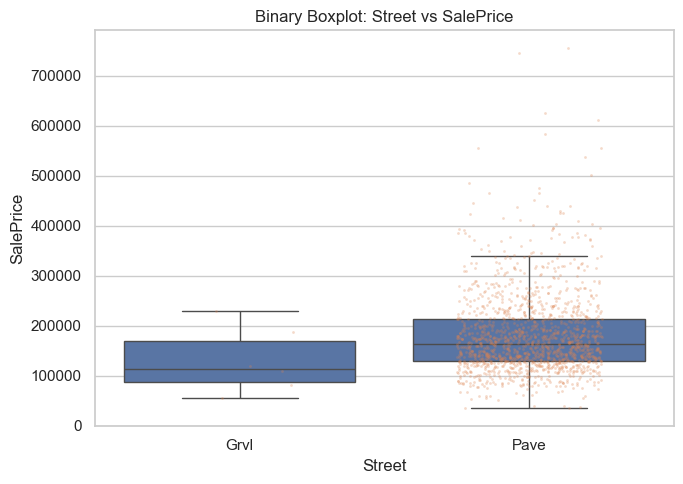

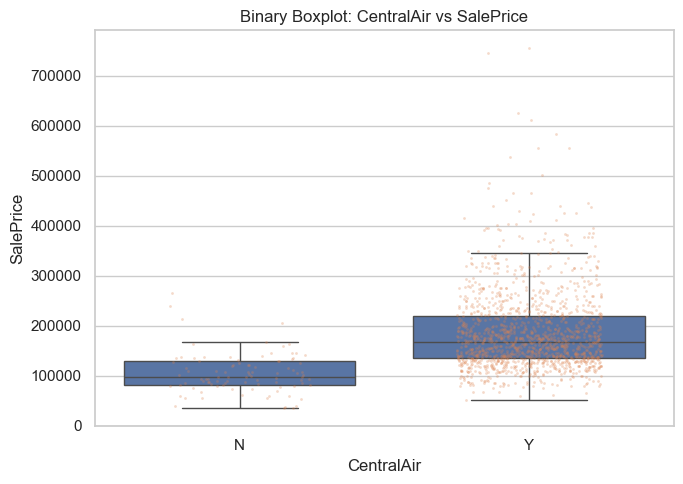

In [132]:
for feature in binary_categorical:
    temp = train[[feature, "SalePrice"]].copy()
    temp[feature] = temp[feature].astype("object").where(temp[feature].notna(), "Missing")
    temp[feature] = temp[feature].astype(str)

    order = (
        temp
        .groupby(feature)["SalePrice"]
        .median()
        .sort_values()
        .index
        .tolist()
    )

    plt.figure(figsize=(7, 5))

    sns.boxplot(
        data=temp,
        x=feature,
        y="SalePrice",
        order=order,
        showfliers=False
    )

    sns.stripplot(
        data=temp,
        x=feature,
        y="SalePrice",
        order=order,
        jitter=0.25,
        alpha=0.30,
        size=2
    )

    plt.title(f"Binary Boxplot: {feature} vs SalePrice")
    plt.xlabel(feature)
    plt.ylabel("SalePrice")

    plt.tight_layout()
    plt.show()

### Median SalePrice Comparison

This plot compares median `SalePrice` between binary categories.


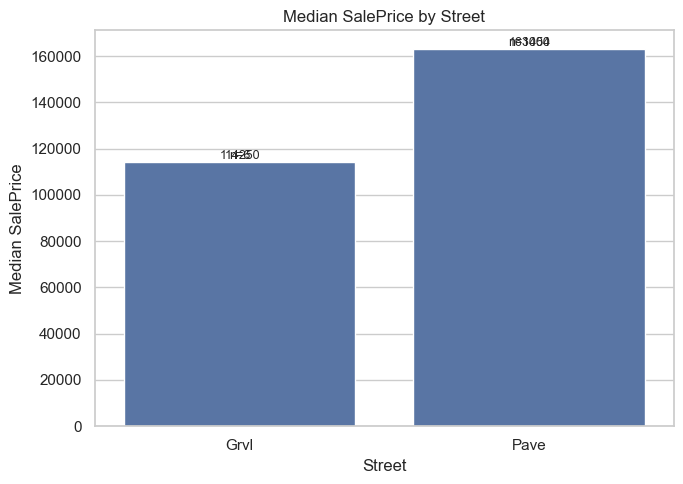

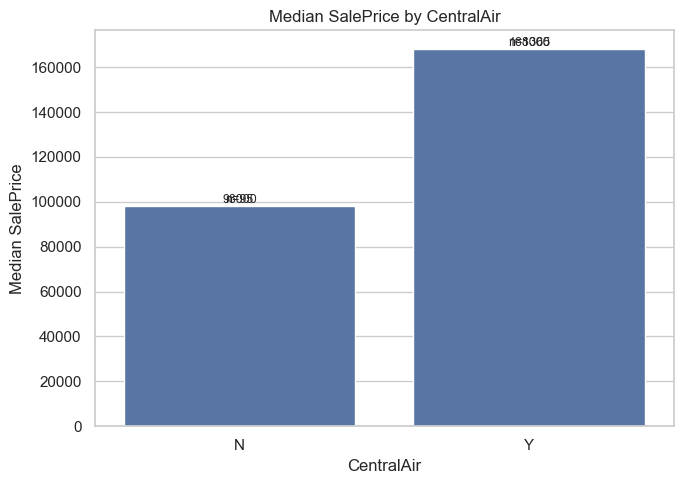

In [133]:
for feature in binary_categorical:
    plot_df = binary_target_summary[
        binary_target_summary["feature"] == feature
    ].copy()

    plot_df = plot_df.sort_values(
        by="median_saleprice",
        ascending=True
    )

    plt.figure(figsize=(7, 5))

    ax = sns.barplot(
        data=plot_df,
        x="category",
        y="median_saleprice"
    )

    plt.title(f"Median SalePrice by {feature}")
    plt.xlabel(feature)
    plt.ylabel("Median SalePrice")

    for container in ax.containers:
        ax.bar_label(container, fmt="%.0f", fontsize=9)

    for i, row in plot_df.reset_index(drop=True).iterrows():
        plt.text(
            i,
            row["median_saleprice"],
            f"n={int(row['sample_count'])}",
            ha="center",
            va="bottom",
            fontsize=9
        )

    plt.tight_layout()
    plt.show()

### Optional Non-parametric Group Difference Test

Because `SalePrice` is right-skewed, Mann–Whitney U test is used instead of relying only on a t-test.

This test checks whether the two binary groups have different target distributions.

The result is used only as supporting evidence, not as a final feature selection rule.

In [134]:
from scipy.stats import mannwhitneyu

binary_test_results = []

for feature in binary_categorical:
    temp = train[[feature, "SalePrice_log"]].dropna().copy()
    temp[feature] = temp[feature].astype(str)

    categories = temp[feature].unique()

    if len(categories) == 2:
        group_1 = temp[temp[feature] == categories[0]]["SalePrice_log"]
        group_2 = temp[temp[feature] == categories[1]]["SalePrice_log"]

        stat, p_value = mannwhitneyu(
            group_1,
            group_2,
            alternative="two-sided"
        )

        binary_test_results.append({
            "feature": feature,
            "category_1": categories[0],
            "category_1_count": len(group_1),
            "category_2": categories[1],
            "category_2_count": len(group_2),
            "mannwhitney_u_stat": stat,
            "p_value": p_value
        })

binary_test_results = pd.DataFrame(binary_test_results)

display(binary_test_results.round(6))

,feature,category_1,category_1_count,category_2,category_2_count,mannwhitney_u_stat,p_value
0,Street,Pave,1454,Grvl,6,6165.5000,0.0802
1,CentralAir,Y,1365,N,95,112385.0000,0.0000


### Binary Categorical vs Target — Action Summary

This table summarizes target relationship and suggested action for binary categorical features.

In [135]:
binary_action_summary = []

for feature in binary_categorical:
    eta_row = binary_eta_report[
        binary_eta_report["feature"] == feature
    ].iloc[0]

    eta_score = eta_row["eta_squared_log_saleprice"]

    if eta_score >= 0.20:
        signal_strength = "Strong"
    elif eta_score >= 0.10:
        signal_strength = "Medium"
    elif eta_score >= 0.03:
        signal_strength = "Weak"
    else:
        signal_strength = "Very Weak"

    temp_summary = binary_target_summary[
        binary_target_summary["feature"] == feature
    ].copy()

    min_group_size = temp_summary["sample_count"].min()
    max_group_size = temp_summary["sample_count"].max()
    imbalance_ratio = max_group_size / min_group_size

    if feature == "CentralAir":
        suggested_action = "Keep; encode Y/N as binary"
    elif feature == "Street":
        suggested_action = "Keep; rare road type should not be removed"
    else:
        suggested_action = "Keep; binary encode later"

    binary_action_summary.append({
        "feature": feature,
        "eta_squared_log": eta_score,
        "signal_strength": signal_strength,
        "min_group_size": min_group_size,
        "max_group_size": max_group_size,
        "imbalance_ratio": imbalance_ratio,
        "suggested_action": suggested_action
    })

binary_action_summary = pd.DataFrame(binary_action_summary)

display(
    binary_action_summary
    .sort_values(by="eta_squared_log", ascending=False)
    .round(4)
)

,feature,eta_squared_log,signal_strength,min_group_size,max_group_size,imbalance_ratio,suggested_action
1,CentralAir,0.1236,Medium,95,1365,14.3684,Keep; encode Y/N as binary
0,Street,0.0033,Very Weak,6,1454,242.3333,Keep; rare road type should not be removed


### Binary Categorical vs Target — Final Notes

- Binary categorical features may be imbalanced.
- Rare binary categories should not be removed automatically.
- `CentralAir` is expected to be more useful than `Street`.
- Final usefulness should be checked with model validation.
- Both features can be encoded later using simple binary mapping.

## 8.9 Feature vs Feature / Redundancy Check

In this section, I analyze relationships between features.

The goal is to identify:

- highly correlated numeric feature pairs,
- possible redundant features,
- feature engineering candidates,
- selected categorical associations,
- and interaction opportunities.

This section is not used to remove features directly.  
It only helps guide preprocessing and feature engineering.

### Numeric Feature Correlation Heatmap

This heatmap shows correlation among numeric features.

Highly correlated pairs may contain overlapping information.

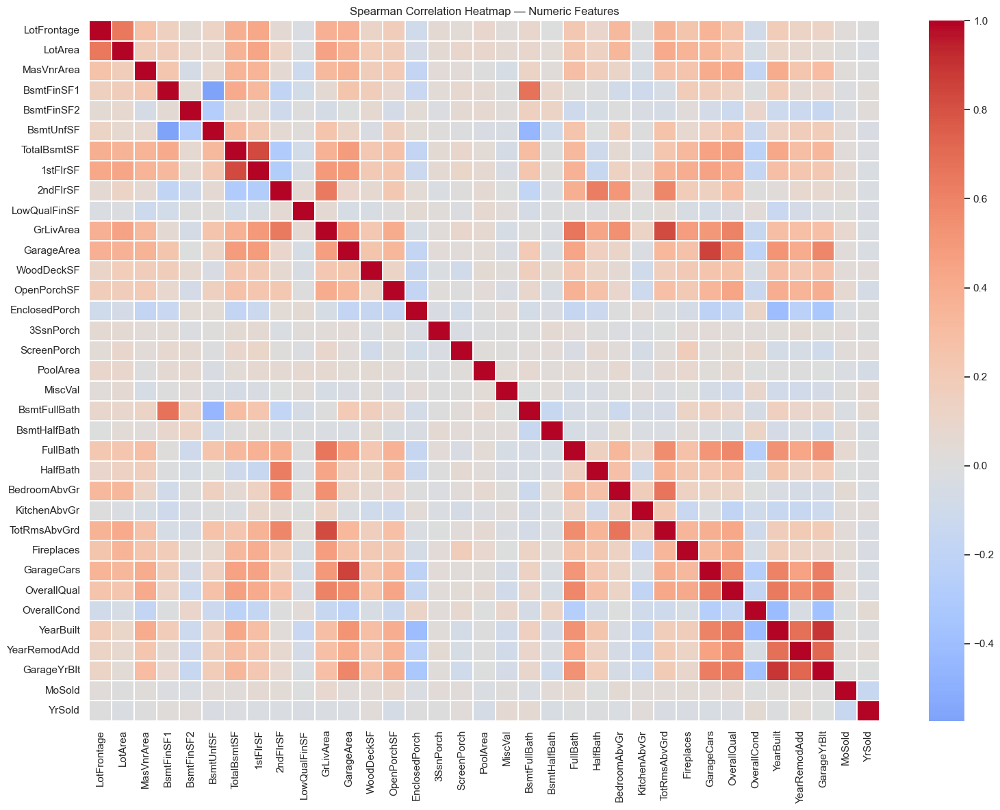

In [136]:
numeric_for_corr = continuous_numeric + count_numeric + ordinal_numeric + temporal_features

numeric_corr = train[numeric_for_corr].corr(method="spearman")

plt.figure(figsize=(16, 12))

sns.heatmap(
    numeric_corr,
    cmap="coolwarm",
    center=0,
    linewidths=0.3
)

plt.title("Spearman Correlation Heatmap — Numeric Features")
plt.tight_layout()
plt.show()

### Top Correlated Numeric Feature Pairs

This table shows highly correlated numeric feature pairs.

These pairs should be reviewed for redundancy or interaction possibilities.

In [137]:
def get_top_correlated_pairs(corr_matrix, threshold=0.70):
    pairs = []

    features = corr_matrix.columns

    for i in range(len(features)):
        for j in range(i + 1, len(features)):
            f1 = features[i]
            f2 = features[j]
            corr_value = corr_matrix.loc[f1, f2]

            if abs(corr_value) >= threshold:
                pairs.append({
                    "feature_1": f1,
                    "feature_2": f2,
                    "spearman_corr": corr_value,
                    "abs_corr": abs(corr_value)
                })

    return (
        pd.DataFrame(pairs)
        .sort_values(by="abs_corr", ascending=False)
        .reset_index(drop=True)
    )


top_numeric_corr_pairs = get_top_correlated_pairs(
    numeric_corr,
    threshold=0.70
)

display(top_numeric_corr_pairs.round(4))

,feature_1,feature_2,spearman_corr,abs_corr
0,YearBuilt,GarageYrBlt,0.8905,0.8905
1,GarageArea,GarageCars,0.8533,0.8533
2,TotalBsmtSF,1stFlrSF,0.8293,0.8293
3,GrLivArea,TotRmsAbvGrd,0.8279,0.8279
4,YearRemodAdd,GarageYrBlt,0.7224,0.7224


### Scatter Plot for Highly Correlated Numeric Pairs

These plots help visually inspect whether two numeric features carry overlapping information.

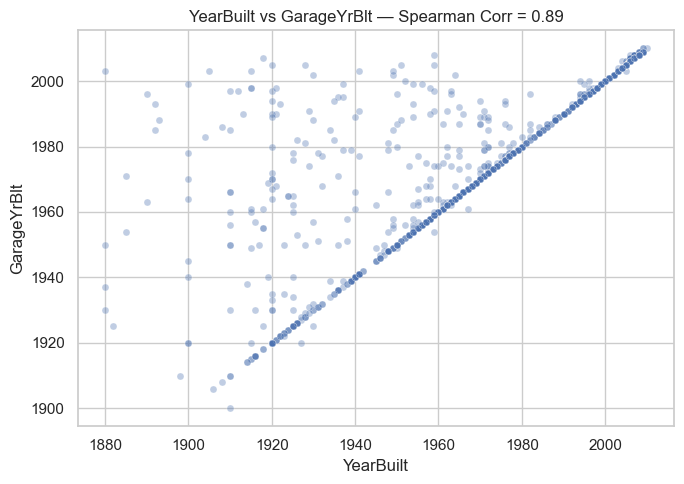

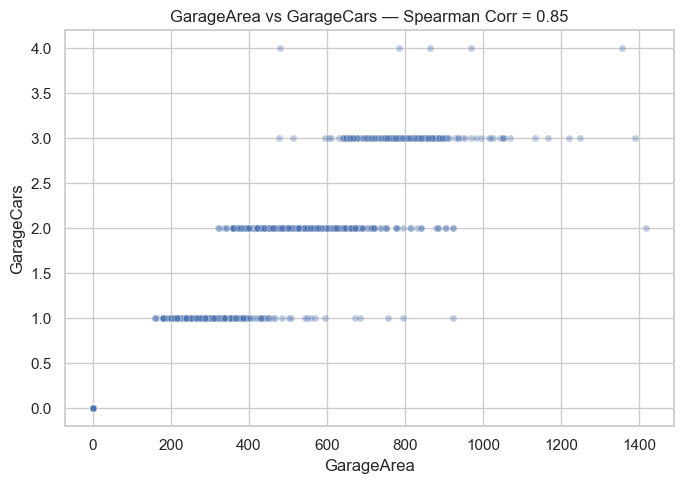

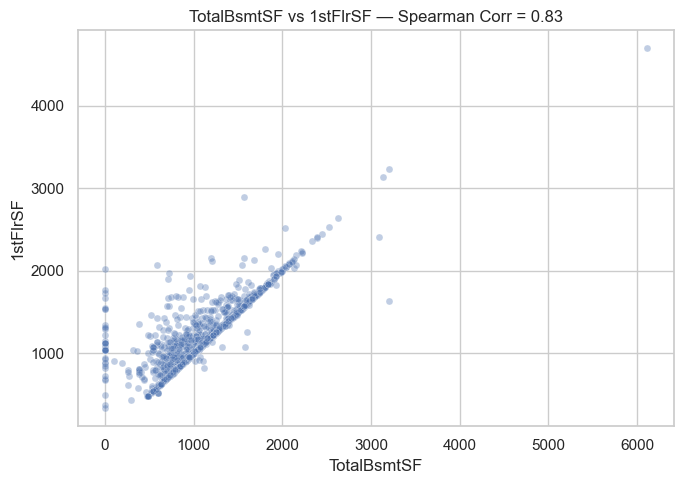

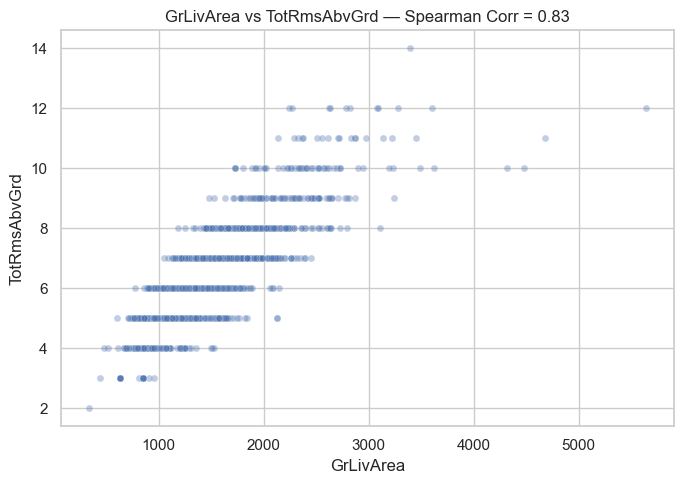

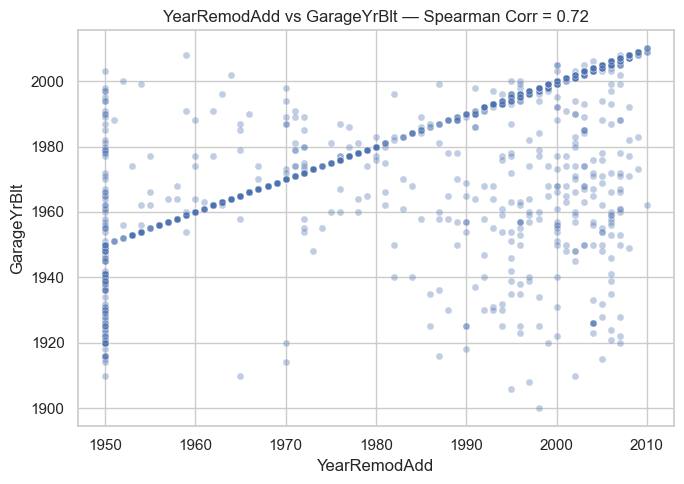

In [138]:
top_pairs_to_plot = top_numeric_corr_pairs.head(10)

for _, row in top_pairs_to_plot.iterrows():
    f1 = row["feature_1"]
    f2 = row["feature_2"]

    plt.figure(figsize=(7, 5))

    sns.scatterplot(
        data=train,
        x=f1,
        y=f2,
        alpha=0.35,
        s=25
    )

    plt.title(f"{f1} vs {f2} — Spearman Corr = {row['spearman_corr']:.2f}")
    plt.xlabel(f1)
    plt.ylabel(f2)

    plt.tight_layout()
    plt.show()

### Selected Important Numeric Relationships

Some numeric relationships are important even if they are not only redundancy checks.

These pairs are useful for feature engineering.

In [139]:
selected_numeric_pairs = [
    ("GarageCars", "GarageArea"),
    ("GrLivArea", "TotRmsAbvGrd"),
    ("1stFlrSF", "TotalBsmtSF"),
    ("YearBuilt", "GarageYrBlt"),
    ("YearBuilt", "YearRemodAdd"),
    ("OverallQual", "GrLivArea"),
    ("OverallQual", "GarageCars"),
    ("OverallQual", "TotalBsmtSF")
]

selected_numeric_pairs = [
    pair for pair in selected_numeric_pairs
    if pair[0] in train.columns and pair[1] in train.columns
]

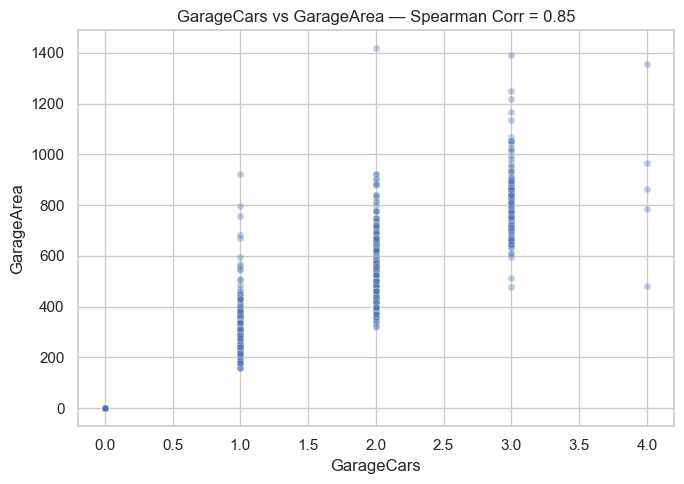

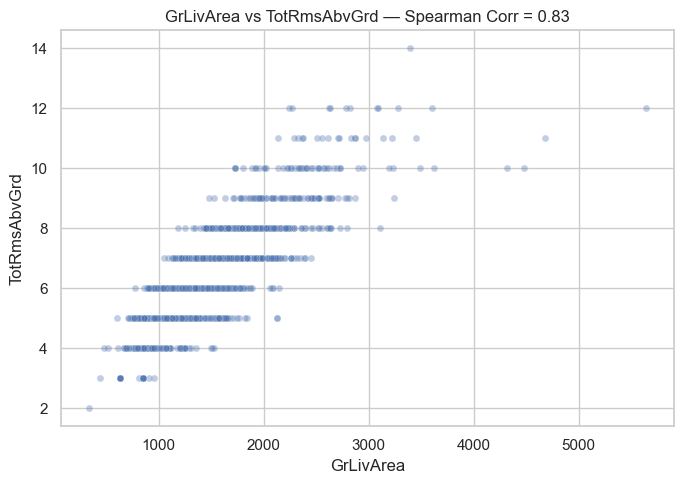

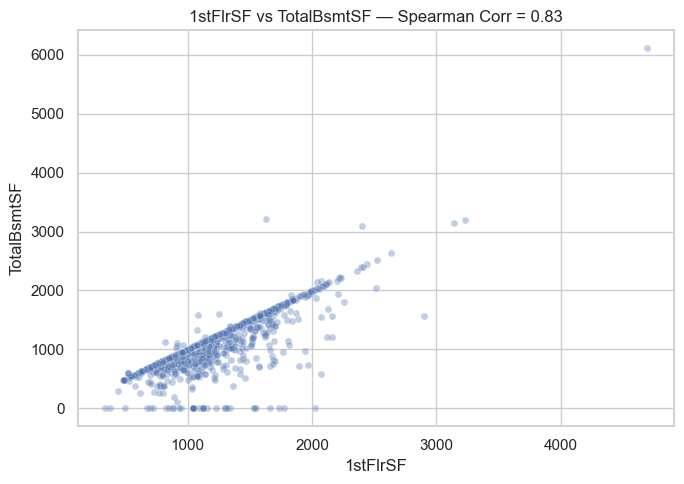

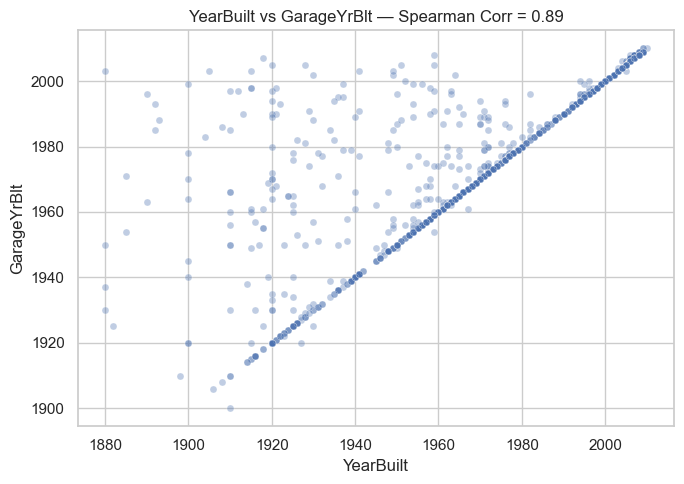

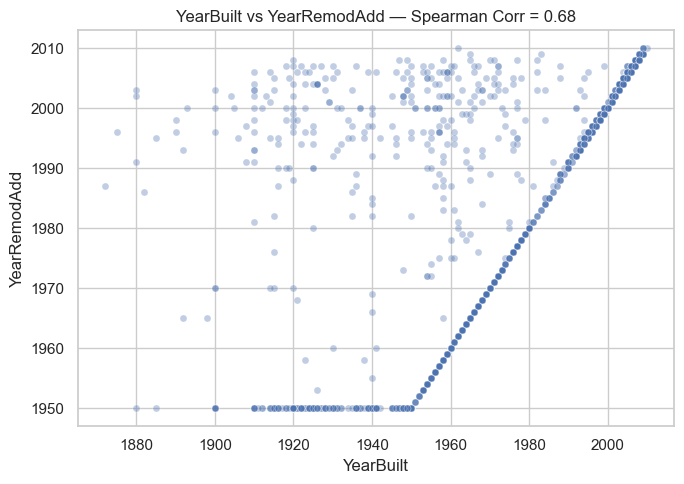

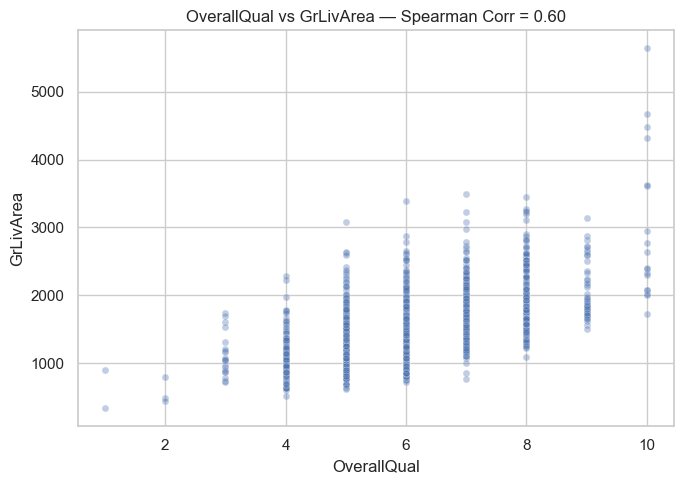

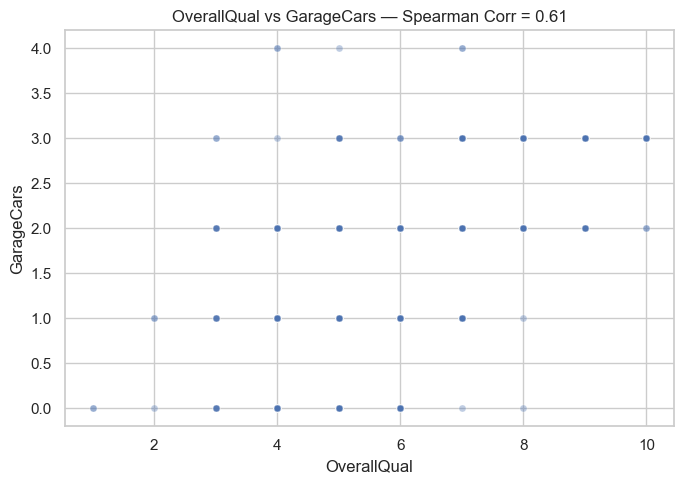

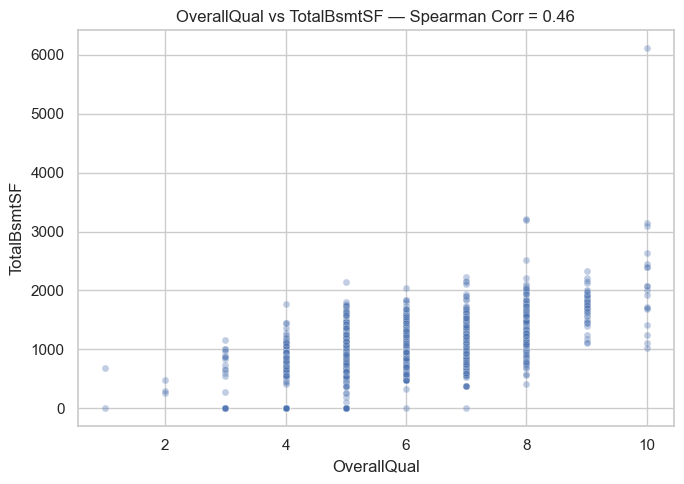

In [140]:
for f1, f2 in selected_numeric_pairs:
    temp = train[[f1, f2]].dropna()

    spearman_corr = temp[f1].corr(temp[f2], method="spearman")

    plt.figure(figsize=(7, 5))

    sns.scatterplot(
        data=temp,
        x=f1,
        y=f2,
        alpha=0.35,
        s=25
    )

    plt.title(f"{f1} vs {f2} — Spearman Corr = {spearman_corr:.2f}")
    plt.xlabel(f1)
    plt.ylabel(f2)

    plt.tight_layout()
    plt.show()

### Selected Categorical Feature Association

For selected categorical feature pairs, I use Cramer's V.

Cramer's V measures association strength between two categorical variables.

This is used only for selected meaningful pairs, not all possible categorical combinations.

In [141]:
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)

    if confusion_matrix.shape[0] < 2 or confusion_matrix.shape[1] < 2:
        return np.nan

    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()

    r, k = confusion_matrix.shape

    phi2 = chi2 / n

    # Bias correction
    phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    r_corr = r - ((r - 1) ** 2) / (n - 1)
    k_corr = k - ((k - 1) ** 2) / (n - 1)

    denominator = min((k_corr - 1), (r_corr - 1))

    if denominator == 0:
        return np.nan

    return np.sqrt(phi2_corr / denominator)

In [142]:
selected_categorical_pairs = [
    ("Neighborhood", "MSZoning"),
    ("BldgType", "HouseStyle"),
    ("GarageType", "GarageFinish"),
    ("Exterior1st", "Exterior2nd"),
    ("BsmtQual", "BsmtCond"),
    ("BsmtQual", "BsmtExposure"),
    ("BsmtFinType1", "BsmtFinType2"),
    ("SaleType", "SaleCondition"),
    ("Condition1", "Condition2")
]

selected_categorical_pairs = [
    pair for pair in selected_categorical_pairs
    if pair[0] in train.columns and pair[1] in train.columns
]

In [143]:
categorical_association_summary = []

for f1, f2 in selected_categorical_pairs:
    temp = train[[f1, f2]].copy()

    temp[f1] = temp[f1].astype("object").where(temp[f1].notna(), "Missing").astype(str)
    temp[f2] = temp[f2].astype("object").where(temp[f2].notna(), "Missing").astype(str)

    cv = cramers_v(temp[f1], temp[f2])

    if pd.isna(cv):
        strength = "Not Applicable"
    elif cv >= 0.70:
        strength = "Very Strong"
    elif cv >= 0.50:
        strength = "Strong"
    elif cv >= 0.30:
        strength = "Medium"
    elif cv >= 0.10:
        strength = "Weak"
    else:
        strength = "Very Weak"

    categorical_association_summary.append({
        "feature_1": f1,
        "feature_2": f2,
        "cramers_v": cv,
        "association_strength": strength
    })

categorical_association_summary = pd.DataFrame(
    categorical_association_summary
).sort_values(by="cramers_v", ascending=False)

display(categorical_association_summary.round(4))

,feature_1,feature_2,cramers_v,association_strength
3,Exterior1st,Exterior2nd,0.7589,Very Strong
2,GarageType,GarageFinish,0.6849,Strong
0,Neighborhood,MSZoning,0.6406,Strong
4,BsmtQual,BsmtCond,0.5268,Strong
5,BsmtQual,BsmtExposure,0.5209,Strong
7,SaleType,SaleCondition,0.4708,Medium
6,BsmtFinType1,BsmtFinType2,0.4465,Medium
8,Condition1,Condition2,0.2101,Weak
1,BldgType,HouseStyle,0.1563,Weak


### Contingency Heatmap for Selected Categorical Pairs

These heatmaps show how category combinations are distributed.

Only selected pairs are visualized to avoid clutter.

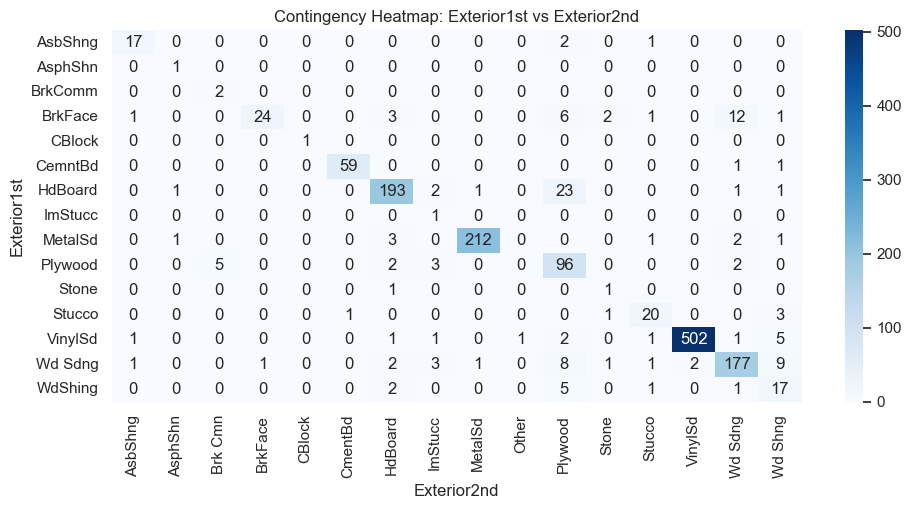

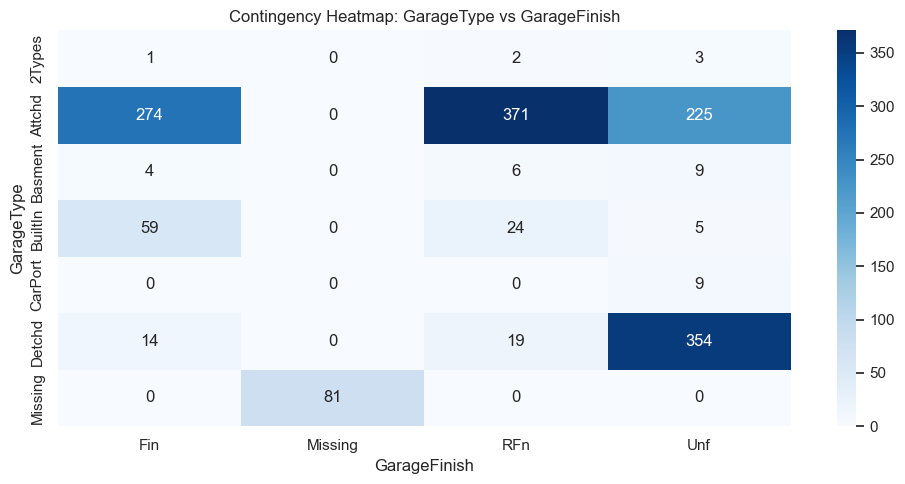

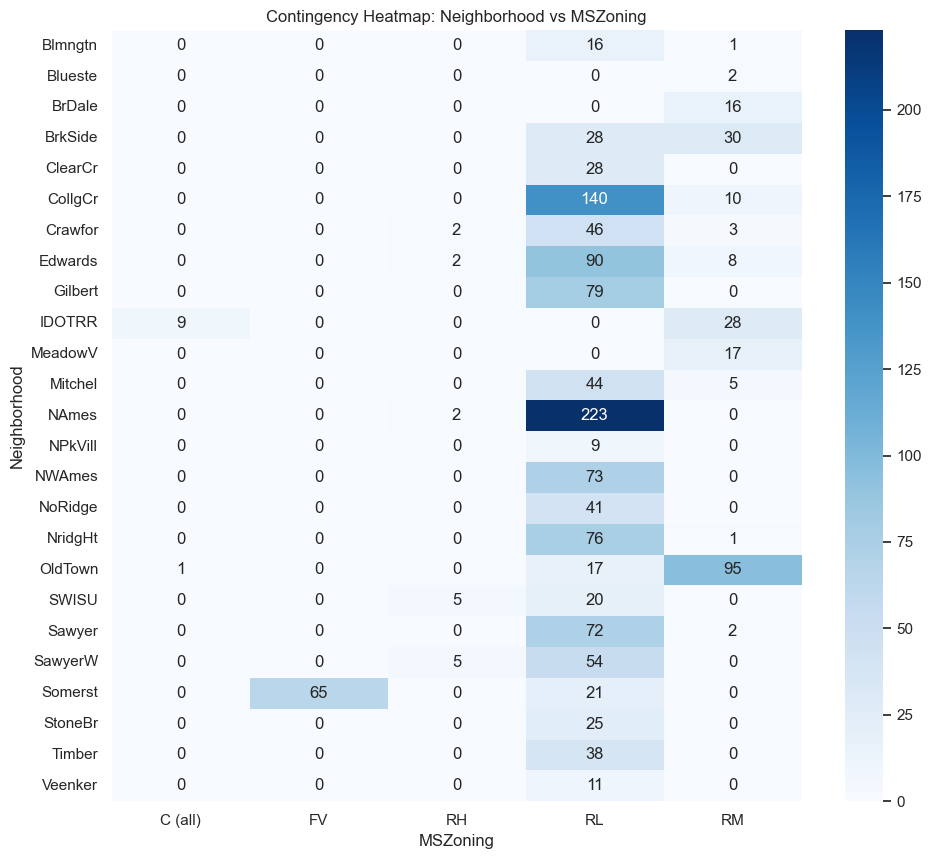

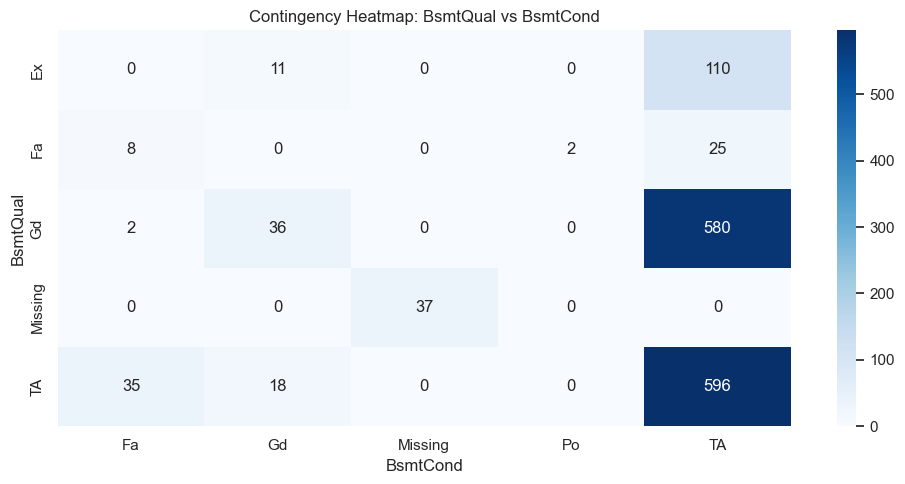

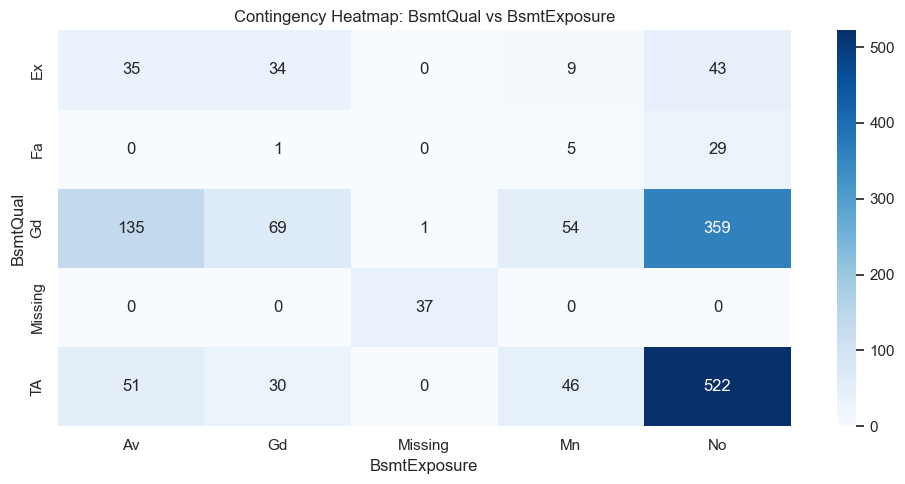

In [144]:
top_categorical_pairs_to_plot = categorical_association_summary.head(5)

for _, row in top_categorical_pairs_to_plot.iterrows():
    f1 = row["feature_1"]
    f2 = row["feature_2"]

    temp = train[[f1, f2]].copy()
    temp[f1] = temp[f1].astype("object").where(temp[f1].notna(), "Missing").astype(str)
    temp[f2] = temp[f2].astype("object").where(temp[f2].notna(), "Missing").astype(str)

    crosstab = pd.crosstab(temp[f1], temp[f2])

    plt.figure(figsize=(10, max(5, 0.35 * crosstab.shape[0])))

    sns.heatmap(
        crosstab,
        annot=True,
        fmt="d",
        cmap="Blues"
    )

    plt.title(f"Contingency Heatmap: {f1} vs {f2}")
    plt.xlabel(f2)
    plt.ylabel(f1)

    plt.tight_layout()
    plt.show()

### Redundancy and Interaction Candidate Summary

This table summarizes pairs that may be useful for redundancy review or interaction feature engineering.

In [145]:
redundancy_interaction_candidates = pd.DataFrame([
    {
        "feature_pair": "GarageCars + GarageArea",
        "reason": "Garage capacity and garage size are related",
        "possible_action": "Keep both; consider GarageAreaPerCar"
    },
    {
        "feature_pair": "GrLivArea + TotRmsAbvGrd",
        "reason": "Living area and room count are related",
        "possible_action": "Keep both; consider RoomsPerLivingArea"
    },
    {
        "feature_pair": "1stFlrSF + TotalBsmtSF",
        "reason": "Basement and first floor size can be structurally related",
        "possible_action": "Keep both; consider TotalSF"
    },
    {
        "feature_pair": "YearBuilt + GarageYrBlt",
        "reason": "Garage year often follows house construction period",
        "possible_action": "Handle missing; consider GarageAge later"
    },
    {
        "feature_pair": "OverallQual + GrLivArea",
        "reason": "Large high-quality homes may have stronger target effect",
        "possible_action": "Consider QualAreaInteraction"
    },
    {
        "feature_pair": "OverallQual + TotalBsmtSF",
        "reason": "Quality and house size can interact",
        "possible_action": "Consider QualTotalSF"
    },
    {
        "feature_pair": "Exterior1st + Exterior2nd",
        "reason": "Primary and secondary exterior materials are related",
        "possible_action": "Review redundancy / combined exterior feature"
    },
    {
        "feature_pair": "GarageType + GarageFinish",
        "reason": "Garage type and finish are related",
        "possible_action": "Keep both initially; validate importance"
    },
    {
        "feature_pair": "BsmtQual + BsmtCond",
        "reason": "Basement quality and condition are related",
        "possible_action": "Consider basement score feature"
    },
    {
        "feature_pair": "SaleType + SaleCondition",
        "reason": "Sale type and sale condition can be related",
        "possible_action": "Keep both; validate with model"
    }
])

display(redundancy_interaction_candidates)

,feature_pair,reason,possible_action
0,GarageCars + GarageArea,Garage capacity and garage size are related,Keep both; consider GarageAreaPerCar
1,GrLivArea + TotRmsAbvGrd,Living area and room count are related,Keep both; consider RoomsPerLivingArea
2,1stFlrSF + TotalBsmtSF,Basement and first floor size can be structura...,Keep both; consider TotalSF
3,YearBuilt + GarageYrBlt,Garage year often follows house construction p...,Handle missing; consider GarageAge later
4,OverallQual + GrLivArea,Large high-quality homes may have stronger tar...,Consider QualAreaInteraction
5,OverallQual + TotalBsmtSF,Quality and house size can interact,Consider QualTotalSF
6,Exterior1st + Exterior2nd,Primary and secondary exterior materials are r...,Review redundancy / combined exterior feature
7,GarageType + GarageFinish,Garage type and finish are related,Keep both initially; validate importance
8,BsmtQual + BsmtCond,Basement quality and condition are related,Consider basement score feature
9,SaleType + SaleCondition,Sale type and sale condition can be related,Keep both; validate with model


### Feature vs Feature / Redundancy Check — Final Notes

- Highly correlated features should not be removed automatically.
- Some correlated pairs may improve prediction when used together.
- Redundancy decisions should be made after model validation.
- Strong feature-feature relationships can guide feature engineering.
- Interaction features should be created later in the feature engineering section.

## 8.10 Bivariate Feature Engineering Candidates

In this section, I summarize possible feature engineering ideas based on bivariate analysis.

No new feature is created here.

The goal is to identify useful candidate features for the later feature engineering section.

Candidate features come from:

- strong feature-target relationships,
- zero vs non-zero target differences,
- count-level target behavior,
- temporal target trends,
- categorical target separation,
- and feature-feature relationships.

### Size / Area Based Feature Candidates

Continuous numeric features show that house size and usable area are important for `SalePrice`.

These features can combine different area components into more meaningful total-size measurements.

In [146]:
size_area_feature_candidates = pd.DataFrame([
    {
        "candidate_feature": "TotalSF",
        "formula": "TotalBsmtSF + 1stFlrSF + 2ndFlrSF",
        "reason": "Combines basement and floor area into total house size.",
        "source_features": "TotalBsmtSF, 1stFlrSF, 2ndFlrSF"
    },
    {
        "candidate_feature": "TotalLivingSF",
        "formula": "GrLivArea + TotalBsmtSF",
        "reason": "Combines above-ground living area with basement size.",
        "source_features": "GrLivArea, TotalBsmtSF"
    },
    {
        "candidate_feature": "TotalFinishedSF",
        "formula": "1stFlrSF + 2ndFlrSF + BsmtFinSF1 + BsmtFinSF2",
        "reason": "Captures finished usable area.",
        "source_features": "1stFlrSF, 2ndFlrSF, BsmtFinSF1, BsmtFinSF2"
    },
    {
        "candidate_feature": "TotalPorchSF",
        "formula": "OpenPorchSF + EnclosedPorch + 3SsnPorch + ScreenPorch",
        "reason": "Combines all porch-related areas.",
        "source_features": "OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch"
    },
    {
        "candidate_feature": "TotalOutdoorSF",
        "formula": "WoodDeckSF + OpenPorchSF + EnclosedPorch + 3SsnPorch + ScreenPorch + PoolArea",
        "reason": "Combines outdoor amenity area.",
        "source_features": "WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea"
    }
])

display(size_area_feature_candidates)

,candidate_feature,formula,reason,source_features
0,TotalSF,TotalBsmtSF + 1stFlrSF + 2ndFlrSF,Combines basement and floor area into total ho...,"TotalBsmtSF, 1stFlrSF, 2ndFlrSF"
1,TotalLivingSF,GrLivArea + TotalBsmtSF,Combines above-ground living area with basemen...,"GrLivArea, TotalBsmtSF"
2,TotalFinishedSF,1stFlrSF + 2ndFlrSF + BsmtFinSF1 + BsmtFinSF2,Captures finished usable area.,"1stFlrSF, 2ndFlrSF, BsmtFinSF1, BsmtFinSF2"
3,TotalPorchSF,OpenPorchSF + EnclosedPorch + 3SsnPorch + Scre...,Combines all porch-related areas.,"OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenP..."
4,TotalOutdoorSF,WoodDeckSF + OpenPorchSF + EnclosedPorch + 3Ss...,Combines outdoor amenity area.,"WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPo..."


### Count and Bathroom Based Feature Candidates

Count numeric analysis shows that bathroom, garage, room, and fireplace counts can be useful.

These candidates combine related count features into more meaningful summary features.

In [147]:
count_feature_candidates = pd.DataFrame([
    {
        "candidate_feature": "TotalBath",
        "formula": "FullBath + 0.5*HalfBath + BsmtFullBath + 0.5*BsmtHalfBath",
        "reason": "Combines all full and half bathrooms into one comfort feature.",
        "source_features": "FullBath, HalfBath, BsmtFullBath, BsmtHalfBath"
    },
    {
        "candidate_feature": "TotalFullBath",
        "formula": "FullBath + BsmtFullBath",
        "reason": "Captures total full bathrooms.",
        "source_features": "FullBath, BsmtFullBath"
    },
    {
        "candidate_feature": "TotalHalfBath",
        "formula": "HalfBath + BsmtHalfBath",
        "reason": "Captures total half bathrooms.",
        "source_features": "HalfBath, BsmtHalfBath"
    },
    {
        "candidate_feature": "BathPerBedroom",
        "formula": "TotalBath / BedroomAbvGr",
        "reason": "Measures bathroom comfort relative to bedroom count.",
        "source_features": "TotalBath, BedroomAbvGr"
    },
    {
        "candidate_feature": "RoomPerBedroom",
        "formula": "TotRmsAbvGrd / BedroomAbvGr",
        "reason": "Measures room layout density.",
        "source_features": "TotRmsAbvGrd, BedroomAbvGr"
    },
    {
        "candidate_feature": "RoomsPerLivingArea",
        "formula": "TotRmsAbvGrd / GrLivArea",
        "reason": "Captures how divided/crowded the living area is.",
        "source_features": "TotRmsAbvGrd, GrLivArea"
    }
])

display(count_feature_candidates)

,candidate_feature,formula,reason,source_features
0,TotalBath,FullBath + 0.5*HalfBath + BsmtFullBath + 0.5*B...,Combines all full and half bathrooms into one ...,"FullBath, HalfBath, BsmtFullBath, BsmtHalfBath"
1,TotalFullBath,FullBath + BsmtFullBath,Captures total full bathrooms.,"FullBath, BsmtFullBath"
2,TotalHalfBath,HalfBath + BsmtHalfBath,Captures total half bathrooms.,"HalfBath, BsmtHalfBath"
3,BathPerBedroom,TotalBath / BedroomAbvGr,Measures bathroom comfort relative to bedroom ...,"TotalBath, BedroomAbvGr"
4,RoomPerBedroom,TotRmsAbvGrd / BedroomAbvGr,Measures room layout density.,"TotRmsAbvGrd, BedroomAbvGr"
5,RoomsPerLivingArea,TotRmsAbvGrd / GrLivArea,Captures how divided/crowded the living area is.,"TotRmsAbvGrd, GrLivArea"


### Presence / Absence Flag Candidates

Zero-heavy and missing-as-absence features may be better represented using binary flags.

These flags capture whether a facility exists or not.

In [148]:
presence_flag_candidates = pd.DataFrame([
    {
        "candidate_feature": "HasGarage",
        "logic": "GarageCars > 0 or GarageArea > 0",
        "reason": "Garage presence shows target difference.",
        "source_features": "GarageCars, GarageArea"
    },
    {
        "candidate_feature": "HasFireplace",
        "logic": "Fireplaces > 0",
        "reason": "Fireplace presence may increase house value.",
        "source_features": "Fireplaces"
    },
    {
        "candidate_feature": "HasBasement",
        "logic": "TotalBsmtSF > 0",
        "reason": "Basement presence may affect value.",
        "source_features": "TotalBsmtSF"
    },
    {
        "candidate_feature": "HasPool",
        "logic": "PoolArea > 0 or PoolQC != Missing",
        "reason": "Pool is rare but may indicate luxury property.",
        "source_features": "PoolArea, PoolQC"
    },
    {
        "candidate_feature": "HasFence",
        "logic": "Fence != Missing",
        "reason": "Fence presence may affect target.",
        "source_features": "Fence"
    },
    {
        "candidate_feature": "HasAlley",
        "logic": "Alley != Missing",
        "reason": "Alley access is rare but may carry location/access signal.",
        "source_features": "Alley"
    },
    {
        "candidate_feature": "HasMasVnr",
        "logic": "MasVnrArea > 0 or MasVnrType != None/Missing",
        "reason": "Masonry veneer presence may relate to exterior quality.",
        "source_features": "MasVnrArea, MasVnrType"
    },
    {
        "candidate_feature": "Has2ndFloor",
        "logic": "2ndFlrSF > 0",
        "reason": "Second floor presence separates house style/size.",
        "source_features": "2ndFlrSF"
    },
    {
        "candidate_feature": "HasWoodDeck",
        "logic": "WoodDeckSF > 0",
        "reason": "Deck presence may capture outdoor amenity.",
        "source_features": "WoodDeckSF"
    },
    {
        "candidate_feature": "HasPorch",
        "logic": "TotalPorchSF > 0",
        "reason": "Porch presence can capture outdoor comfort.",
        "source_features": "OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch"
    },
    {
        "candidate_feature": "HasExtraKitchen",
        "logic": "KitchenAbvGr > 1",
        "reason": "Extra kitchen may indicate multi-family/special property.",
        "source_features": "KitchenAbvGr"
    }
])

display(presence_flag_candidates)

,candidate_feature,logic,reason,source_features
0,HasGarage,GarageCars > 0 or GarageArea > 0,Garage presence shows target difference.,"GarageCars, GarageArea"
1,HasFireplace,Fireplaces > 0,Fireplace presence may increase house value.,Fireplaces
2,HasBasement,TotalBsmtSF > 0,Basement presence may affect value.,TotalBsmtSF
3,HasPool,PoolArea > 0 or PoolQC != Missing,Pool is rare but may indicate luxury property.,"PoolArea, PoolQC"
4,HasFence,Fence != Missing,Fence presence may affect target.,Fence
5,HasAlley,Alley != Missing,Alley access is rare but may carry location/ac...,Alley
6,HasMasVnr,MasVnrArea > 0 or MasVnrType != None/Missing,Masonry veneer presence may relate to exterior...,"MasVnrArea, MasVnrType"
7,Has2ndFloor,2ndFlrSF > 0,Second floor presence separates house style/size.,2ndFlrSF
8,HasWoodDeck,WoodDeckSF > 0,Deck presence may capture outdoor amenity.,WoodDeckSF
9,HasPorch,TotalPorchSF > 0,Porch presence can capture outdoor comfort.,"OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenP..."


### Quality and Interaction Feature Candidates

Bivariate analysis usually shows that quality and size are both important.

Interaction features can capture situations where large high-quality houses have stronger target effect.

In [149]:
quality_interaction_candidates = pd.DataFrame([
    {
        "candidate_feature": "OverallScore",
        "formula": "OverallQual + OverallCond",
        "reason": "Combines overall quality and condition.",
        "source_features": "OverallQual, OverallCond"
    },
    {
        "candidate_feature": "OverallQualCond",
        "formula": "OverallQual * OverallCond",
        "reason": "Captures combined effect of high quality and good condition.",
        "source_features": "OverallQual, OverallCond"
    },
    {
        "candidate_feature": "QualityConditionGap",
        "formula": "OverallQual - OverallCond",
        "reason": "Captures mismatch between quality and current condition.",
        "source_features": "OverallQual, OverallCond"
    },
    {
        "candidate_feature": "QualAreaInteraction",
        "formula": "OverallQual * GrLivArea",
        "reason": "Captures large high-quality houses.",
        "source_features": "OverallQual, GrLivArea"
    },
    {
        "candidate_feature": "QualTotalSF",
        "formula": "OverallQual * TotalSF",
        "reason": "Captures total size combined with quality.",
        "source_features": "OverallQual, TotalSF"
    },
    {
        "candidate_feature": "KitchenScore",
        "formula": "KitchenQual_encoded * KitchenAbvGr",
        "reason": "Combines kitchen quality and kitchen count.",
        "source_features": "KitchenQual, KitchenAbvGr"
    },
    {
        "candidate_feature": "ExteriorScore",
        "formula": "ExterQual_encoded + ExterCond_encoded",
        "reason": "Combines exterior quality and condition.",
        "source_features": "ExterQual, ExterCond"
    },
    {
        "candidate_feature": "GarageScore",
        "formula": "GarageCars * GarageArea",
        "reason": "Combines garage capacity and size.",
        "source_features": "GarageCars, GarageArea"
    },
    {
        "candidate_feature": "BasementScore",
        "formula": "BsmtQual_encoded + BsmtCond_encoded + BsmtExposure_encoded",
        "reason": "Combines basement quality, condition, and exposure.",
        "source_features": "BsmtQual, BsmtCond, BsmtExposure"
    }
])

display(quality_interaction_candidates)

,candidate_feature,formula,reason,source_features
0,OverallScore,OverallQual + OverallCond,Combines overall quality and condition.,"OverallQual, OverallCond"
1,OverallQualCond,OverallQual * OverallCond,Captures combined effect of high quality and g...,"OverallQual, OverallCond"
2,QualityConditionGap,OverallQual - OverallCond,Captures mismatch between quality and current ...,"OverallQual, OverallCond"
3,QualAreaInteraction,OverallQual * GrLivArea,Captures large high-quality houses.,"OverallQual, GrLivArea"
4,QualTotalSF,OverallQual * TotalSF,Captures total size combined with quality.,"OverallQual, TotalSF"
5,KitchenScore,KitchenQual_encoded * KitchenAbvGr,Combines kitchen quality and kitchen count.,"KitchenQual, KitchenAbvGr"
6,ExteriorScore,ExterQual_encoded + ExterCond_encoded,Combines exterior quality and condition.,"ExterQual, ExterCond"
7,GarageScore,GarageCars * GarageArea,Combines garage capacity and size.,"GarageCars, GarageArea"
8,BasementScore,BsmtQual_encoded + BsmtCond_encoded + BsmtExpo...,"Combines basement quality, condition, and expo...","BsmtQual, BsmtCond, BsmtExposure"


### Ratio Feature Candidates

Ratio features can capture relative size, density, and comfort.

These features should be created carefully to avoid division by zero.

In [150]:
ratio_feature_candidates = pd.DataFrame([
    {
        "candidate_feature": "LivingAreaRatio",
        "formula": "GrLivArea / LotArea",
        "reason": "Measures how much of the land is used as living area.",
        "source_features": "GrLivArea, LotArea"
    },
    {
        "candidate_feature": "GarageAreaRatio",
        "formula": "GarageArea / GrLivArea",
        "reason": "Measures garage size relative to living area.",
        "source_features": "GarageArea, GrLivArea"
    },
    {
        "candidate_feature": "BasementRatio",
        "formula": "TotalBsmtSF / TotalSF",
        "reason": "Measures basement share of total area.",
        "source_features": "TotalBsmtSF, TotalSF"
    },
    {
        "candidate_feature": "FinishedBsmtRatio",
        "formula": "(BsmtFinSF1 + BsmtFinSF2) / TotalBsmtSF",
        "reason": "Measures how much basement area is finished.",
        "source_features": "BsmtFinSF1, BsmtFinSF2, TotalBsmtSF"
    },
    {
        "candidate_feature": "PorchRatio",
        "formula": "TotalPorchSF / GrLivArea",
        "reason": "Measures porch area relative to living area.",
        "source_features": "TotalPorchSF, GrLivArea"
    },
    {
        "candidate_feature": "GarageAreaPerCar",
        "formula": "GarageArea / GarageCars",
        "reason": "Measures average garage area per car capacity.",
        "source_features": "GarageArea, GarageCars"
    }
])

display(ratio_feature_candidates)

,candidate_feature,formula,reason,source_features
0,LivingAreaRatio,GrLivArea / LotArea,Measures how much of the land is used as livin...,"GrLivArea, LotArea"
1,GarageAreaRatio,GarageArea / GrLivArea,Measures garage size relative to living area.,"GarageArea, GrLivArea"
2,BasementRatio,TotalBsmtSF / TotalSF,Measures basement share of total area.,"TotalBsmtSF, TotalSF"
3,FinishedBsmtRatio,(BsmtFinSF1 + BsmtFinSF2) / TotalBsmtSF,Measures how much basement area is finished.,"BsmtFinSF1, BsmtFinSF2, TotalBsmtSF"
4,PorchRatio,TotalPorchSF / GrLivArea,Measures porch area relative to living area.,"TotalPorchSF, GrLivArea"
5,GarageAreaPerCar,GarageArea / GarageCars,Measures average garage area per car capacity.,"GarageArea, GarageCars"


### Temporal Feature Candidates

Temporal bivariate analysis can suggest age-based and season-based features.

These are usually more meaningful than raw year values.

In [151]:
temporal_feature_candidates = pd.DataFrame([
    {
        "candidate_feature": "HouseAge",
        "formula": "YrSold - YearBuilt",
        "reason": "Captures house age at sale time.",
        "source_features": "YrSold, YearBuilt"
    },
    {
        "candidate_feature": "RemodAge",
        "formula": "YrSold - YearRemodAdd",
        "reason": "Captures how recent the remodel/addition was.",
        "source_features": "YrSold, YearRemodAdd"
    },
    {
        "candidate_feature": "GarageAge",
        "formula": "YrSold - GarageYrBlt",
        "reason": "Captures garage age at sale time.",
        "source_features": "YrSold, GarageYrBlt"
    },
    {
        "candidate_feature": "IsRemodeled",
        "logic": "YearRemodAdd != YearBuilt",
        "reason": "Captures whether house was remodeled.",
        "source_features": "YearRemodAdd, YearBuilt"
    },
    {
        "candidate_feature": "IsNewHouse",
        "logic": "YrSold == YearBuilt",
        "reason": "Captures newly built houses.",
        "source_features": "YrSold, YearBuilt"
    },
    {
        "candidate_feature": "SoldSeason",
        "logic": "Season derived from MoSold",
        "reason": "Captures seasonal sale pattern.",
        "source_features": "MoSold"
    },
    {
        "candidate_feature": "MoSold_sin",
        "formula": "sin(2*pi*MoSold/12)",
        "reason": "Cyclic month encoding.",
        "source_features": "MoSold"
    },
    {
        "candidate_feature": "MoSold_cos",
        "formula": "cos(2*pi*MoSold/12)",
        "reason": "Cyclic month encoding.",
        "source_features": "MoSold"
    }
])

display(temporal_feature_candidates)

,candidate_feature,formula,reason,source_features,logic
0,HouseAge,YrSold - YearBuilt,Captures house age at sale time.,"YrSold, YearBuilt",NaN
1,RemodAge,YrSold - YearRemodAdd,Captures how recent the remodel/addition was.,"YrSold, YearRemodAdd",NaN
2,GarageAge,YrSold - GarageYrBlt,Captures garage age at sale time.,"YrSold, GarageYrBlt",NaN
3,IsRemodeled,NaN,Captures whether house was remodeled.,"YearRemodAdd, YearBuilt",YearRemodAdd != YearBuilt
4,IsNewHouse,NaN,Captures newly built houses.,"YrSold, YearBuilt",YrSold == YearBuilt
5,SoldSeason,NaN,Captures seasonal sale pattern.,MoSold,Season derived from MoSold
6,MoSold_sin,sin(2*pi*MoSold/12),Cyclic month encoding.,MoSold,NaN
7,MoSold_cos,cos(2*pi*MoSold/12),Cyclic month encoding.,MoSold,NaN


### Categorical Encoding and Grouping Candidates

Categorical bivariate analysis can suggest encoding and rare category grouping strategies.

These decisions should be finalized during preprocessing and validated with model performance.

In [152]:
categorical_encoding_candidates = pd.DataFrame([
    {
        "candidate_action": "Rare category grouping",
        "features": "Condition2, RoofMatl, Heating, SaleType, Exterior1st, Exterior2nd",
        "reason": "These features contain rare categories that may create sparse encoded columns."
    },
    {
        "candidate_action": "Careful encoding for high-cardinality features",
        "features": "Neighborhood, Exterior1st, Exterior2nd, MSSubClass",
        "reason": "These features have many categories and strong category-level differences."
    },
    {
        "candidate_action": "Ordinal encoding",
        "features": "ExterQual, KitchenQual, BsmtQual, GarageFinish, FireplaceQu, HeatingQC",
        "reason": "These features have meaningful order."
    },
    {
        "candidate_action": "Missing-as-absence category",
        "features": "Alley, GarageType, PoolQC, Fence, FireplaceQu, BsmtQual, GarageQual",
        "reason": "Missing values often represent absence of a facility."
    },
    {
        "candidate_action": "Binary encoding",
        "features": "Street, CentralAir",
        "reason": "These are binary categorical features."
    }
])

display(categorical_encoding_candidates)

,candidate_action,features,reason
0,Rare category grouping,"Condition2, RoofMatl, Heating, SaleType, Exter...",These features contain rare categories that ma...
1,Careful encoding for high-cardinality features,"Neighborhood, Exterior1st, Exterior2nd, MSSubC...",These features have many categories and strong...
2,Ordinal encoding,"ExterQual, KitchenQual, BsmtQual, GarageFinish...",These features have meaningful order.
3,Missing-as-absence category,"Alley, GarageType, PoolQC, Fence, FireplaceQu,...",Missing values often represent absence of a fa...
4,Binary encoding,"Street, CentralAir",These are binary categorical features.


### Master Feature Engineering Candidate Table

This table combines all candidate ideas into one place.

No candidate is automatically accepted.  
Each candidate should be validated during modeling.

In [153]:
def standardize_candidate_table(df, candidate_type):
    temp = df.copy()

    if "candidate_feature" not in temp.columns:
        temp["candidate_feature"] = temp.get("candidate_action", "Action")

    if "formula" not in temp.columns:
        temp["formula"] = temp.get("logic", "")

    if "logic" not in temp.columns:
        temp["logic"] = temp.get("formula", "")

    if "source_features" not in temp.columns:
        temp["source_features"] = temp.get("features", "")

    temp["candidate_type"] = candidate_type

    return temp[
        [
            "candidate_type",
            "candidate_feature",
            "formula",
            "logic",
            "reason",
            "source_features"
        ]
    ]


master_feature_engineering_candidates = pd.concat(
    [
        standardize_candidate_table(size_area_feature_candidates, "Size/Area"),
        standardize_candidate_table(count_feature_candidates, "Count/Bath"),
        standardize_candidate_table(presence_flag_candidates, "Presence Flag"),
        standardize_candidate_table(quality_interaction_candidates, "Quality/Interaction"),
        standardize_candidate_table(ratio_feature_candidates, "Ratio"),
        standardize_candidate_table(temporal_feature_candidates, "Temporal"),
        standardize_candidate_table(categorical_encoding_candidates, "Categorical Encoding")
    ],
    ignore_index=True
)

display(master_feature_engineering_candidates)

,candidate_type,candidate_feature,formula,logic,reason,source_features
0,Size/Area,TotalSF,TotalBsmtSF + 1stFlrSF + 2ndFlrSF,TotalBsmtSF + 1stFlrSF + 2ndFlrSF,Combines basement and floor area into total ho...,"TotalBsmtSF, 1stFlrSF, 2ndFlrSF"
1,Size/Area,TotalLivingSF,GrLivArea + TotalBsmtSF,GrLivArea + TotalBsmtSF,Combines above-ground living area with basemen...,"GrLivArea, TotalBsmtSF"
2,Size/Area,TotalFinishedSF,1stFlrSF + 2ndFlrSF + BsmtFinSF1 + BsmtFinSF2,1stFlrSF + 2ndFlrSF + BsmtFinSF1 + BsmtFinSF2,Captures finished usable area.,"1stFlrSF, 2ndFlrSF, BsmtFinSF1, BsmtFinSF2"
3,Size/Area,TotalPorchSF,OpenPorchSF + EnclosedPorch + 3SsnPorch + Scre...,OpenPorchSF + EnclosedPorch + 3SsnPorch + Scre...,Combines all porch-related areas.,"OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenP..."
4,Size/Area,TotalOutdoorSF,WoodDeckSF + OpenPorchSF + EnclosedPorch + 3Ss...,WoodDeckSF + OpenPorchSF + EnclosedPorch + 3Ss...,Combines outdoor amenity area.,"WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPo..."
5,Count/Bath,TotalBath,FullBath + 0.5*HalfBath + BsmtFullBath + 0.5*B...,FullBath + 0.5*HalfBath + BsmtFullBath + 0.5*B...,Combines all full and half bathrooms into one ...,"FullBath, HalfBath, BsmtFullBath, BsmtHalfBath"
6,Count/Bath,TotalFullBath,FullBath + BsmtFullBath,FullBath + BsmtFullBath,Captures total full bathrooms.,"FullBath, BsmtFullBath"
7,Count/Bath,TotalHalfBath,HalfBath + BsmtHalfBath,HalfBath + BsmtHalfBath,Captures total half bathrooms.,"HalfBath, BsmtHalfBath"
8,Count/Bath,BathPerBedroom,TotalBath / BedroomAbvGr,TotalBath / BedroomAbvGr,Measures bathroom comfort relative to bedroom ...,"TotalBath, BedroomAbvGr"
9,Count/Bath,RoomPerBedroom,TotRmsAbvGrd / BedroomAbvGr,TotRmsAbvGrd / BedroomAbvGr,Measures room layout density.,"TotRmsAbvGrd, BedroomAbvGr"


### Candidate Priority Table

This table gives an initial priority level.

Priority is based on EDA evidence and domain logic.  
Final selection should be done using cross-validation.

In [154]:
candidate_priority = pd.DataFrame([
    {
        "priority": "High",
        "candidates": "TotalSF, TotalBath, HouseAge, HasGarage, HasFireplace, QualAreaInteraction, OverallQualCond",
        "reason": "Strong domain logic and likely target signal."
    },
    {
        "priority": "Medium",
        "candidates": "TotalPorchSF, HasMasVnr, Has2ndFloor, RemodAge, GarageAge, BasementScore, GarageScore",
        "reason": "Useful but should be validated."
    },
    {
        "priority": "Experimental",
        "candidates": "LivingAreaRatio, PorchRatio, RoomsPerLivingArea, SoldSeason, MoSold_sin/cos, rare category grouping",
        "reason": "May help some models but needs validation."
    }
])

display(candidate_priority)

,priority,candidates,reason
0,High,"TotalSF, TotalBath, HouseAge, HasGarage, HasFi...",Strong domain logic and likely target signal.
1,Medium,"TotalPorchSF, HasMasVnr, Has2ndFloor, RemodAge...",Useful but should be validated.
2,Experimental,"LivingAreaRatio, PorchRatio, RoomsPerLivingAre...",May help some models but needs validation.


### Bivariate Feature Engineering Candidate — Final Notes

- These are candidate ideas only.
- No feature is created in this section.
- High-priority candidates should be tested first.
- Ratio features must handle division by zero.
- Missing-as-absence flags should be aligned with preprocessing.
- Final feature selection should be based on cross-validation, not only EDA.

## 9. Multivariate Analysis

In this section, I perform a basic multivariate analysis.

The goal is not to analyze every possible feature combination.  
Instead, I focus only on important feature groups and selected relationships that may help feature engineering and modeling.

Main focus:

- important numeric feature relationships
- feature redundancy
- quality-size interaction
- location-quality-price pattern
- garage/basement/overall quality combined behavior

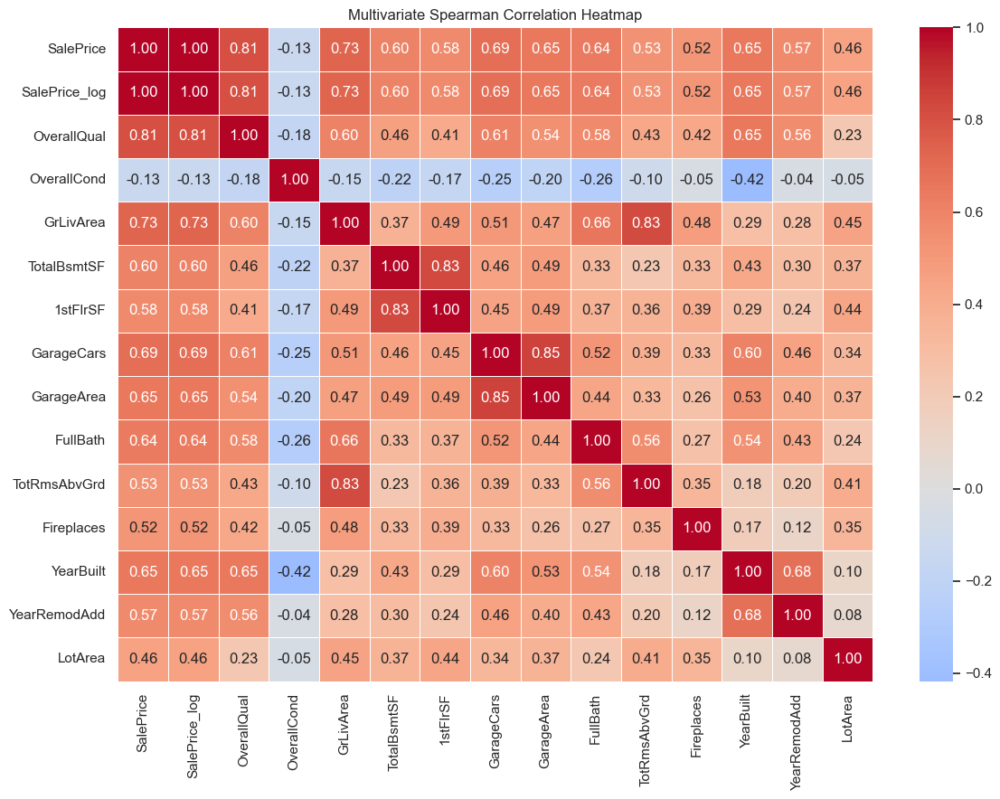

In [155]:
important_numeric_for_multivariate = [
    "SalePrice",
    "SalePrice_log",
    "OverallQual",
    "OverallCond",
    "GrLivArea",
    "TotalBsmtSF",
    "1stFlrSF",
    "GarageCars",
    "GarageArea",
    "FullBath",
    "TotRmsAbvGrd",
    "Fireplaces",
    "YearBuilt",
    "YearRemodAdd",
    "LotArea"
]

important_numeric_for_multivariate = [
    feature for feature in important_numeric_for_multivariate
    if feature in train.columns
]

corr_matrix = train[important_numeric_for_multivariate].corr(method="spearman")

plt.figure(figsize=(12, 9))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)

plt.title("Multivariate Spearman Correlation Heatmap")
plt.tight_layout()
plt.show()

In [156]:
def top_correlation_pairs(corr_matrix, threshold=0.60):
    pairs = []

    columns = corr_matrix.columns

    for i in range(len(columns)):
        for j in range(i + 1, len(columns)):
            feature_1 = columns[i]
            feature_2 = columns[j]
            corr_value = corr_matrix.loc[feature_1, feature_2]

            if abs(corr_value) >= threshold:
                pairs.append({
                    "feature_1": feature_1,
                    "feature_2": feature_2,
                    "spearman_corr": corr_value,
                    "abs_corr": abs(corr_value)
                })

    return (
        pd.DataFrame(pairs)
        .sort_values(by="abs_corr", ascending=False)
        .reset_index(drop=True)
    )


top_numeric_pairs = top_correlation_pairs(
    corr_matrix,
    threshold=0.60
)

display(top_numeric_pairs.round(4))

,feature_1,feature_2,spearman_corr,abs_corr
0,SalePrice,SalePrice_log,1.0000,1.0000
1,GarageCars,GarageArea,0.8533,0.8533
2,TotalBsmtSF,1stFlrSF,0.8293,0.8293
3,GrLivArea,TotRmsAbvGrd,0.8279,0.8279
4,SalePrice_log,OverallQual,0.8098,0.8098
5,SalePrice,OverallQual,0.8098,0.8098
6,SalePrice,GrLivArea,0.7313,0.7313
7,SalePrice_log,GrLivArea,0.7313,0.7313
8,SalePrice,GarageCars,0.6907,0.6907
9,SalePrice_log,GarageCars,0.6907,0.6907


### Numeric Correlation Note

Highly correlated features are not removed automatically.  
They are reviewed for redundancy and feature engineering.

Examples:
- `GarageCars` and `GarageArea`
- `GrLivArea` and `TotRmsAbvGrd`
- `YearBuilt` and `YearRemodAdd`
- `TotalBsmtSF` and `1stFlrSF`

### Quality and Size Interaction

`OverallQual` and `GrLivArea` are both strong predictors.  
This plot checks how house size and quality together relate to `SalePrice`.

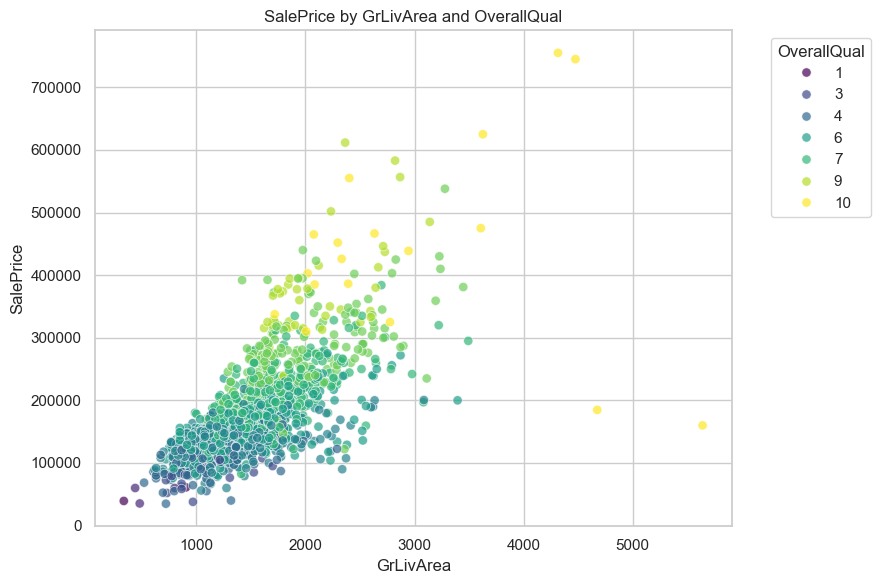

In [157]:
plt.figure(figsize=(9, 6))

sns.scatterplot(
    data=train,
    x="GrLivArea",
    y="SalePrice",
    hue="OverallQual",
    palette="viridis",
    alpha=0.7,
    s=45
)

plt.title("SalePrice by GrLivArea and OverallQual")
plt.xlabel("GrLivArea")
plt.ylabel("SalePrice")
plt.legend(title="OverallQual", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.show()

In [158]:
quality_size_summary = (
    train
    .groupby("OverallQual")
    .agg(
        sample_count=("SalePrice", "count"),
        median_grlivarea=("GrLivArea", "median"),
        median_saleprice=("SalePrice", "median")
    )
    .reset_index()
)

display(quality_size_summary.round(2))

,OverallQual,sample_count,median_grlivarea,median_saleprice
0,1,2,619.0000,50150.0000
1,2,3,480.0000,60000.0000
2,3,20,1040.0000,86250.0000
3,4,116,1051.5000,108000.0000
4,5,397,1144.0000,133000.0000
5,6,374,1440.5000,160000.0000
6,7,319,1656.0000,200141.0000
7,8,168,1813.5000,269750.0000
8,9,43,1922.0000,345000.0000
9,10,18,2517.5000,432390.0000


### Decision

- Large living area generally increases price.
- Higher quality levels usually lift the price further.
- `OverallQual * GrLivArea` can be tested later as an interaction feature.

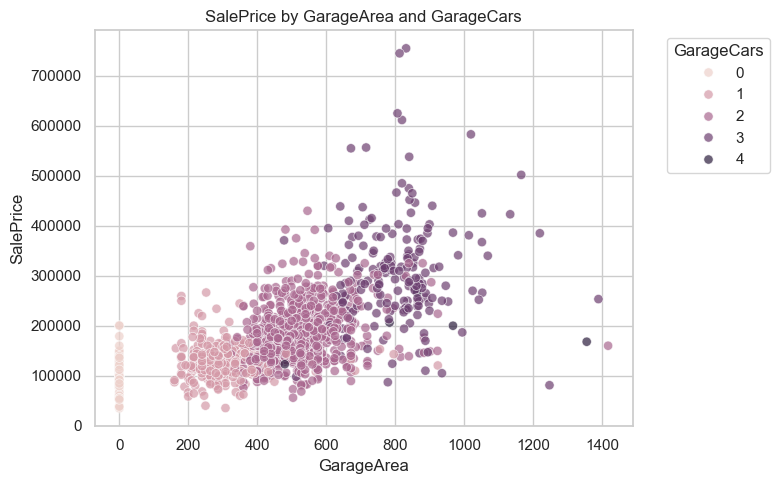

In [159]:
plt.figure(figsize=(8, 5))

sns.scatterplot(
    data=train,
    x="GarageArea",
    y="SalePrice",
    hue="GarageCars",
    alpha=0.7,
    s=45
)

plt.title("SalePrice by GarageArea and GarageCars")
plt.xlabel("GarageArea")
plt.ylabel("SalePrice")
plt.legend(title="GarageCars", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.show()


In [160]:
garage_multivariate_summary = (
    train
    .groupby("GarageCars")
    .agg(
        sample_count=("SalePrice", "count"),
        median_garage_area=("GarageArea", "median"),
        median_saleprice=("SalePrice", "median")
    )
    .reset_index()
)

display(garage_multivariate_summary.round(2))

,GarageCars,sample_count,median_garage_area,median_saleprice
0,0,81,0.0000,100000.0000
1,1,369,288.0000,128000.0000
2,2,824,506.0000,177750.0000
3,3,181,818.0000,295000.0000
4,4,5,864.0000,200000.0000


### Decision

- `GarageCars` and `GarageArea` are related.
- Both can still be useful.
- Later feature engineering can test `GarageAreaPerCar` and `HasGarage`.

### Basement and First Floor Relationship

This checks whether basement size and first floor size together explain house size/value.

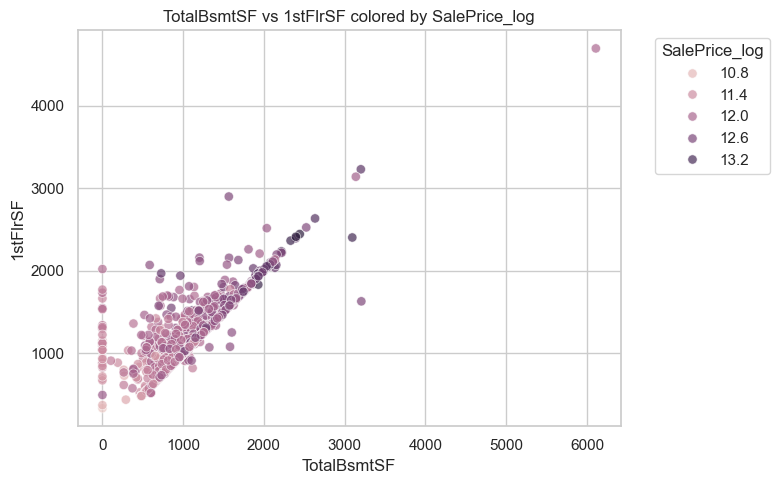

In [161]:
plt.figure(figsize=(8, 5))

sns.scatterplot(
    data=train,
    x="TotalBsmtSF",
    y="1stFlrSF",
    hue="SalePrice_log",
    alpha=0.7,
    s=45
)

plt.title("TotalBsmtSF vs 1stFlrSF colored by SalePrice_log")
plt.xlabel("TotalBsmtSF")
plt.ylabel("1stFlrSF")
plt.legend(title="SalePrice_log", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.show()

### Decision

- Basement size and first floor size are related.
- Combined area features such as `TotalSF` can be useful.

### Neighborhood and Overall Quality Pattern

This checks whether neighborhoods differ in quality and price level.

In [162]:
neighborhood_quality_summary = (
    train
    .groupby("Neighborhood")
    .agg(
        sample_count=("SalePrice", "count"),
        median_overallqual=("OverallQual", "median"),
        median_saleprice=("SalePrice", "median")
    )
    .reset_index()
    .sort_values(by="median_saleprice", ascending=False)
)

display(neighborhood_quality_summary.round(2))

,Neighborhood,sample_count,median_overallqual,median_saleprice
16,NridgHt,77,8.0000,315000.0000
15,NoRidge,41,8.0000,301500.0000
22,StoneBr,25,8.0000,278000.0000
23,Timber,38,7.5000,228475.0000
21,Somerst,86,7.0000,225500.0000
24,Veenker,11,6.0000,218000.0000
6,Crawfor,51,6.0000,200624.0000
4,ClearCr,28,6.0000,200250.0000
5,CollgCr,150,7.0000,197200.0000
0,Blmngtn,17,7.0000,191000.0000


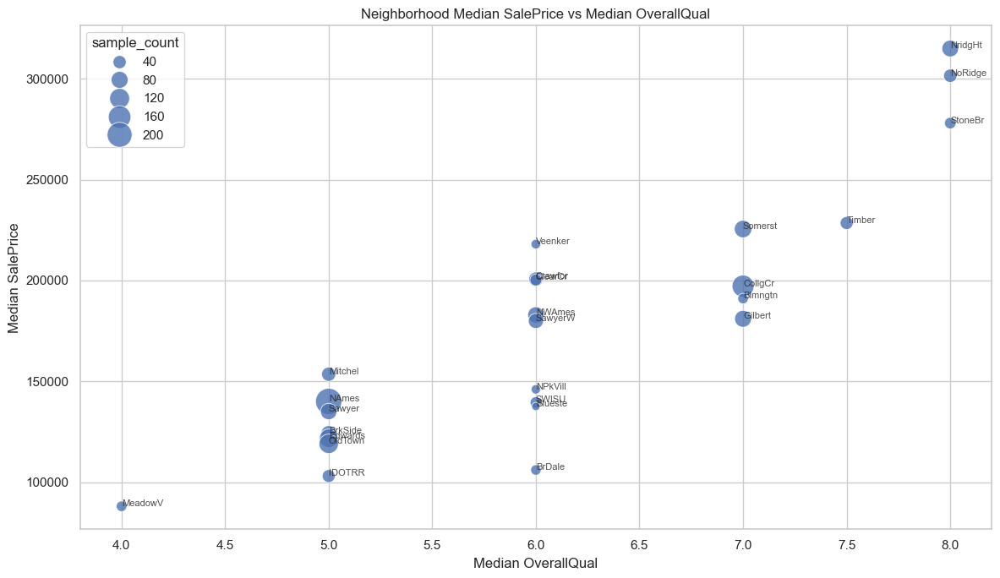

In [163]:
plt.figure(figsize=(12, 7))

sns.scatterplot(
    data=neighborhood_quality_summary,
    x="median_overallqual",
    y="median_saleprice",
    size="sample_count",
    sizes=(50, 500),
    alpha=0.8
)

for _, row in neighborhood_quality_summary.iterrows():
    plt.text(
        row["median_overallqual"],
        row["median_saleprice"],
        row["Neighborhood"],
        fontsize=8,
        alpha=0.8
    )

plt.title("Neighborhood Median SalePrice vs Median OverallQual")
plt.xlabel("Median OverallQual")
plt.ylabel("Median SalePrice")

plt.tight_layout()
plt.show()

### Decision

- Neighborhood captures location-level price differences.
- Some neighborhoods also have higher quality houses.
- `Neighborhood` should be encoded carefully.